In [2]:
"""Jupyter Notebook for relaxation time analysis"""
#The main analysis parts adapted from script by  H. Antila, with help from S. Ollila and T. Ferreira
#saved in relaxation_times.py
# Last modified by R. Nencini, 19.10.2021
import yaml
import sys
import numpy as np
from scipy import optimize
sys.path.insert(1, '/home/ricky/Documents/from_work/git/NMR_FF_tools/relaxation_times/')
sys.path.insert(1, '/home/nenciric/Documents/git/NMR_FF_tools/relaxation_times/')

import relaxation_times as rt
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import os
#from numba import jit #

#gyromagnetic ratios for further developmant
# !!! NOTICE!!!
#values taken from matlab code and projecct work and slightly different than those in Wikipedia
#these values are also in the external file --> if change is needed; has to be changed there
#values here in jupyter just for the information and verify, why they are different
#!!! NOTICE END !!!
gammaD=41.695*10**6; #r*s^(-1)*T^(-1)
gammaH=267.513*10**6;
gammaC=67.262*10**6;
gammaN=-27.166*10**6;

In [186]:
def PlotTimescales(Ctimes,merge,name,title="Title",xlabel="xlabel"):
    working_Ctimes=np.copy(Ctimes)
    plt.rcParams["figure.figsize"] = [15.00, 7]
    plt.rcParams["figure.autolayout"] = True
    plt.rcParams.update({'font.size': 20})


    fig, (ax1, ax2) = plt.subplots(2)

    ax1.title.set_text(title)
    ax1.set_ylim(Ctimes[0,0]/10,Ctimes[-1,0]*10)

    ax1.grid()
    ax1.set_yscale('log')
    ax1.set_ylabel("Timescale [s]")
    ax1.set_xlabel(xlabel)
    #ax1.set_ylim([10**(-12.4), 10**(-6.8)])

    """Plot the timescales, user specifies the merge to be used.
    The merge works as follow: The code finds the first timescale with
    weight bigger bigger than 0 and merges with 'merge' subsequent timescales.
    The final result is plotted as a weighted average of the merged points."""
    
    for residue in range(1,working_Ctimes.shape[1]):
        timescale=0
        while timescale < working_Ctimes.shape[0]:
            #print("{} {} \n".format(i, j))
            if working_Ctimes[timescale,residue]>0:
                time_to_plot=working_Ctimes[timescale,0]
                if merge>1:
                    time_to_plot=0
                    total_weight=0
                    for i in range(0,merge):
                        try:
                            time_to_plot+=working_Ctimes[timescale,0]*working_Ctimes[timescale,residue]
                            total_weight+=working_Ctimes[timescale,residue]
                        except:
                            pass
                    time_to_plot/=total_weight
                                                       
                        
                if time_to_plot>10**(-9):
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
                    
                elif time_to_plot>10**(-11):
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
                else:
                    ax1.plot(residue, time_to_plot, marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                timescale+=merge-1
            timescale+=1
       
    

    ax2.grid()
    ax2.set_ylim(0,1)
    ax2.set_ylabel("Coefficient's weights")
    ax2.set_xlabel(xlabel)


    for residue in range(1,working_Ctimes.shape[1]):
        timescale=0
        while timescale < working_Ctimes.shape[0]:
            #print("{} {} \n".format(i, j))
            if working_Ctimes[timescale,residue]>0:
                if merge>1:
                    time_to_plot=0
                    total_weight=0
                    for i in range(1,merge):
                        try:
                            total_weight+=working_Ctimes[timescale,residue]
                            time_to_plot+=working_Ctimes[timescale,0]*working_Ctimes[timescale,residue]
                            working_Ctimes[timescale,residue]+=working_Ctimes[timescale+i,residue]
                            
                        except:
                            pass
                    time_to_plot/=total_weight
                    
                if time_to_plot>10**(-9):
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
                elif time_to_plot>10**(-11):
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
                else:
                    ax2.plot(residue, working_Ctimes[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                timescale+=merge-1
            timescale+=1

     
    plt.savefig("../figure_time_scales_protein/merging/"+name+"_"+str(merge)+".png")
    plt.show()   

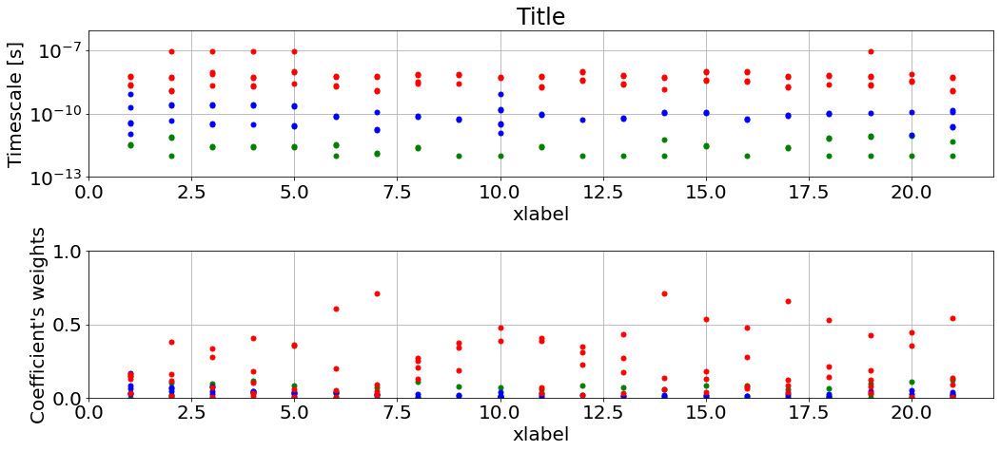

In [129]:
#Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_030822_alpha.out")
PlotTimescales(eElab_time,1)

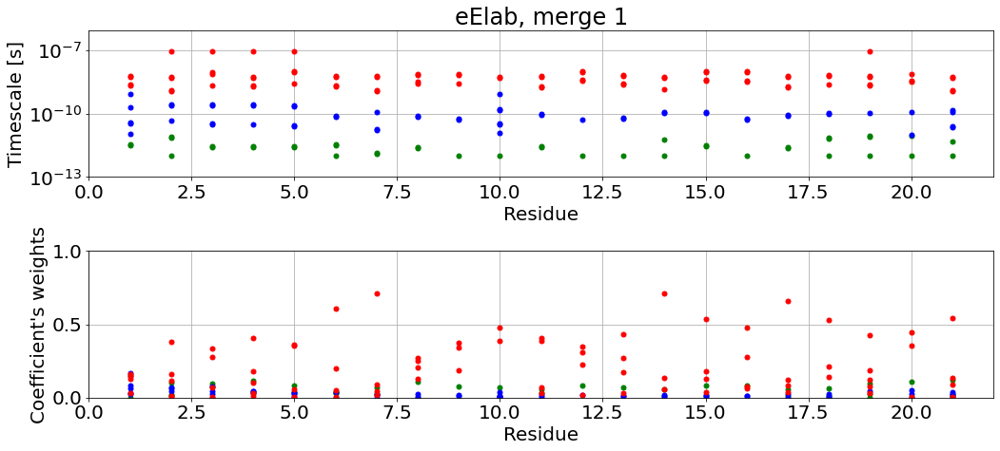

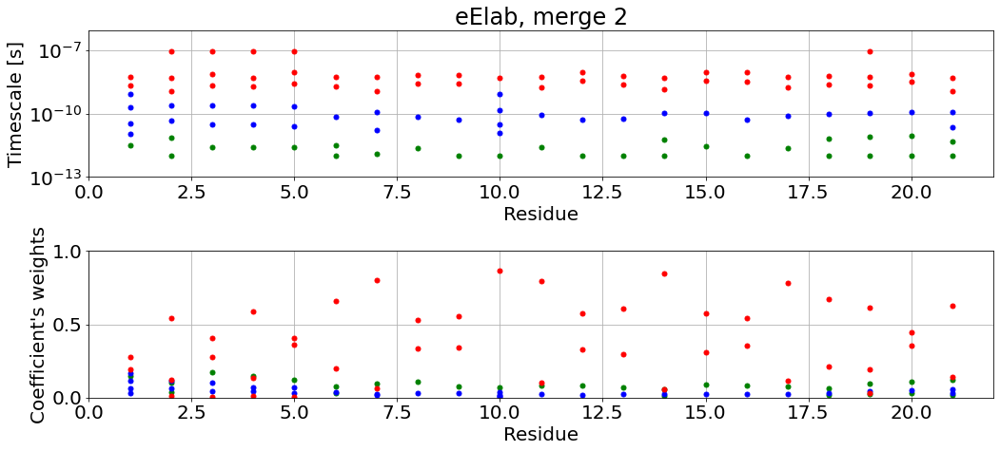

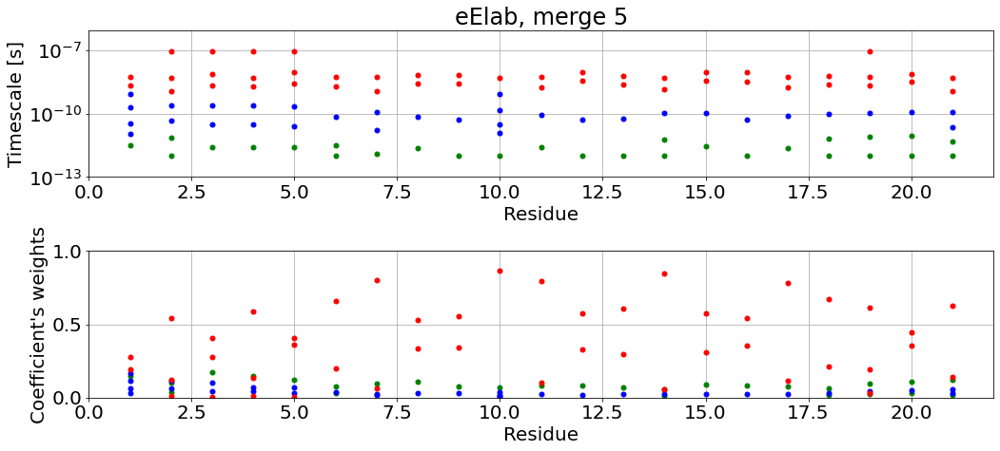

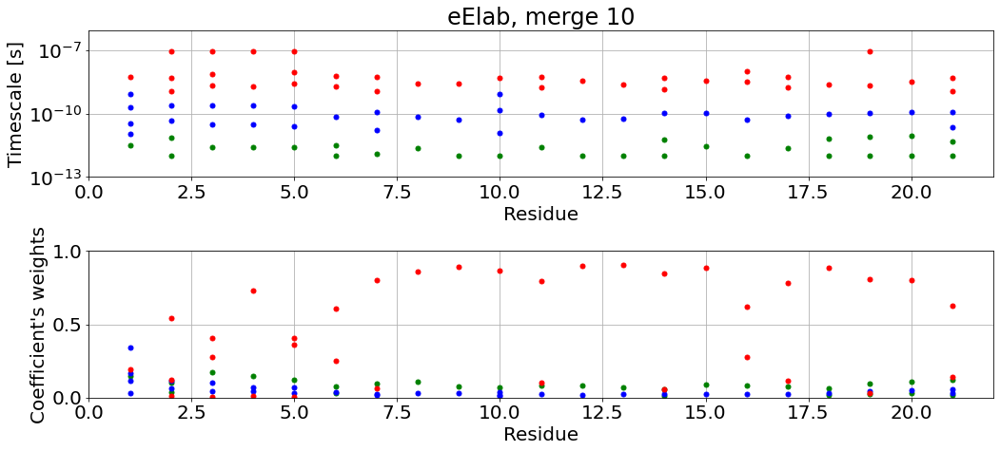

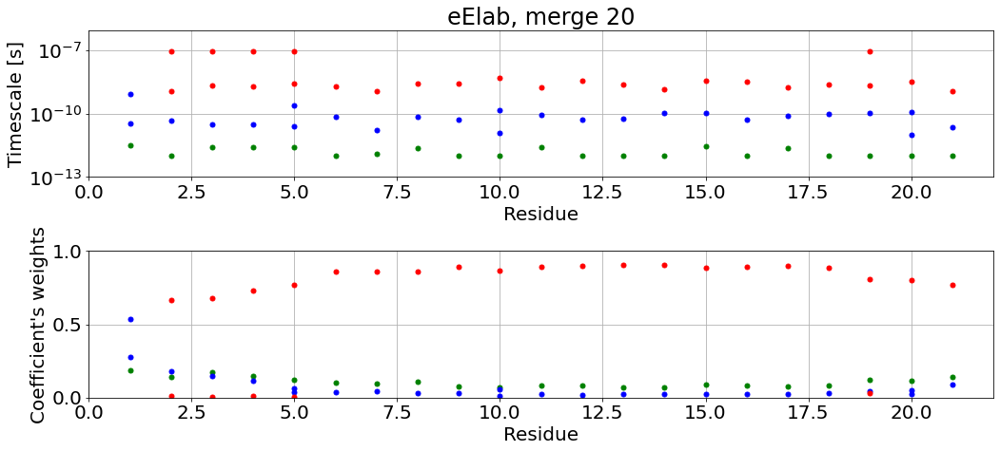

...

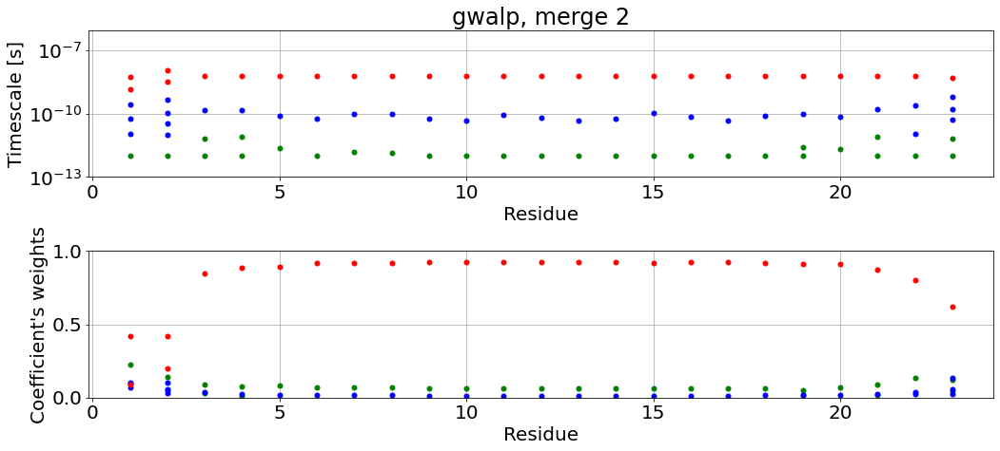

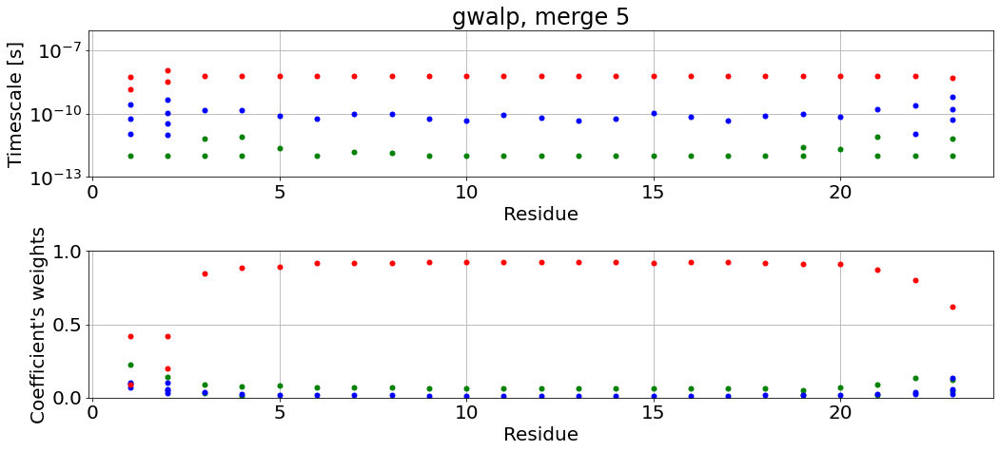

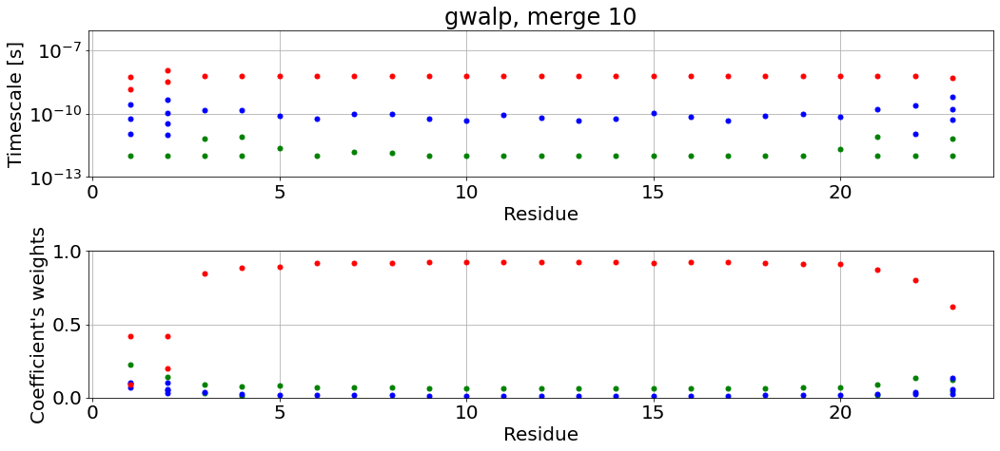

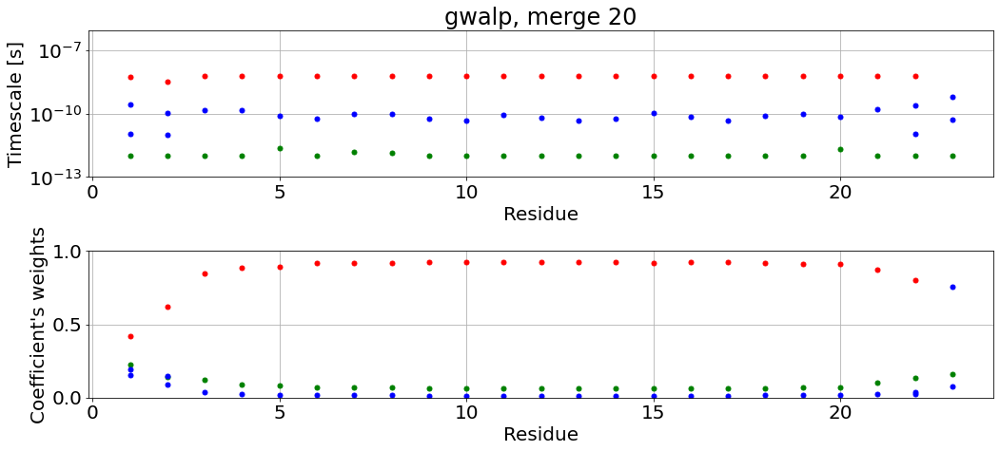

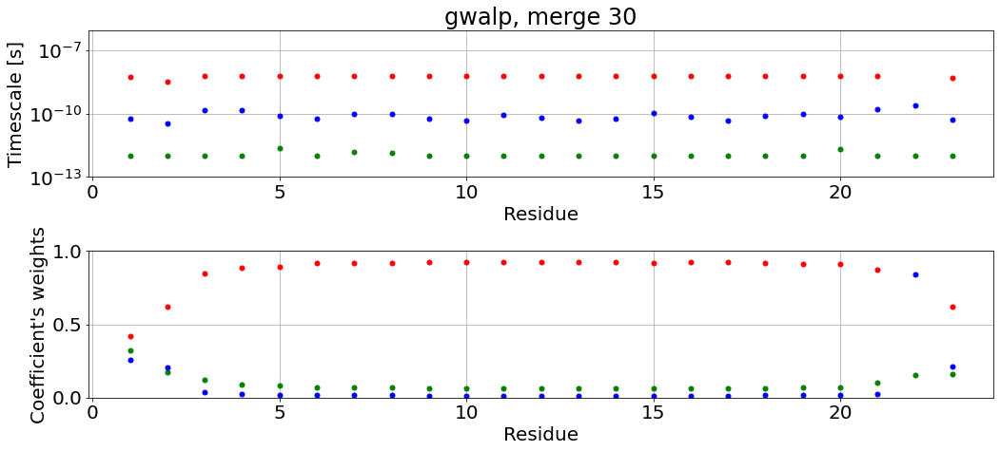

In [156]:
for key in peptides:
    for merge in [1,2,5,10,20,30]:
        PlotTimescales(peptides[key]["CTIMES"],merge,key,key+", merge "+str(merge),"Residue")

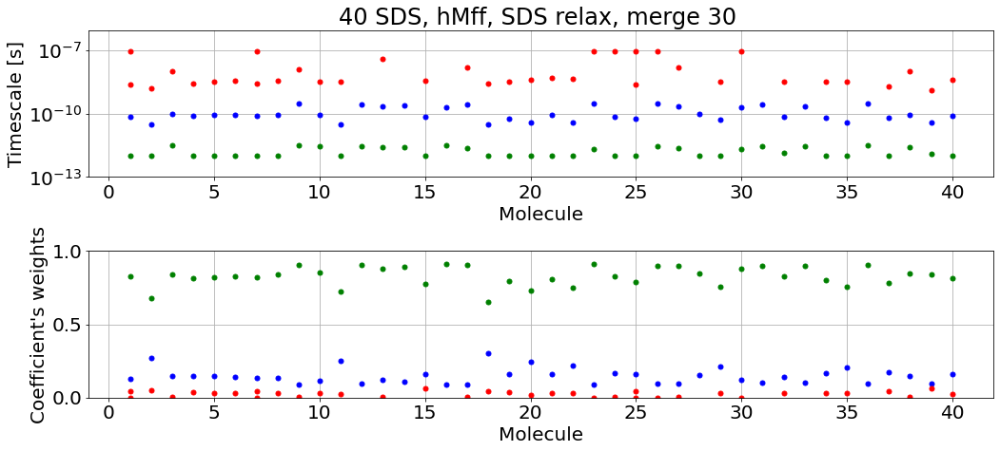

In [165]:
Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_030822_alpha.out")
PlotTimescales(Ctimes_to_save,30,"40SDS_hMff","40 SDS, hMff, SDS relax, merge 30 ","Molecule")

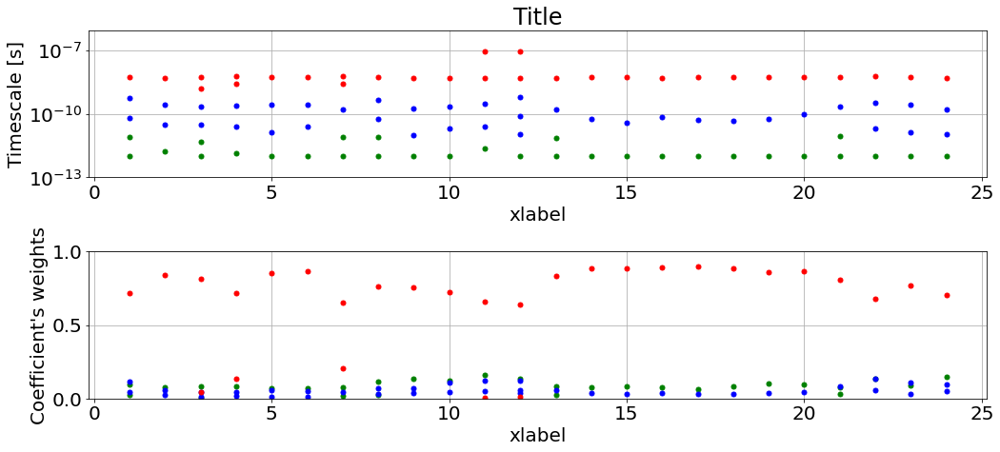

In [133]:
PlotTimescales(peptides["hMff"]["CTIMES"],5)

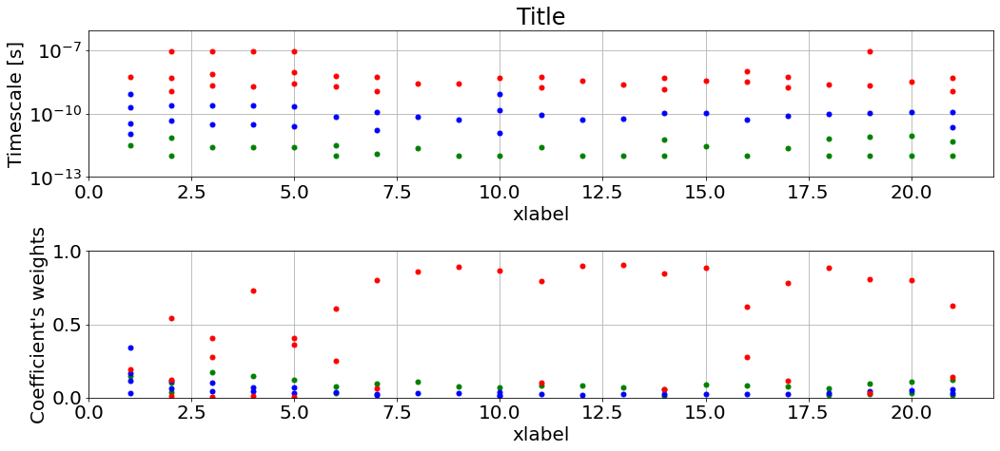

In [187]:
PlotTimescales(peptides["eElab"]["CTIMES"],10,"eeeeeeeelab_new")


In [110]:
print(peptides["hMff"]["CTIMES"])

[[1.00000000e-12 9.51413952e-02 0.00000000e+00 ... 1.32644068e-01
  8.75667847e-02 1.48617673e-01]
 [1.12201845e-12 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [1.25892541e-12 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [7.07945784e-08 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [7.94328235e-08 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [8.91250938e-08 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


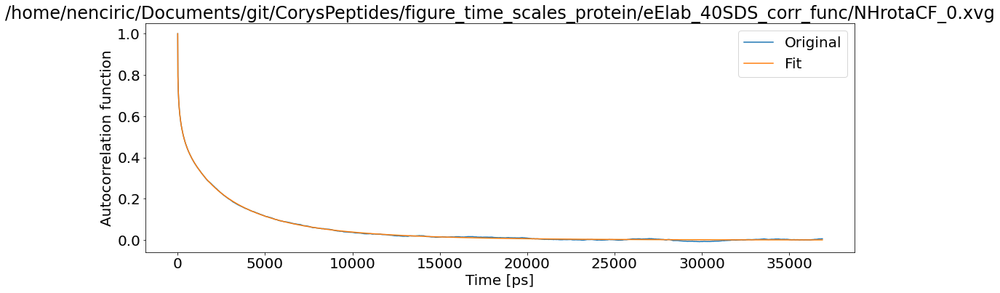

T1: 0.001989794833151481 T2: 0.0015399244325044069 NOE: 0


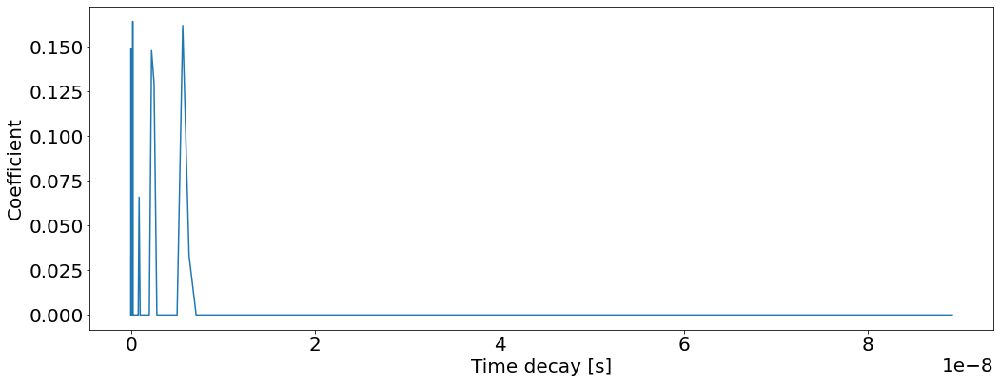

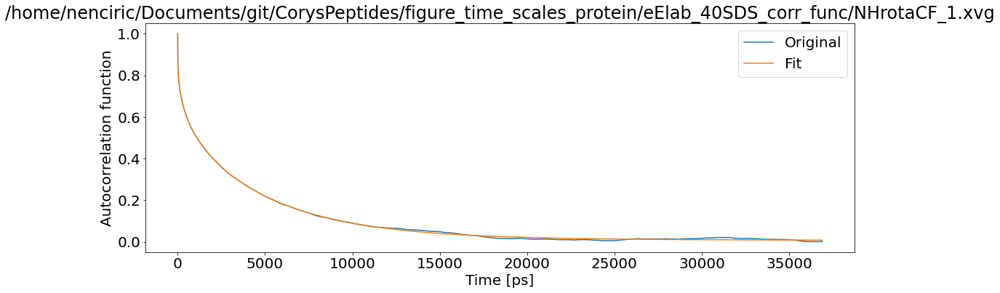

T1: 0.0014017336933843 T2: 0.0008853097361727996 NOE: 0


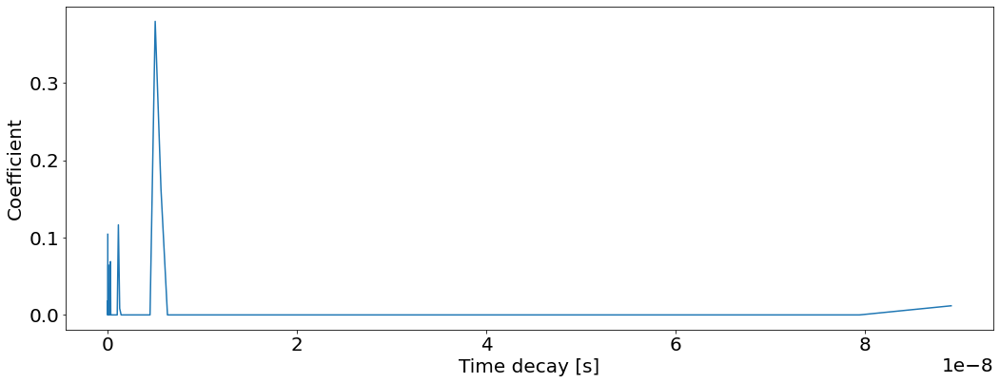

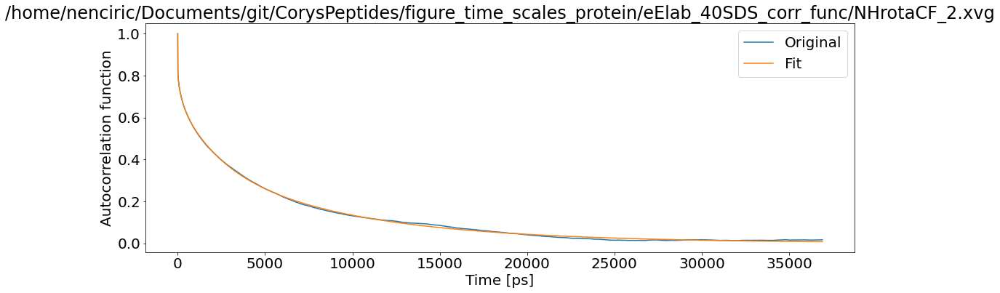

T1: 0.0014334413289540048 T2: 0.0008263211100502187 NOE: 0


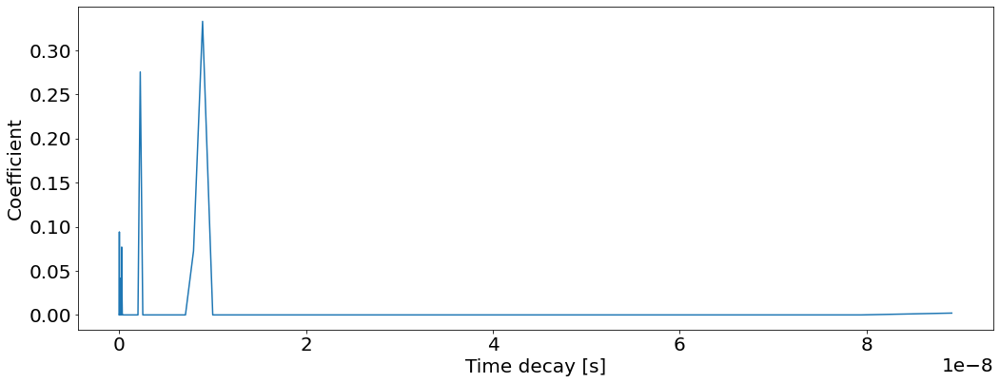

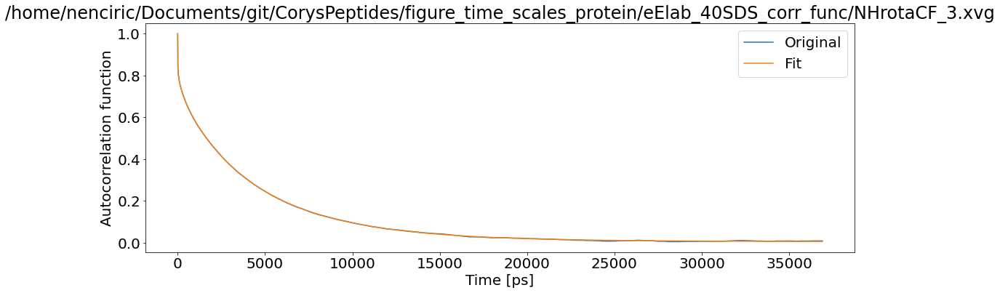

T1: 0.0012335198867743761 T2: 0.0008133499671622279 NOE: 0


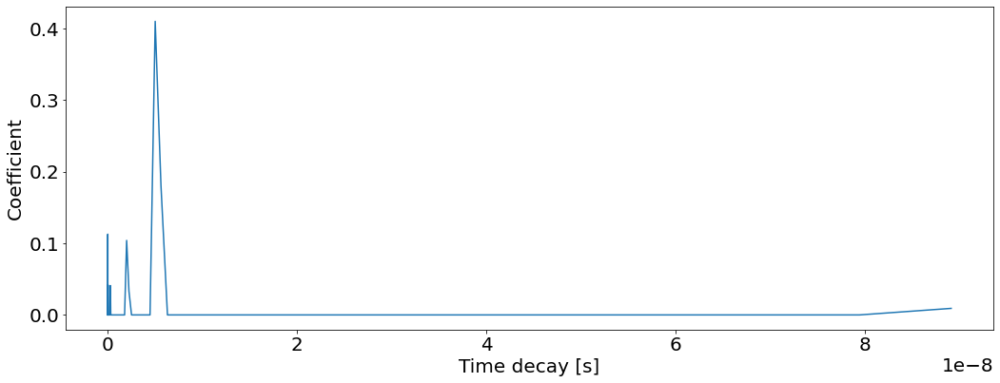

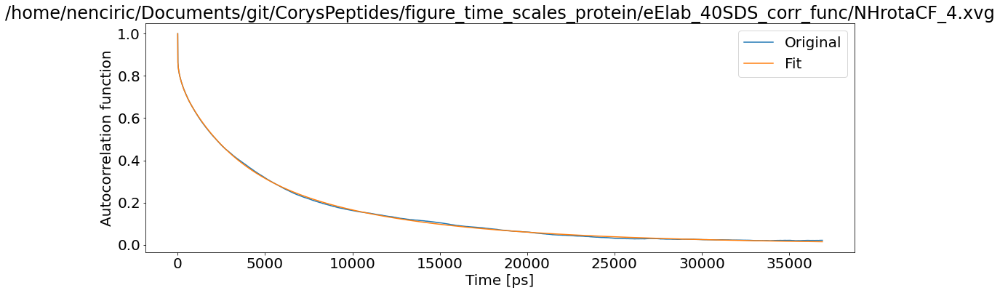

T1: 0.001253456258916809 T2: 0.0006785662795302561 NOE: 0


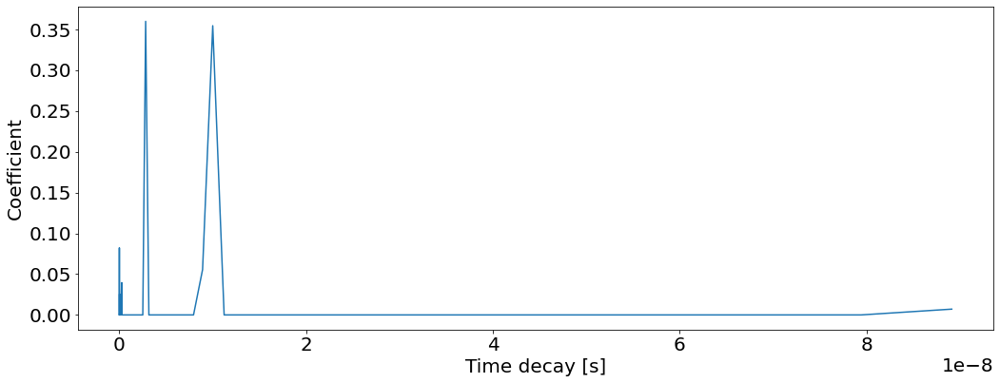

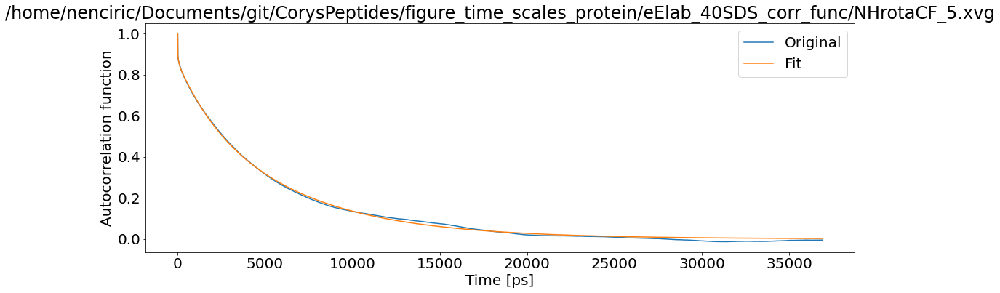

T1: 0.0010516972496546926 T2: 0.0006947546699671387 NOE: 0


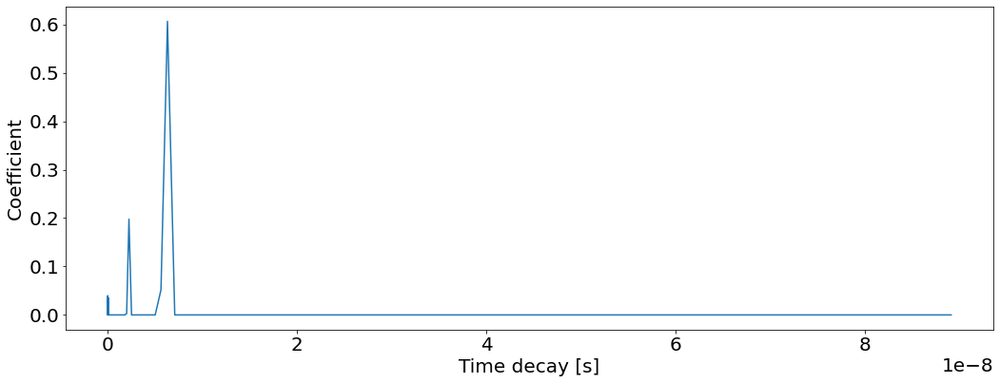

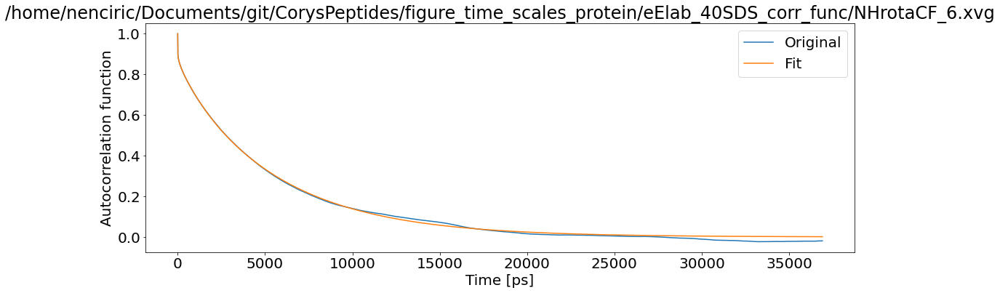

T1: 0.001011892836963947 T2: 0.0006746460664840572 NOE: 0


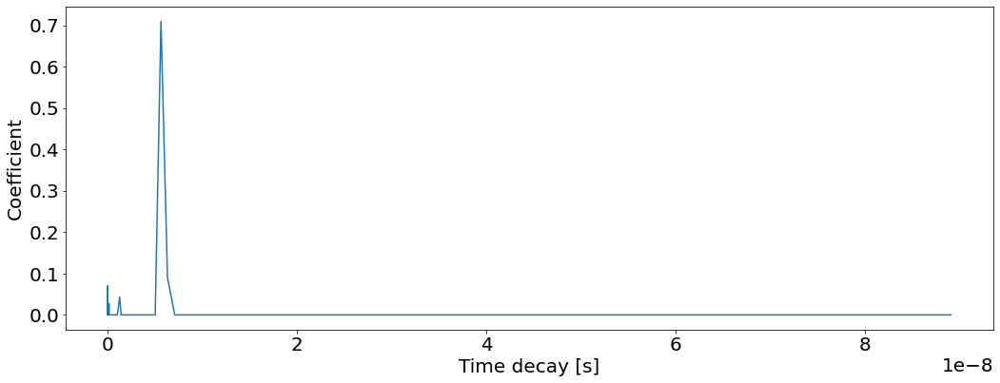

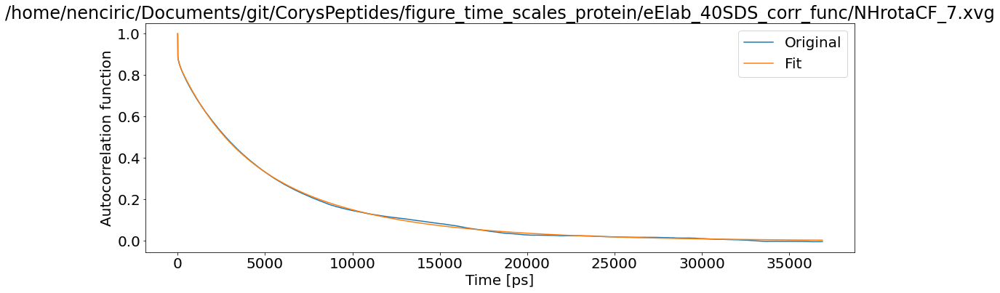

T1: 0.0010579442842776133 T2: 0.0006679239381105486 NOE: 0


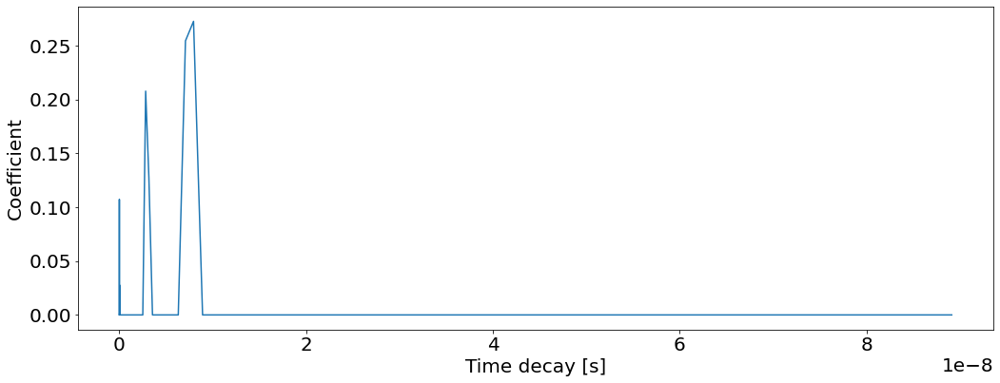

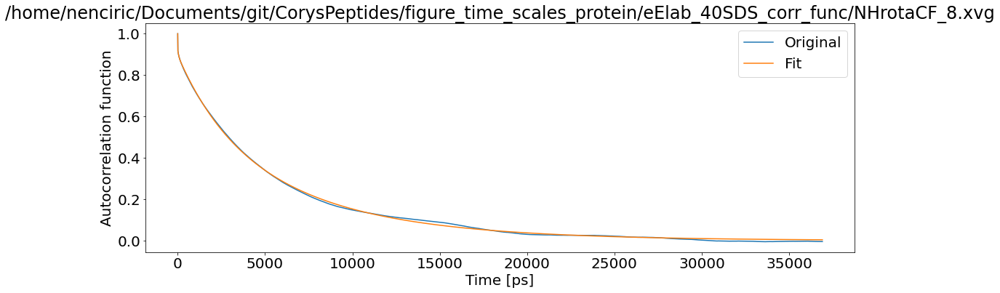

T1: 0.0010237206202757547 T2: 0.0006512242578053196 NOE: 0


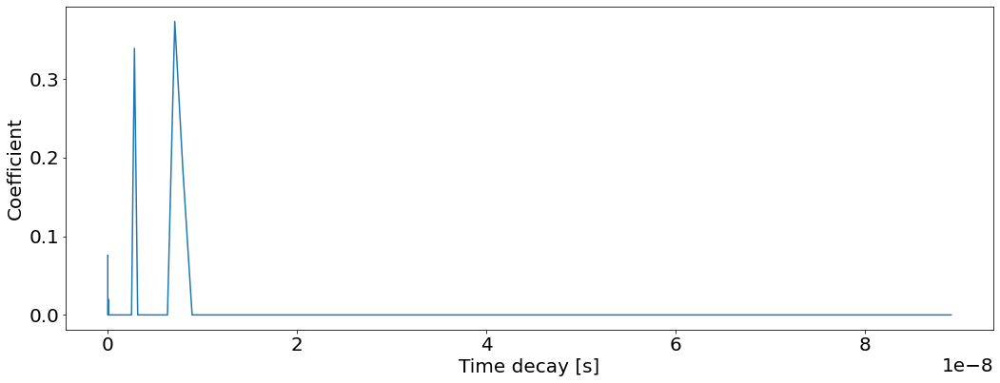

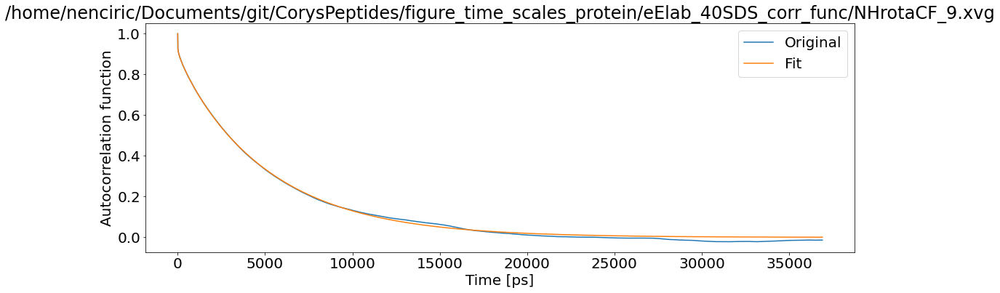

T1: 0.0009631768841625207 T2: 0.0006644660800221509 NOE: 0


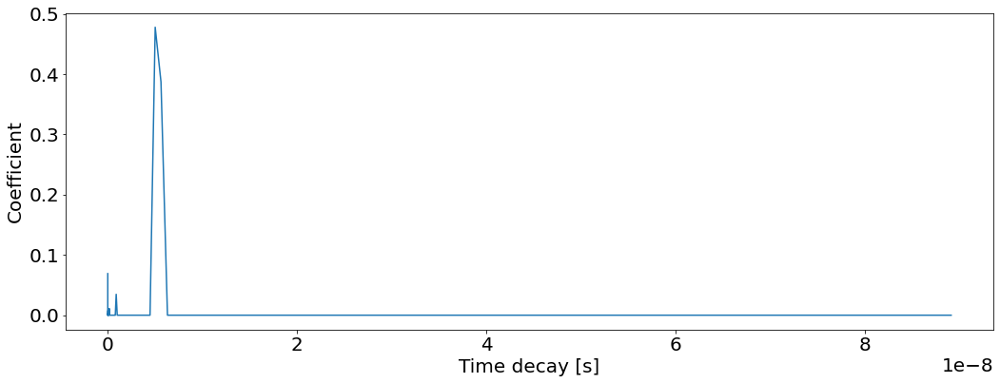

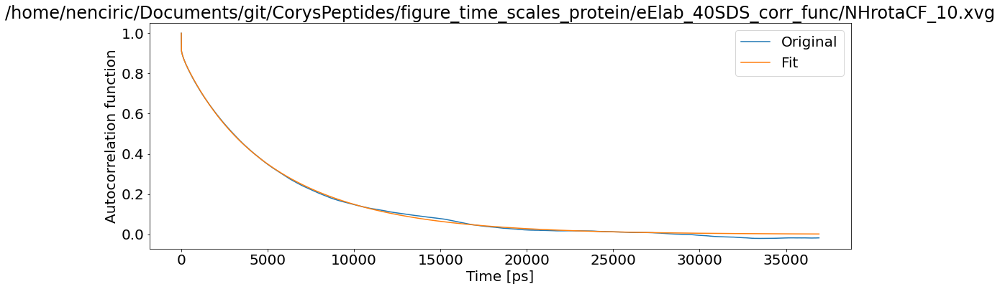

T1: 0.0009812770110493782 T2: 0.0006442926198018358 NOE: 0


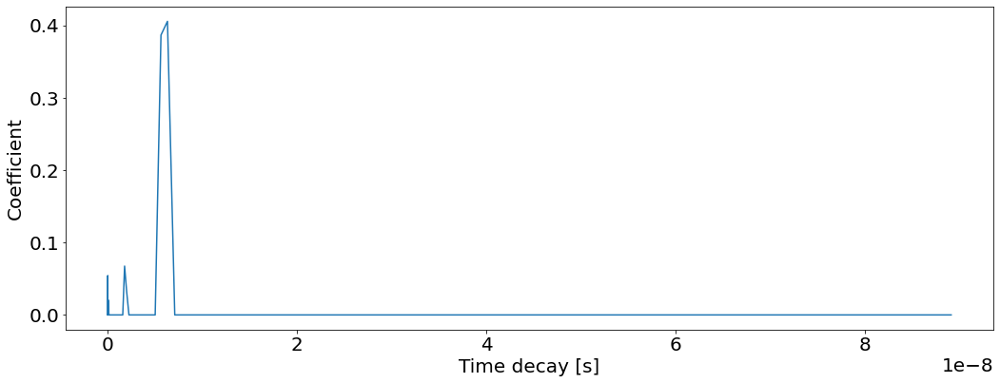

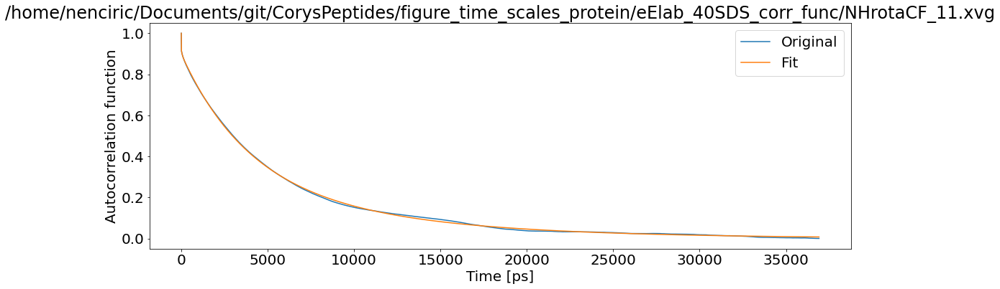

T1: 0.001025603072177523 T2: 0.000637856553041421 NOE: 0


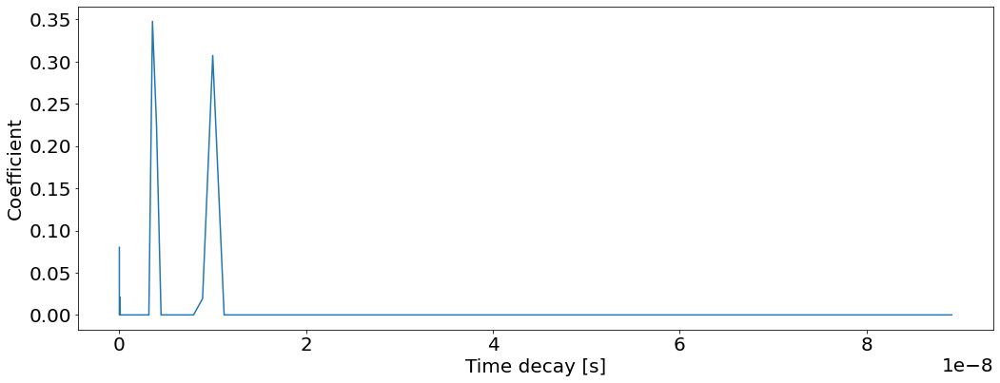

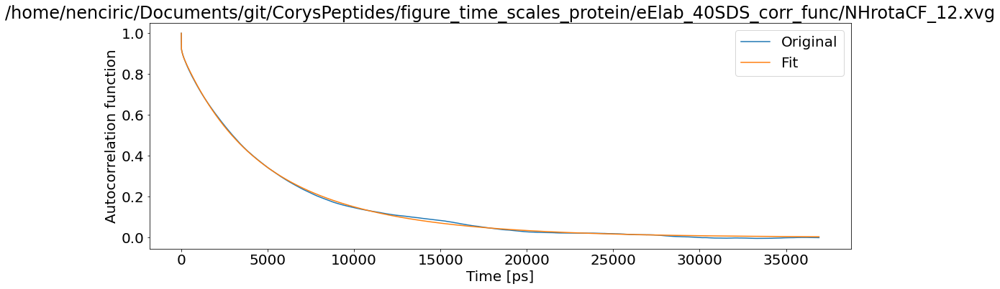

T1: 0.0009980594992650745 T2: 0.0006472943623336076 NOE: 0


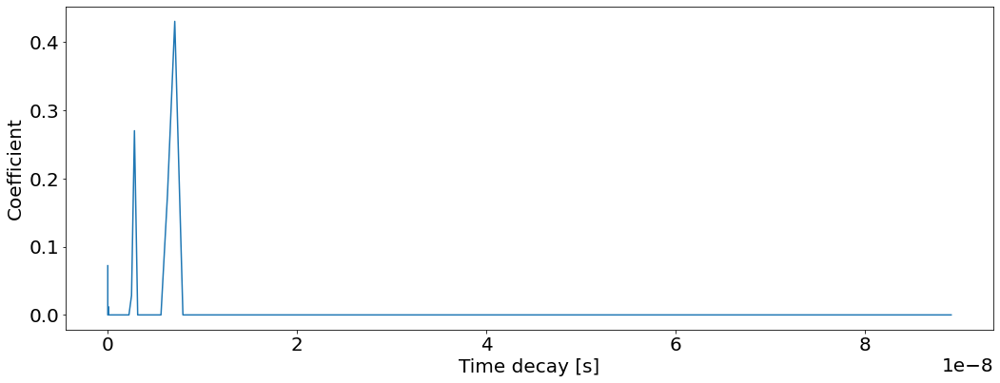

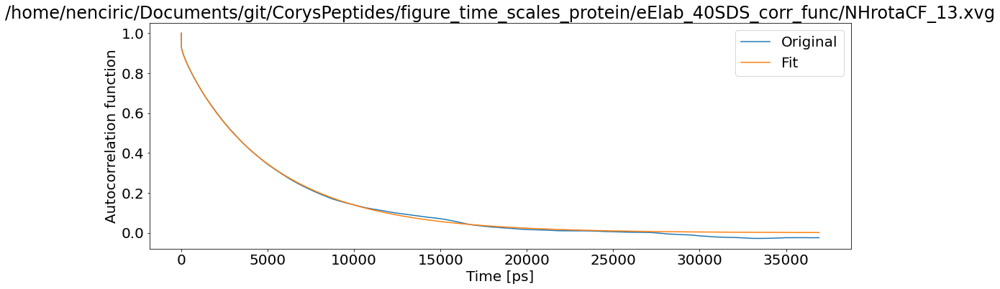

T1: 0.0009564967847688909 T2: 0.000648408045848402 NOE: 0


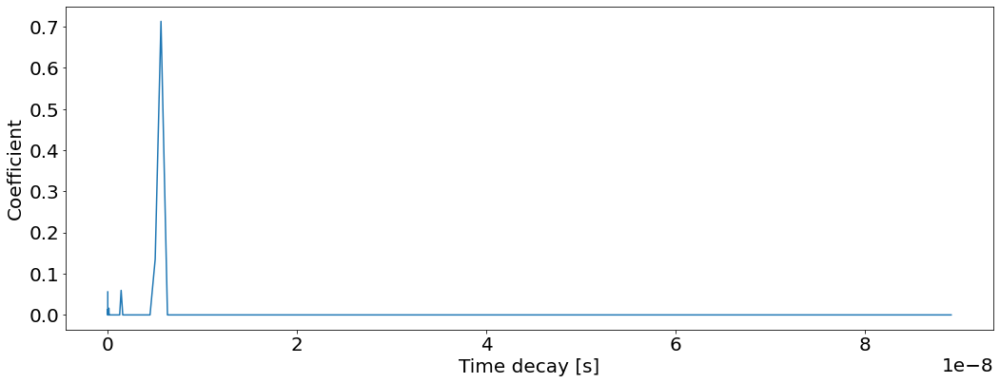

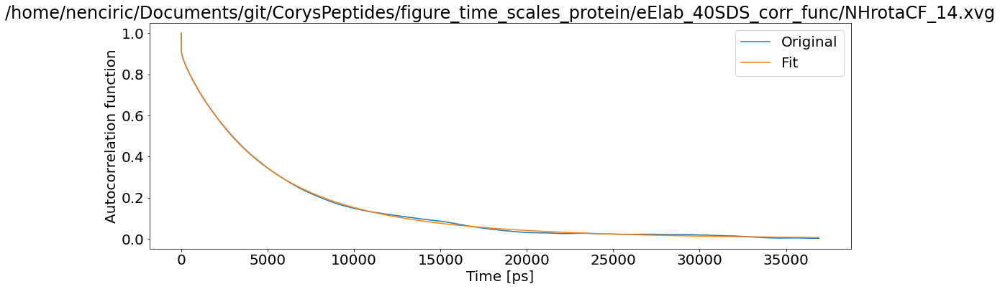

T1: 0.0010192900033911029 T2: 0.0006475978284088797 NOE: 0


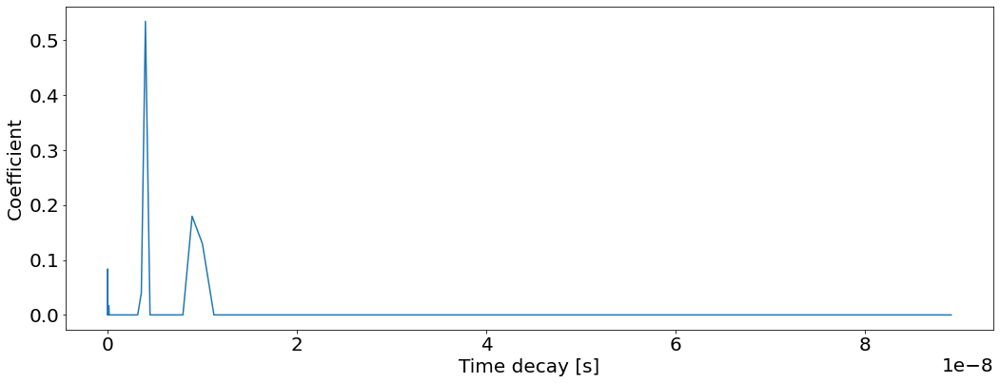

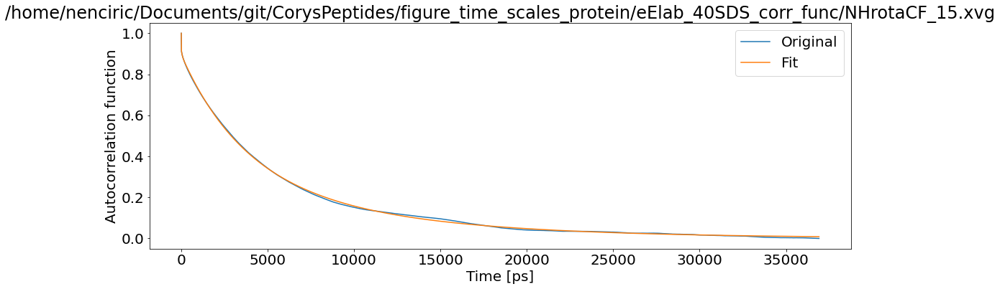

T1: 0.0010435836576995268 T2: 0.0006454540663481105 NOE: 0


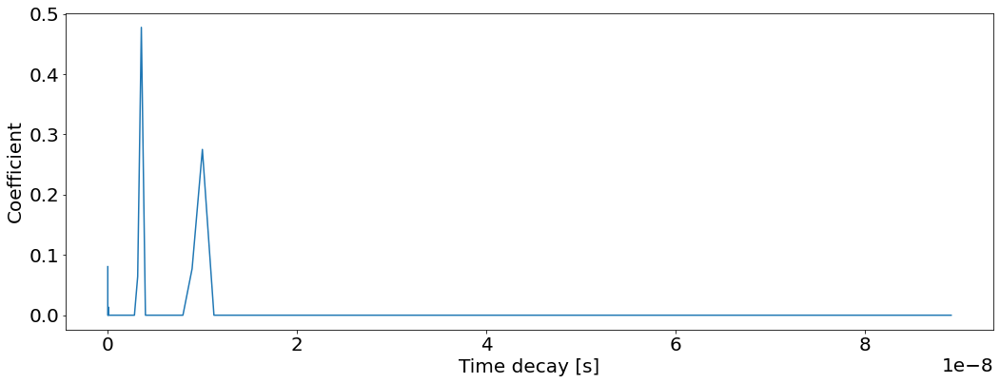

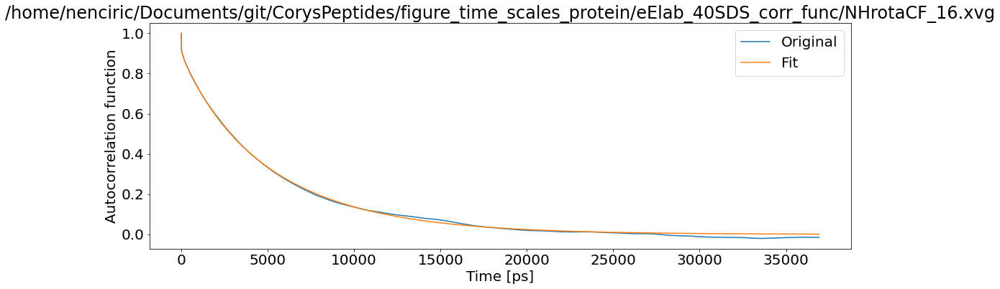

T1: 0.0009849975944603588 T2: 0.0006639177685101789 NOE: 0


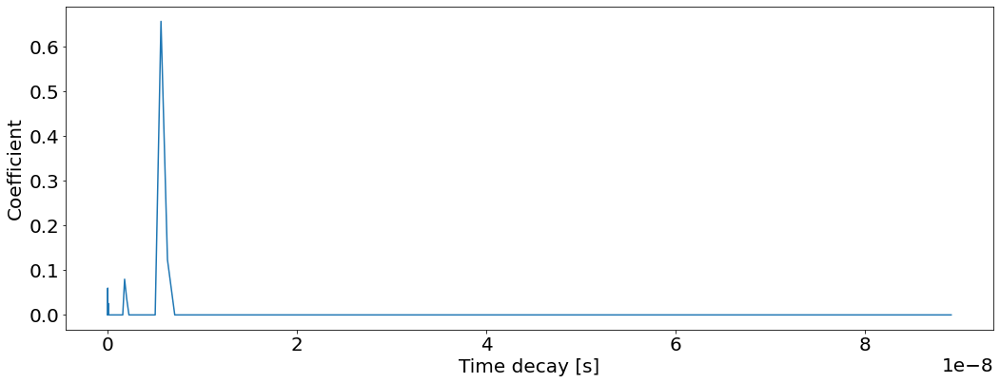

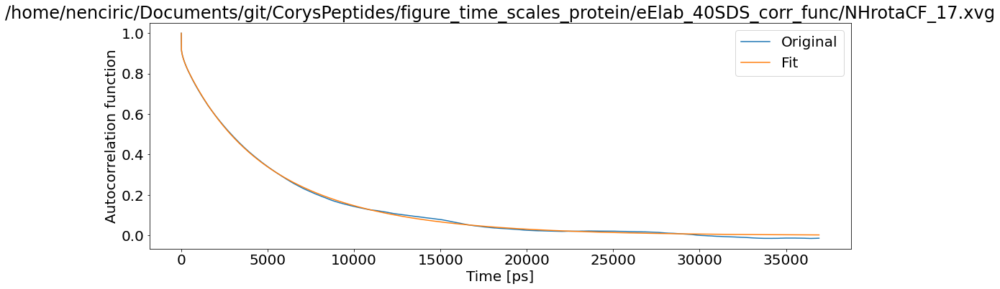

T1: 0.0010087719654860807 T2: 0.0006568137106597456 NOE: 0


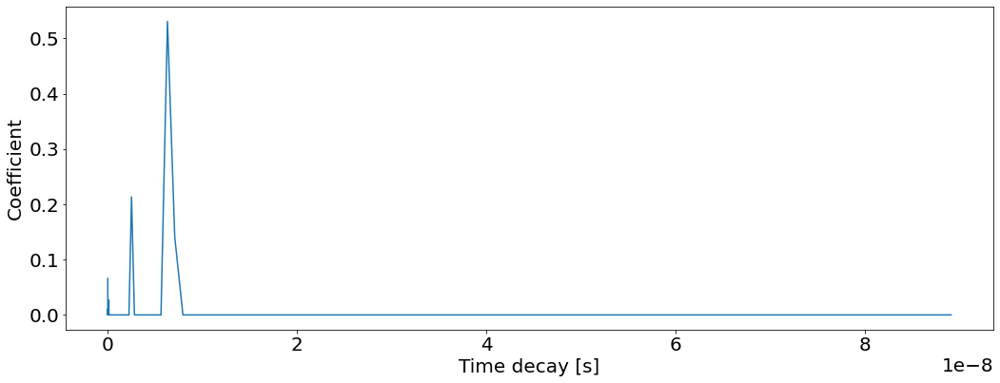

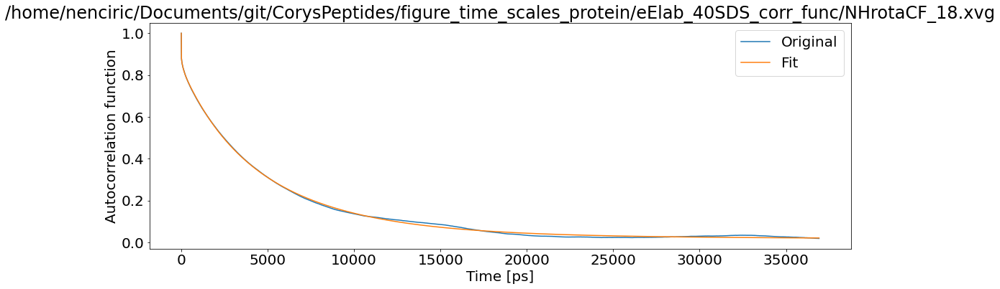

T1: 0.0011102084566825838 T2: 0.0006125644322092806 NOE: 0


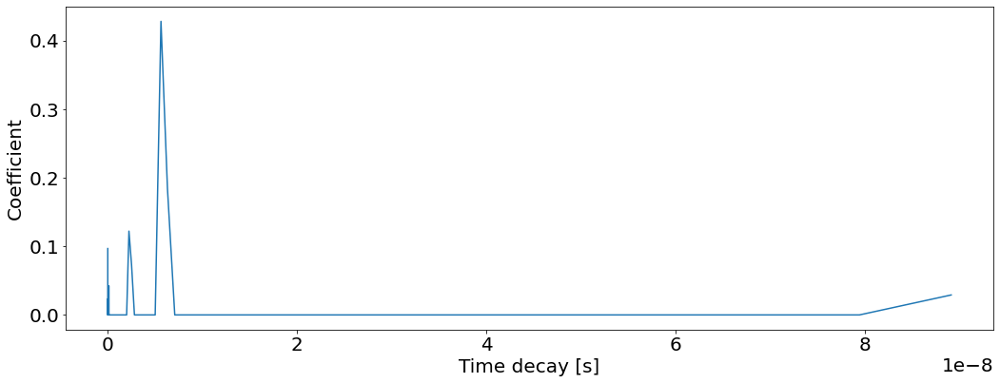

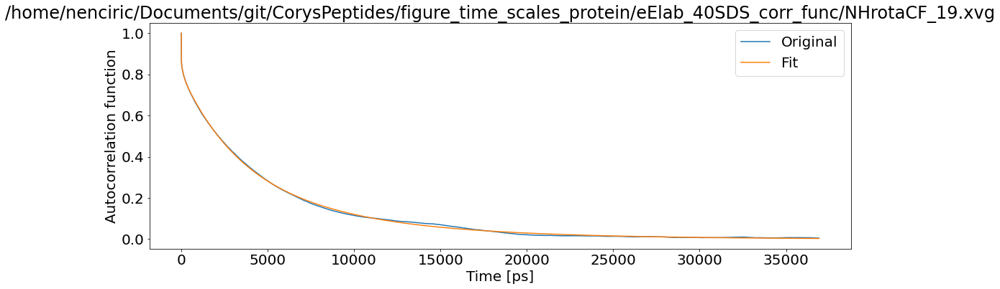

T1: 0.0011558406139080943 T2: 0.0007626034187431778 NOE: 0


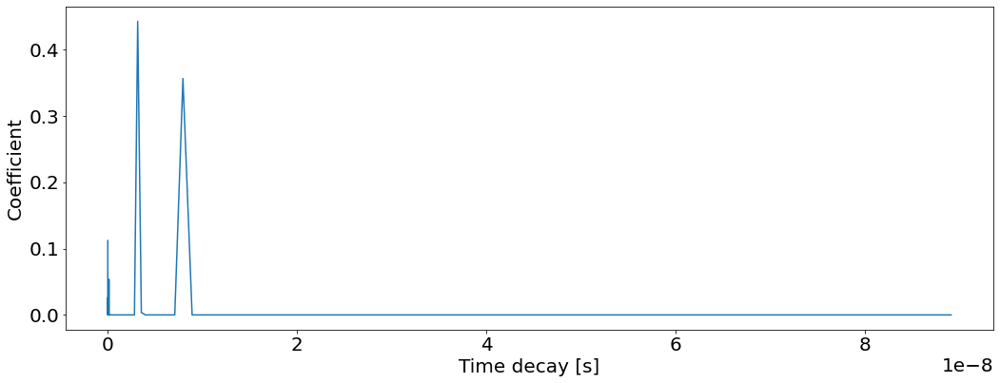

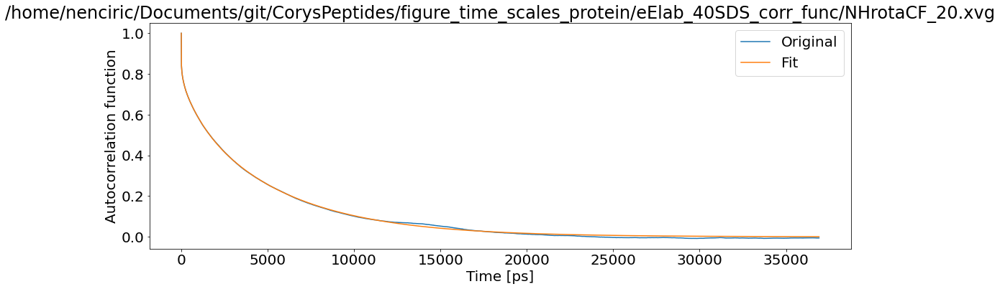

T1: 0.0012247109187969406 T2: 0.0008422545124507737 NOE: 0


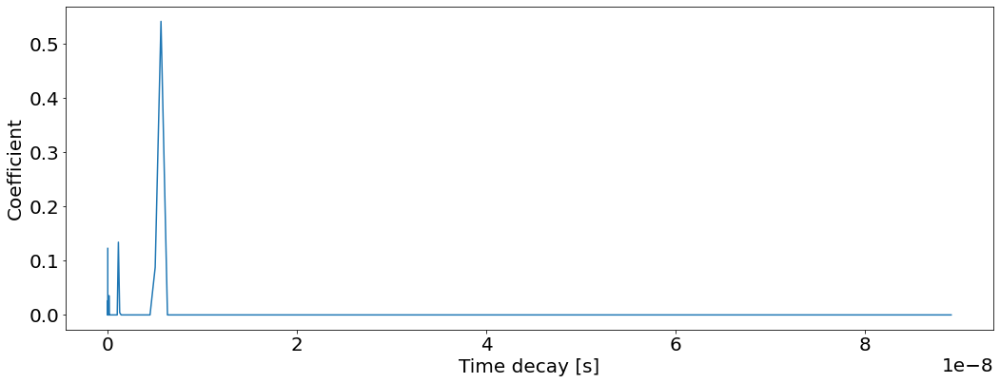

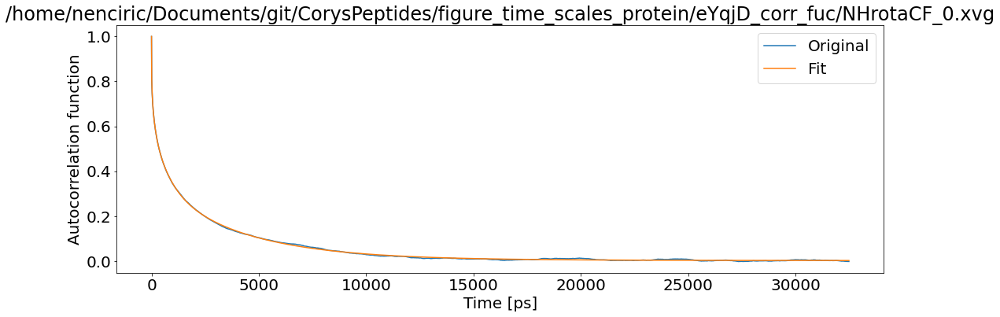

T1: 0.0021115663765398133 T2: 0.0015788214816559623 NOE: 0


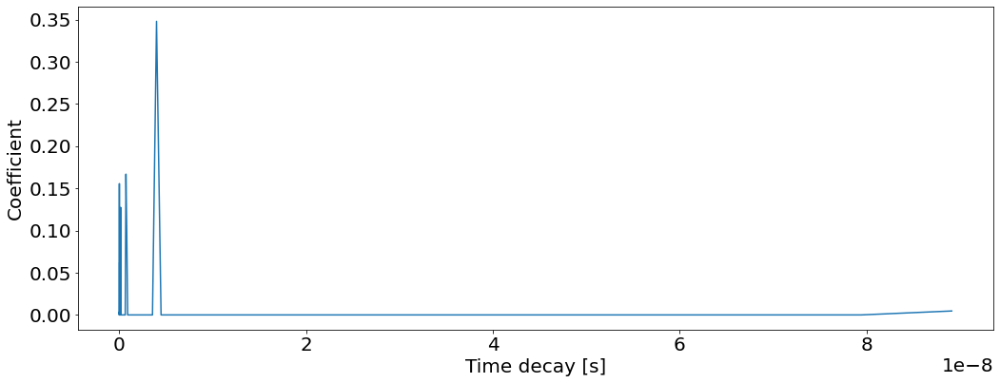

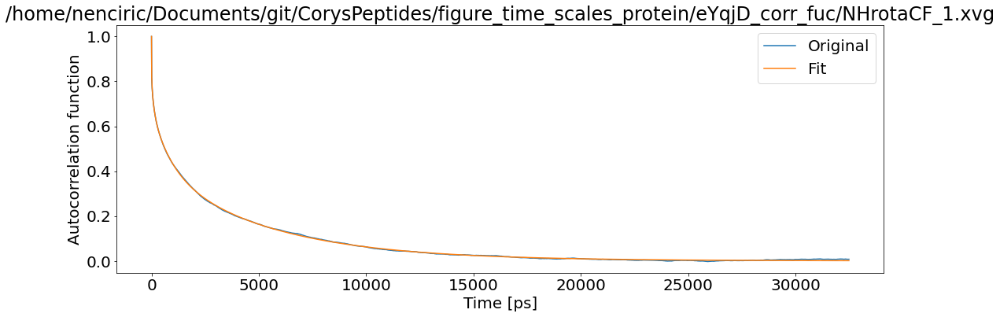

T1: 0.0016759590870232977 T2: 0.0012027223386355847 NOE: 0


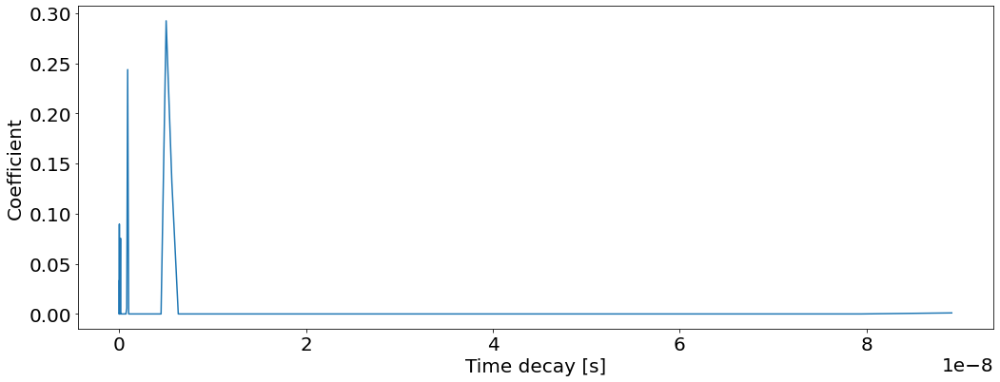

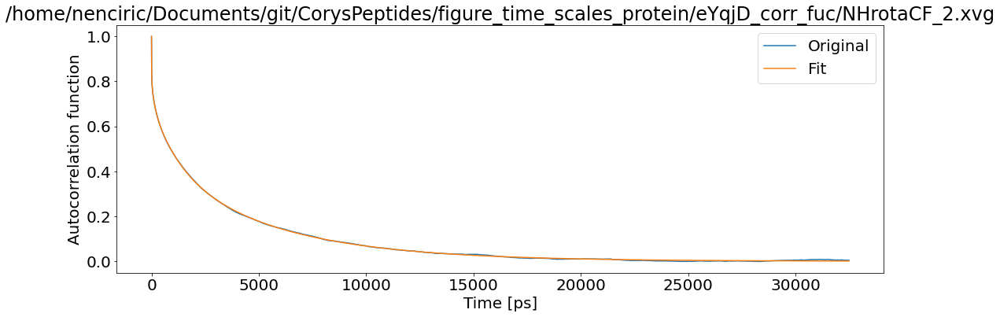

T1: 0.0015200992416440327 T2: 0.0011071978140815035 NOE: 0


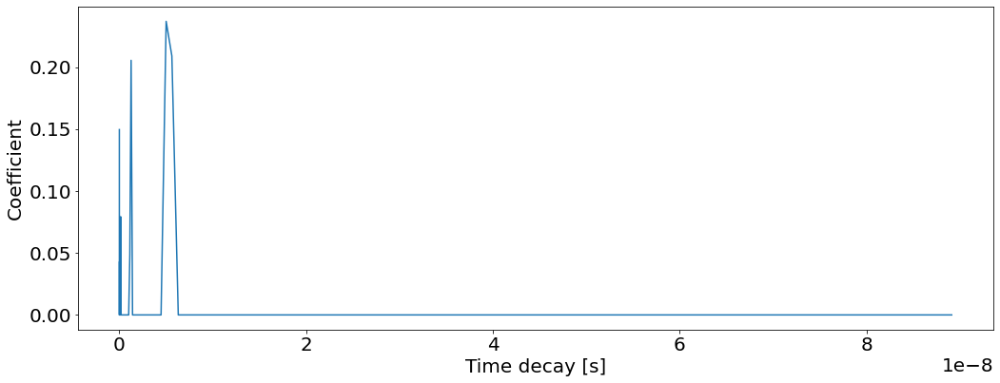

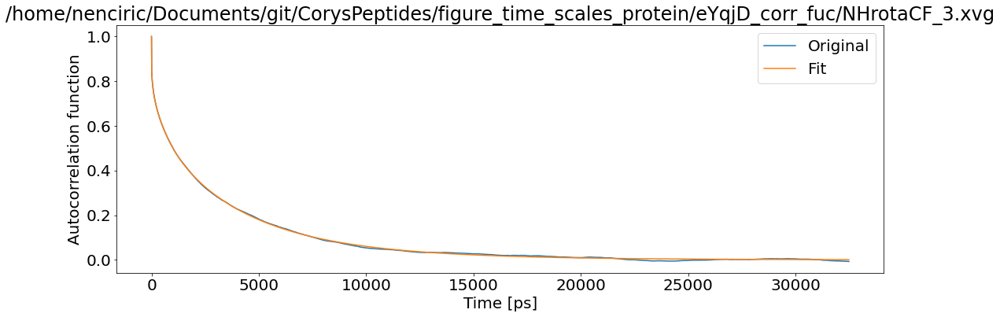

T1: 0.0014401343665404228 T2: 0.001086657785339327 NOE: 0


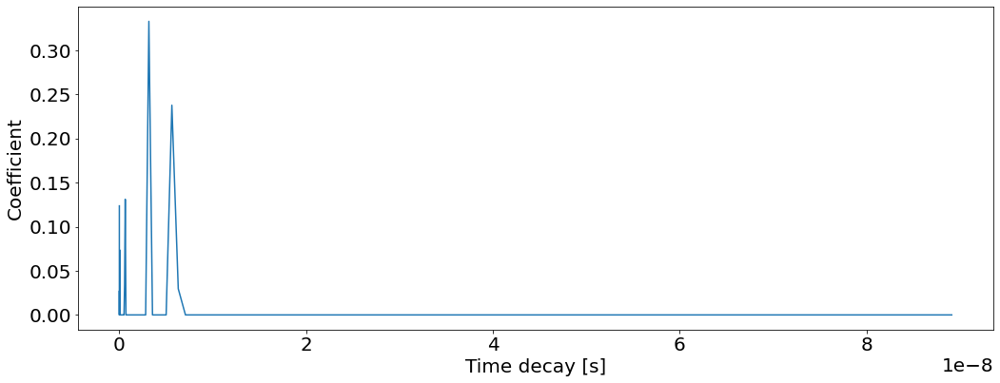

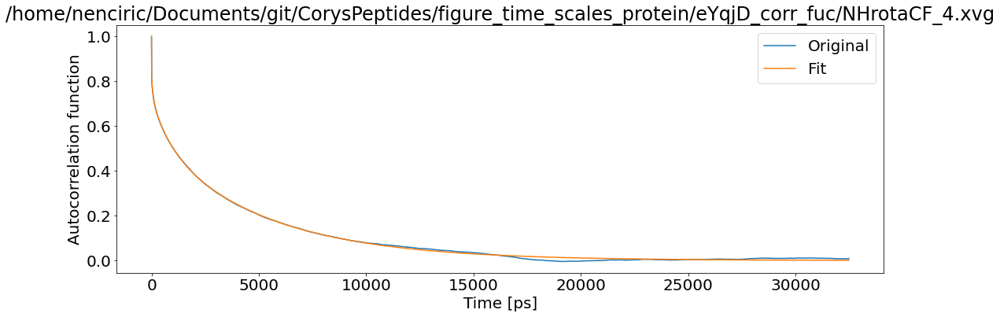

T1: 0.0014204462902378092 T2: 0.0010168697966627081 NOE: 0


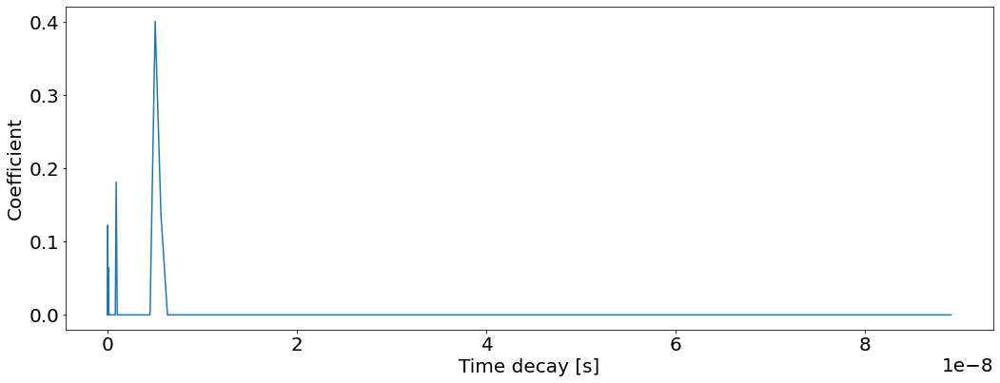

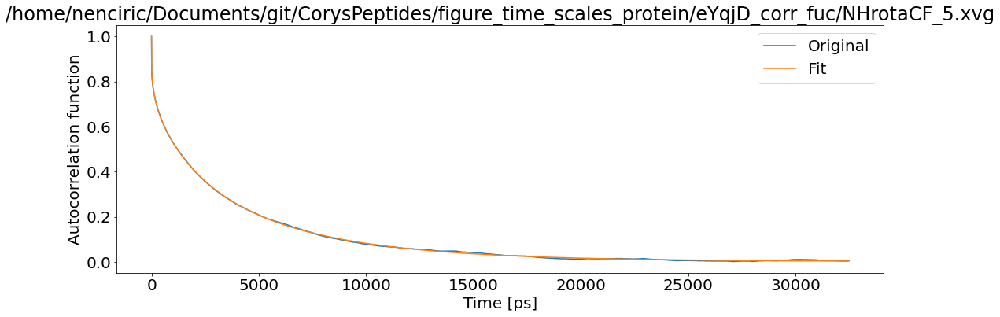

T1: 0.0013865552333532155 T2: 0.0009552347429622418 NOE: 0


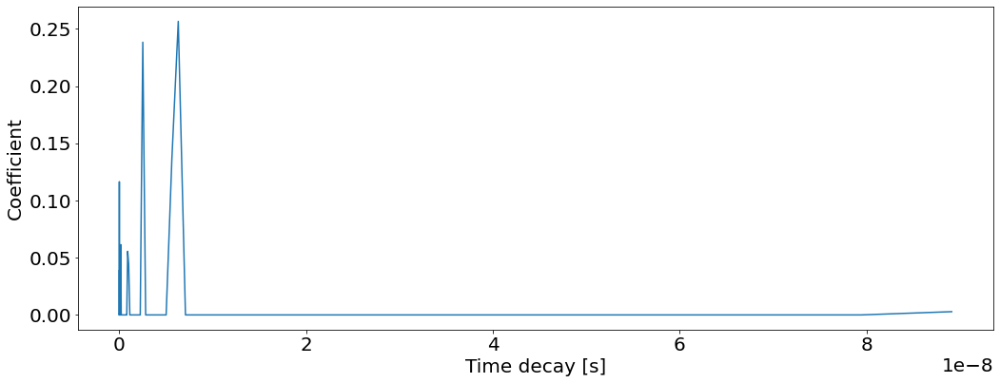

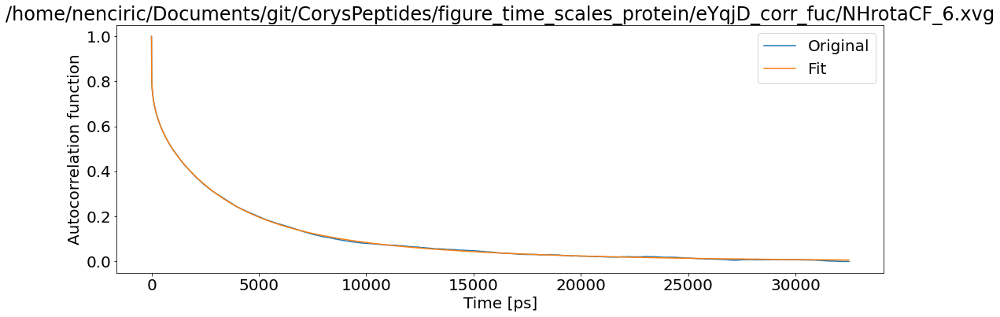

T1: 0.0015190773105539558 T2: 0.0010254495877790857 NOE: 0


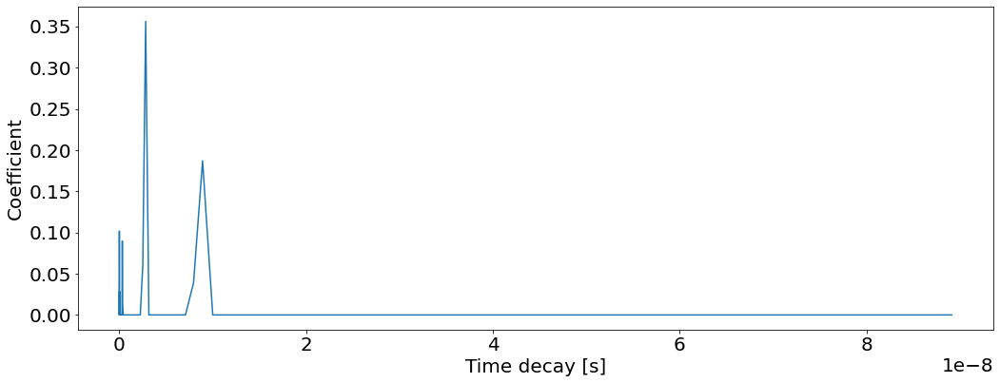

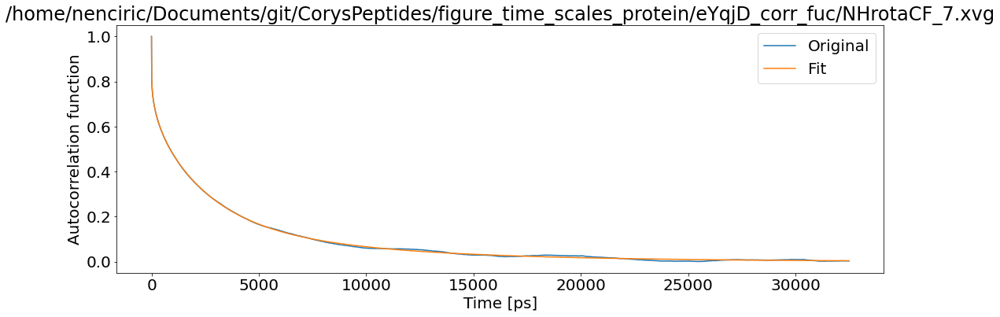

T1: 0.001595263117527942 T2: 0.0011358416367915122 NOE: 0


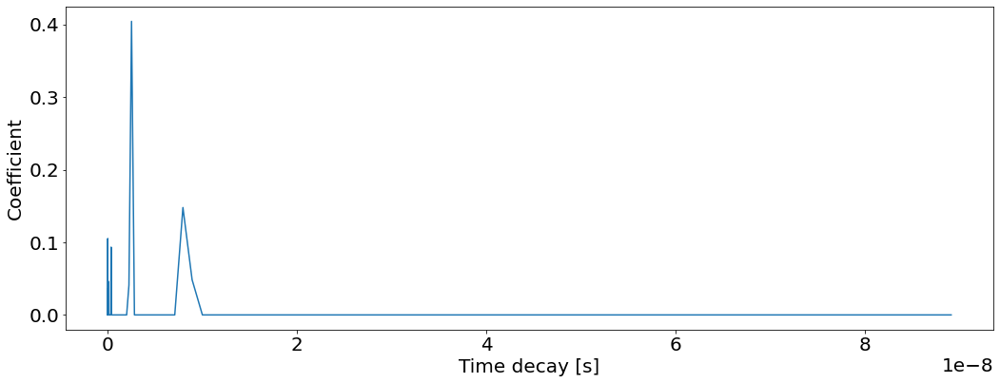

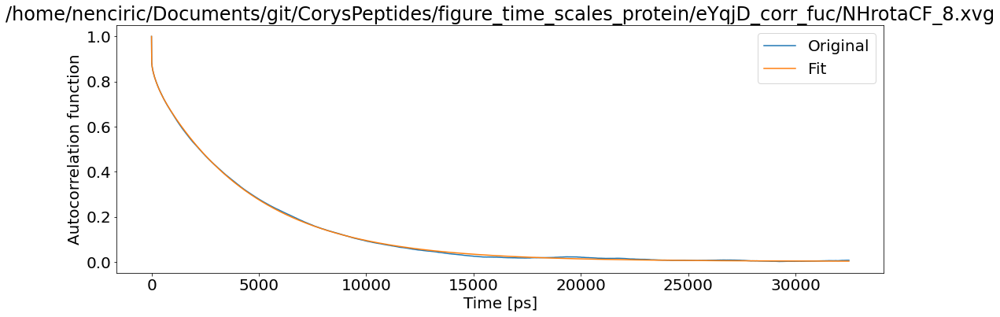

T1: 0.0010648041239580044 T2: 0.0007582953331121792 NOE: 0


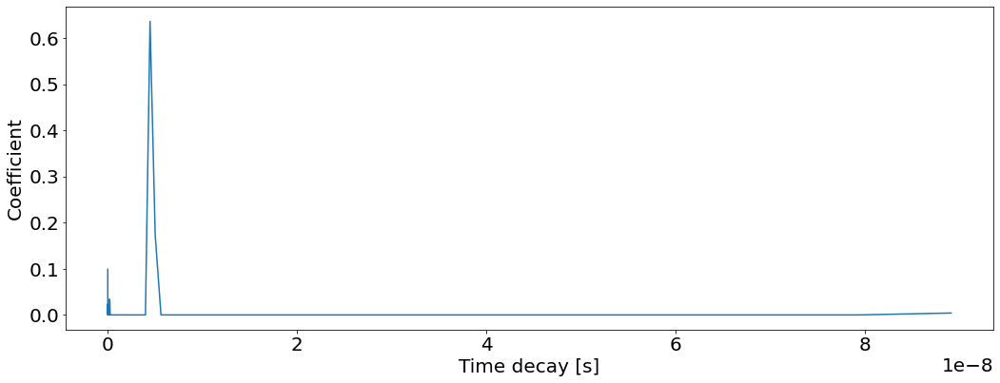

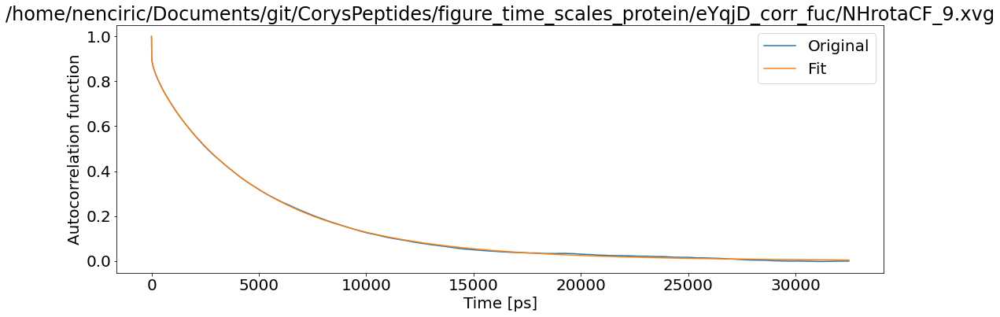

T1: 0.0010313178611366612 T2: 0.0006970933610208795 NOE: 0


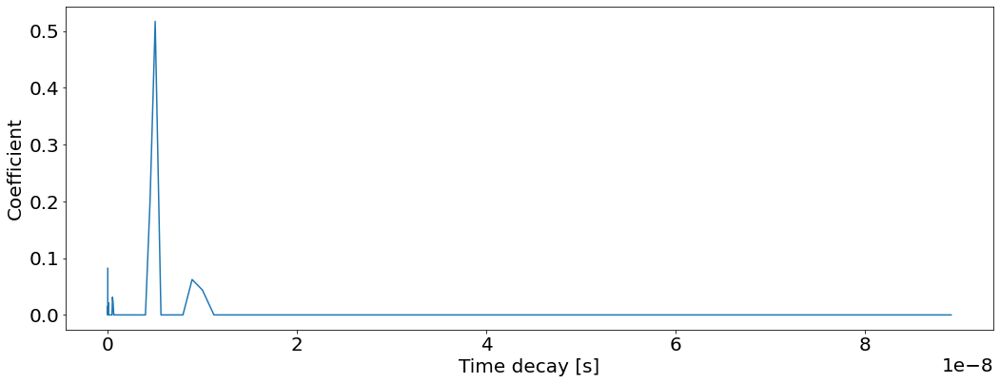

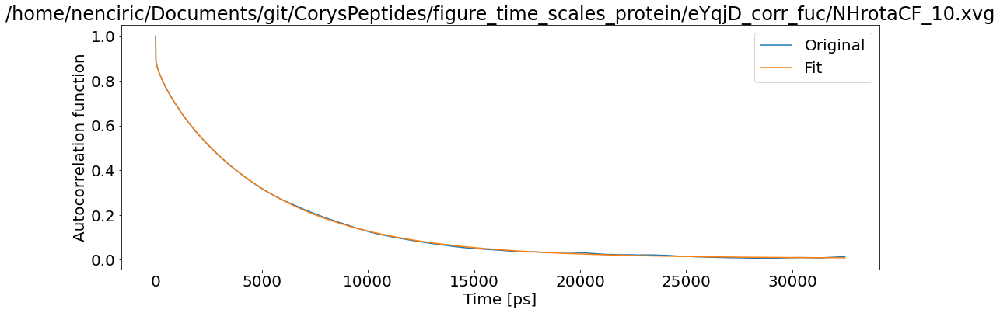

T1: 0.0010303868076338336 T2: 0.0006623795096484212 NOE: 0


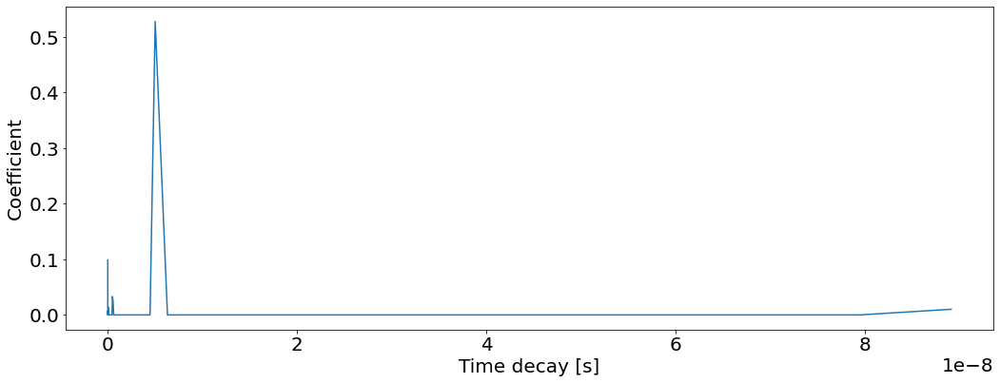

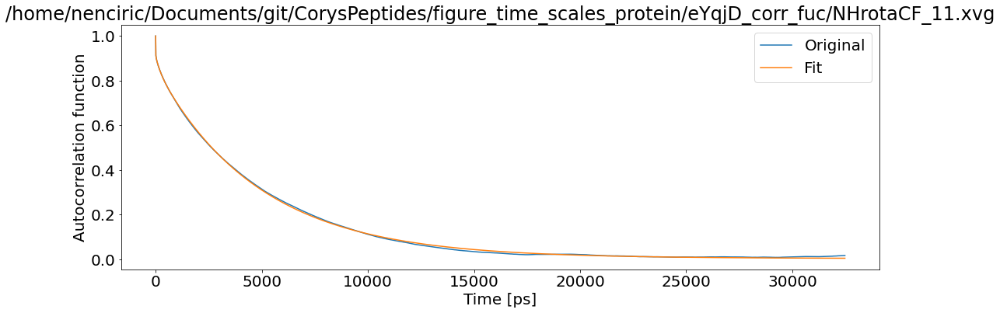

T1: 0.000997670251390648 T2: 0.0006859158789802694 NOE: 0


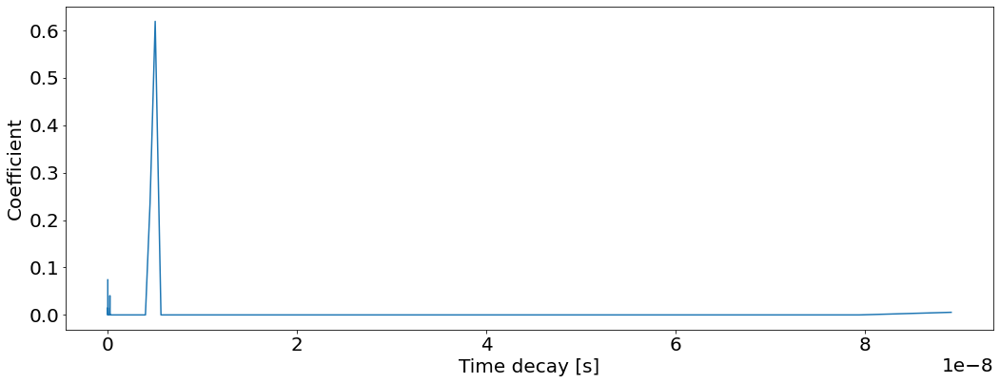

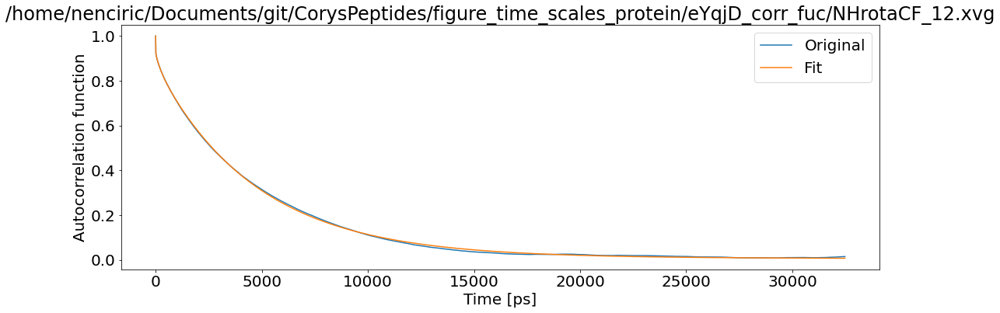

T1: 0.0009920040877619883 T2: 0.0006707491982704478 NOE: 0


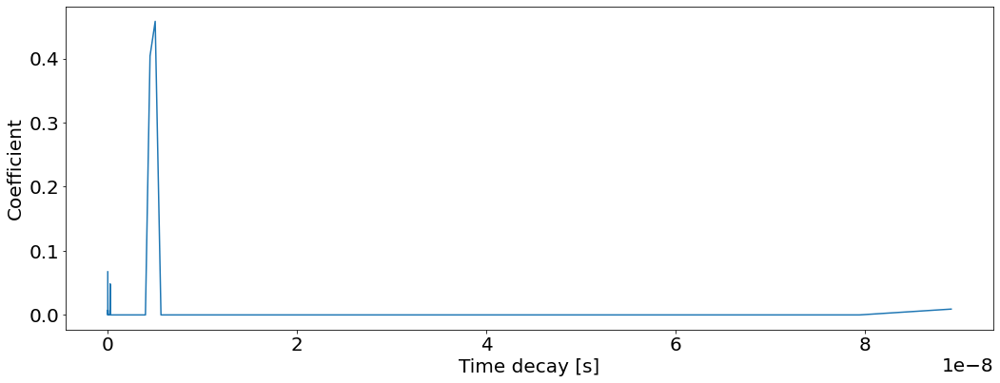

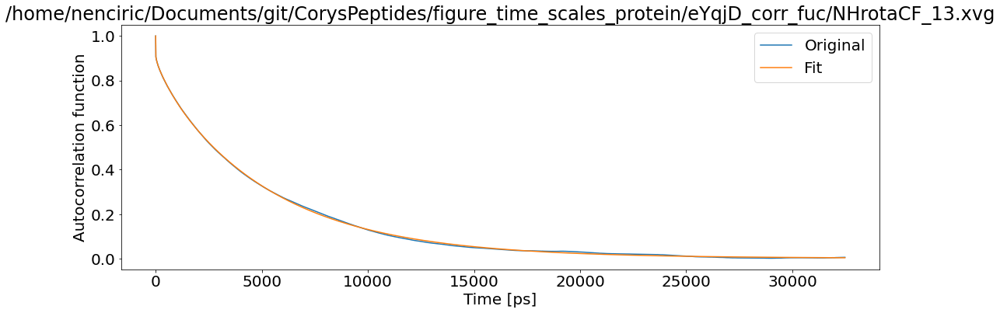

T1: 0.0010045776518875014 T2: 0.0006758589751320584 NOE: 0


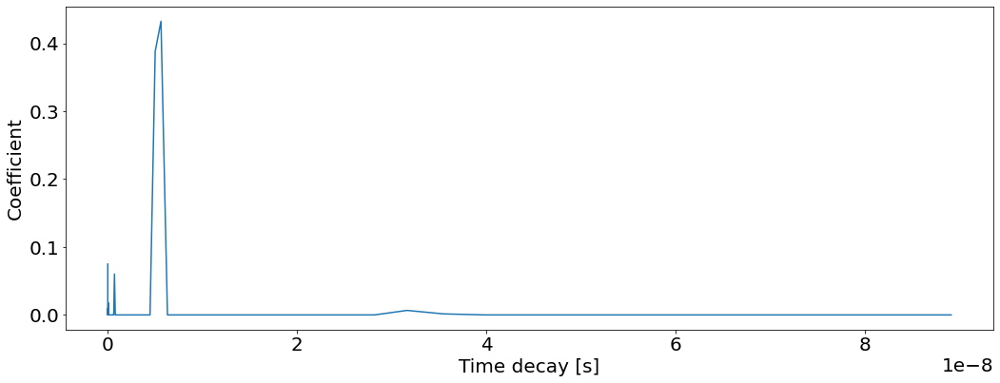

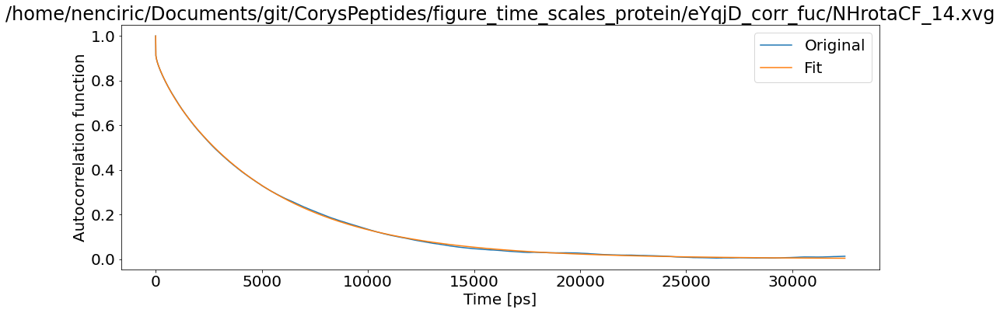

T1: 0.0009942644232898107 T2: 0.0006678478543945477 NOE: 0


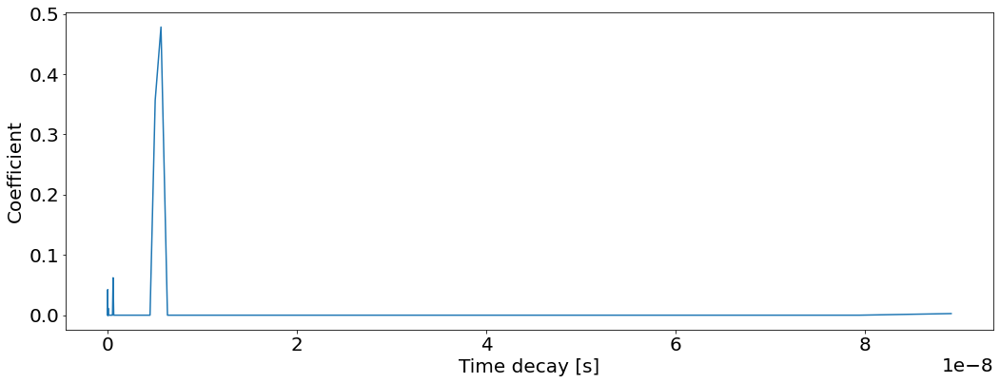

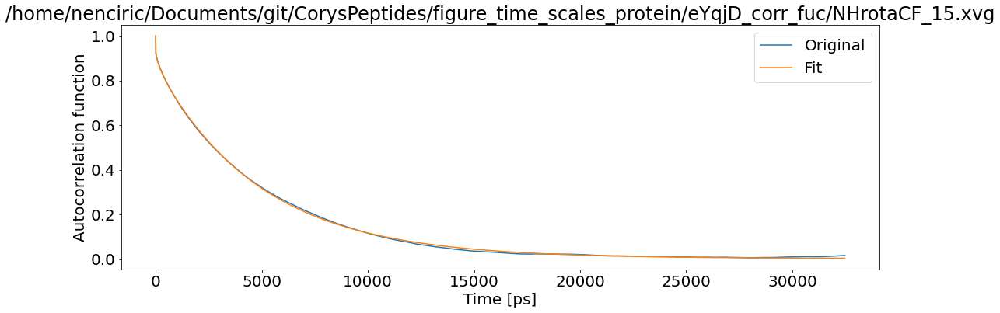

T1: 0.000979059859127295 T2: 0.0006764215806184017 NOE: 0


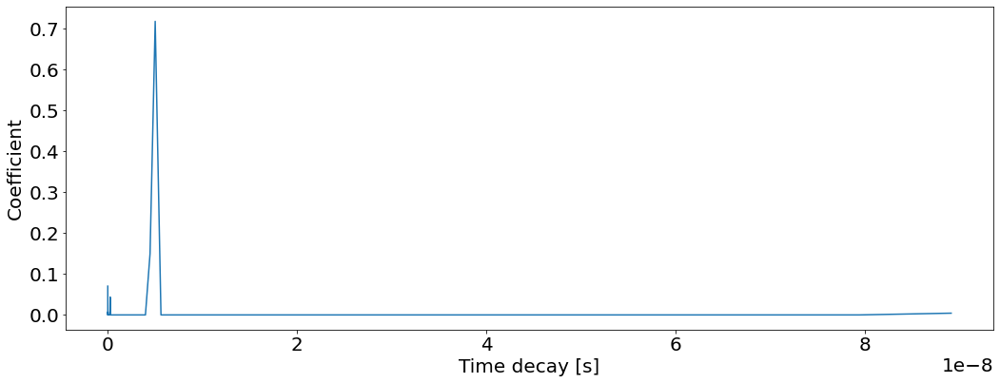

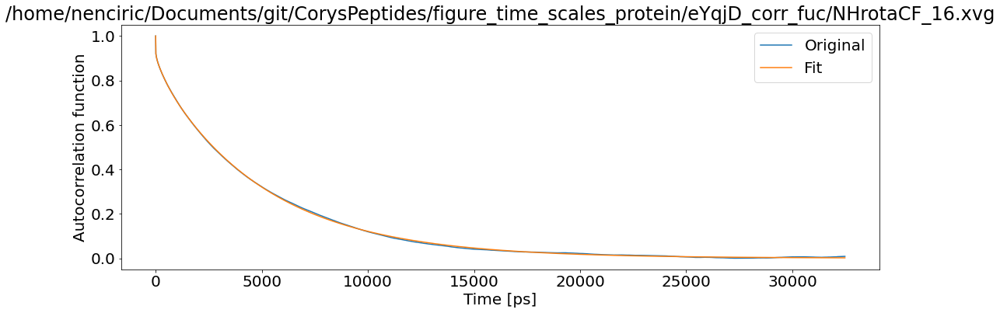

T1: 0.000986680909176626 T2: 0.0006874983680189884 NOE: 0


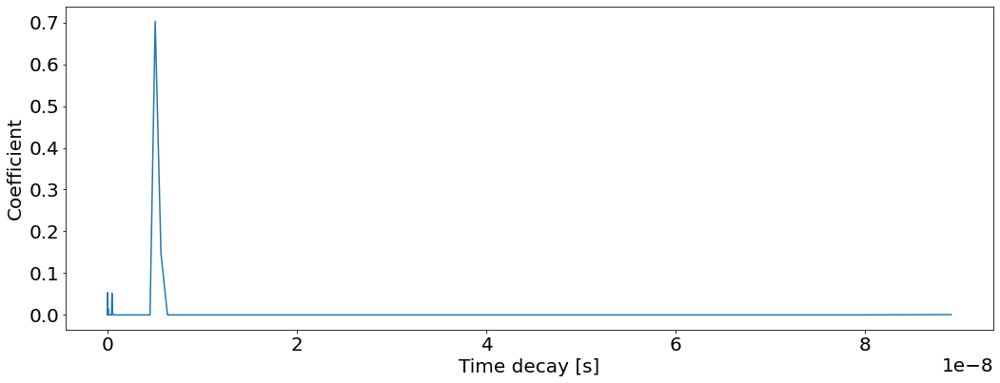

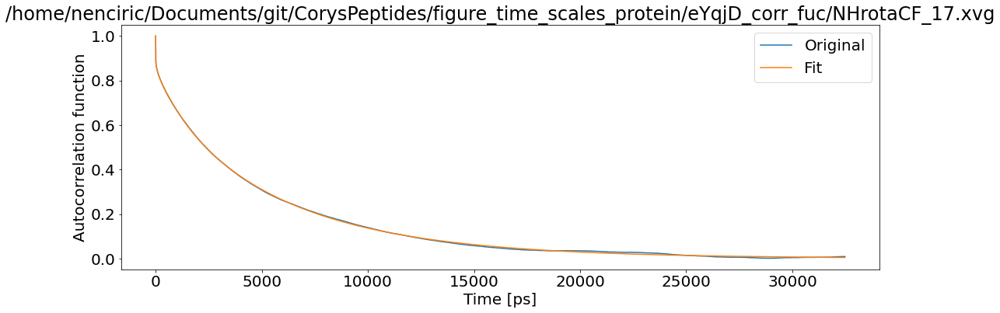

T1: 0.0010983857910460814 T2: 0.0007117355715124816 NOE: 0


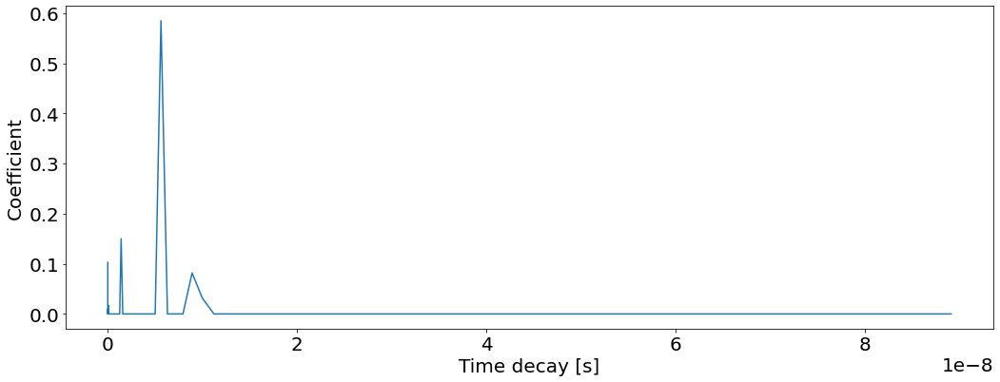

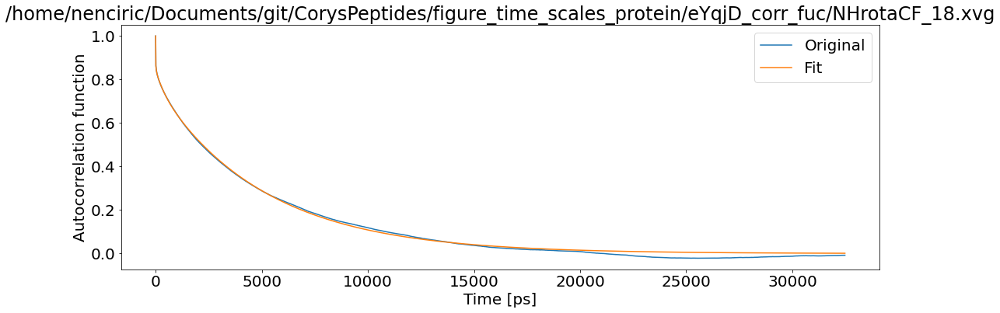

T1: 0.001085324392275484 T2: 0.0007630862093785959 NOE: 0


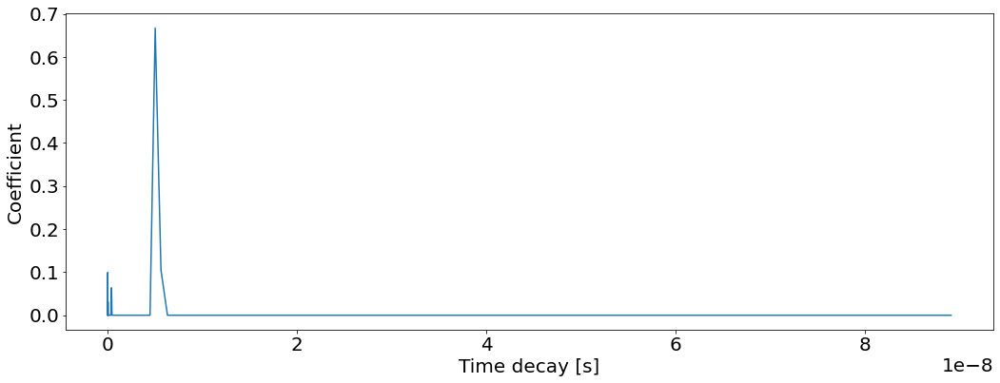

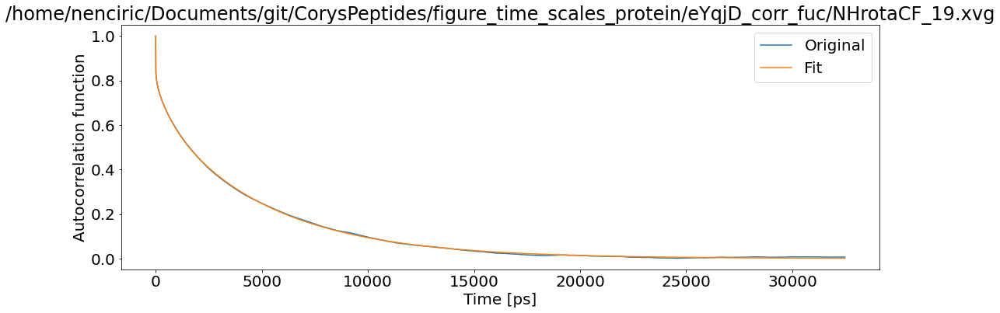

T1: 0.0012265498753986962 T2: 0.0008590862640404807 NOE: 0


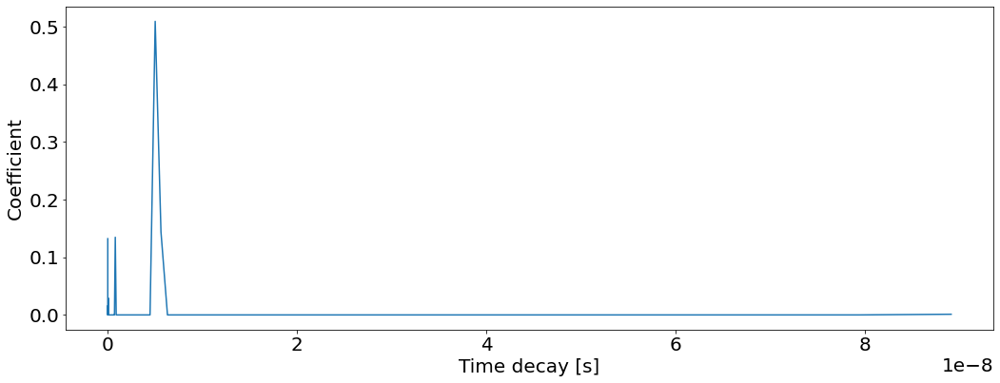

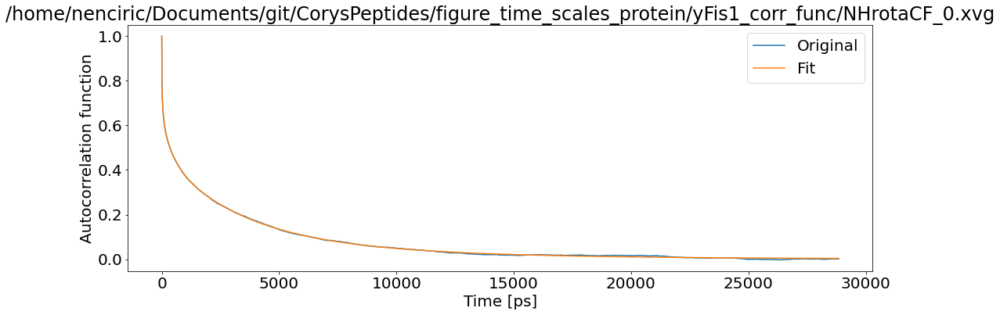

T1: 0.0019303097979267198 T2: 0.0014251406870898489 NOE: 0


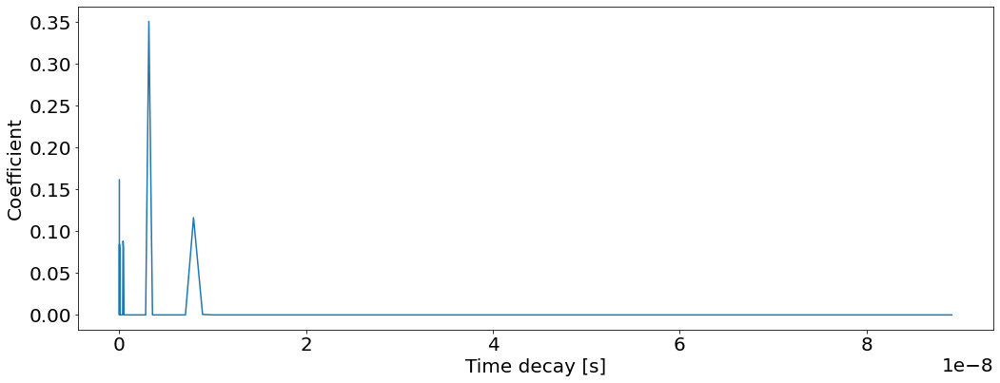

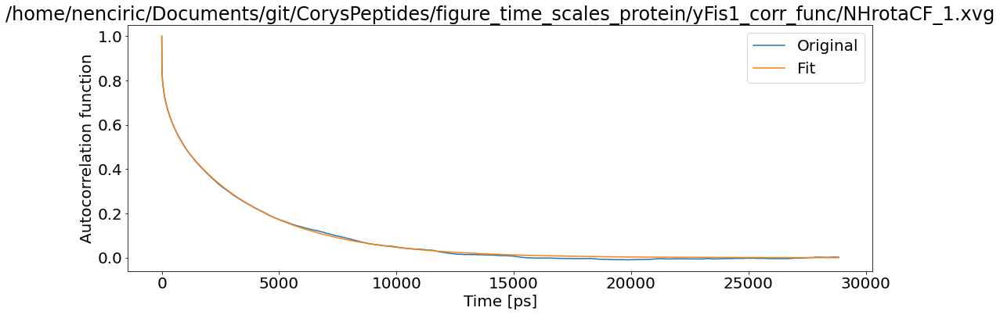

T1: 0.0014061373963249269 T2: 0.001120228777358148 NOE: 0


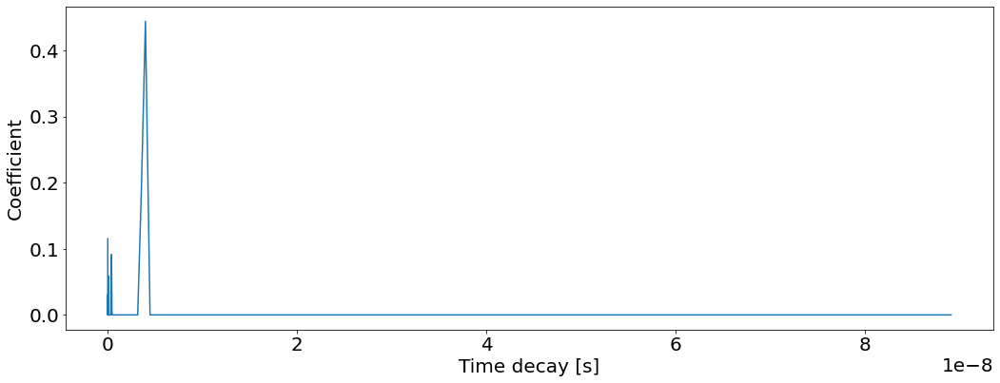

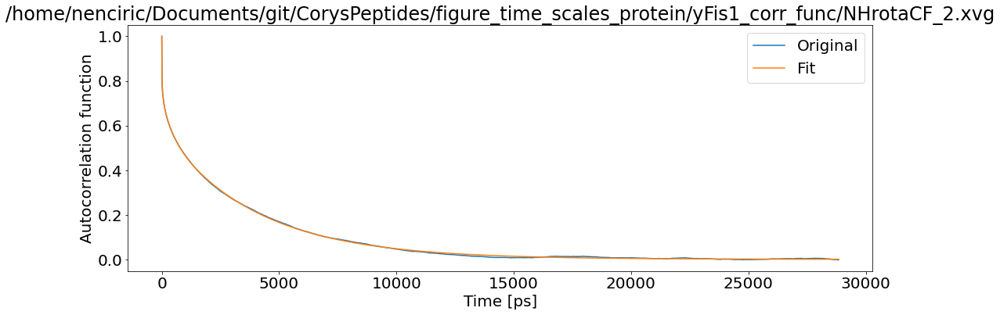

T1: 0.0015057998448461162 T2: 0.0011482524830106564 NOE: 0


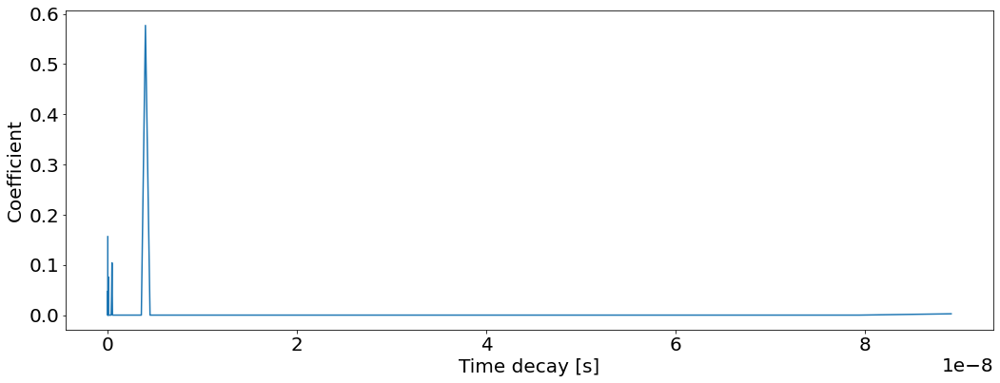

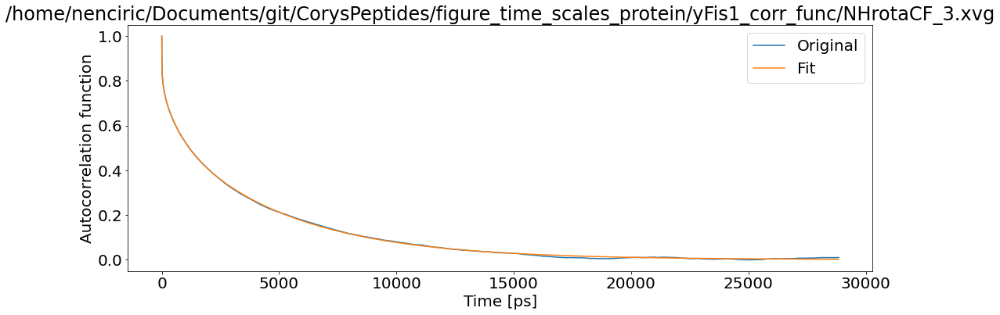

T1: 0.0013450440714281612 T2: 0.0009790928853155496 NOE: 0


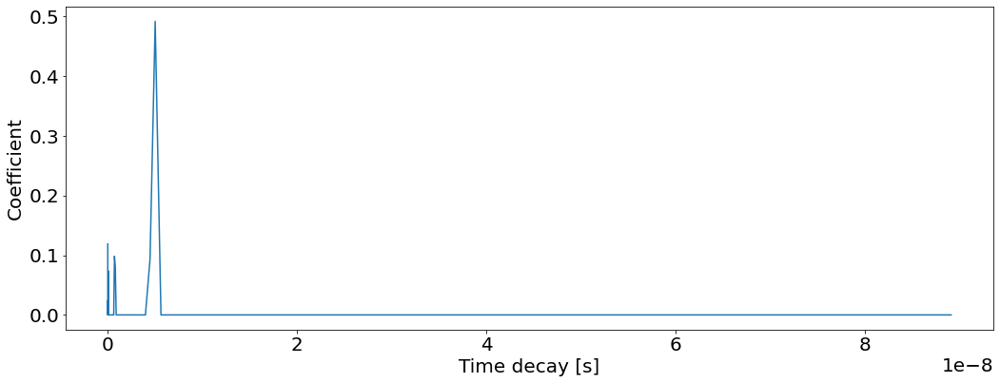

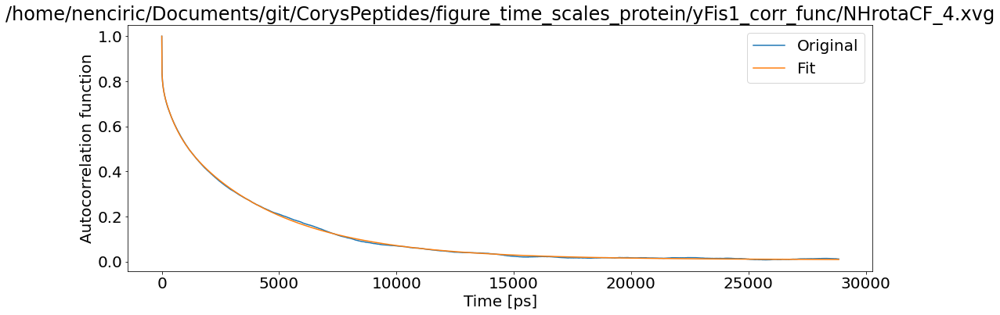

T1: 0.0013627986303467387 T2: 0.0009210153641270285 NOE: 0


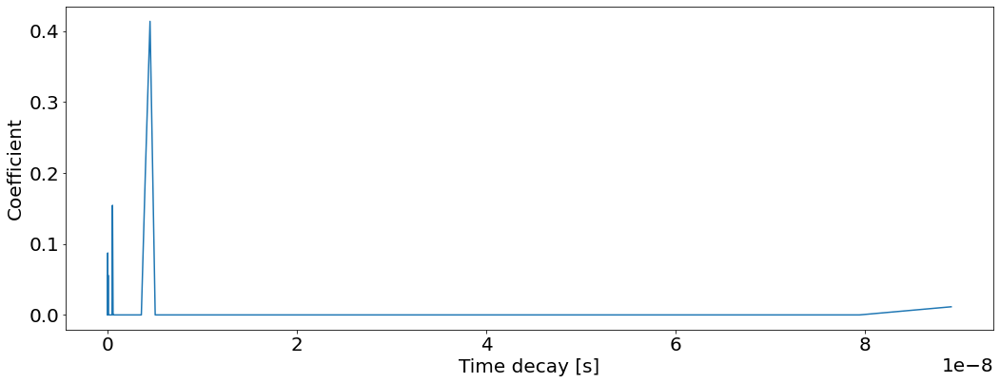

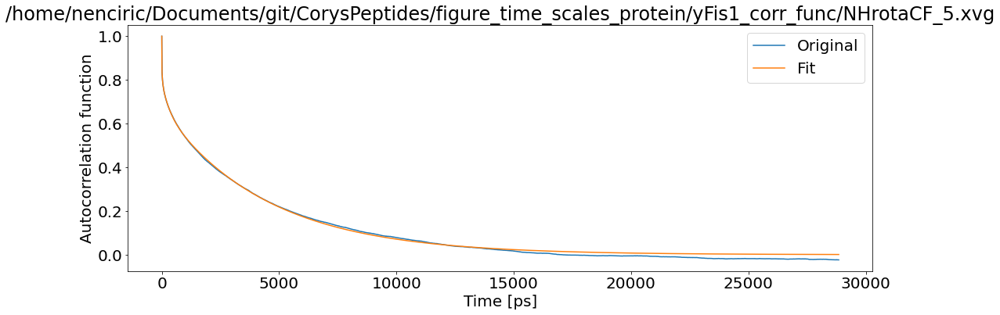

T1: 0.0012792137974771117 T2: 0.0009587024244393202 NOE: 0


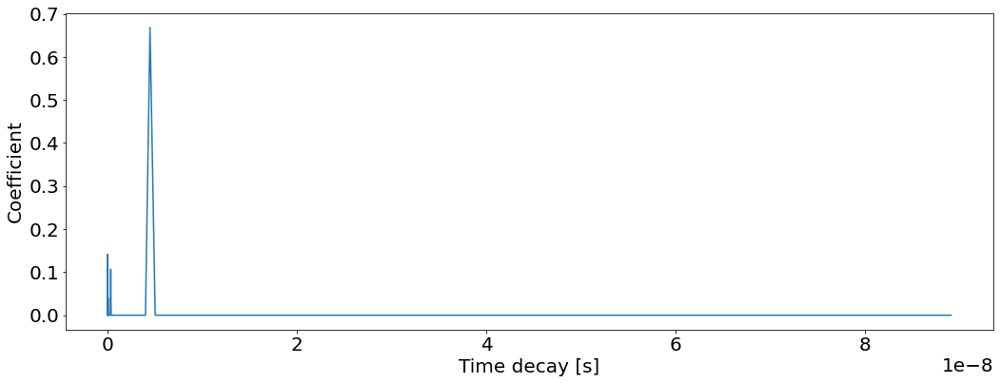

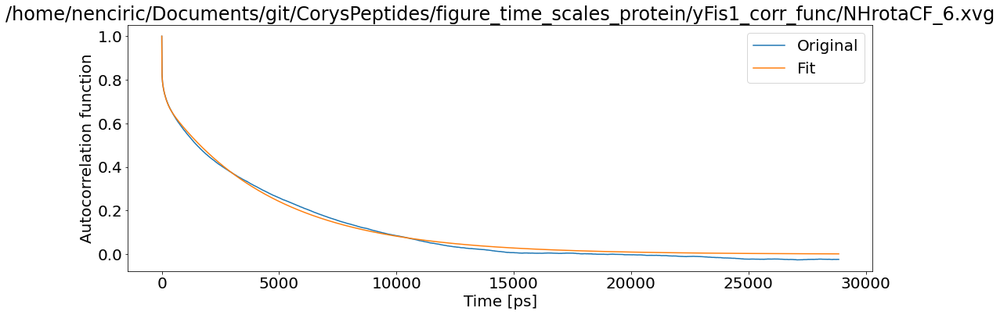

T1: 0.0012087612964842155 T2: 0.0008864391472727064 NOE: 0


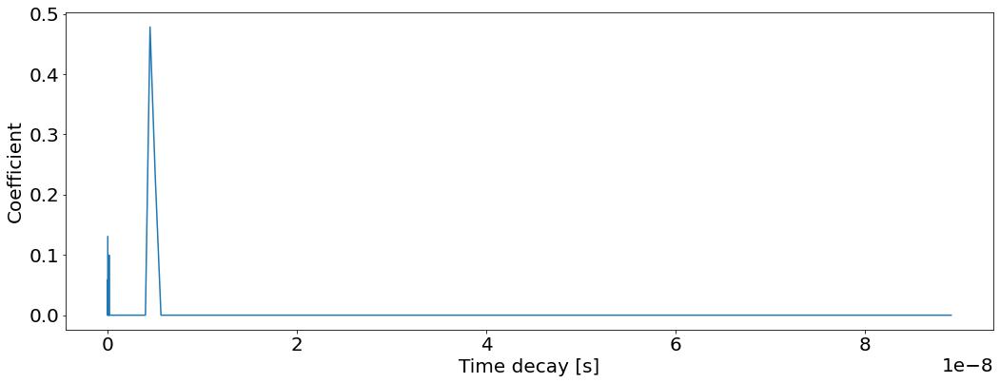

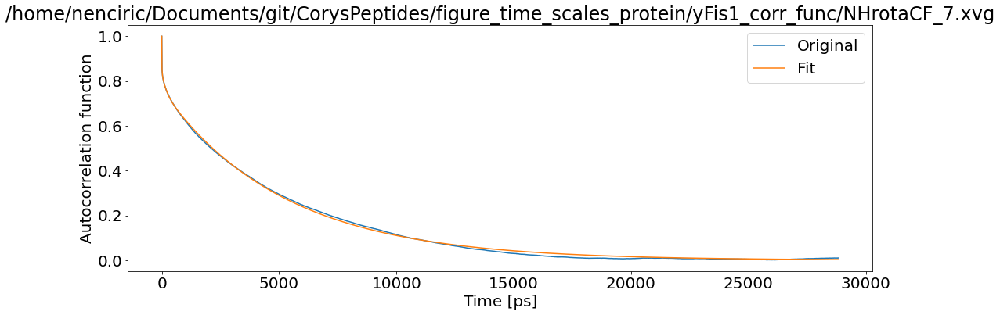

T1: 0.0011064552545158484 T2: 0.0007685606356648908 NOE: 0


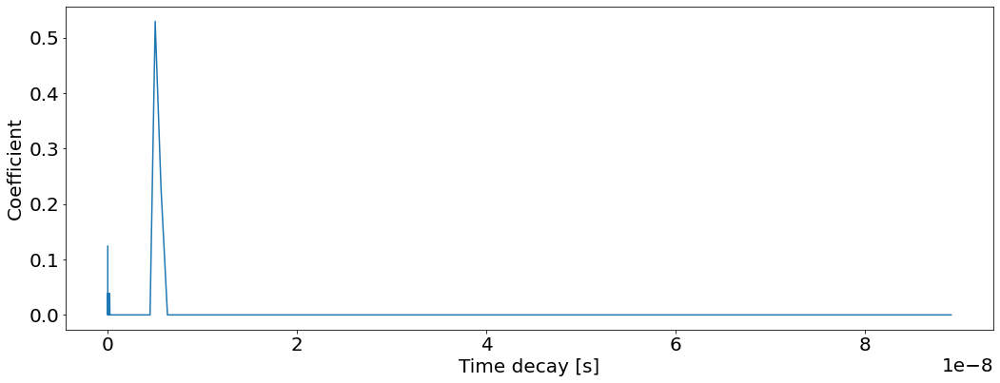

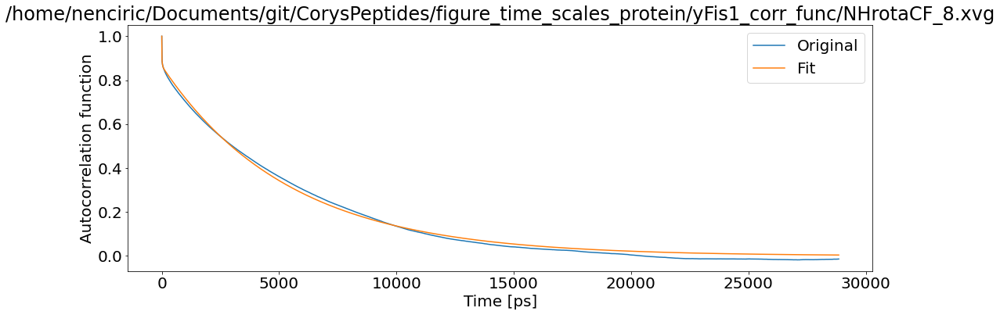

T1: 0.0009724724665724815 T2: 0.0006598985910758866 NOE: 0


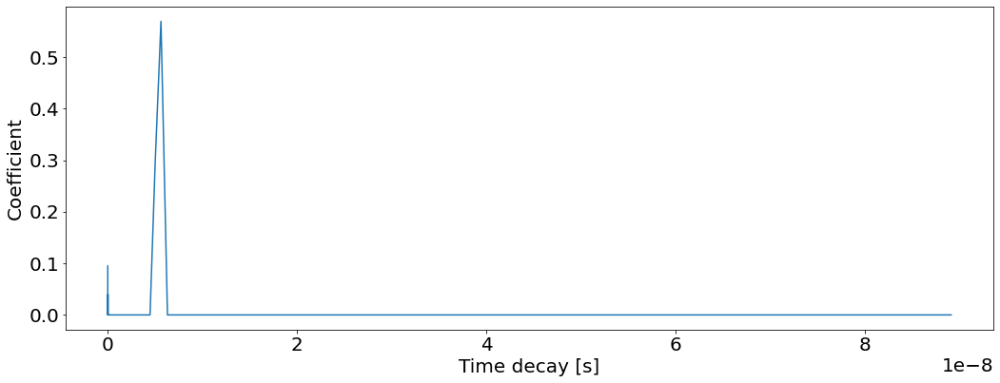

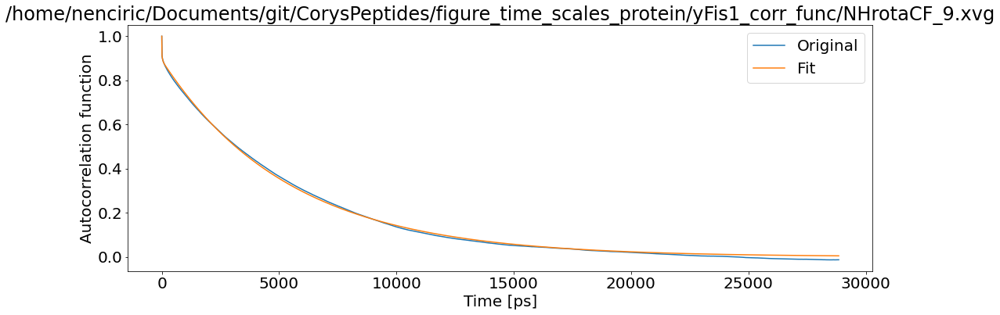

T1: 0.00094309377413162 T2: 0.0006381317720553502 NOE: 0


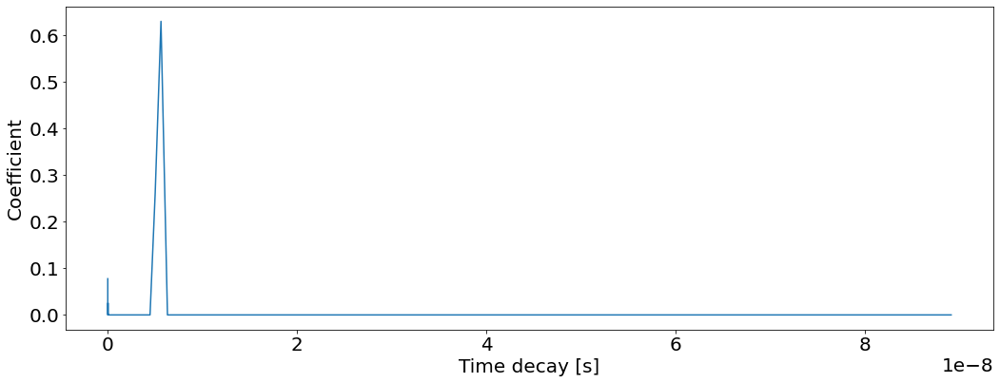

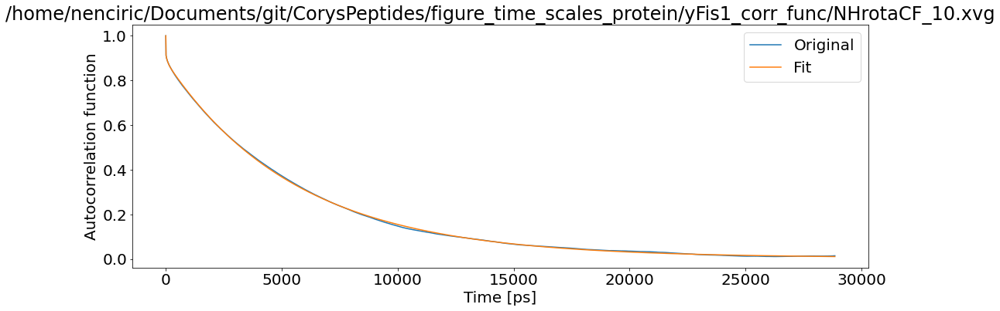

T1: 0.0009522125194350023 T2: 0.00059857012063719 NOE: 0


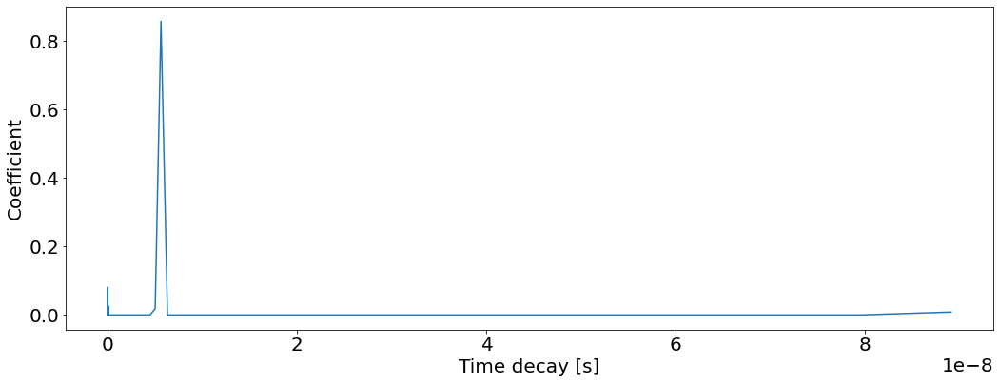

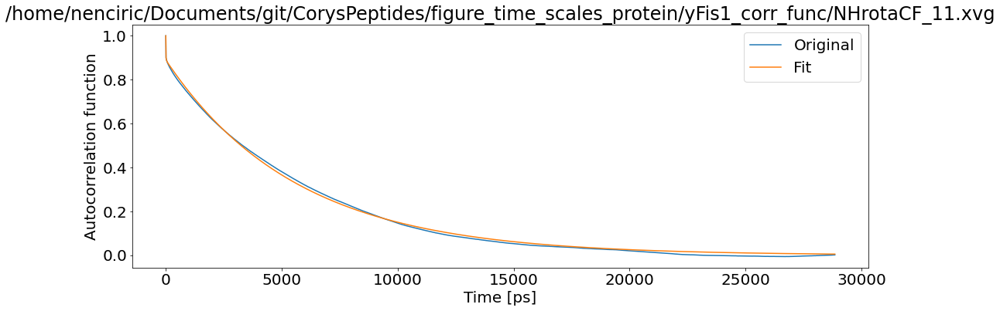

T1: 0.0009405451367094343 T2: 0.0006255817243503118 NOE: 0


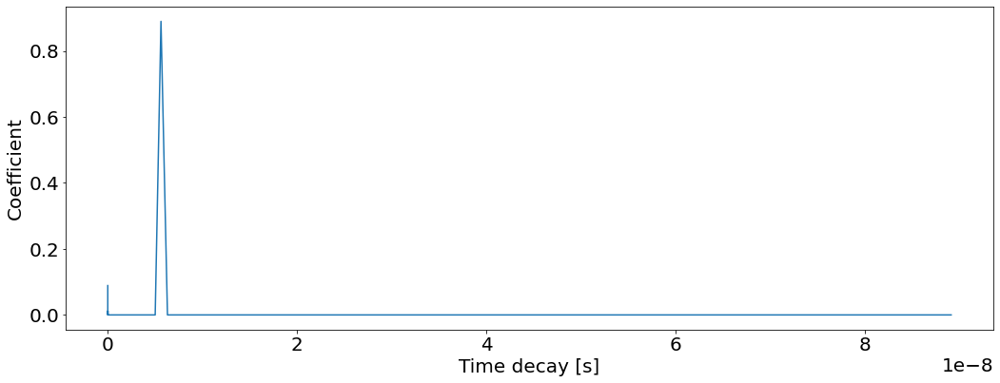

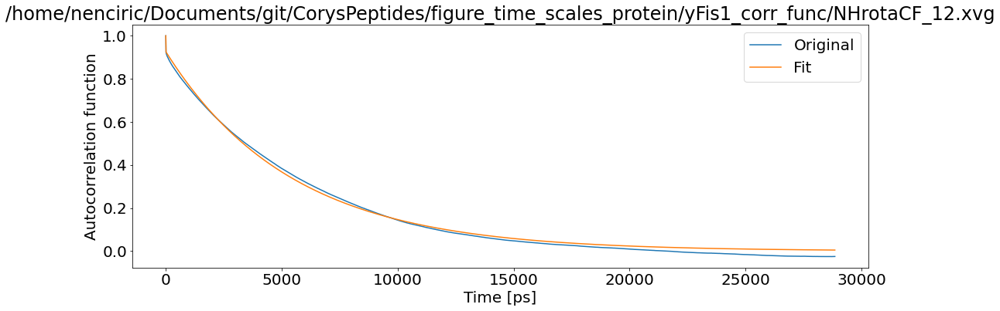

T1: 0.0009085338469558978 T2: 0.000616374187779166 NOE: 0


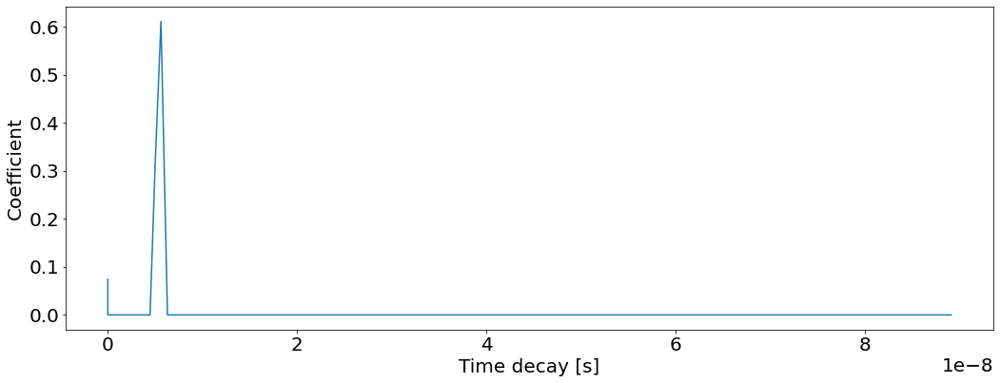

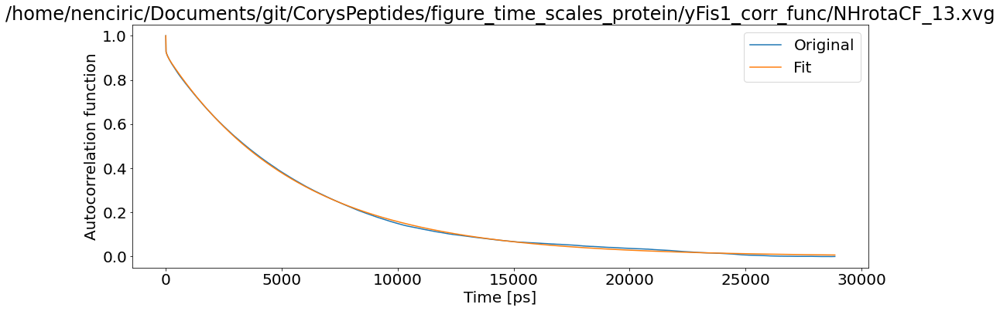

T1: 0.0009178154196348196 T2: 0.0006044798734028744 NOE: 0


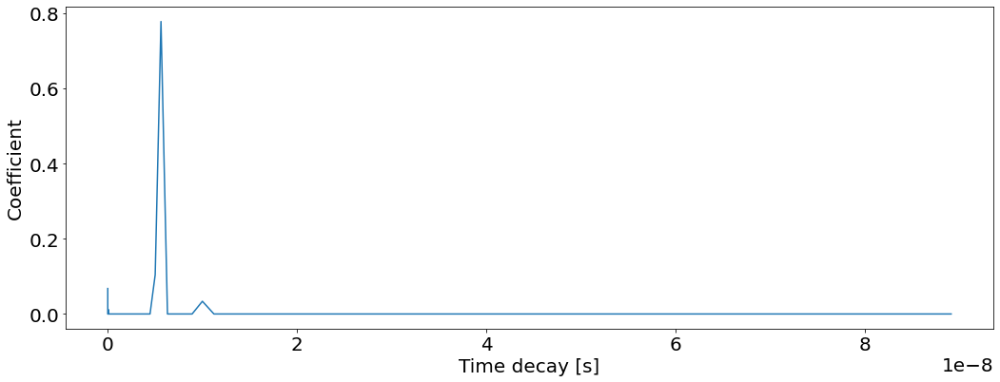

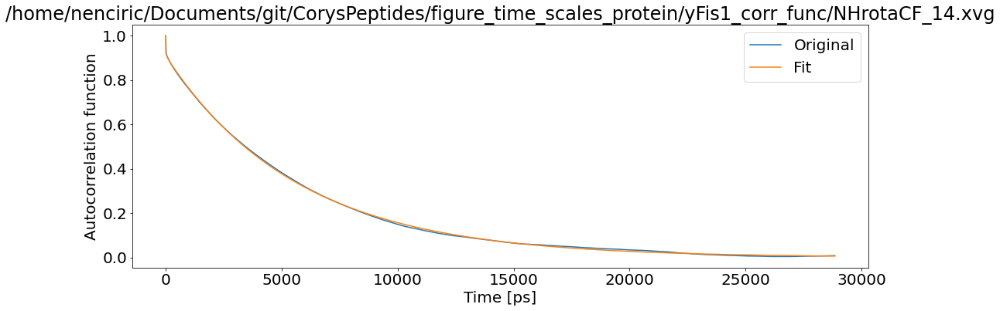

T1: 0.0009206776462085446 T2: 0.0006078895499838365 NOE: 0


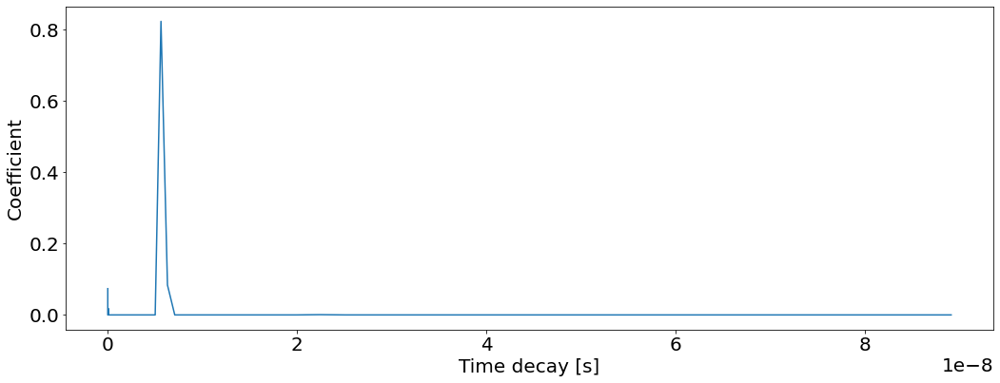

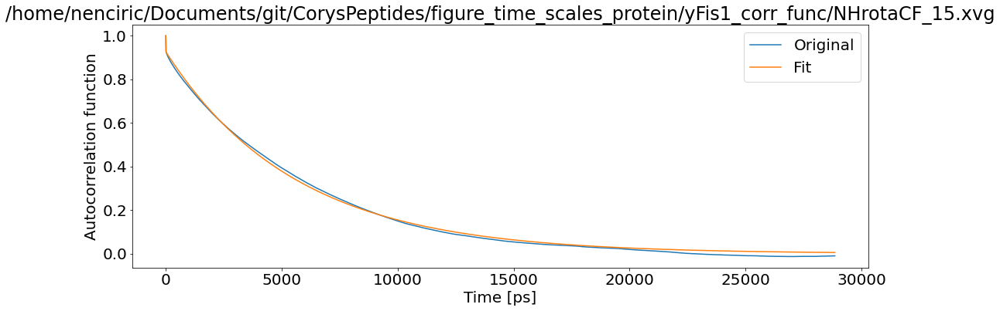

T1: 0.000904103054054793 T2: 0.0006034475207901888 NOE: 0


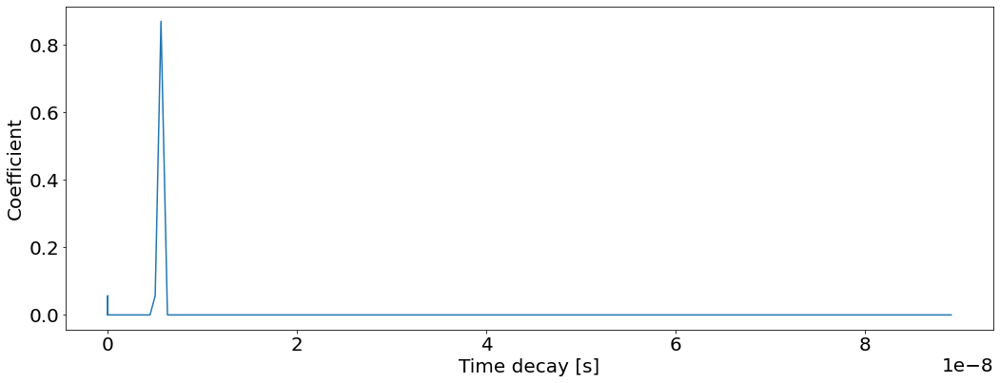

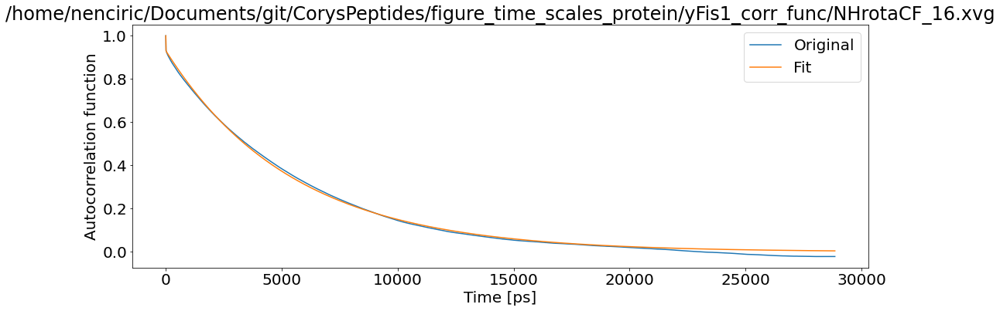

T1: 0.0009025585753492442 T2: 0.0006084267834460512 NOE: 0


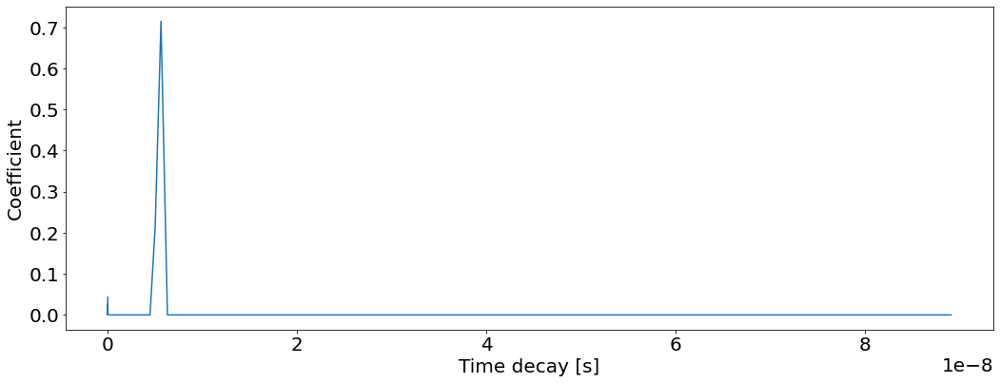

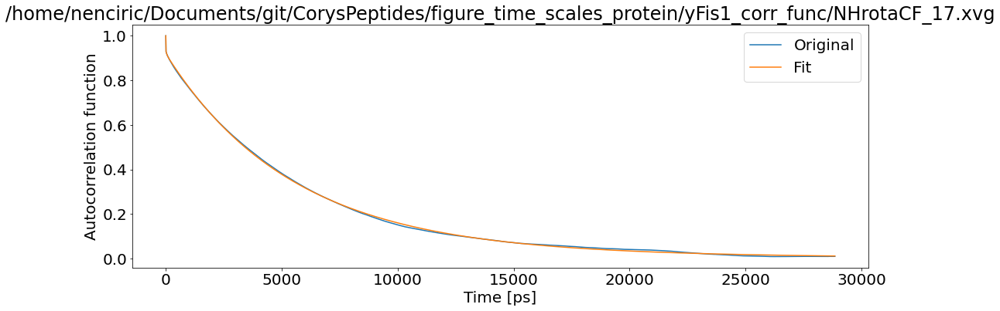

T1: 0.0009271215242959649 T2: 0.0005990527239251441 NOE: 0


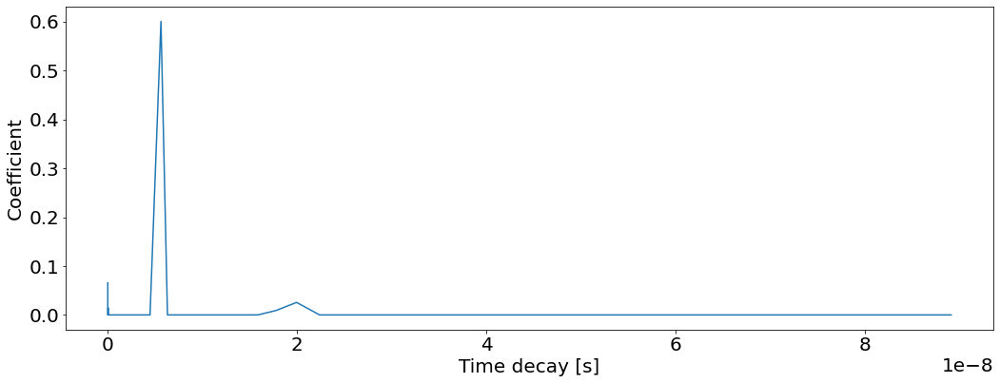

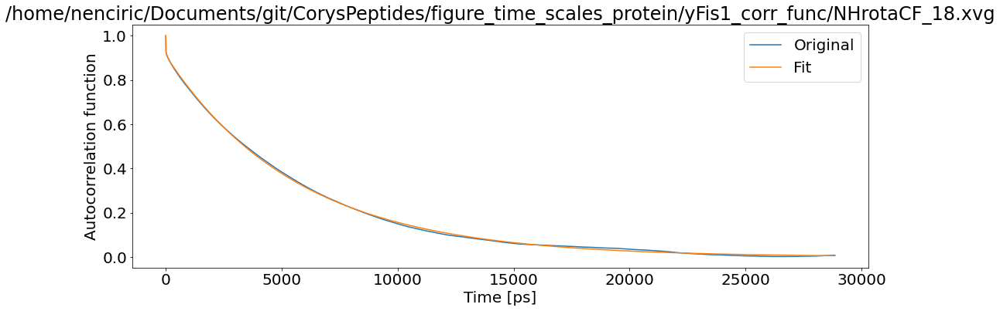

T1: 0.0009187604848663878 T2: 0.0006074587918802288 NOE: 0


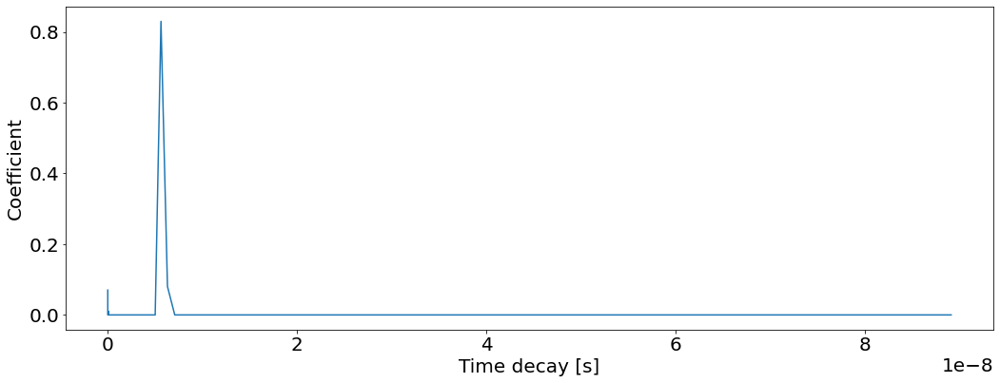

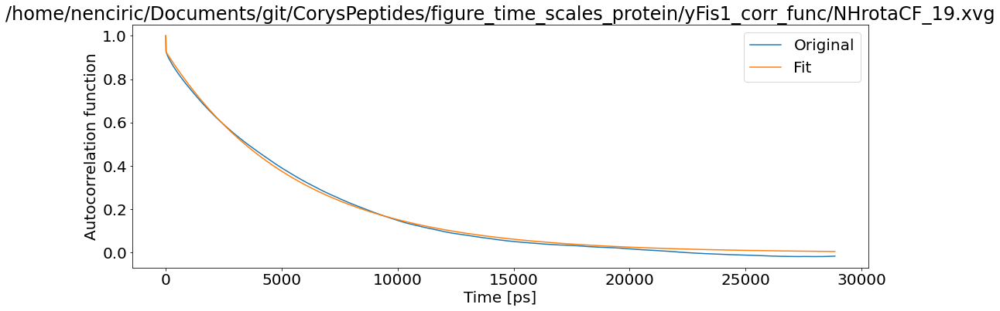

T1: 0.0009051052717783045 T2: 0.0006073398857671922 NOE: 0


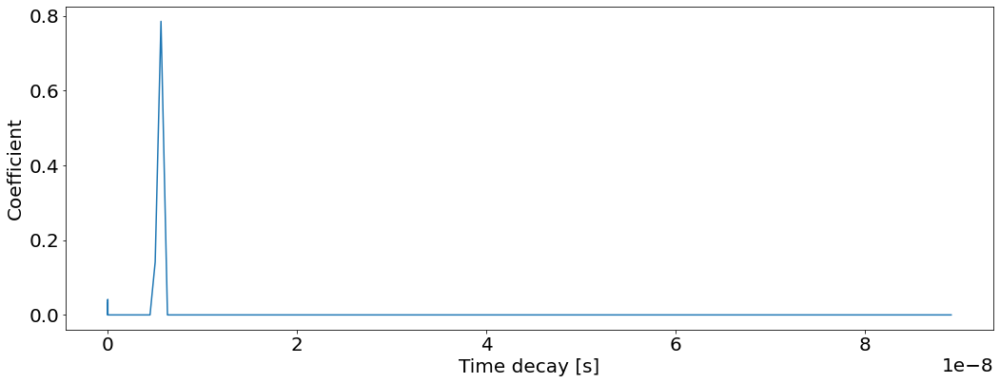

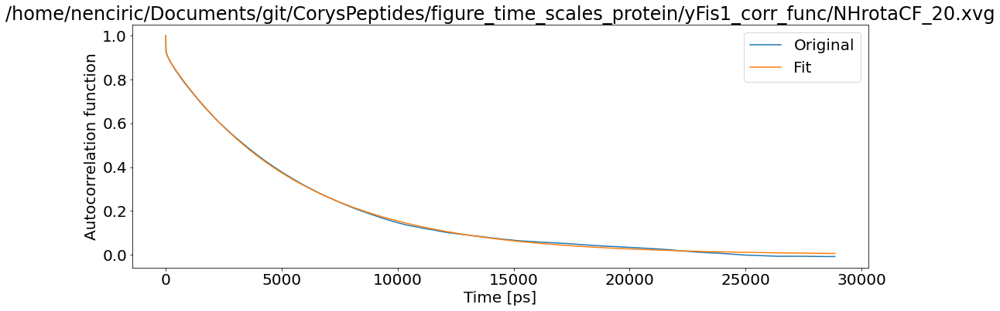

T1: 0.0009191703581113615 T2: 0.000611574545131128 NOE: 0


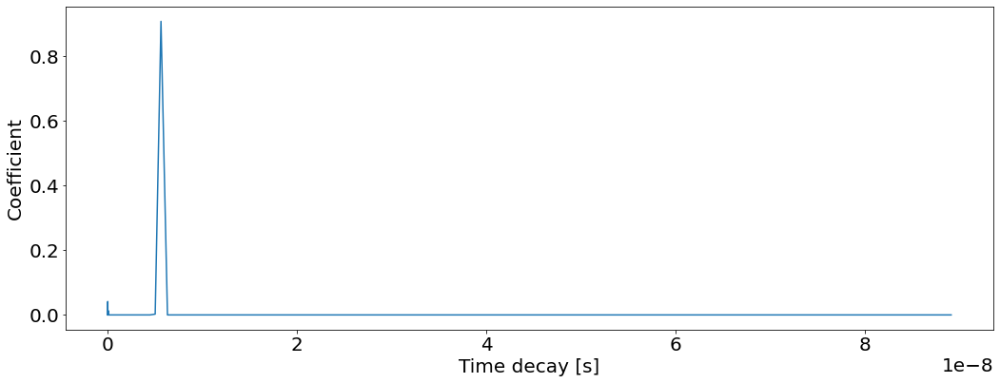

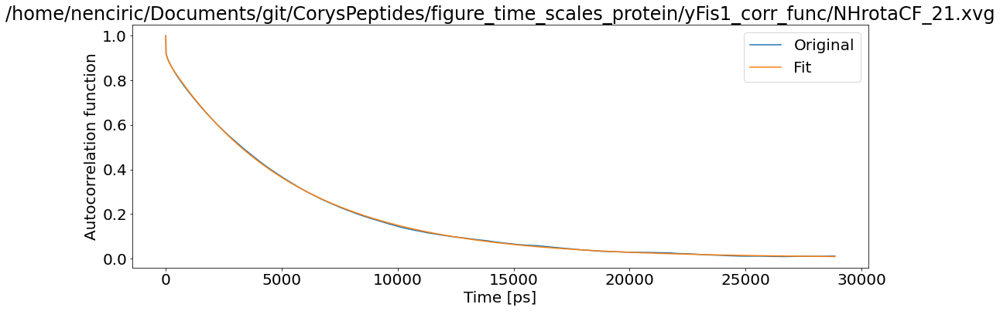

T1: 0.0009389844889469217 T2: 0.000610770490430875 NOE: 0


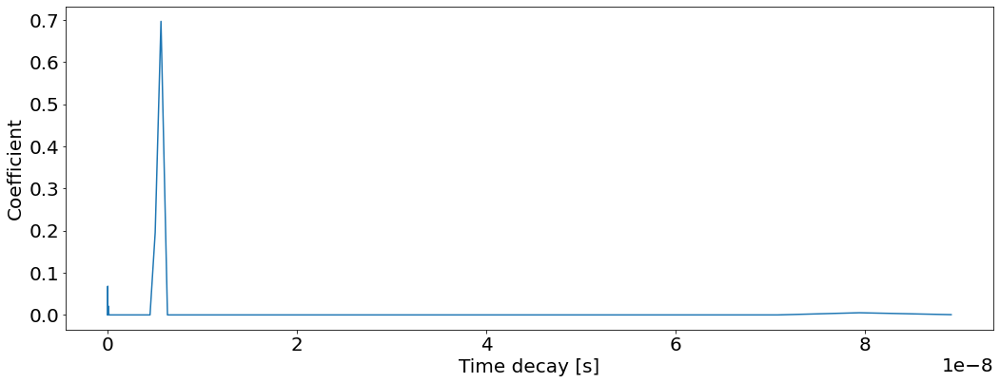

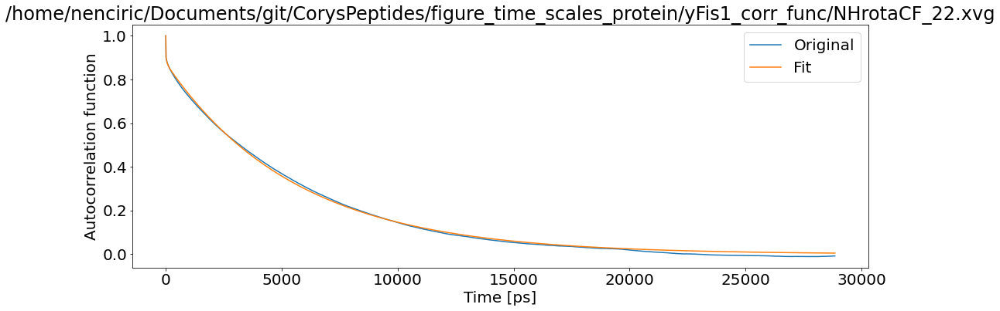

T1: 0.0009568200007258271 T2: 0.0006385378298191545 NOE: 0


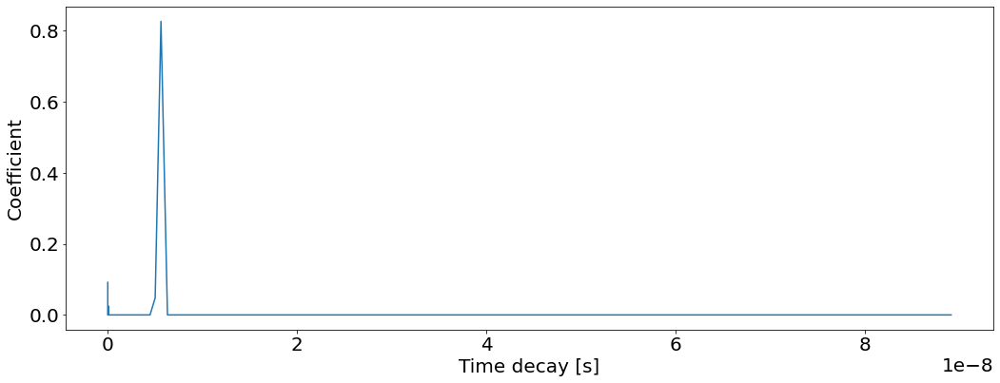

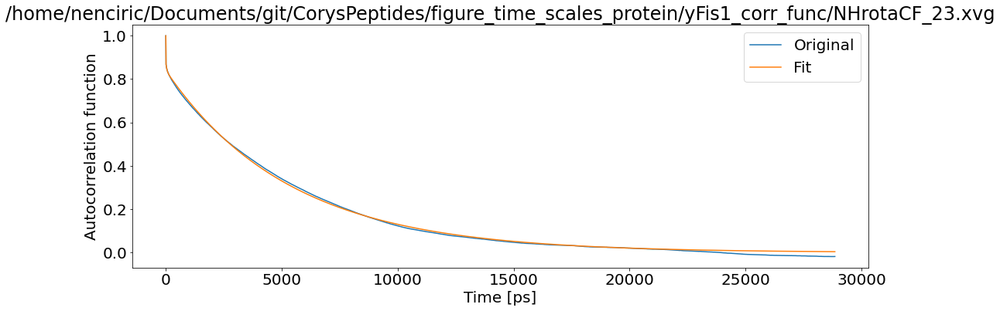

T1: 0.0010028019461651913 T2: 0.0006836849321364284 NOE: 0


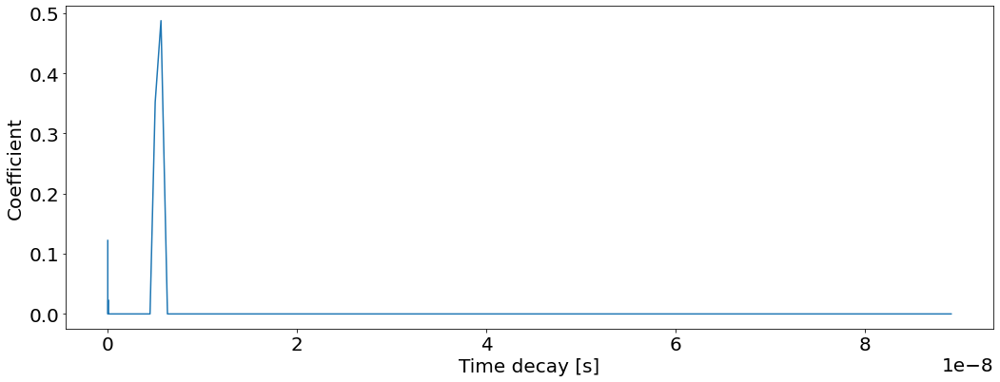

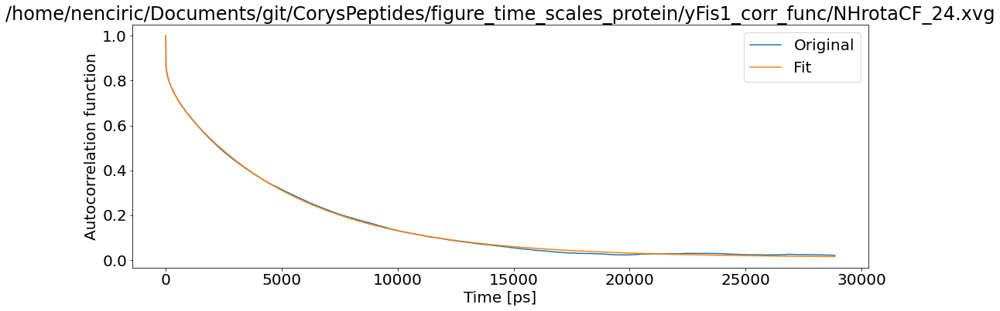

T1: 0.0011023750565642457 T2: 0.0006674017908712879 NOE: 0


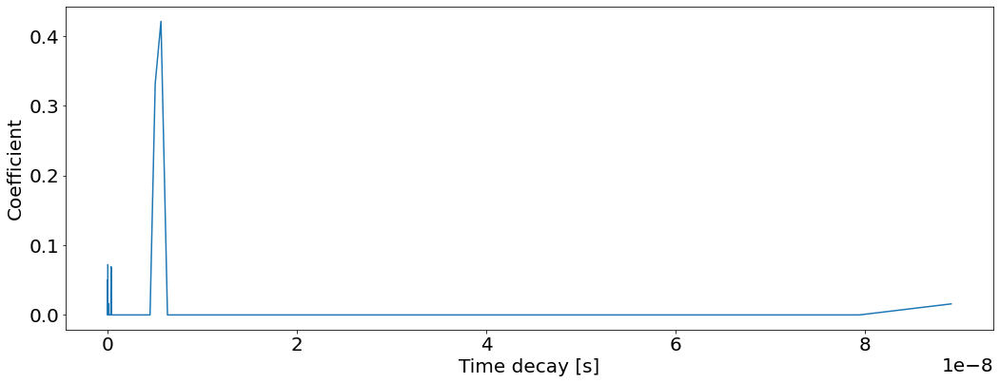

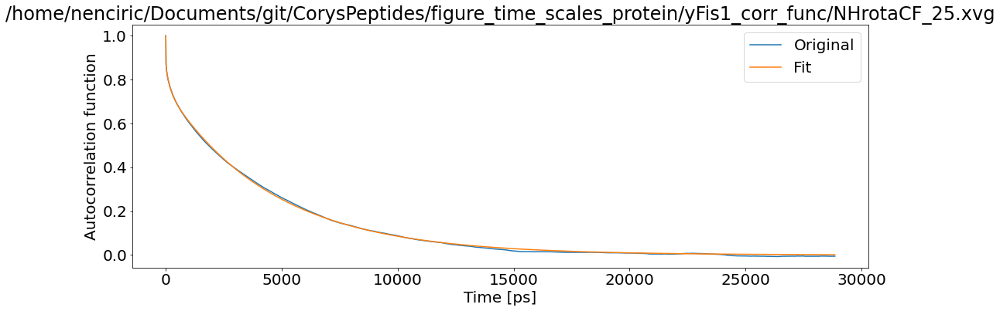

T1: 0.0011371934787134707 T2: 0.0008392093630982352 NOE: 0


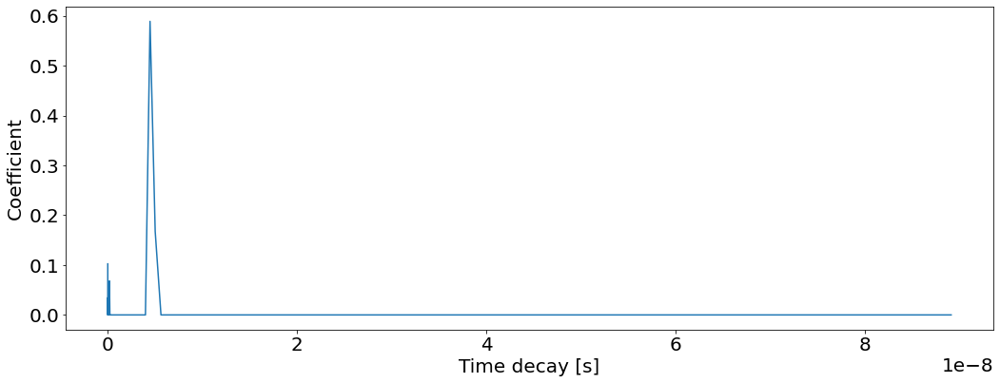

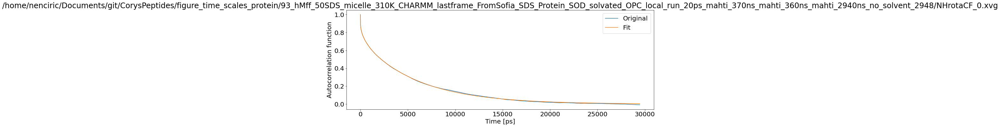

T1: 0.0011223620565809242 T2: 0.0007322344030755996 NOE: 0


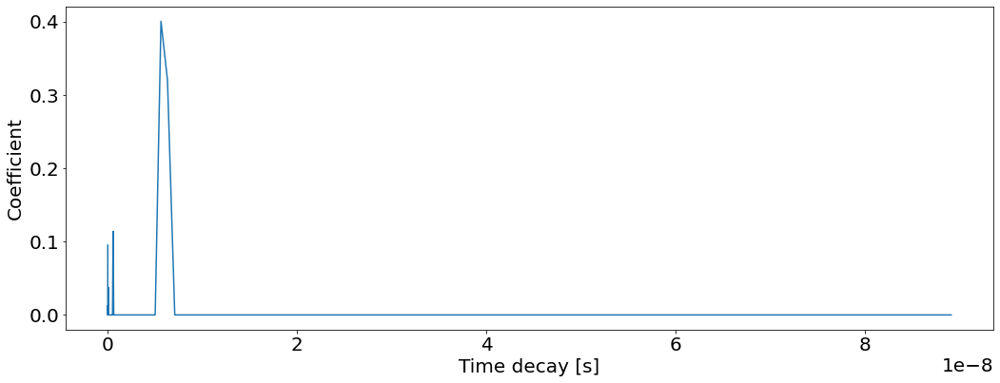

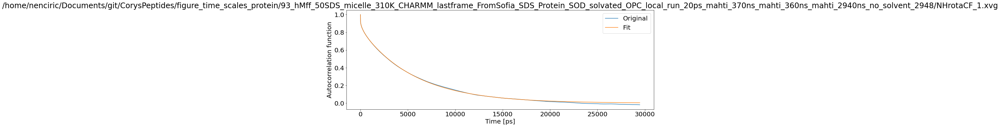

T1: 0.0009892063238146715 T2: 0.0006600027012660857 NOE: 0


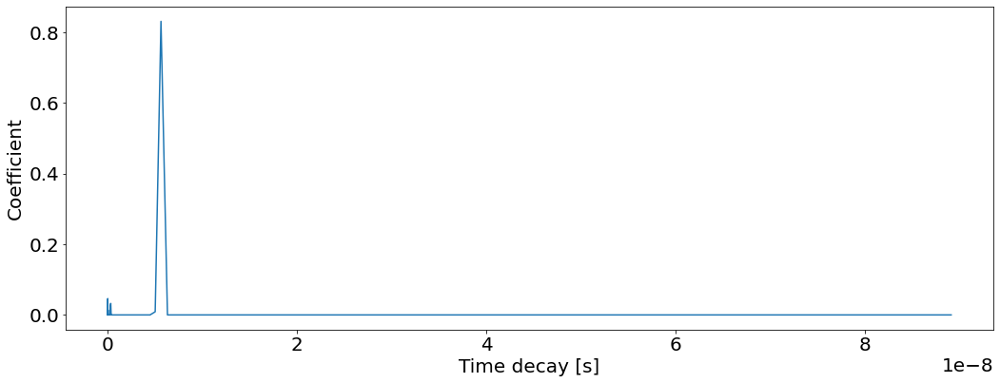

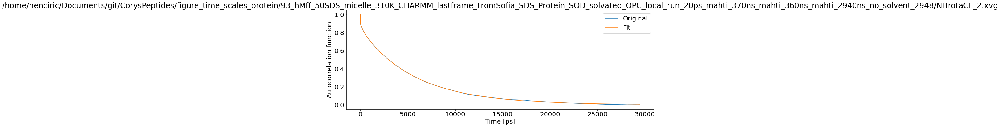

T1: 0.0009945199677825643 T2: 0.0006480324663380522 NOE: 0


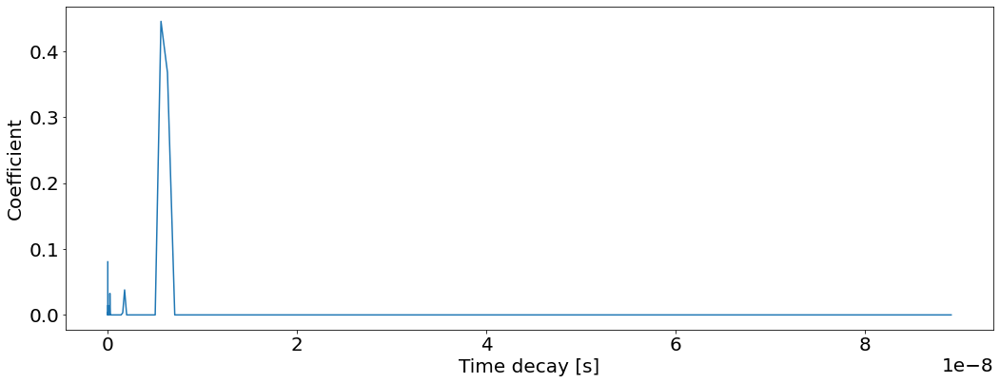

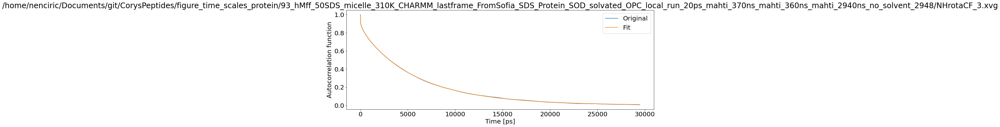

T1: 0.0010061320495586303 T2: 0.0006323050345651588 NOE: 0


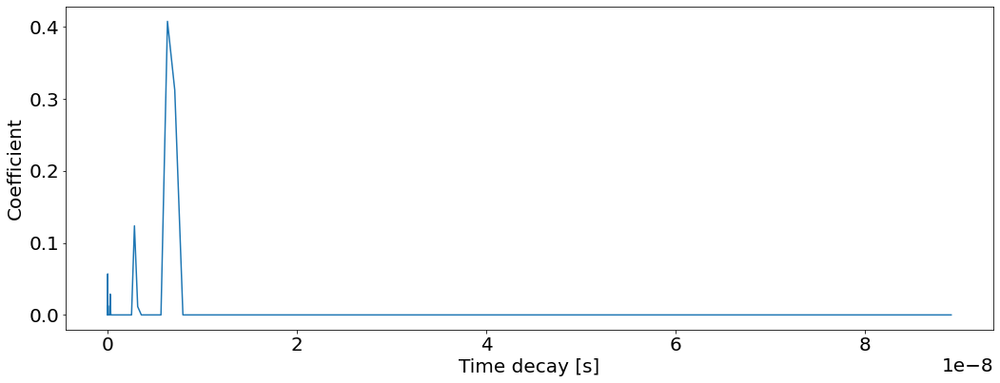

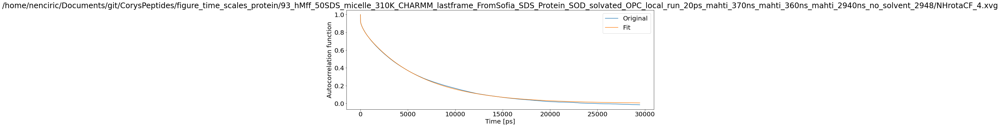

T1: 0.0009679626121972905 T2: 0.0006234473656023912 NOE: 0


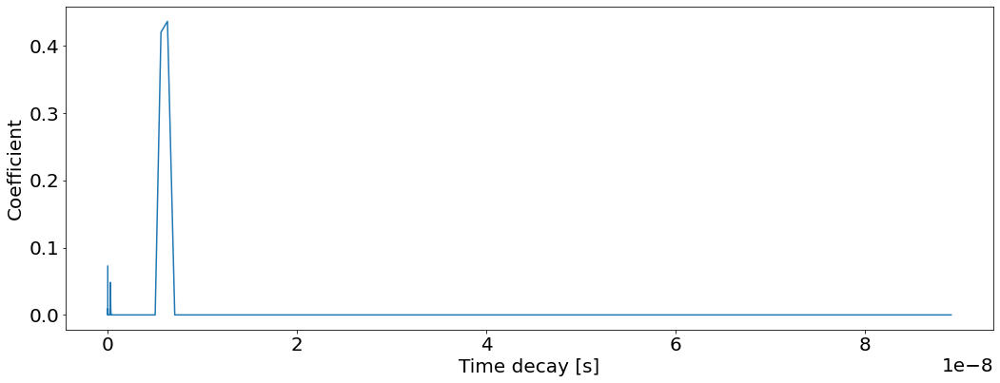

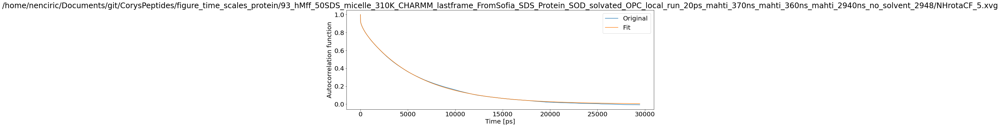

T1: 0.0009601110119576046 T2: 0.0006309319553153459 NOE: 0


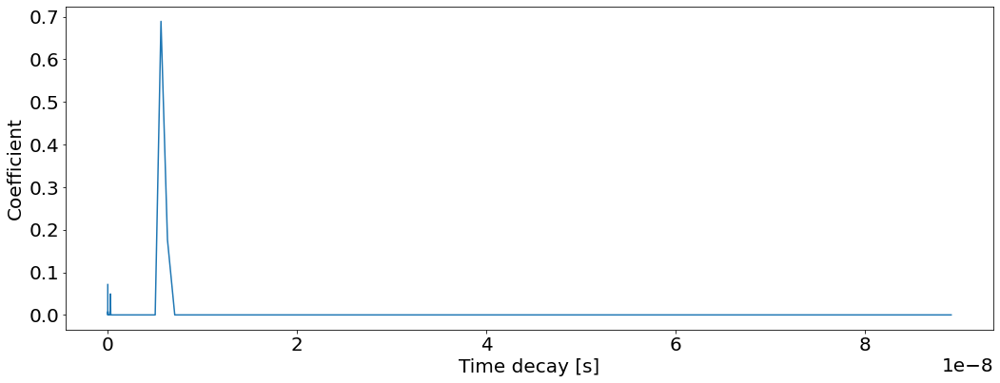

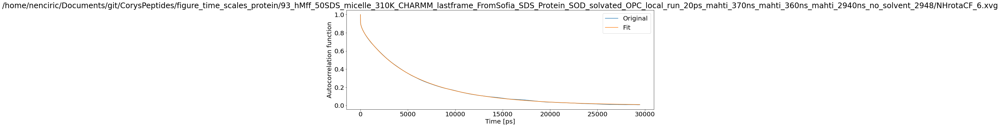

T1: 0.0010249315142890451 T2: 0.0006421782896159468 NOE: 0


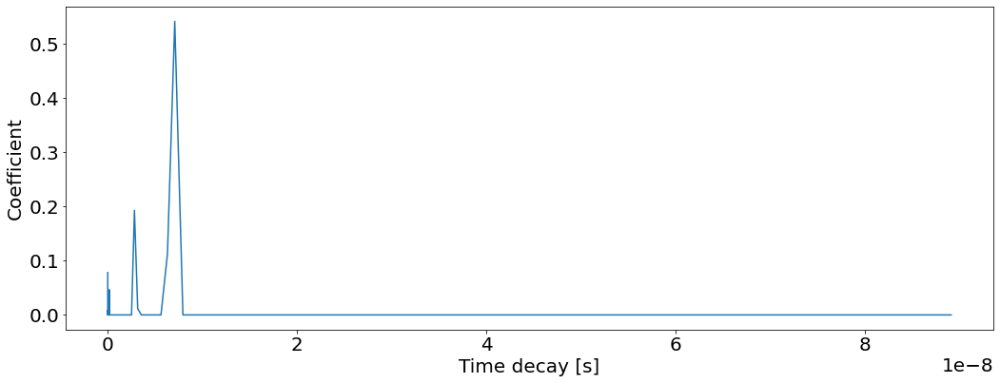

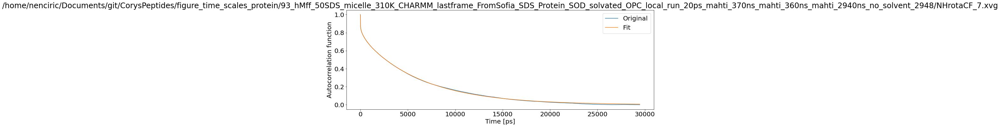

T1: 0.001074396074868279 T2: 0.0006737933065616945 NOE: 0


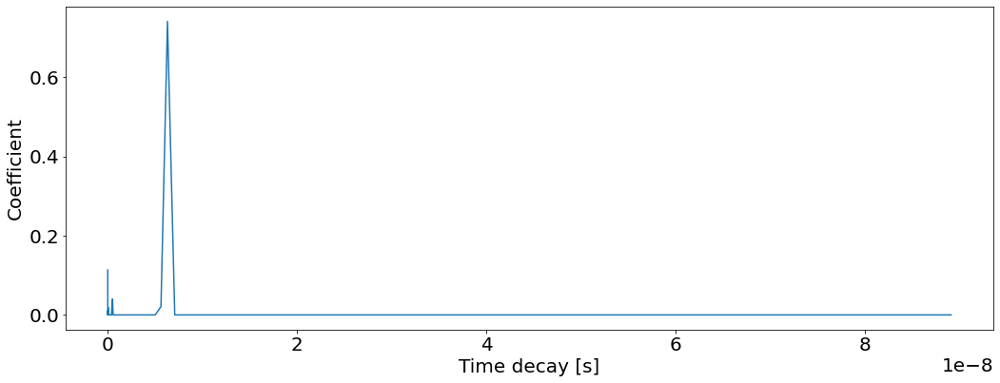

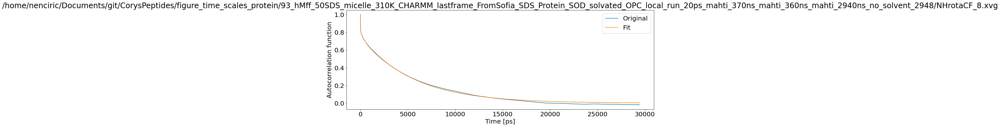

T1: 0.0011034553159154404 T2: 0.0007438989487517609 NOE: 0


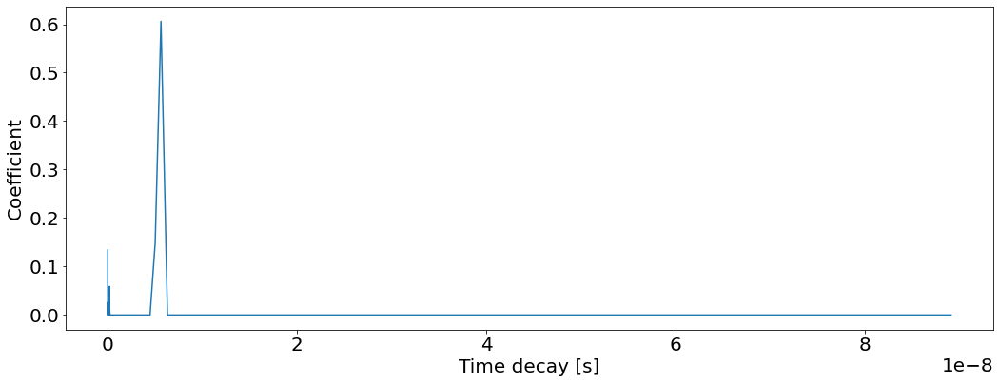

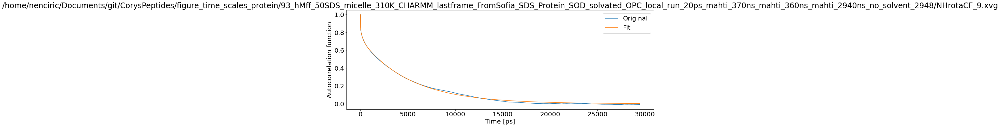

T1: 0.0011512843862491163 T2: 0.0008027377964334319 NOE: 0


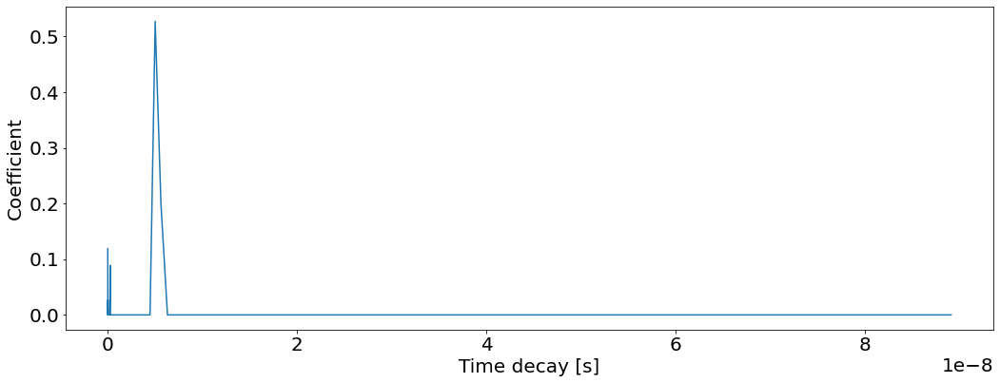

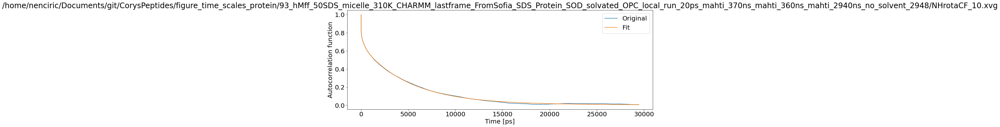

T1: 0.0012624465497068943 T2: 0.0008321645636155651 NOE: 0


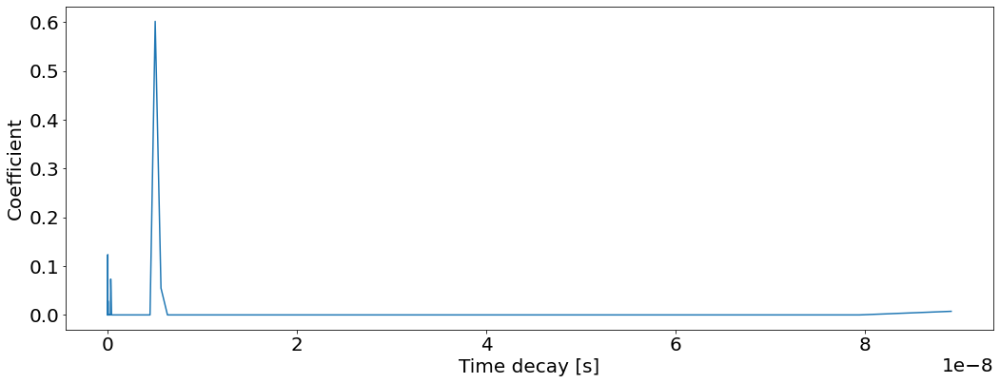

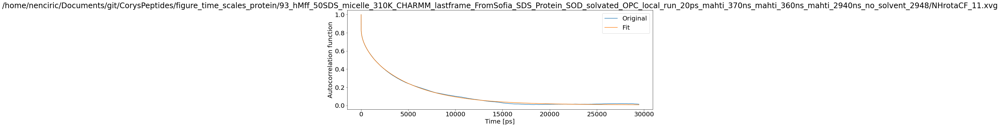

T1: 0.0012680211332594575 T2: 0.0008367888563535571 NOE: 0


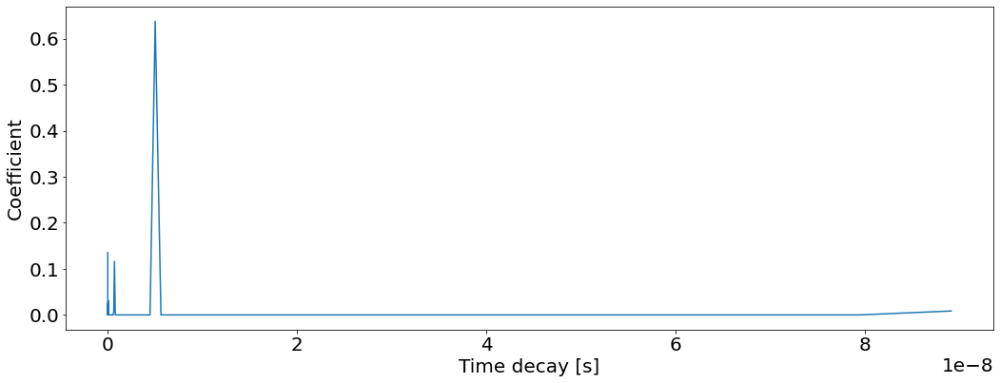

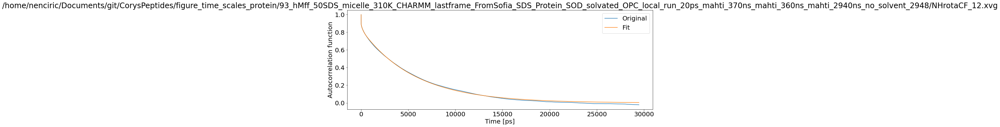

T1: 0.000998363904549983 T2: 0.0006650296360849817 NOE: 0


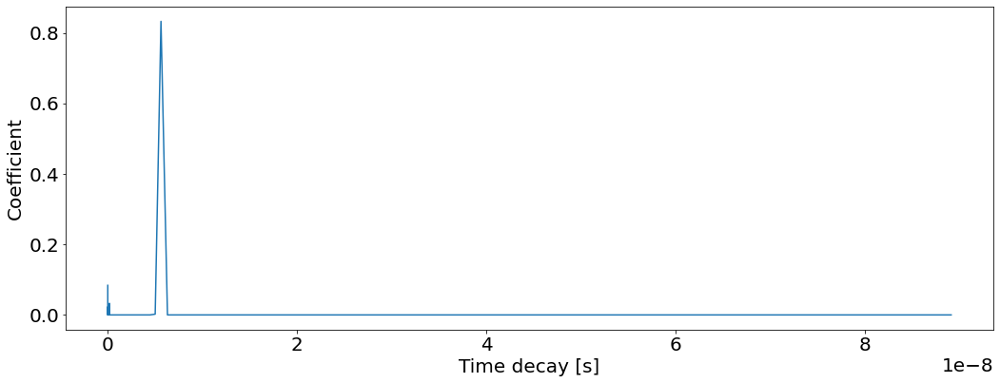

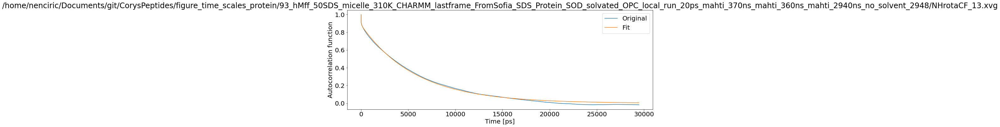

T1: 0.0009451155643038351 T2: 0.0006183476559647159 NOE: 0


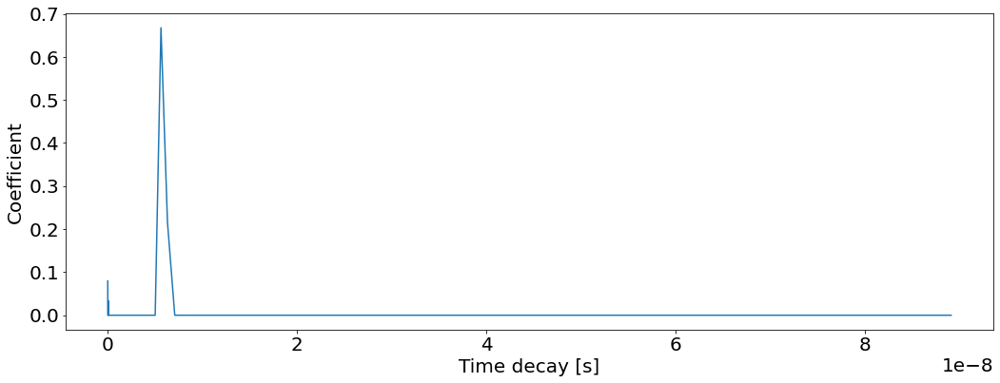

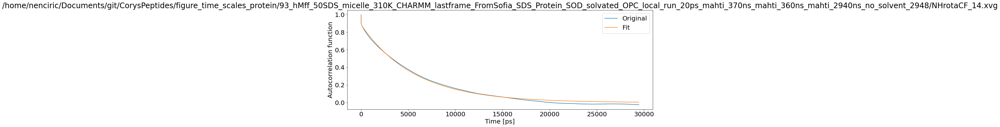

T1: 0.0009441927199311181 T2: 0.0006261469177480215 NOE: 0


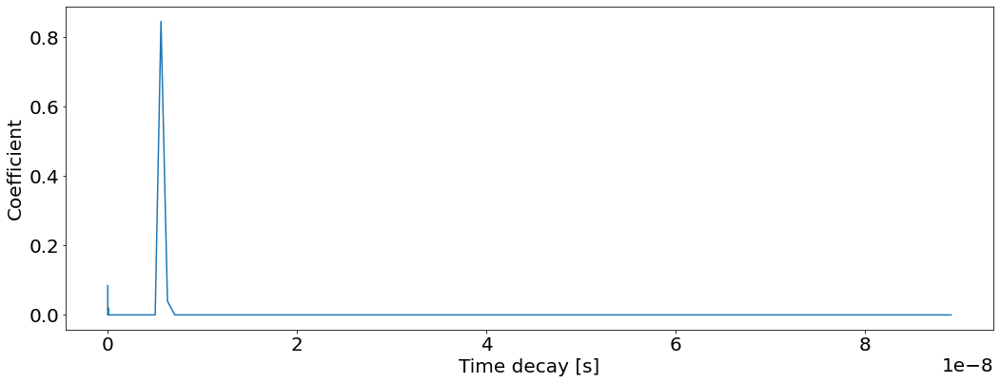

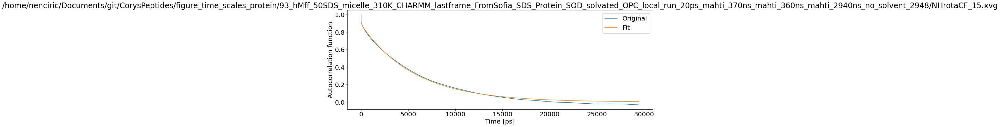

T1: 0.0009393062563494473 T2: 0.0006254067859791963 NOE: 0


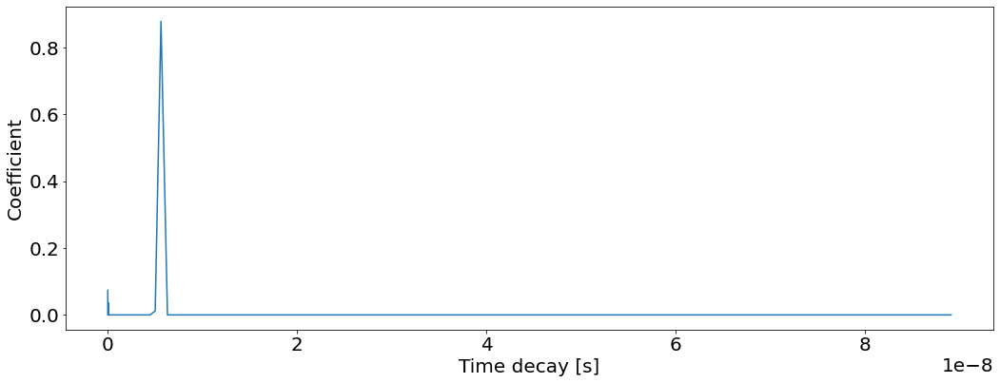

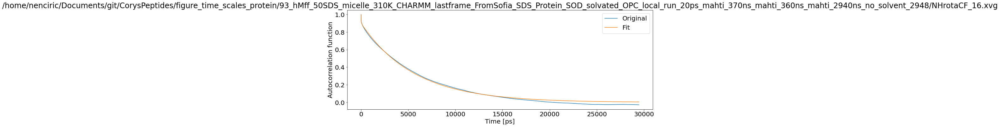

T1: 0.0009275712748215475 T2: 0.000617051417054272 NOE: 0


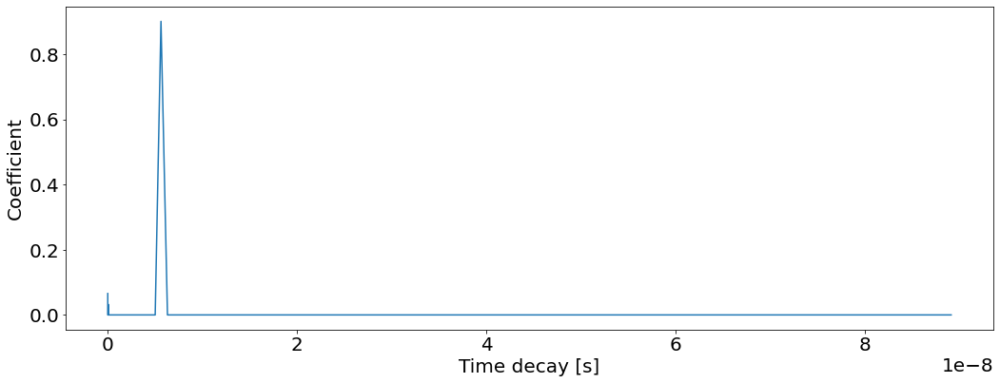

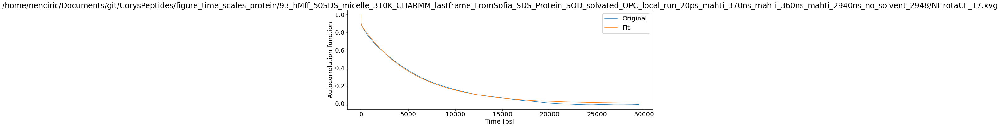

T1: 0.000944754902611956 T2: 0.0006270291103359239 NOE: 0


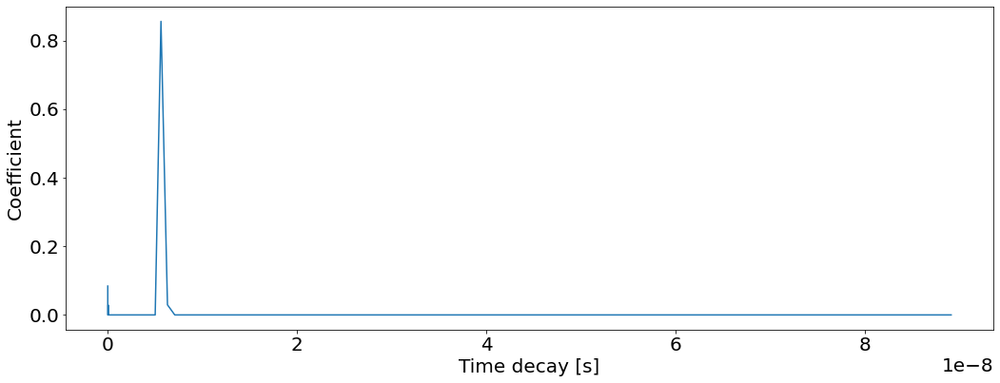

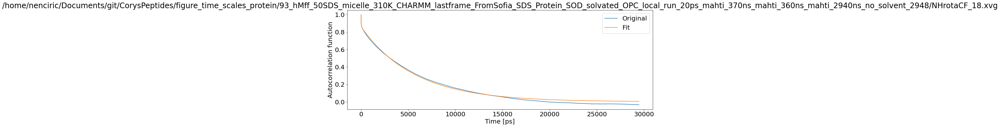

T1: 0.0009715804064068762 T2: 0.0006463862296610315 NOE: 0


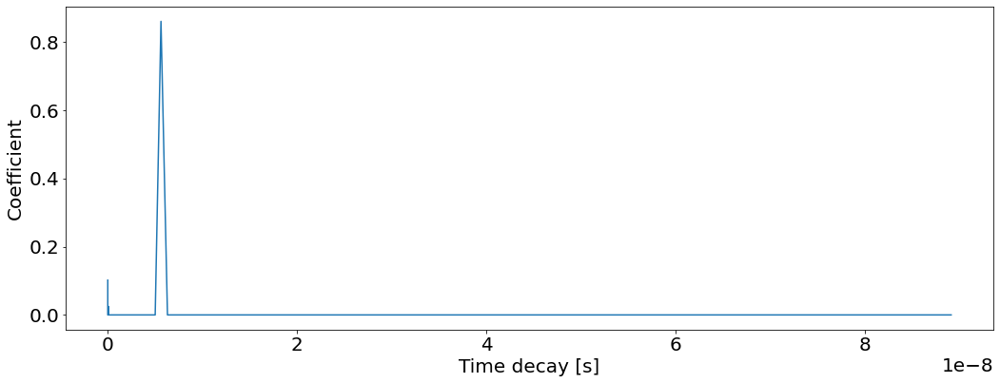

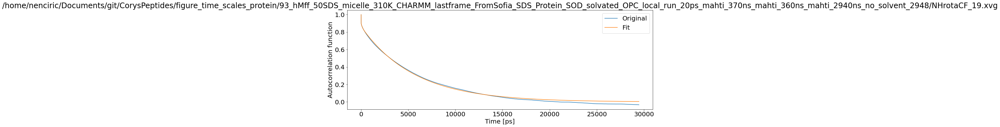

T1: 0.0009668099008010052 T2: 0.0006433904902705724 NOE: 0


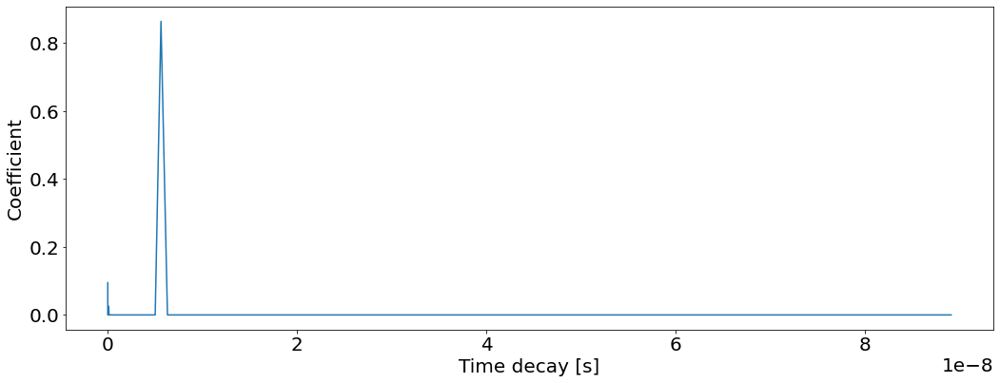

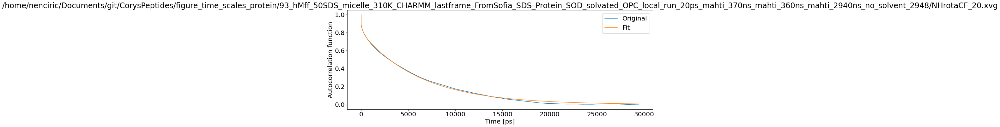

T1: 0.0010235453243880013 T2: 0.0006403733774426494 NOE: 0


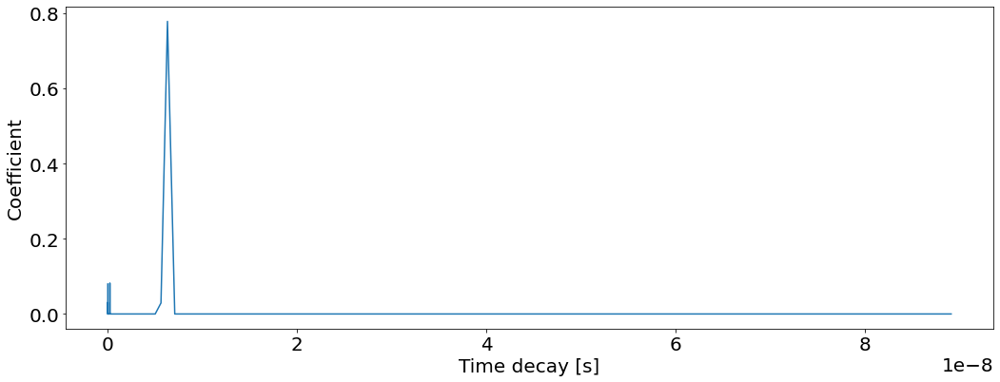

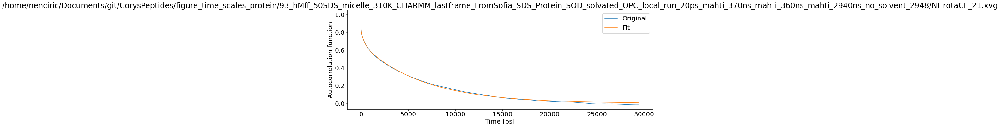

T1: 0.001202687591990959 T2: 0.0007469176348972175 NOE: 0


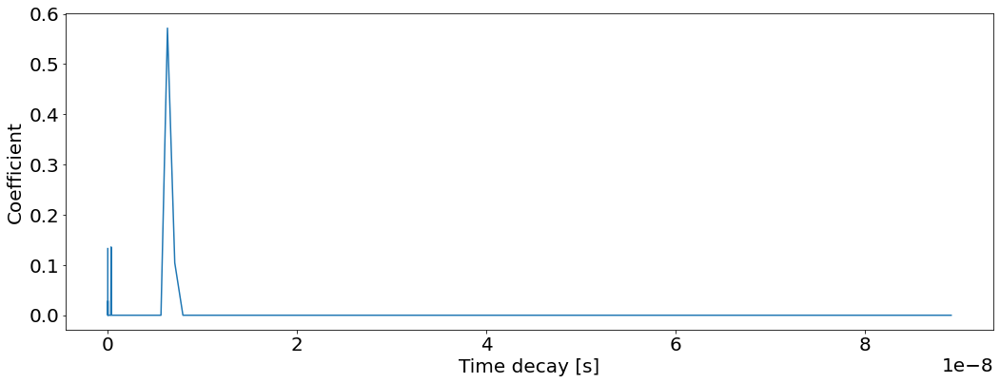

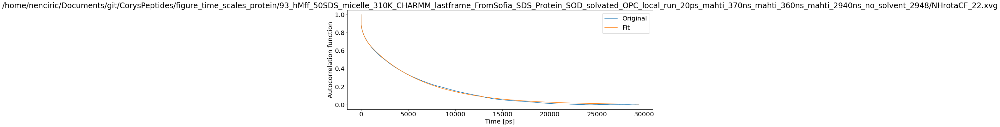

T1: 0.00106984806990577 T2: 0.0006925264818959909 NOE: 0


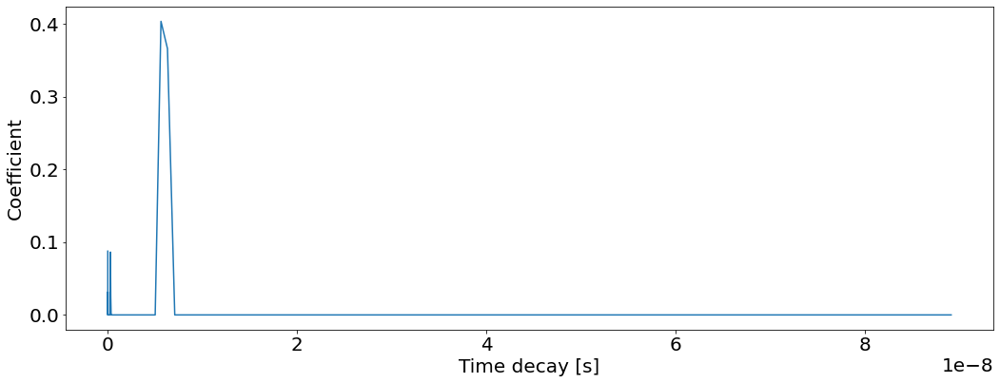

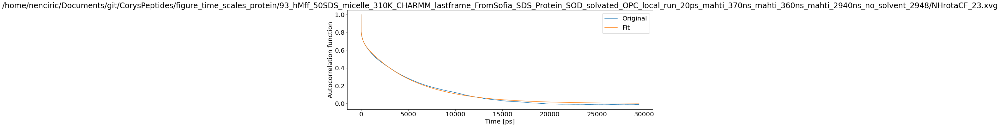

T1: 0.0011839032348491723 T2: 0.0008100966560418038 NOE: 0


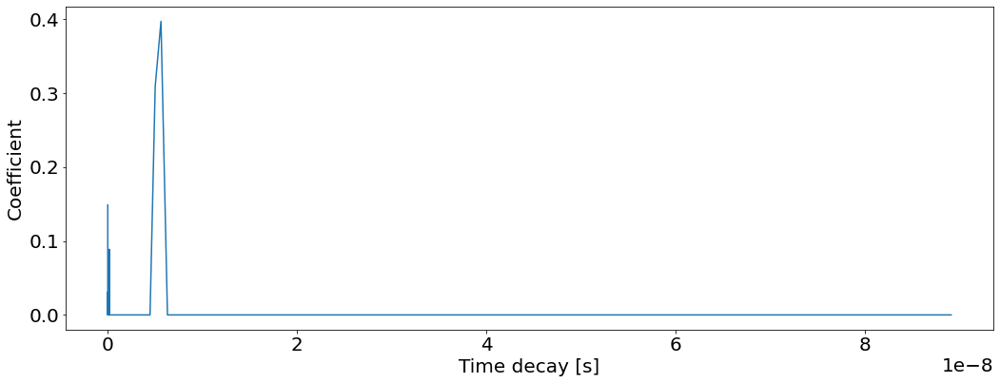

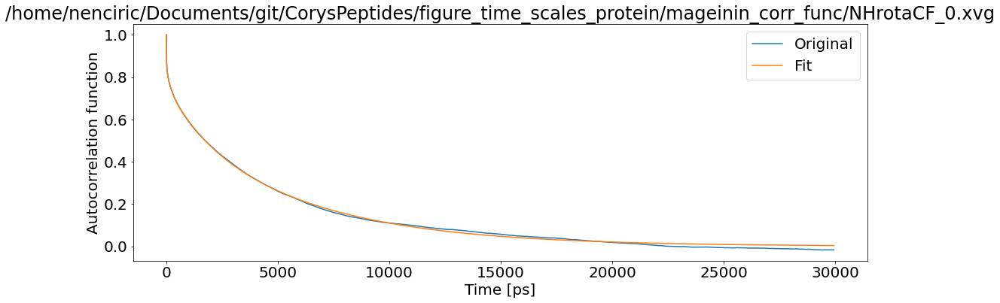

T1: 0.0012182394789465765 T2: 0.0008223168744447096 NOE: 0


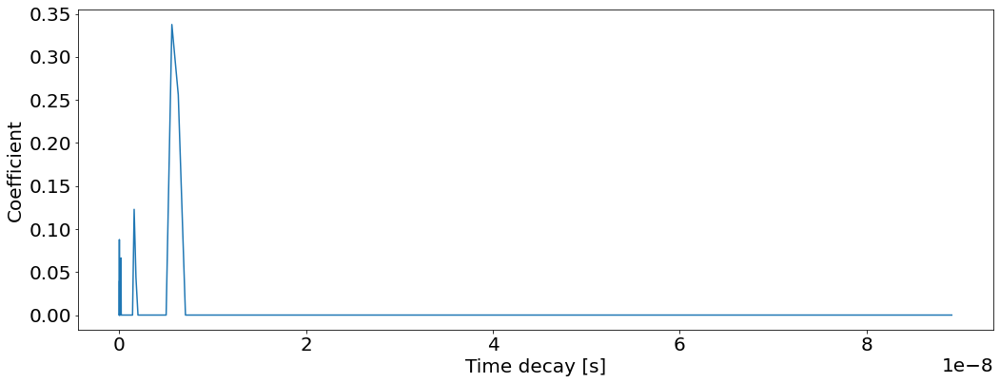

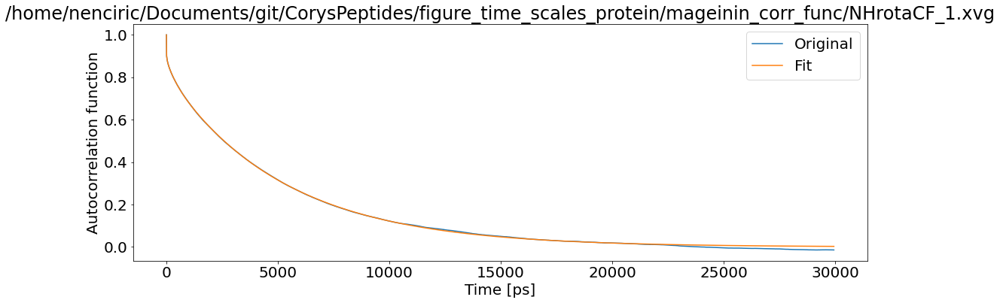

T1: 0.0010217151210484233 T2: 0.0007061345761223109 NOE: 0


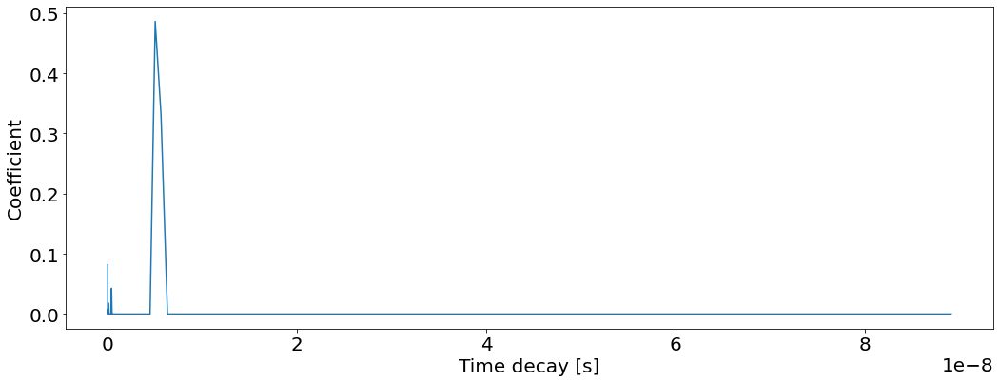

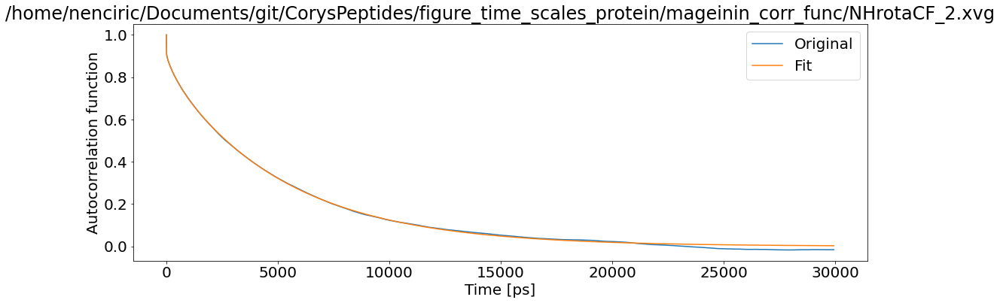

T1: 0.001000877361450782 T2: 0.0006921505398911193 NOE: 0


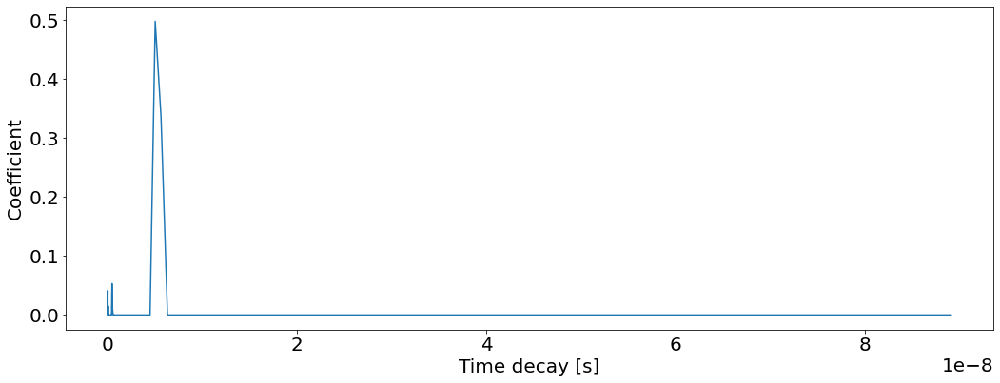

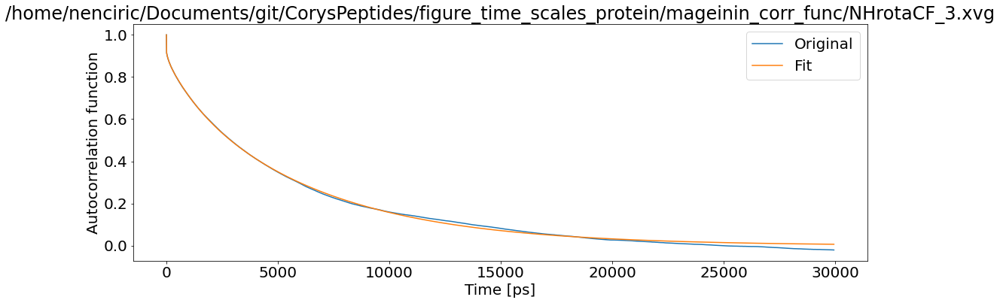

T1: 0.001015832402066001 T2: 0.0006465926266233553 NOE: 0


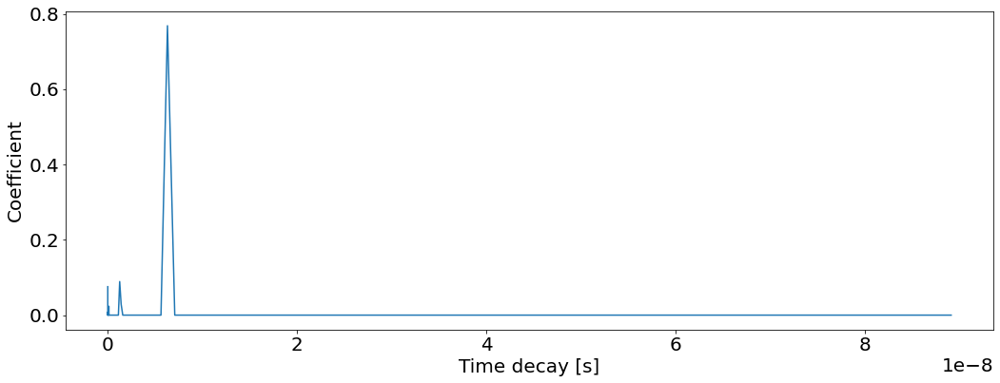

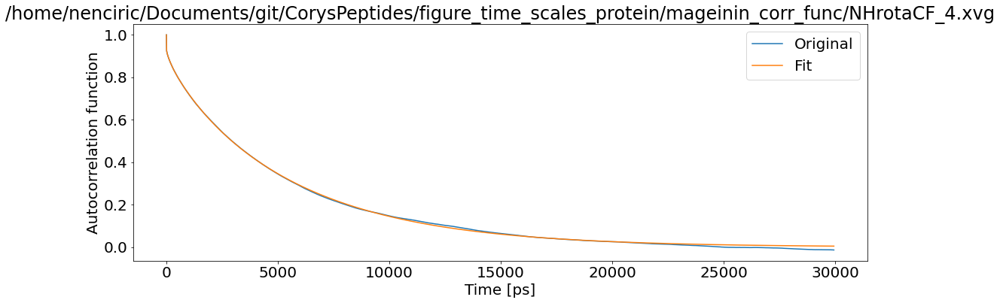

T1: 0.0009813461899670073 T2: 0.0006512397513780062 NOE: 0


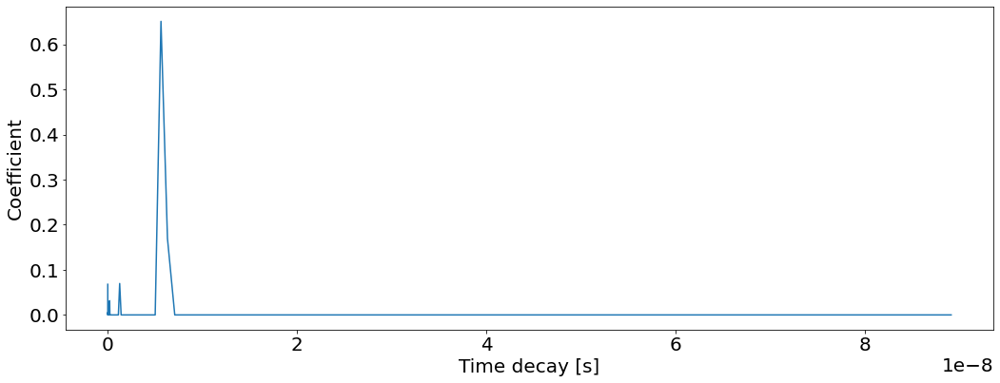

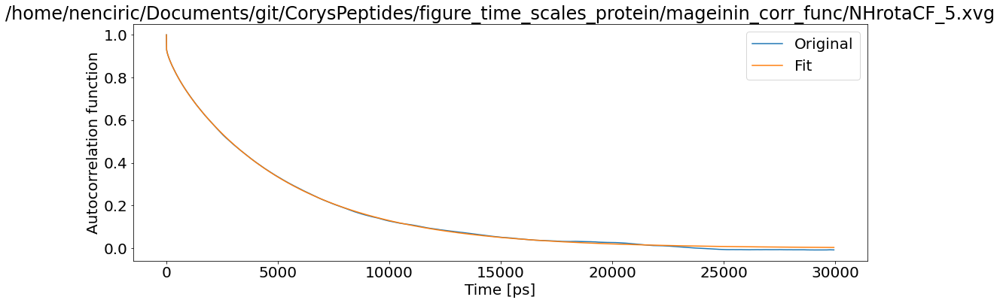

T1: 0.0009670255189496036 T2: 0.0006685132517889332 NOE: 0


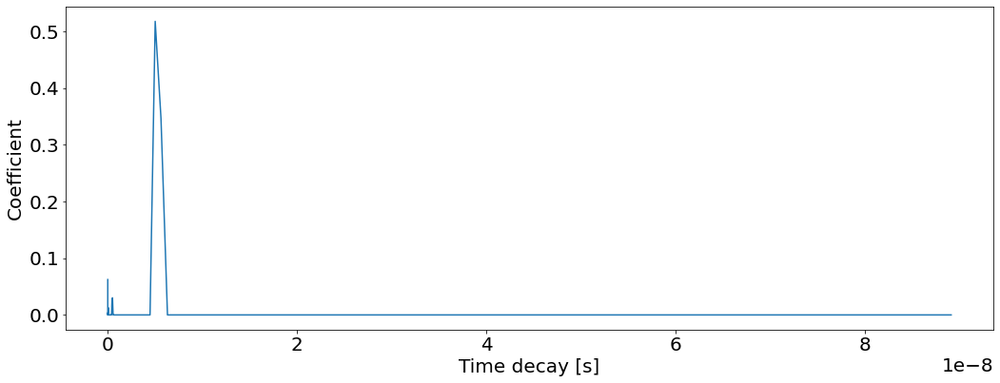

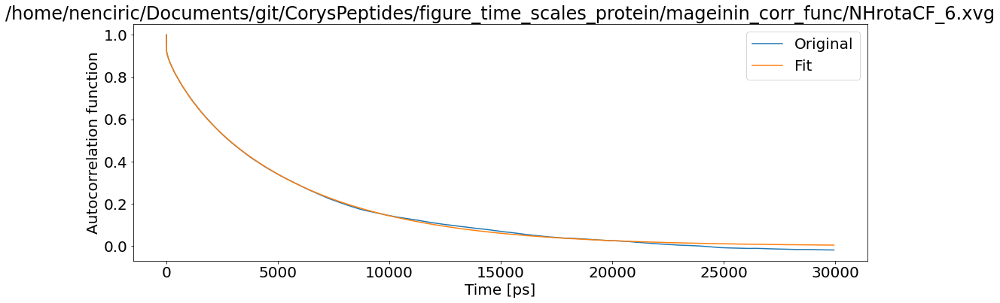

T1: 0.000997582364266344 T2: 0.0006602568632911294 NOE: 0


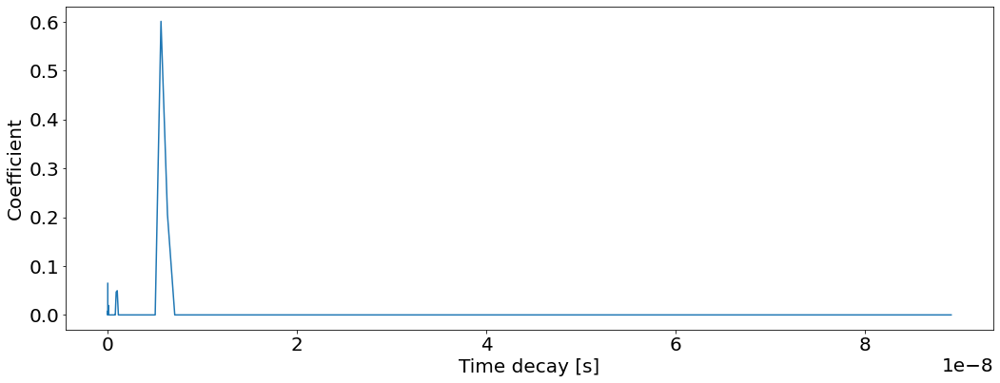

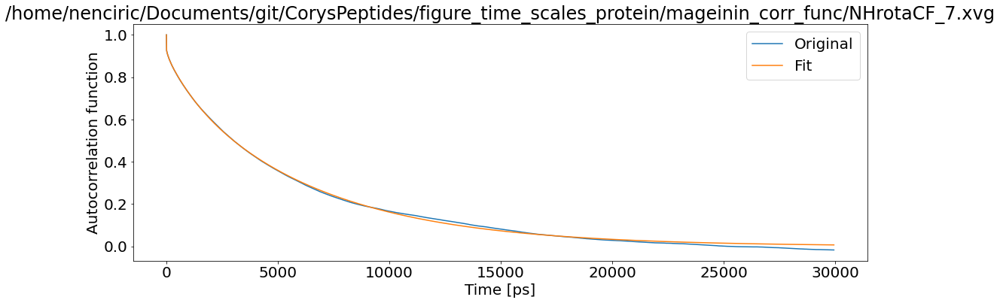

T1: 0.0009947241909363815 T2: 0.0006318951372456323 NOE: 0


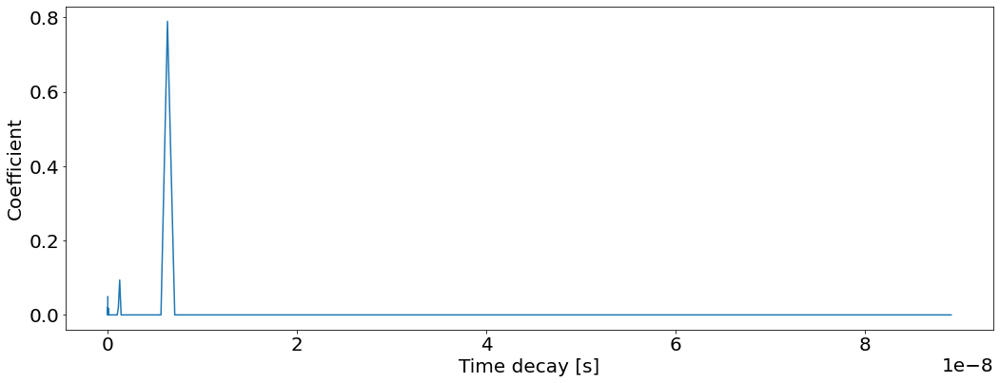

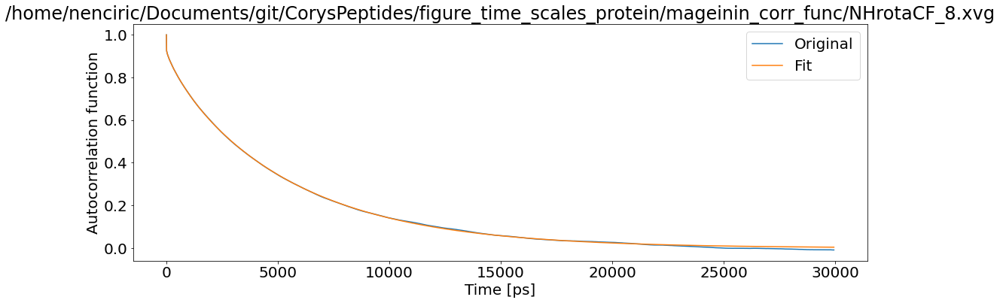

T1: 0.000973057012574338 T2: 0.0006536033949225672 NOE: 0


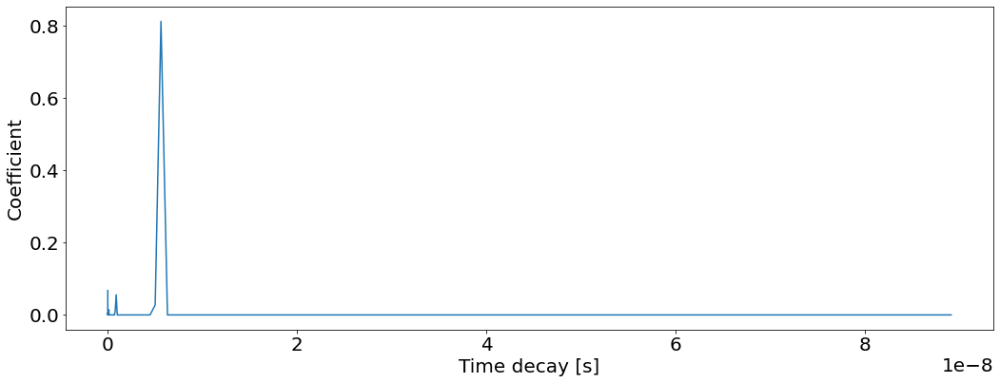

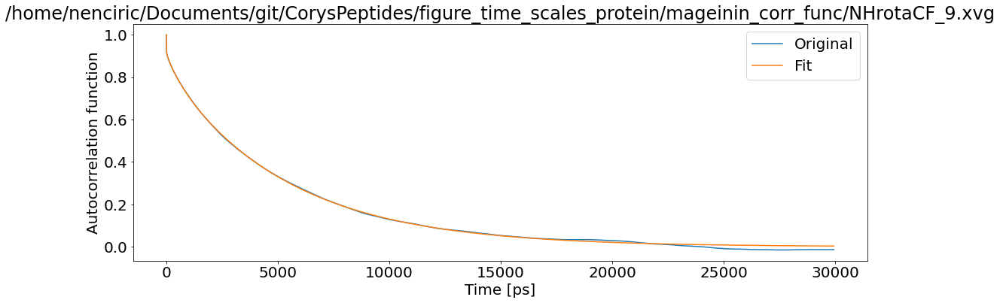

T1: 0.000987962319461386 T2: 0.0006758627992447944 NOE: 0


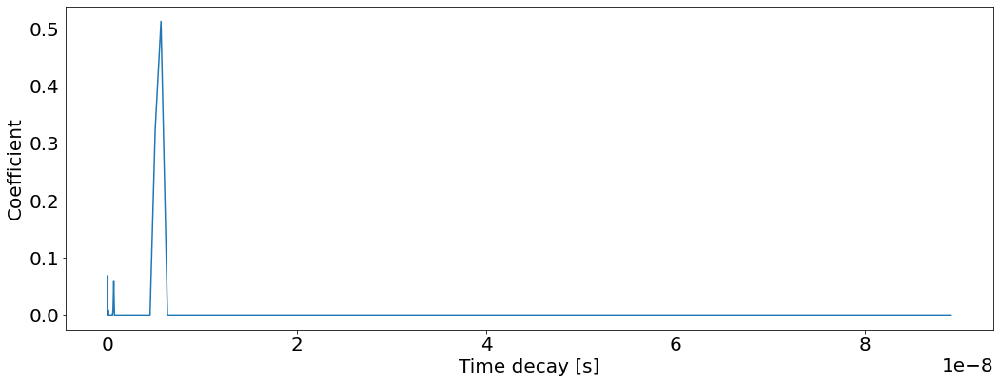

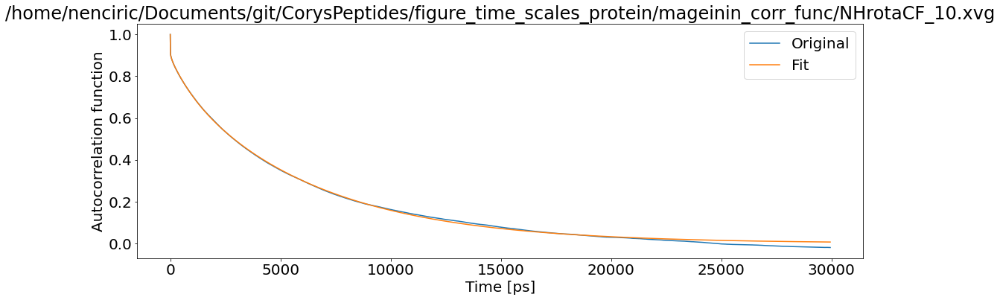

T1: 0.0010155332372157036 T2: 0.0006457779425337537 NOE: 0


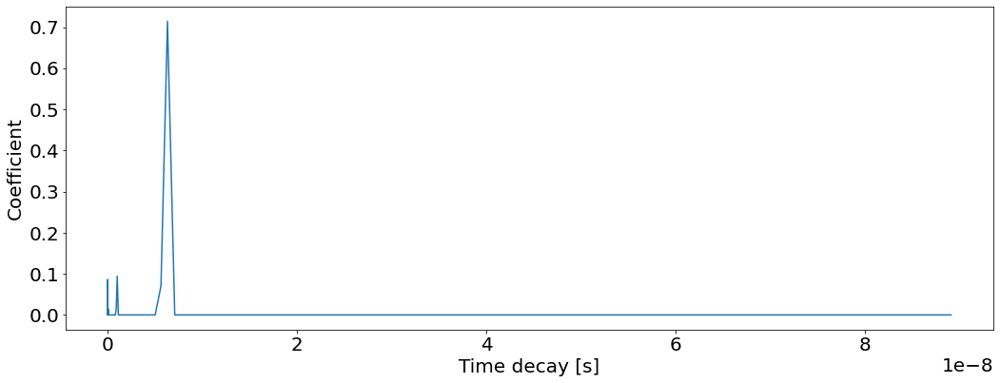

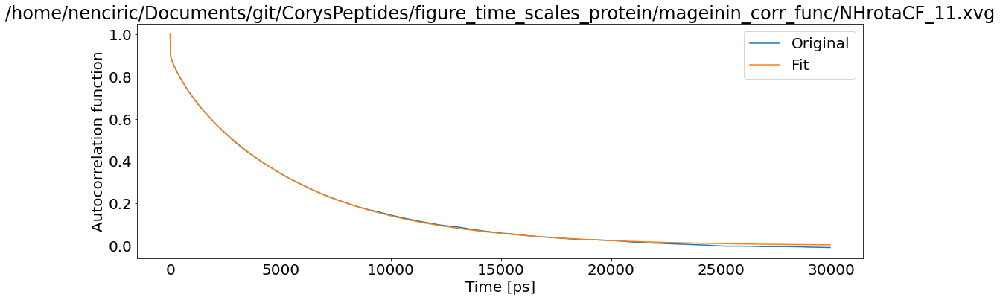

T1: 0.0009939842699847753 T2: 0.0006620058061870707 NOE: 0


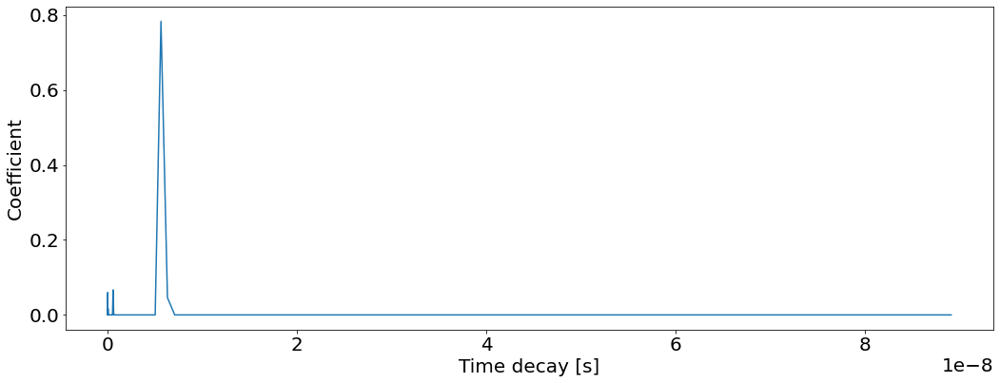

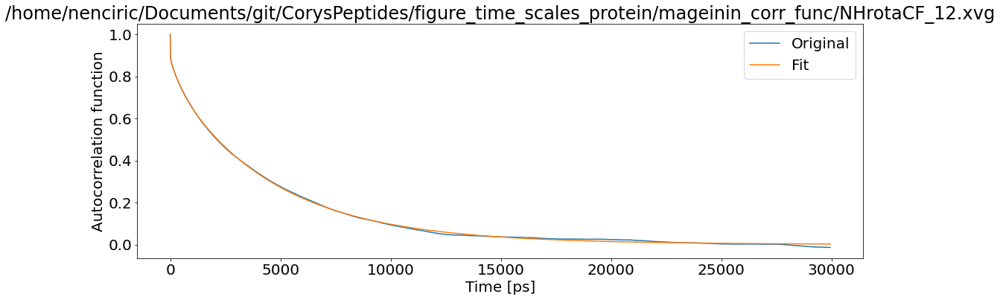

T1: 0.0010822183113838042 T2: 0.00078075645458522 NOE: 0


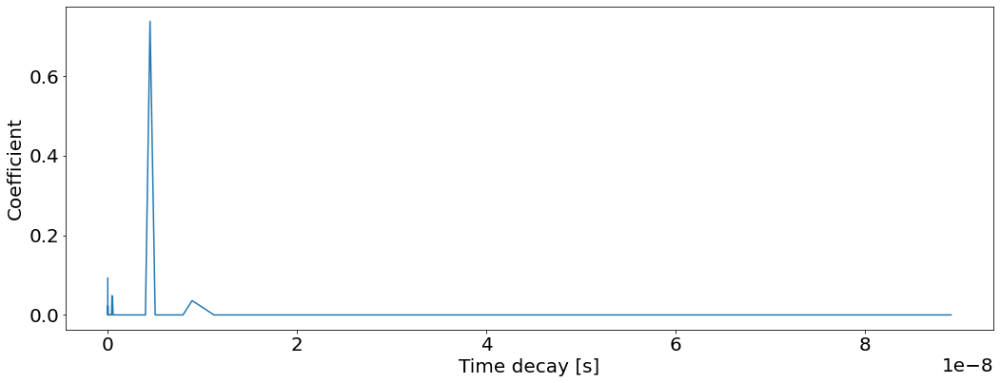

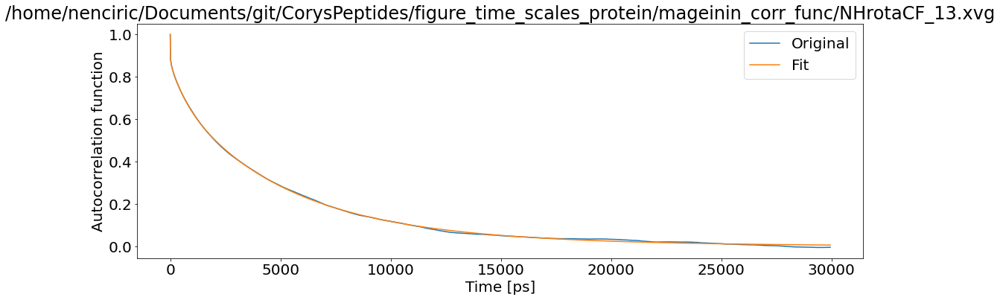

T1: 0.0011377685301092117 T2: 0.0007646182827826184 NOE: 0


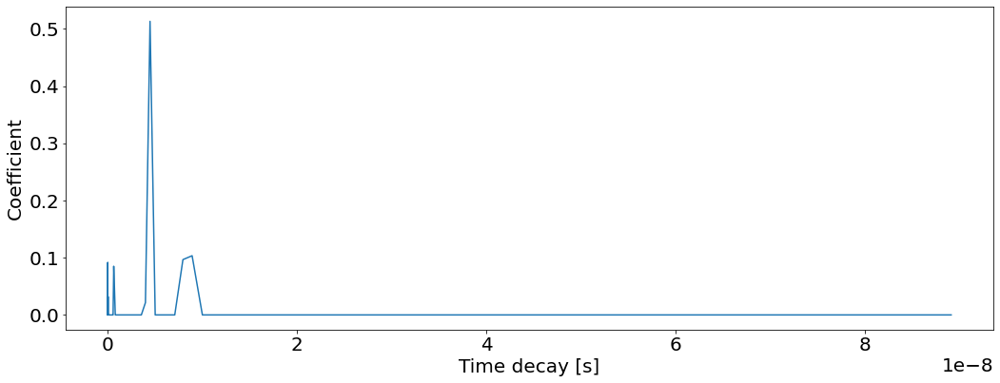

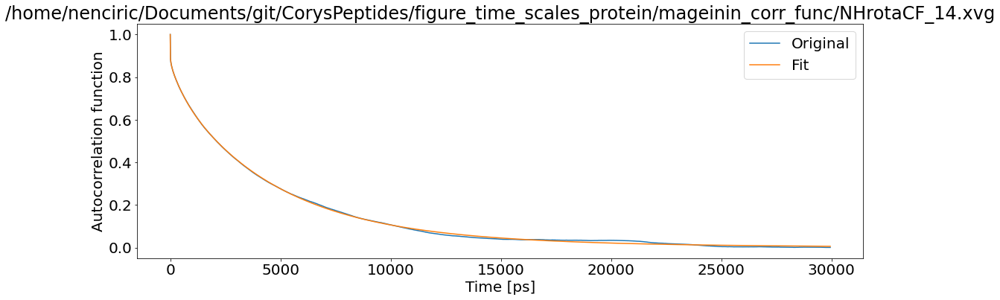

T1: 0.0011159612161078475 T2: 0.0007746916342738265 NOE: 0


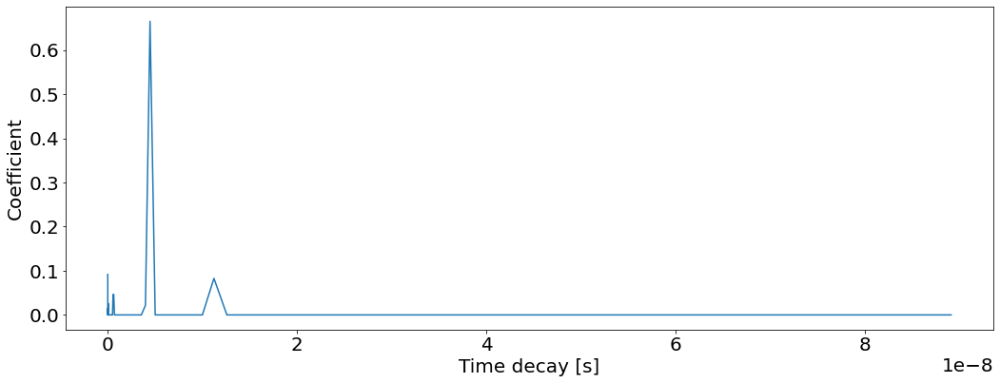

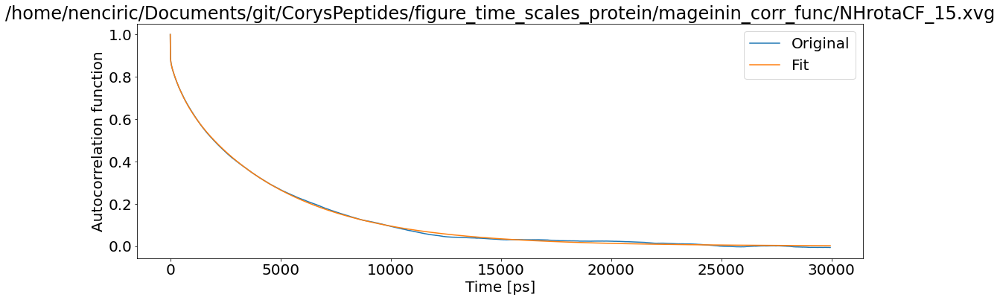

T1: 0.001111352727830986 T2: 0.000802246274383701 NOE: 0


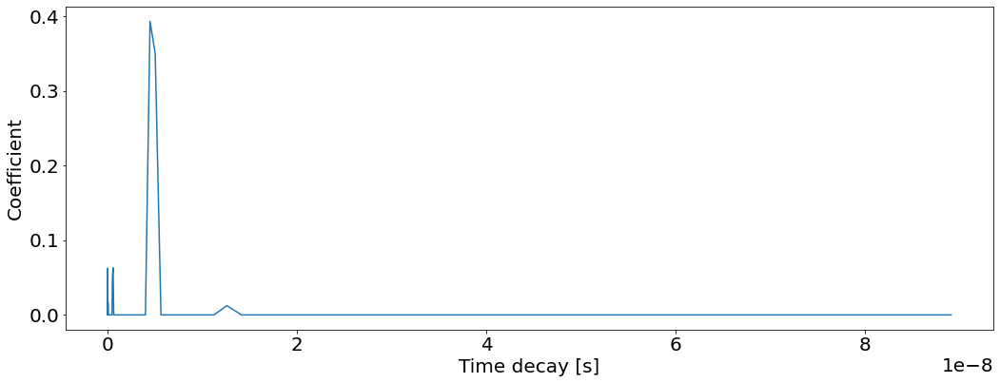

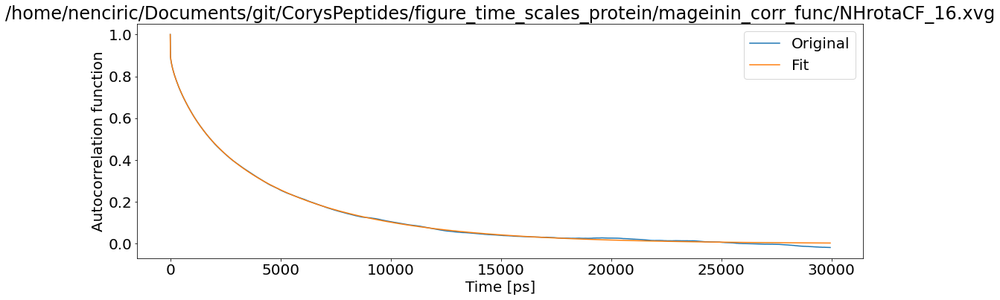

T1: 0.0011669998175069696 T2: 0.0008152363524523763 NOE: 0


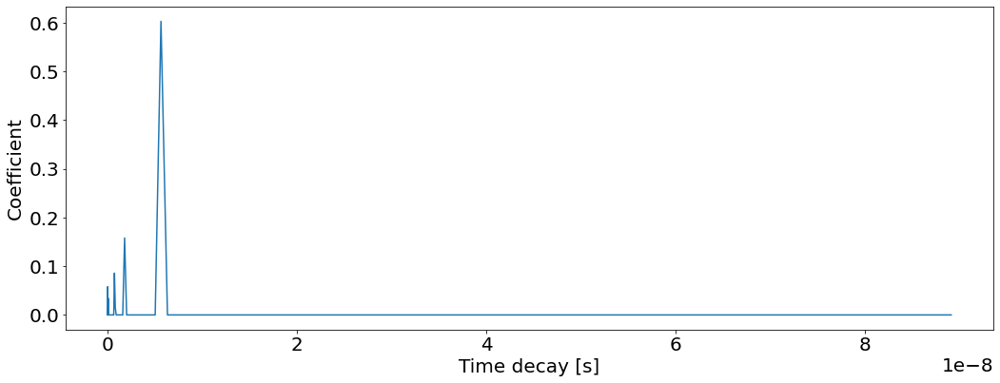

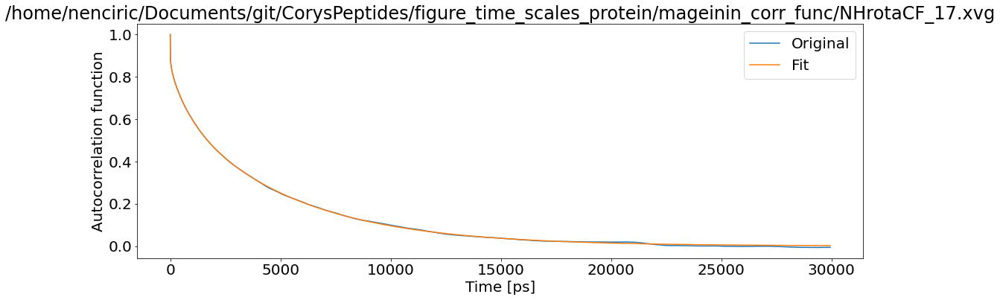

T1: 0.0011894406261036816 T2: 0.0008441511843347011 NOE: 0


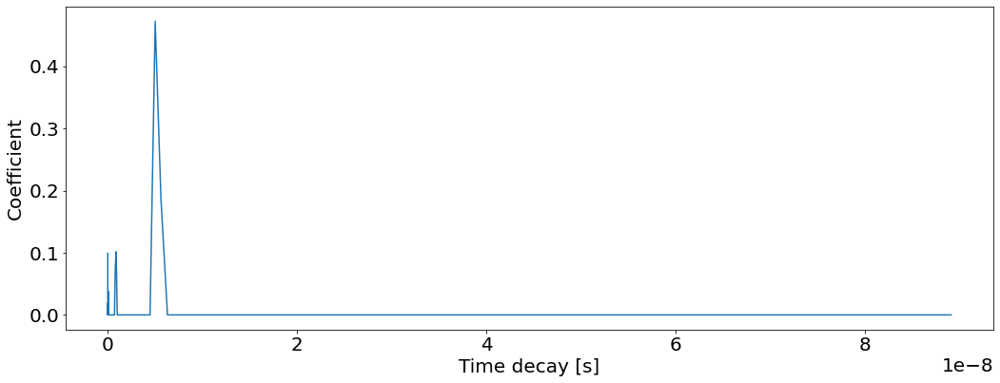

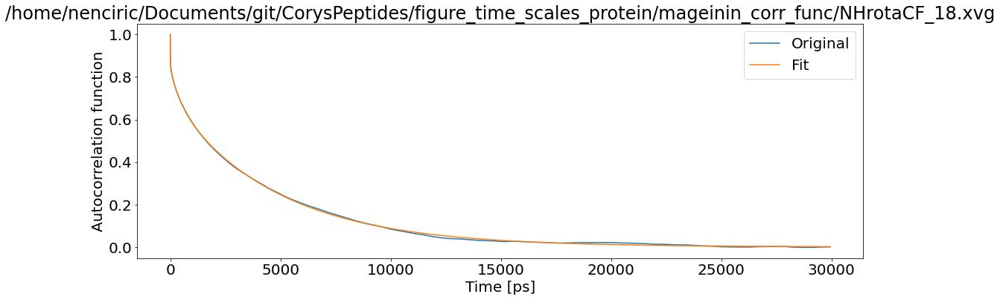

T1: 0.0011921322678901324 T2: 0.0008521391688662464 NOE: 0


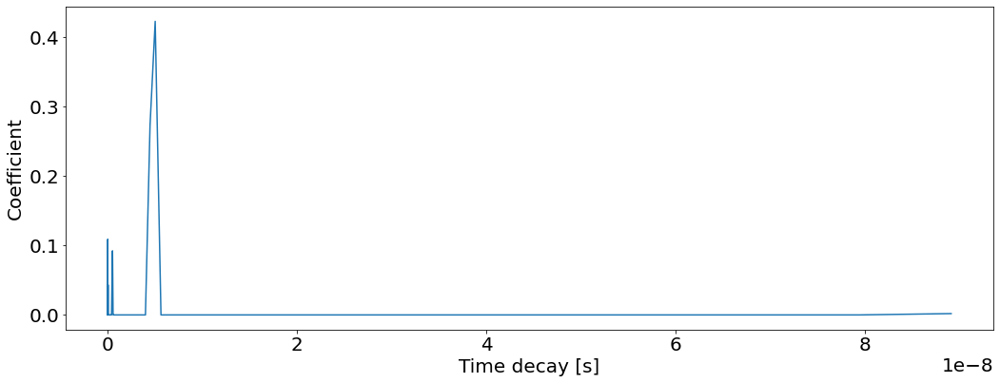

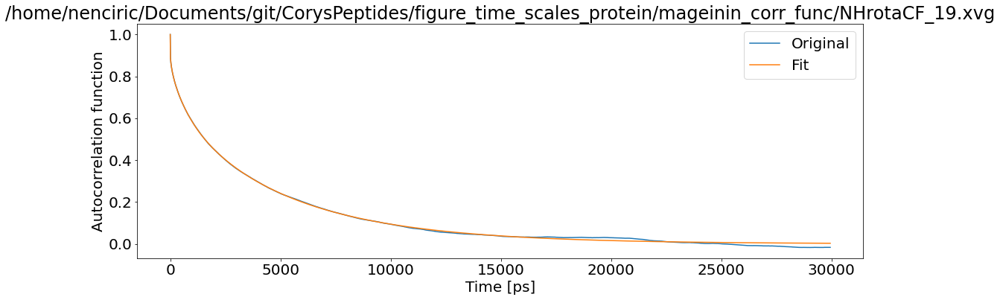

T1: 0.0012312152689068758 T2: 0.000868031617447444 NOE: 0


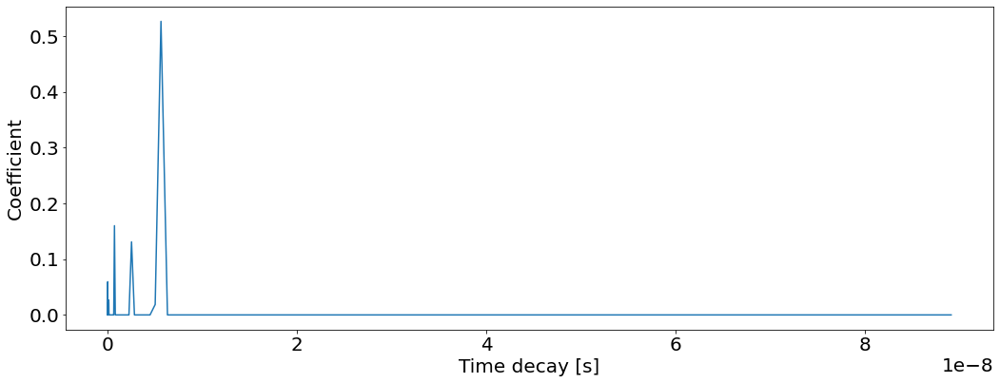

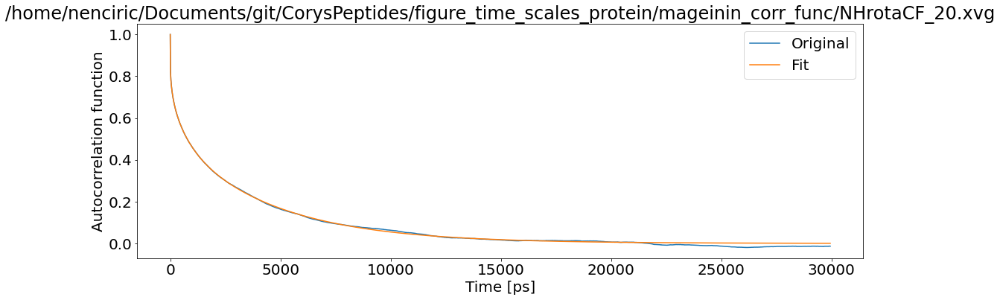

T1: 0.0015359986590385343 T2: 0.0011736436444005137 NOE: 0


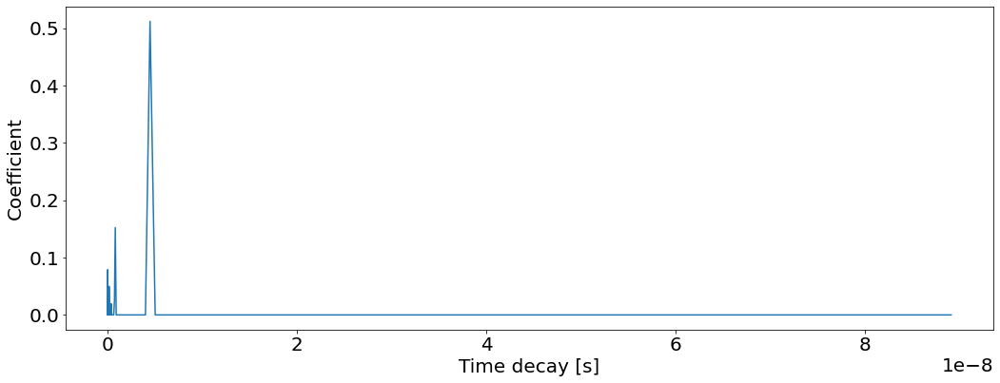

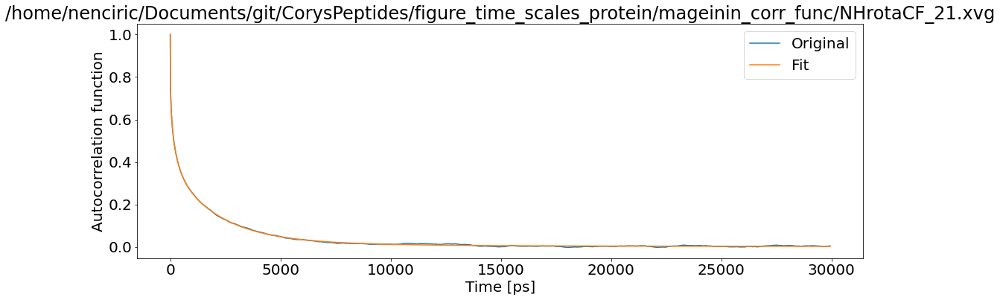

T1: 0.003010361080393467 T2: 0.002379880581289816 NOE: 0


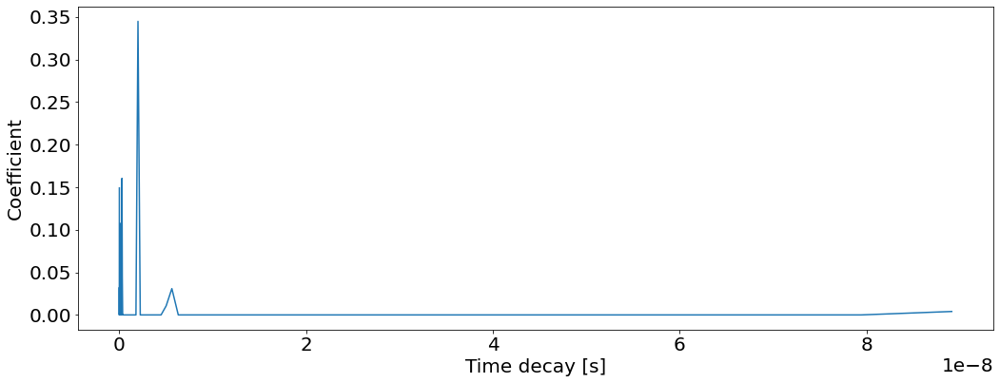

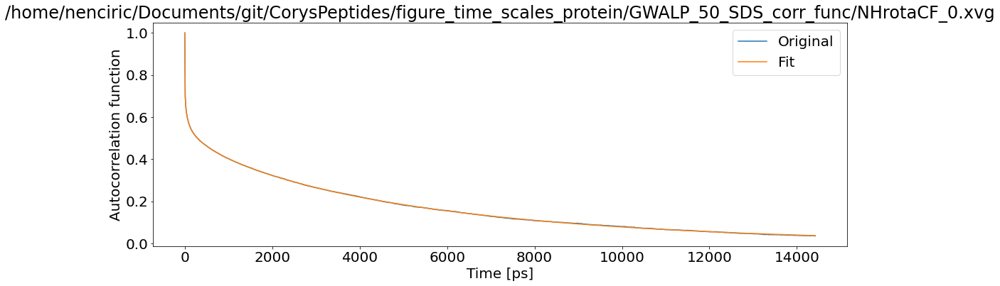

T1: 0.0017674771842834747 T2: 0.0011807657053356734 NOE: 0


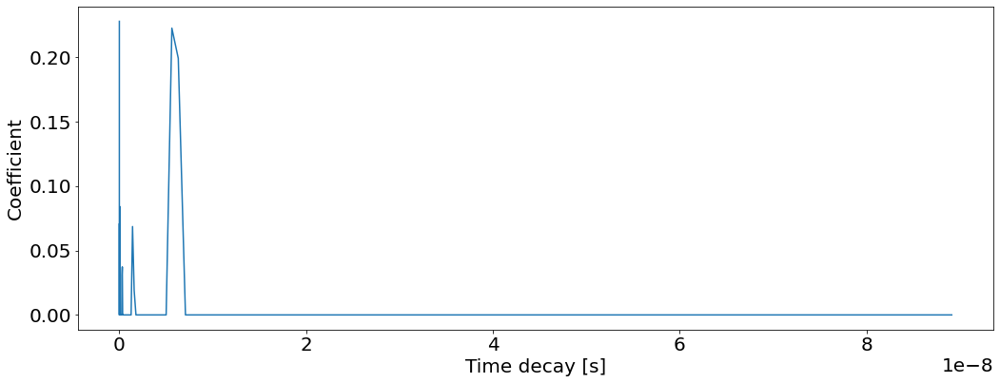

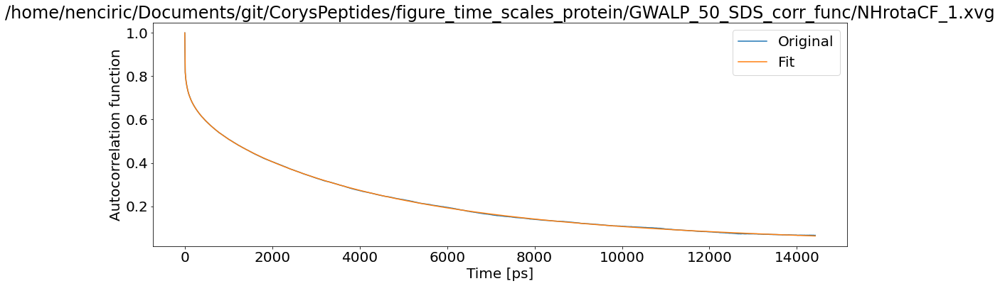

T1: 0.0014932012979224727 T2: 0.0009278497419345648 NOE: 0


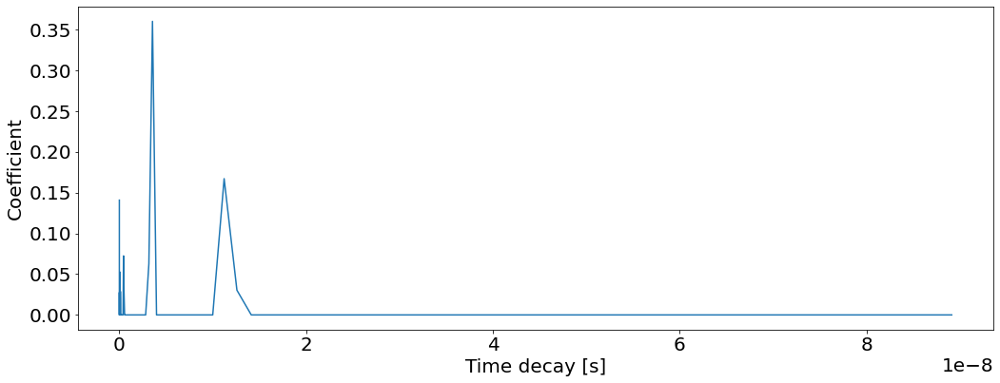

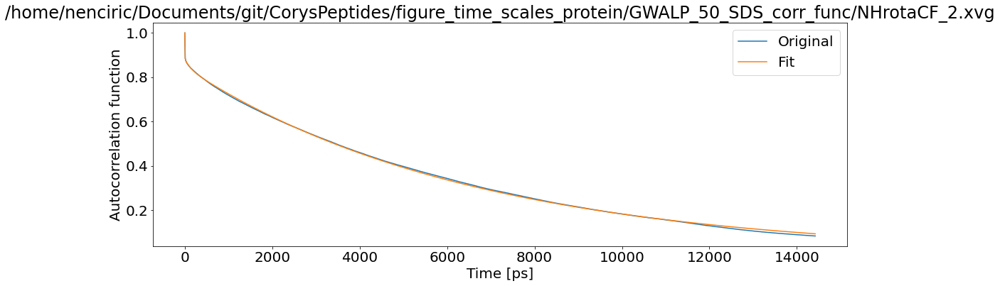

T1: 0.0009850394193279522 T2: 0.0006011766235019755 NOE: 0


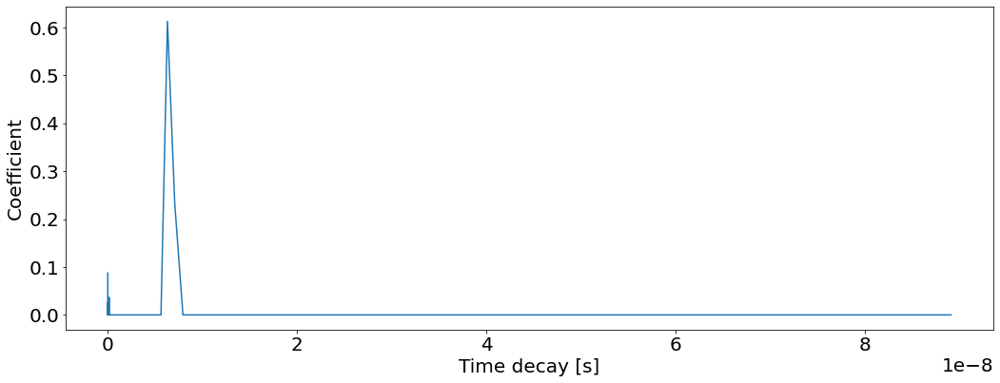

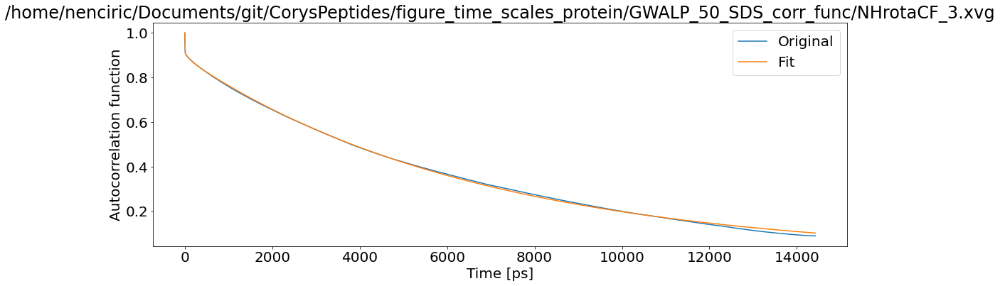

T1: 0.0009397642994937544 T2: 0.0005648522527088186 NOE: 0


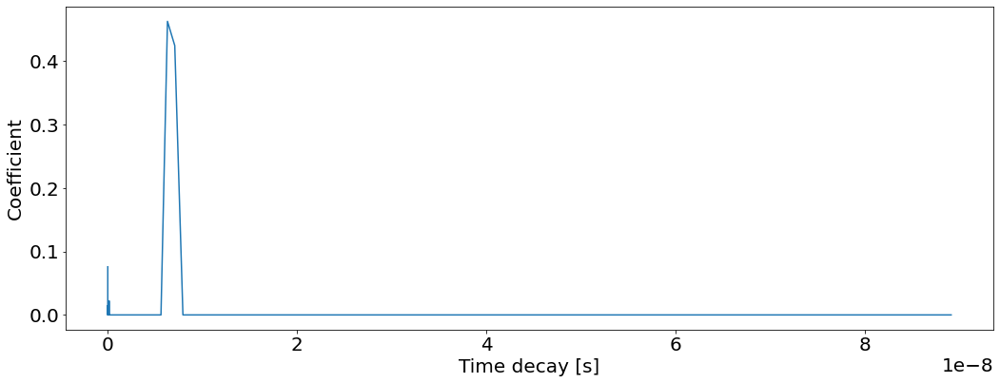

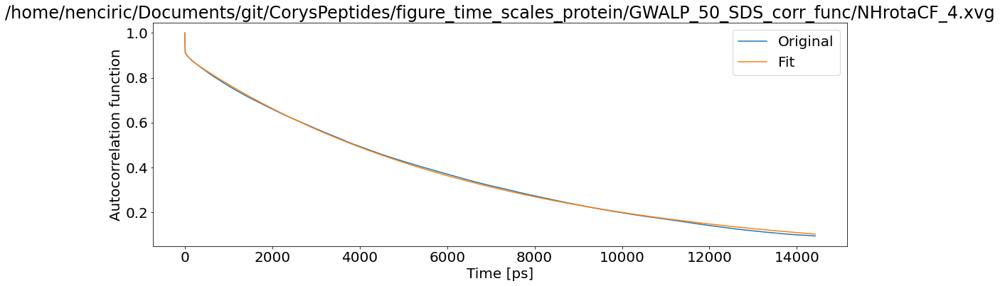

T1: 0.0009319569519257744 T2: 0.0005600786969239883 NOE: 0


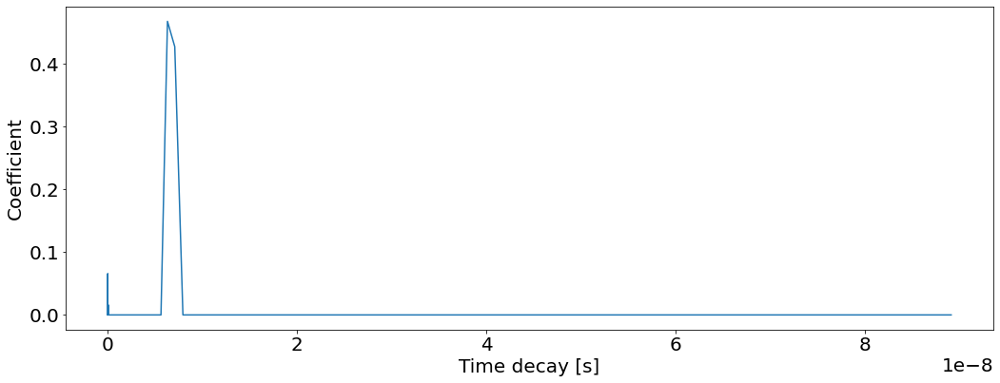

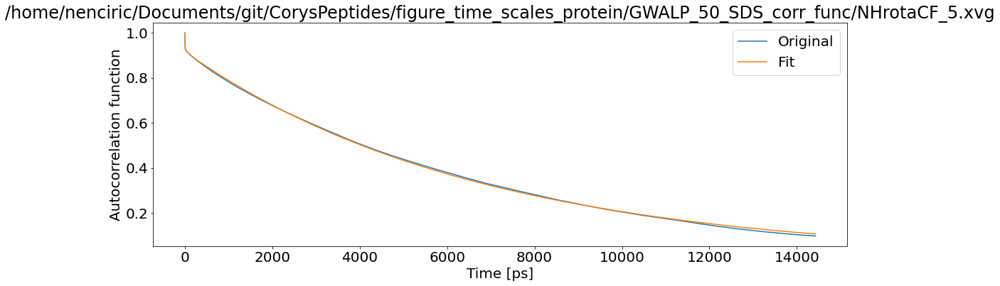

T1: 0.0009106404949985991 T2: 0.0005462252645748528 NOE: 0


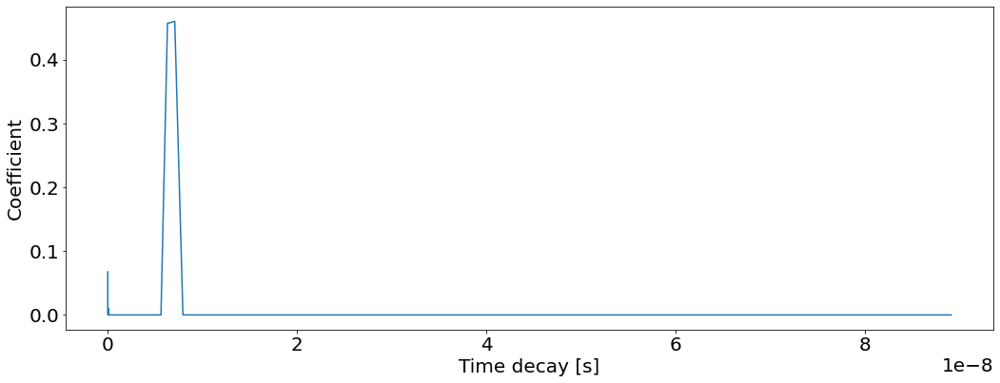

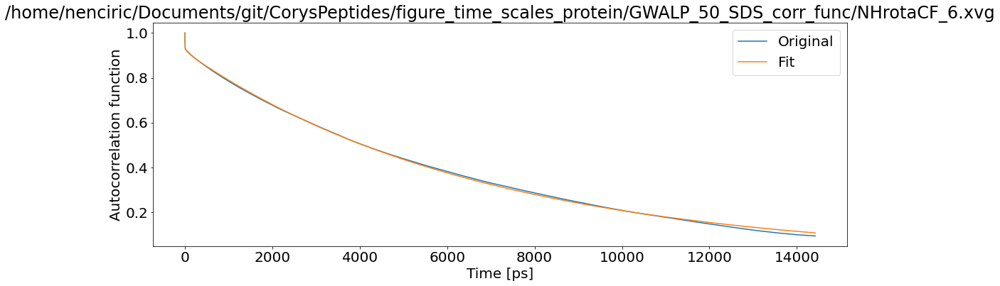

T1: 0.0009111334561571494 T2: 0.0005439995877198814 NOE: 0


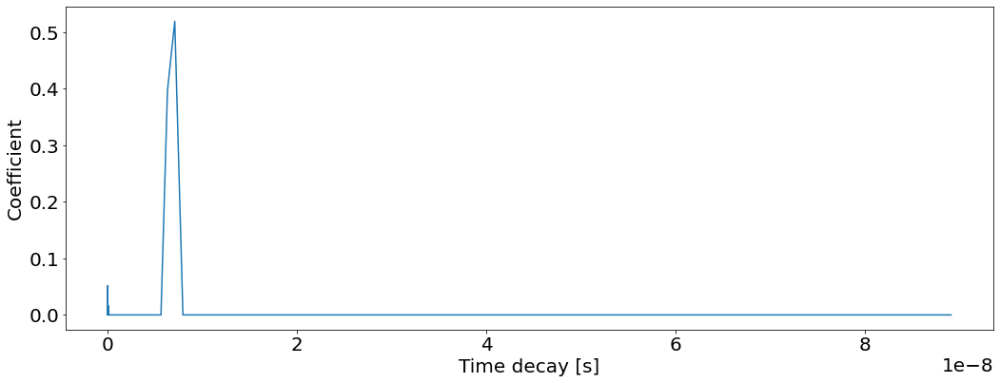

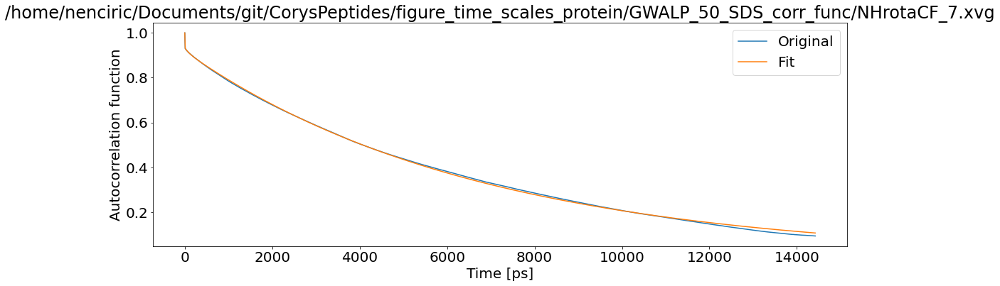

T1: 0.000909707612336198 T2: 0.0005445224613496029 NOE: 0


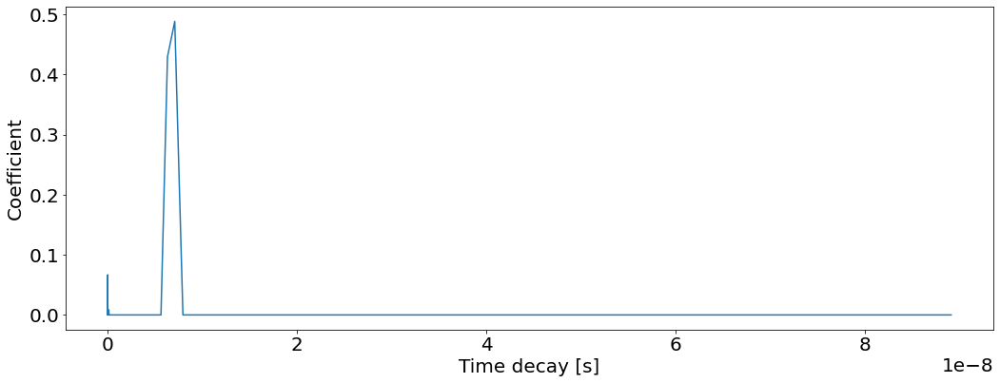

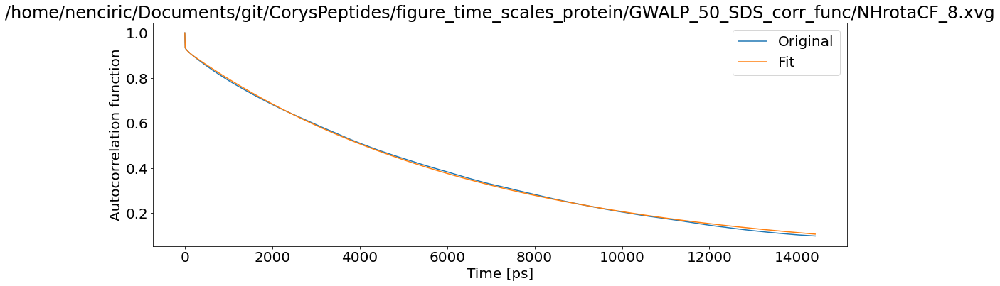

T1: 0.0009029684315165759 T2: 0.0005420359891743711 NOE: 0


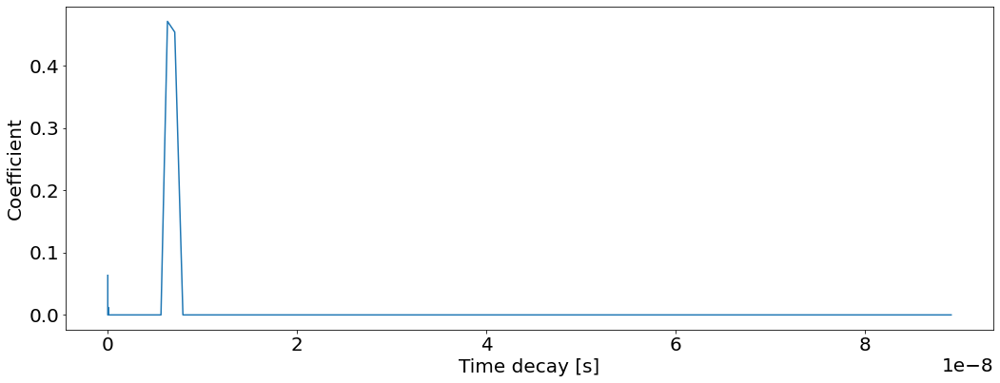

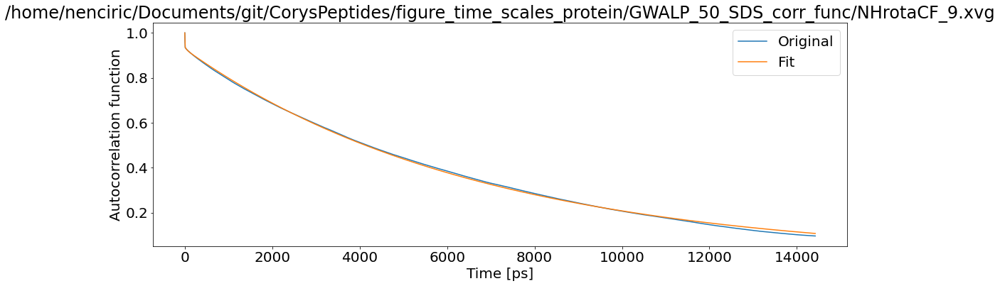

T1: 0.0008996295693216109 T2: 0.0005396585961188971 NOE: 0


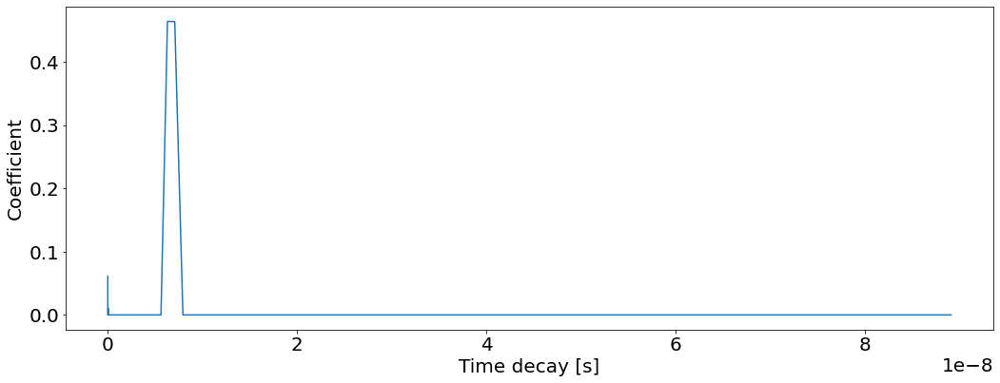

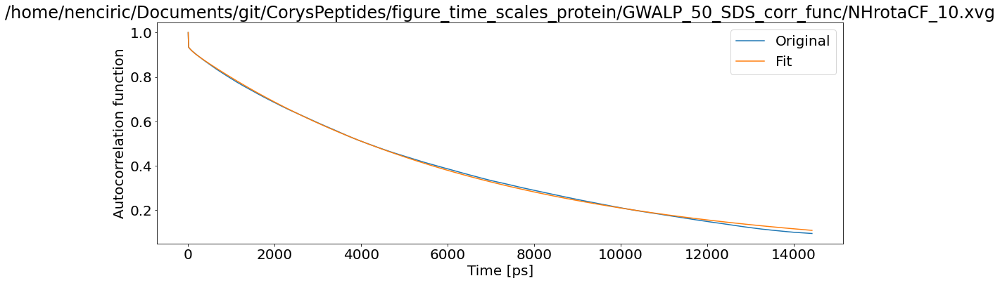

T1: 0.000903133161571199 T2: 0.00053917186339889 NOE: 0


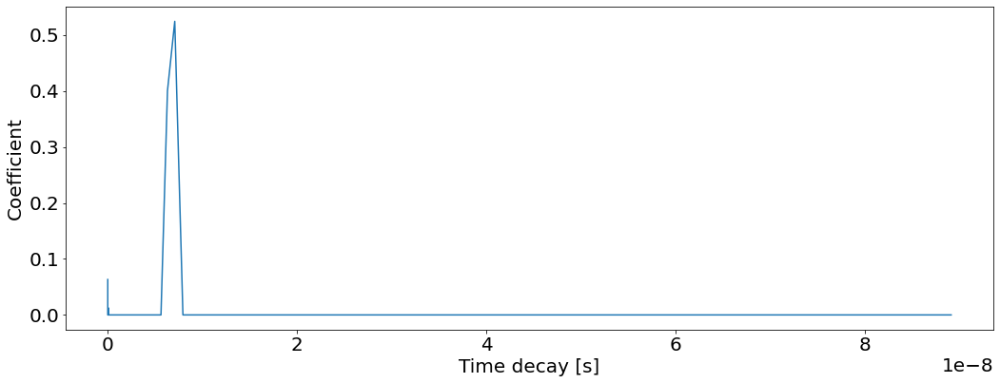

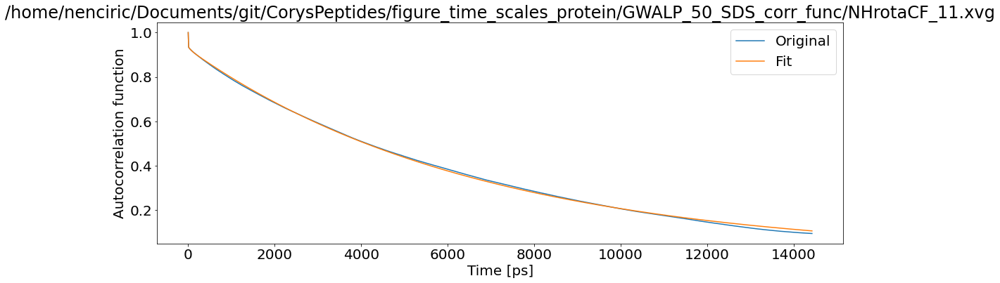

T1: 0.0009016707326250728 T2: 0.0005410250169777198 NOE: 0


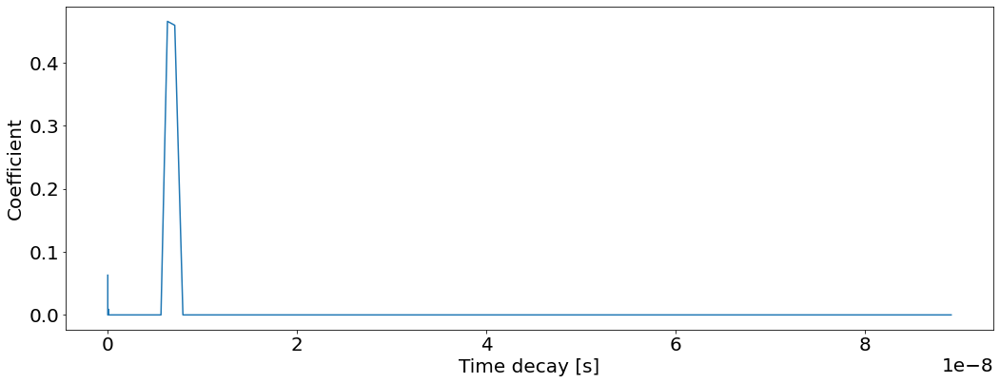

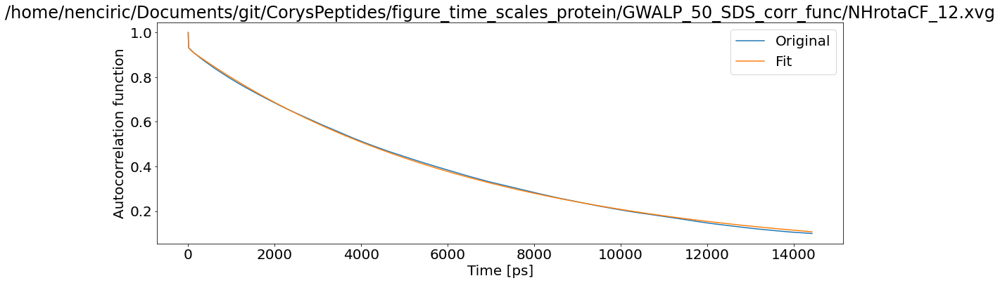

T1: 0.0009005517319137938 T2: 0.0005405246783882134 NOE: 0


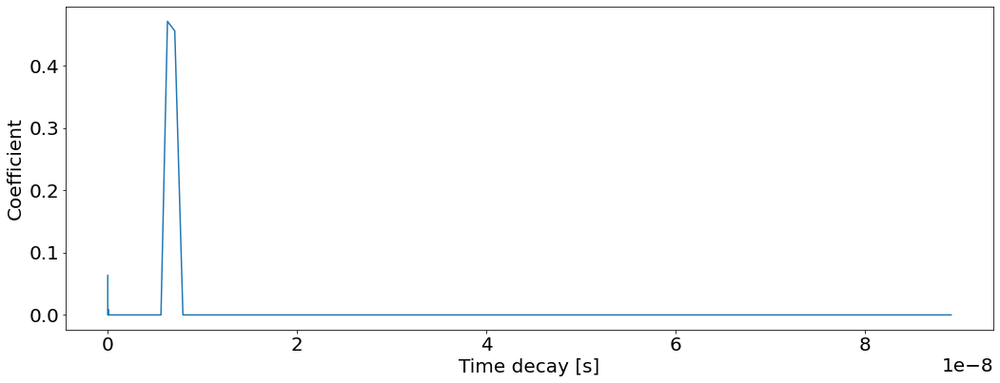

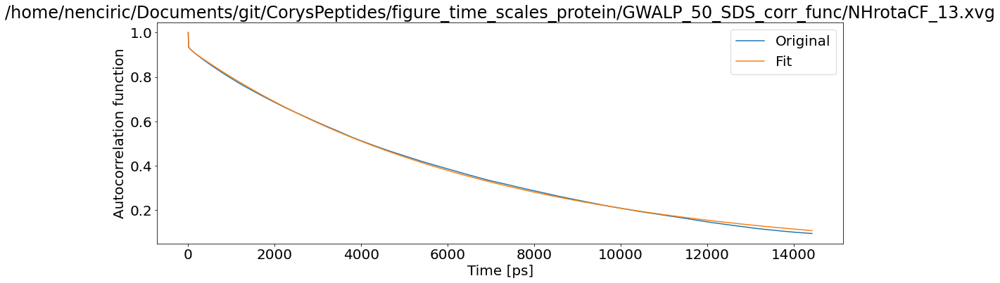

T1: 0.0009001983017295156 T2: 0.0005386091490082846 NOE: 0


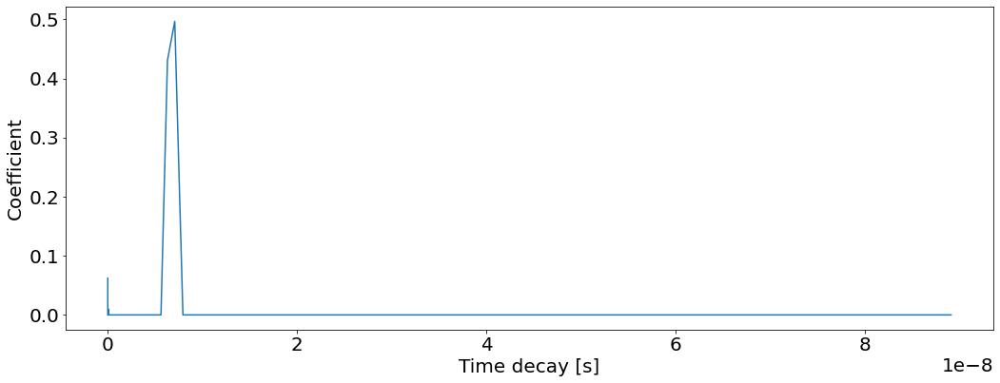

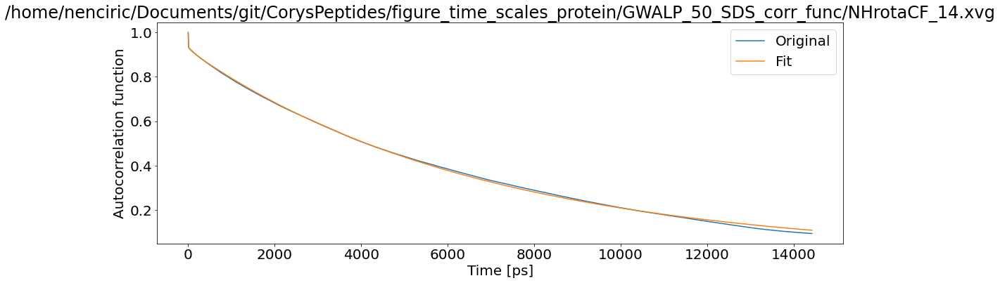

T1: 0.0009057101591590864 T2: 0.0005407286890015734 NOE: 0


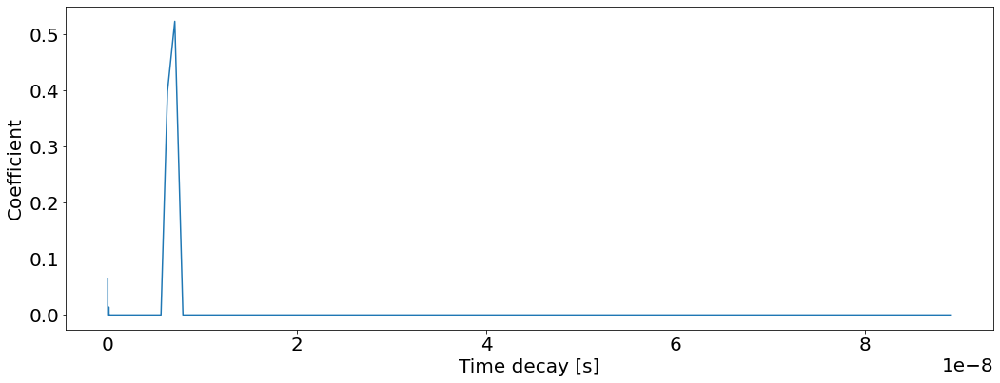

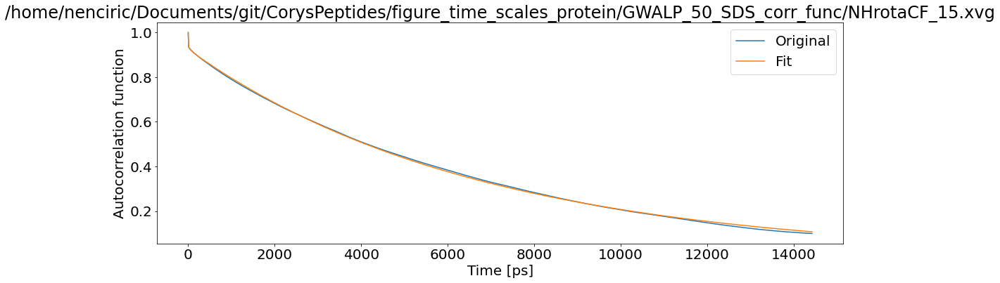

T1: 0.0009029899377330985 T2: 0.0005418705268436865 NOE: 0


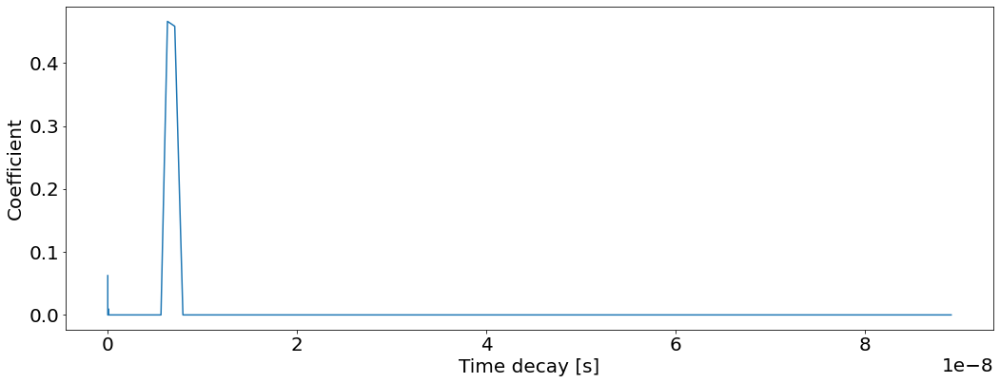

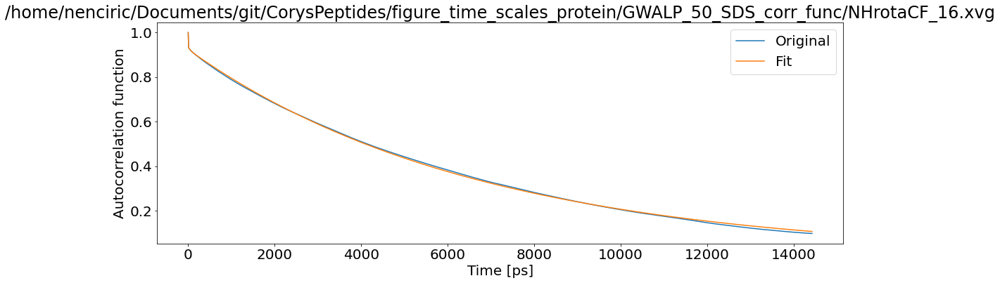

T1: 0.0009037209641996936 T2: 0.0005431883166971762 NOE: 0


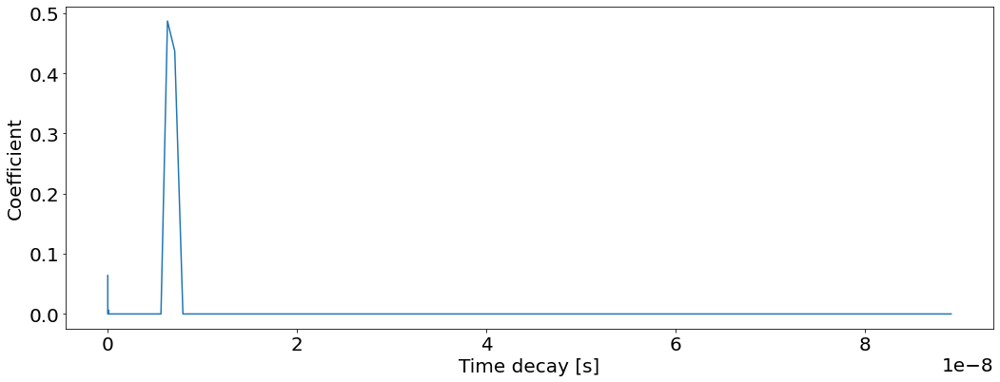

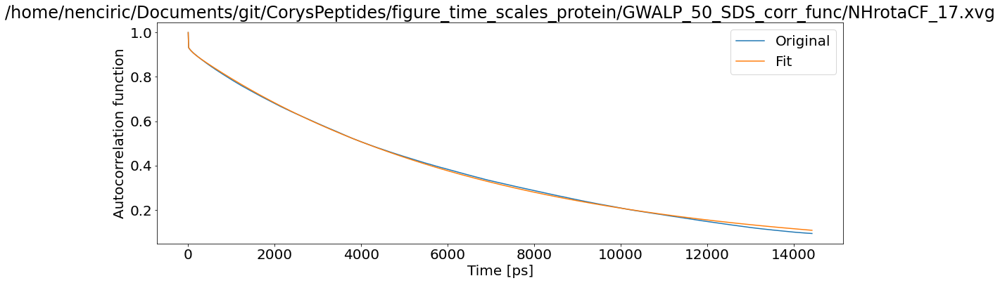

T1: 0.0009074968230813103 T2: 0.000542907429068516 NOE: 0


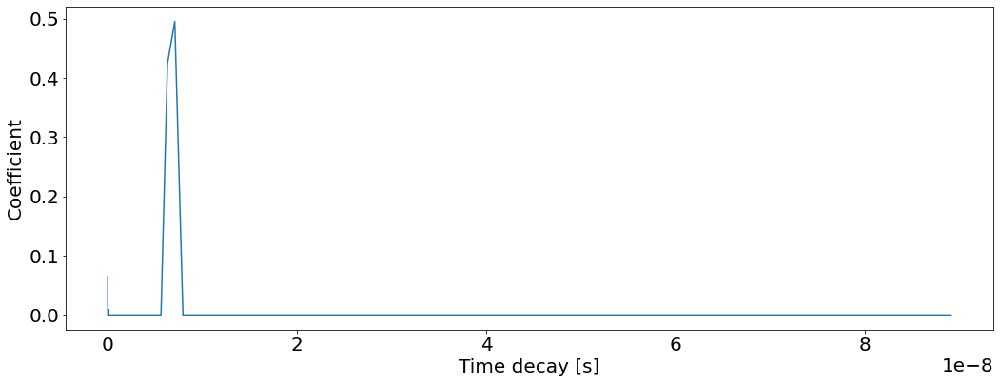

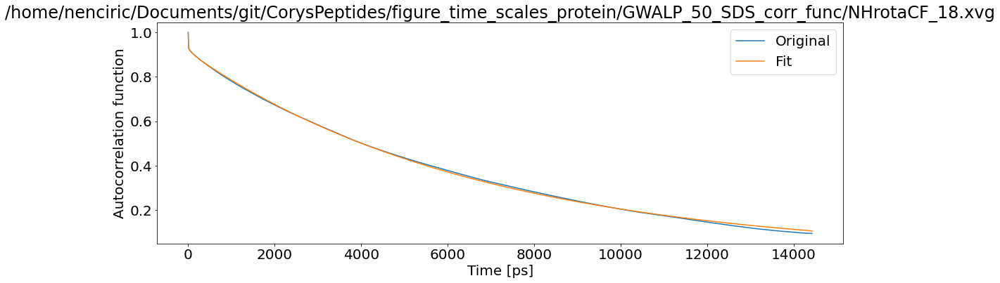

T1: 0.0009140166244140816 T2: 0.0005490181377456023 NOE: 0


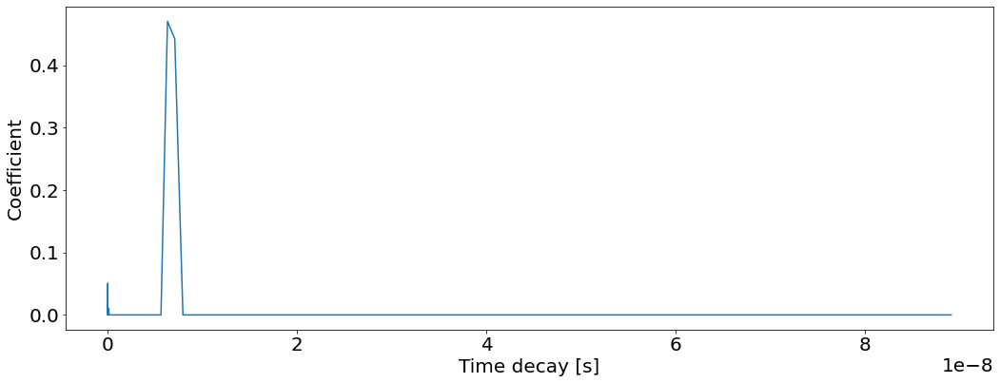

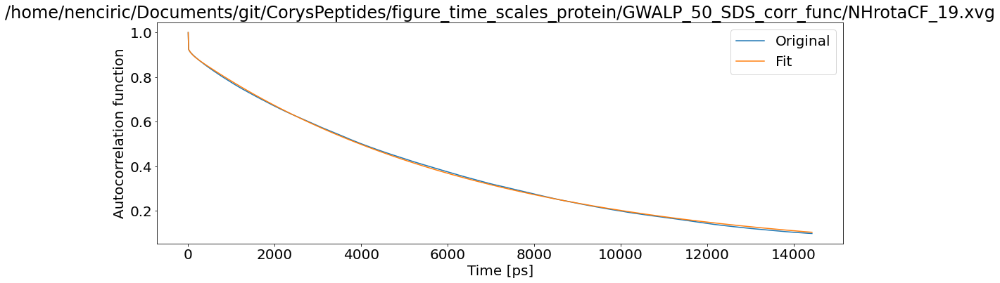

T1: 0.0009175876787439879 T2: 0.0005525137443904749 NOE: 0


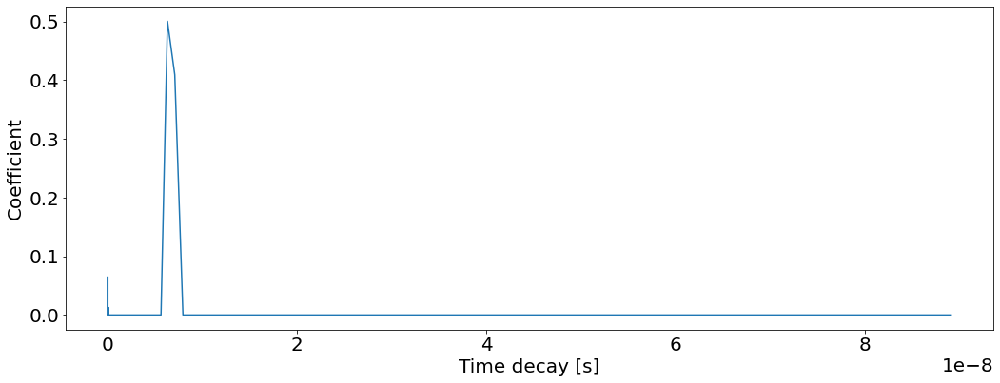

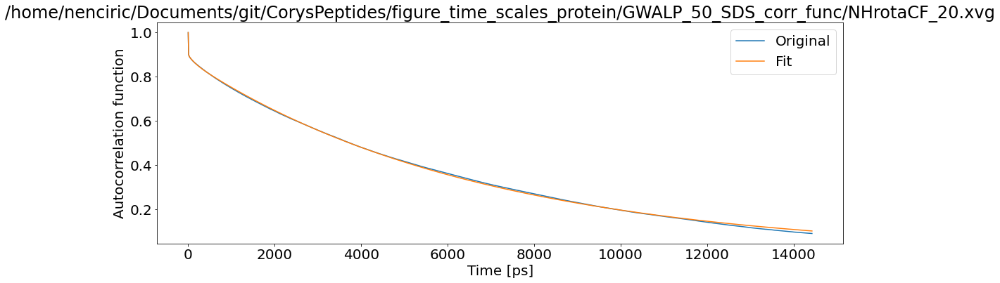

T1: 0.000955052772308737 T2: 0.0005726842391226295 NOE: 0


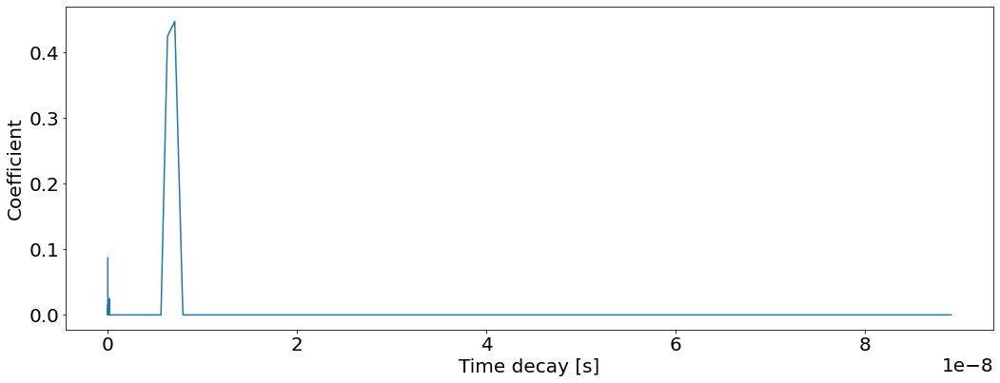

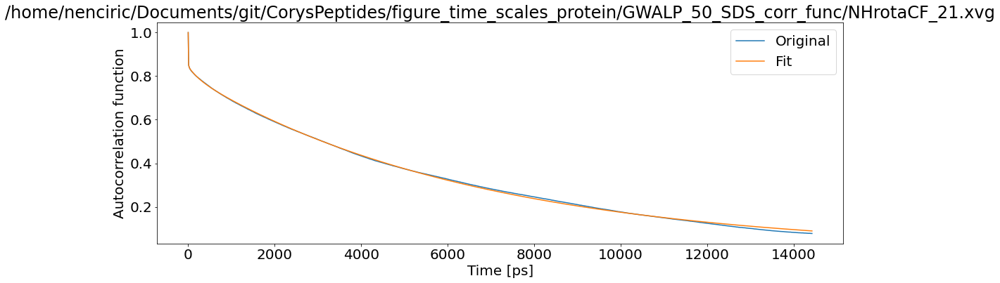

T1: 0.0010337985557584456 T2: 0.0006280996694809654 NOE: 0


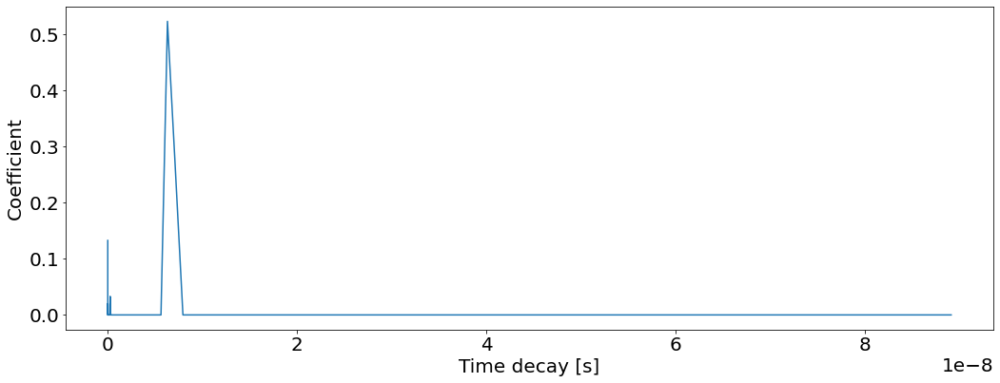

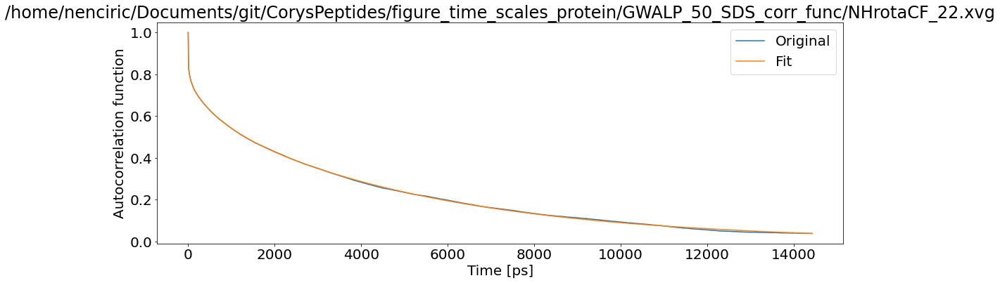

T1: 0.001293115476350648 T2: 0.0009130229896132041 NOE: 0


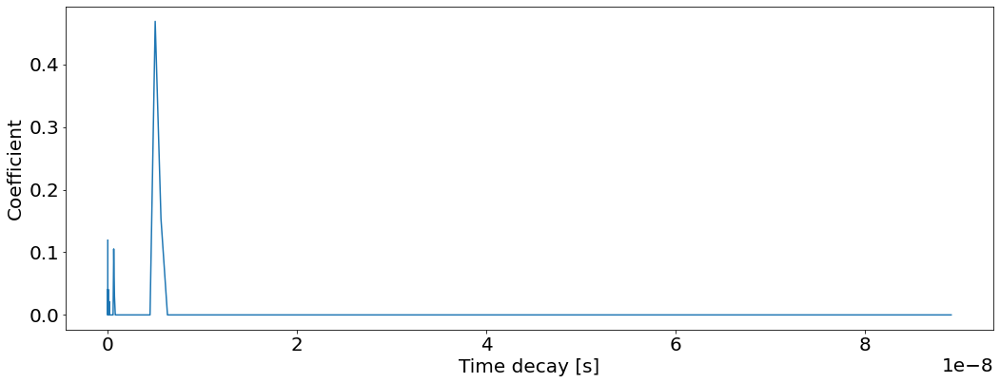

In [109]:

"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=100 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"
input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"
residues=40


author_name="Ricky Nencini"

peptides={"eElab":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/eElab_40SDS_corr_func/"},
"eYqjD":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/eYqjD_corr_fuc/"},
"yFis1":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/yFis1_corr_func/"},
"hMff":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/93_hMff_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_370ns_mahti_360ns_mahti_2940ns_no_solvent_2948/"},
"mag2":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/mageinin_corr_func/"},
"gwalp":{"ADRESS":"/home/nenciric/Documents/git/CorysPeptides/figure_time_scales_protein/GWALP_50_SDS_corr_func/"}}



folder_paths=[eElab,eYqjD,yFis1,hMff,mag2,gwalp]
output_name="eElab_40SDS_040822.out"


for key in peptides:
    residues=0
    for file in os.listdir(peptides[key]["ADRESS"]):
        residues+=1

    if take_all_in_folder=="yes":
        for file in os.listdir(peptides[key]["ADRESS"]):
            input_corr_file = peptides[key]["ADRESS"]+os.fsdecode(file)
            rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    elif take_all_in_folder=="number":
        step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
        Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
        Ctimes = Ctimes * 0.001 * 10 ** (-9);
        Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
        Ctimes_to_save[:,0]=Ctimes
        for i in range(0,residues):
            input_corr_file = peptides[key]["ADRESS"]+input_prefix+str(i)+".xvg"
            AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
            Ctimes_to_save[:,i+1]=AA.Coeffs
    else:
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)

    peptides[key]["CTIMES"]=Ctimes_to_save

In [9]:
pwd

'/home/local/nenciric/Documents/git/CorysPeptides/calculate_relax_from_SDS_proteins'

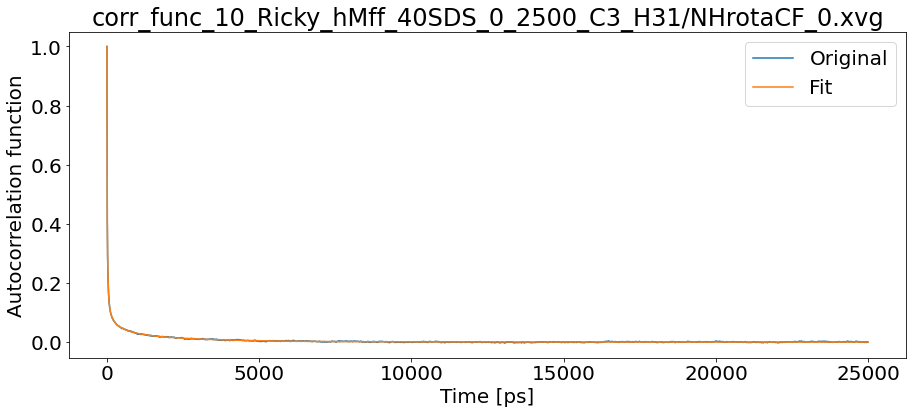

T1: 0.021535780544623077 T2: 0.016630782235846957 NOE: 0


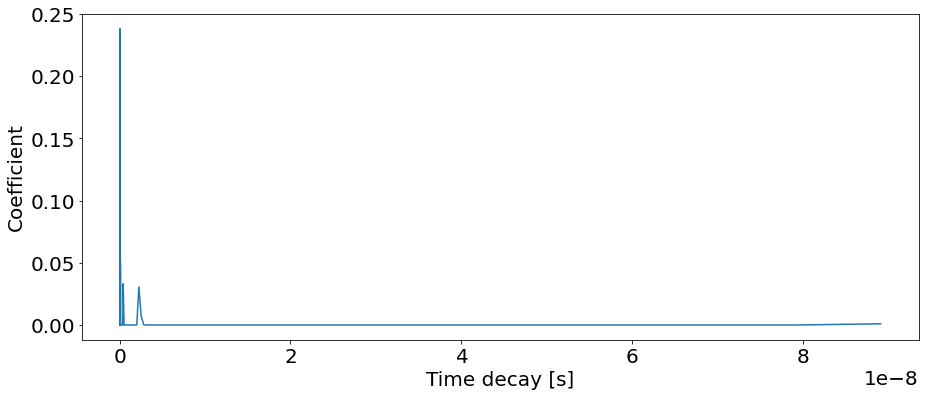

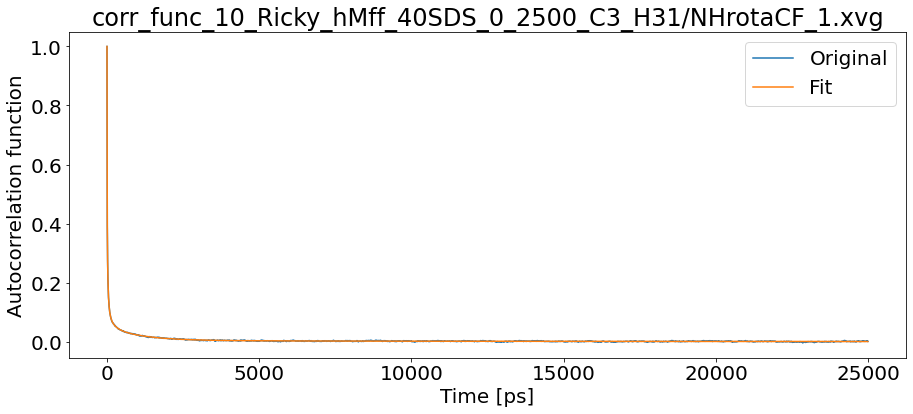

T1: 0.029925631045787732 T2: 0.025336970723038723 NOE: 0


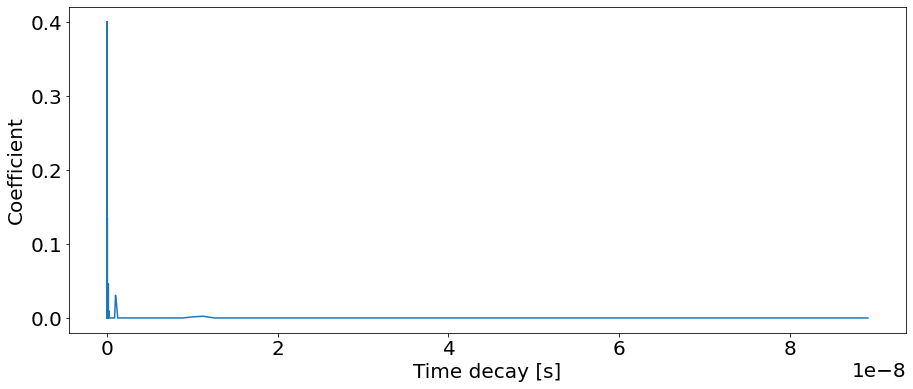

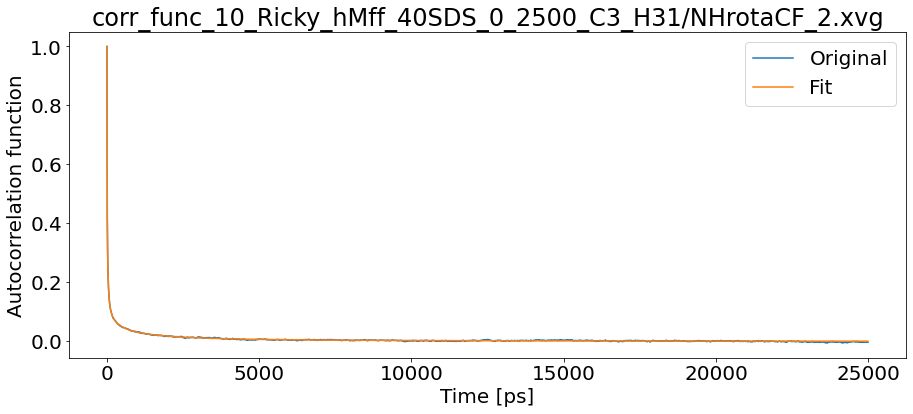

T1: 0.020913243077182283 T2: 0.017300035650840272 NOE: 0


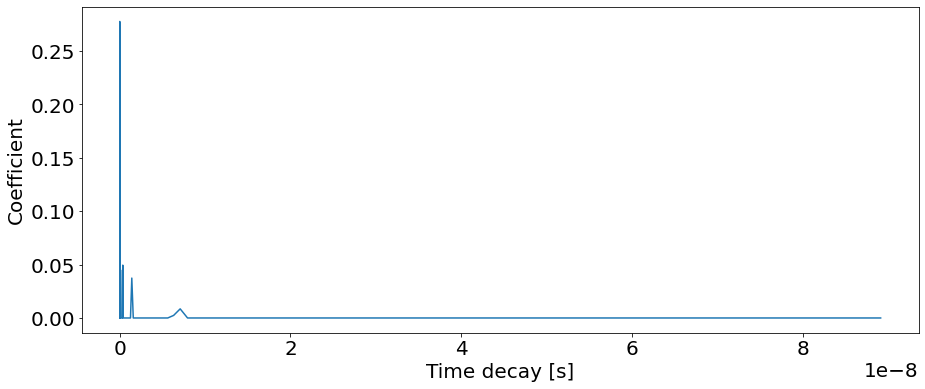

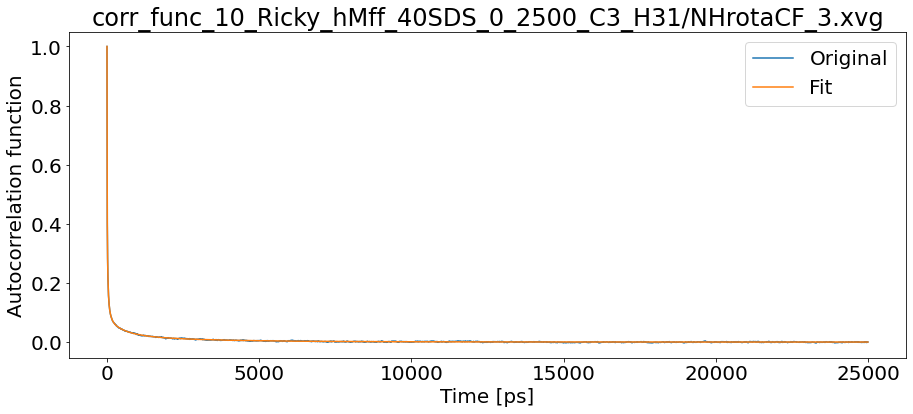

T1: 0.023752226230681458 T2: 0.021691640976954762 NOE: 0


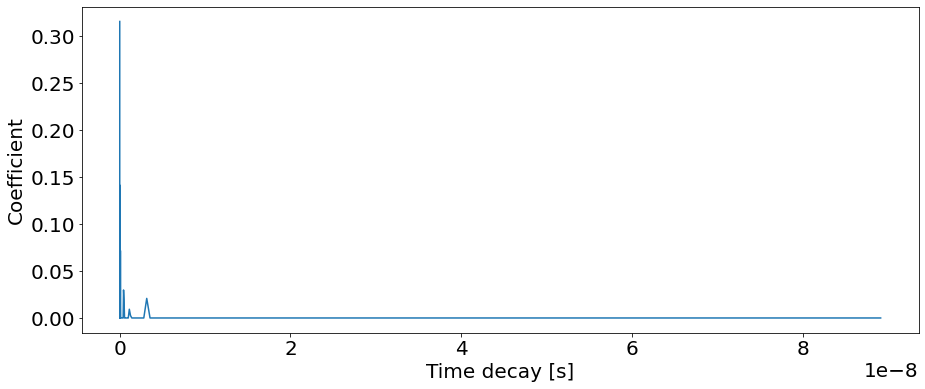

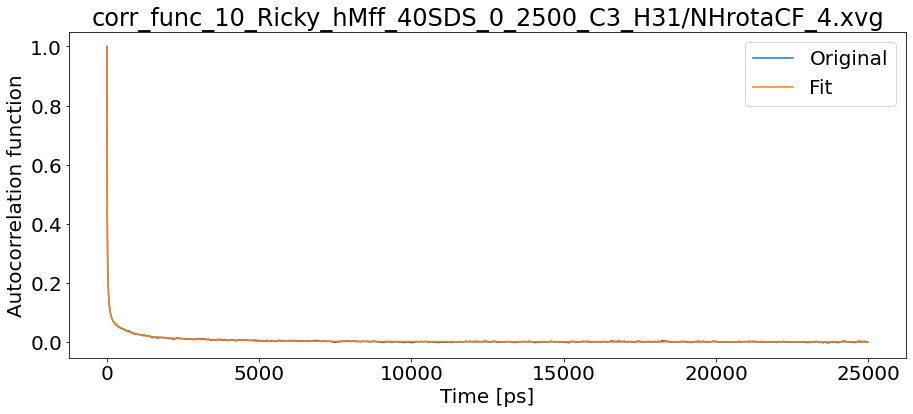

T1: 0.023779572803810007 T2: 0.017057522240391462 NOE: 0


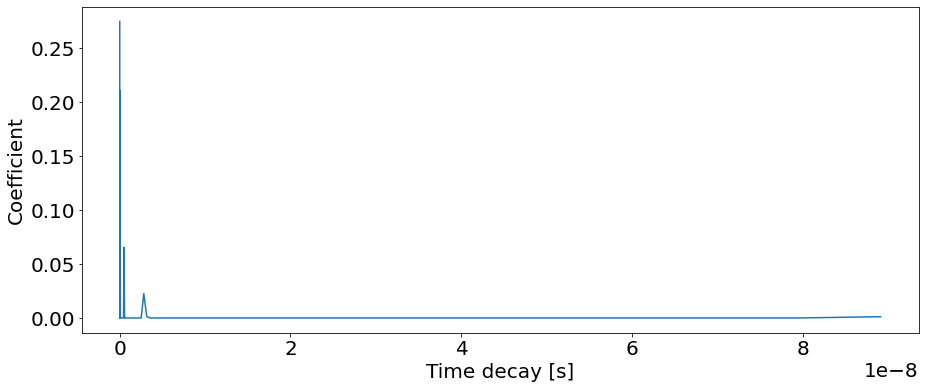

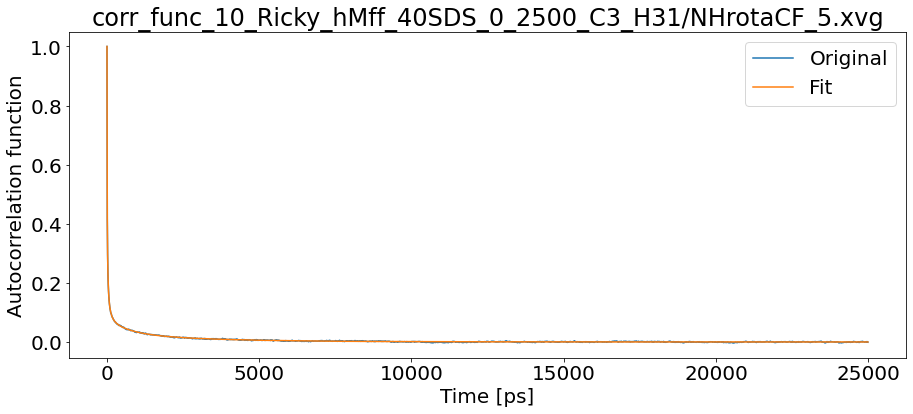

T1: 0.019594571278872958 T2: 0.01730517408028669 NOE: 0


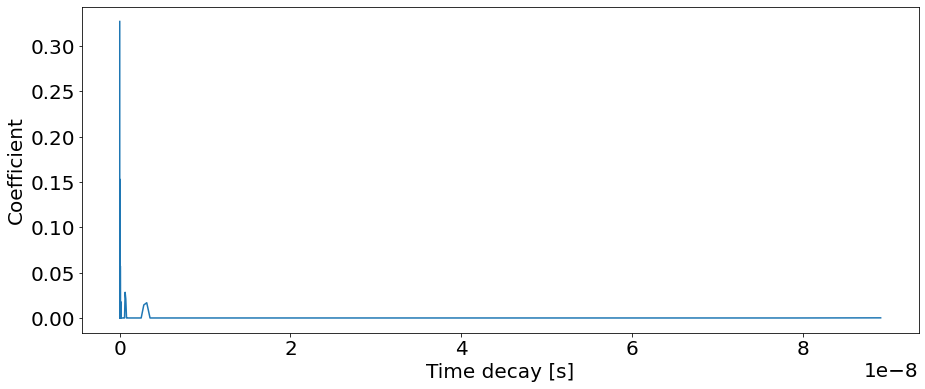

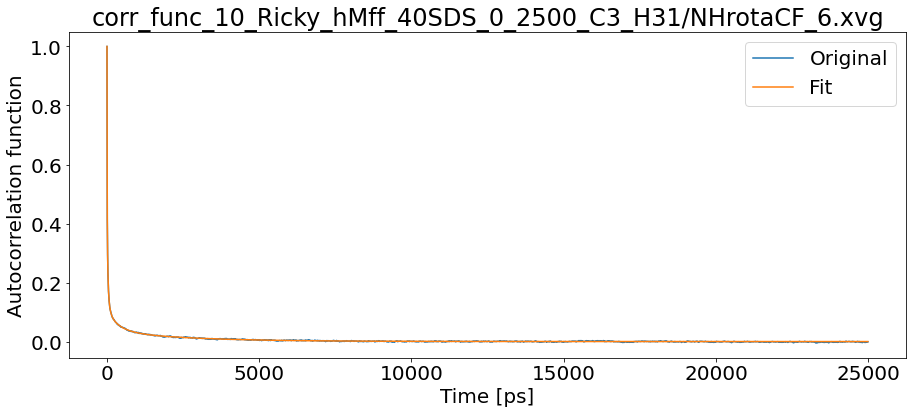

T1: 0.020660531290587838 T2: 0.019056504124356773 NOE: 0


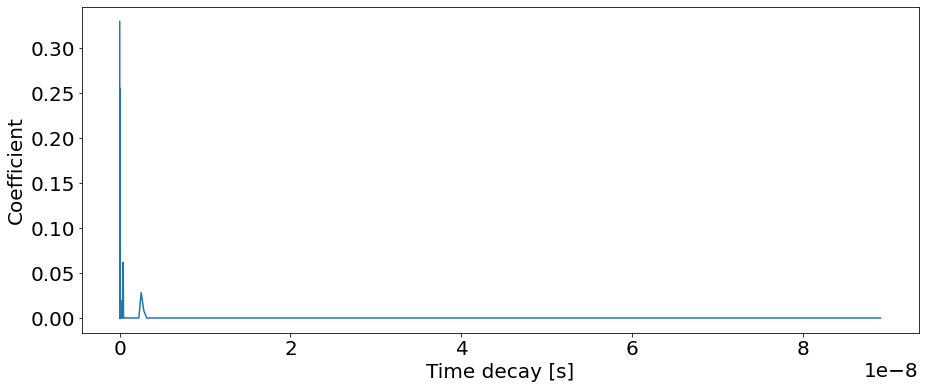

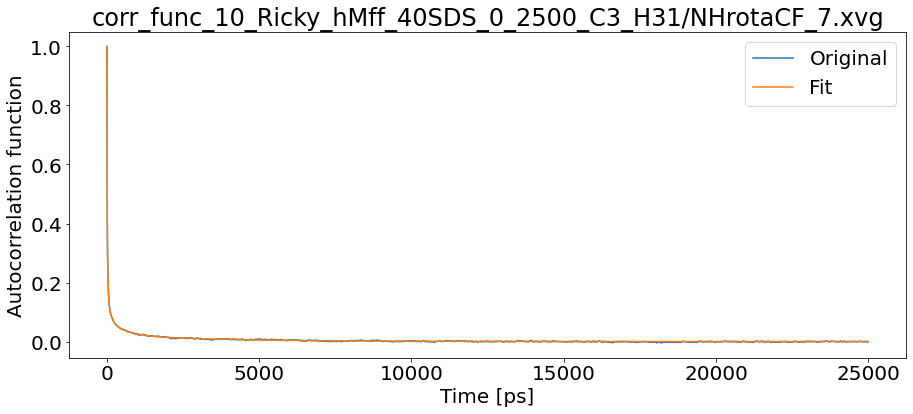

T1: 0.02322767406984952 T2: 0.020873416958775717 NOE: 0


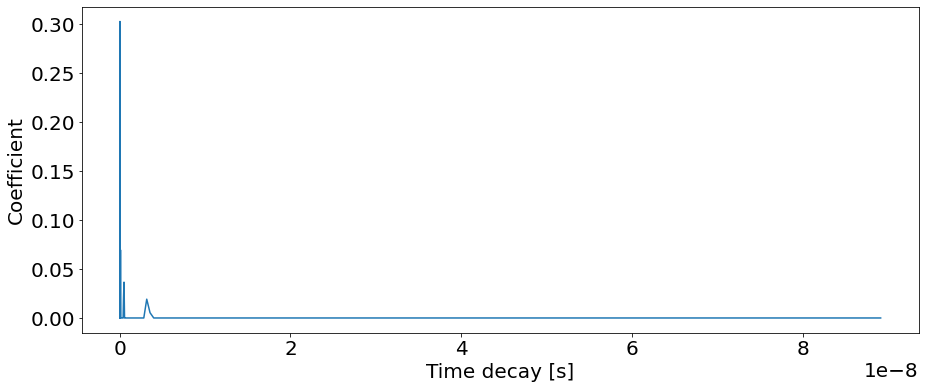

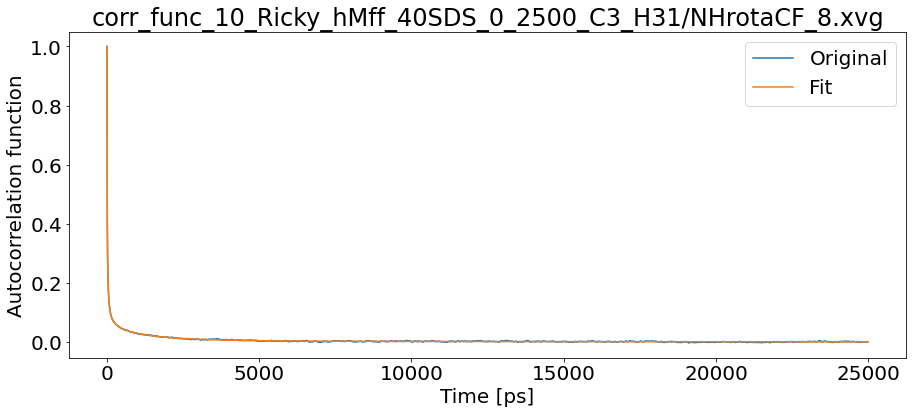

T1: 0.02376504334480216 T2: 0.019046875348391726 NOE: 0


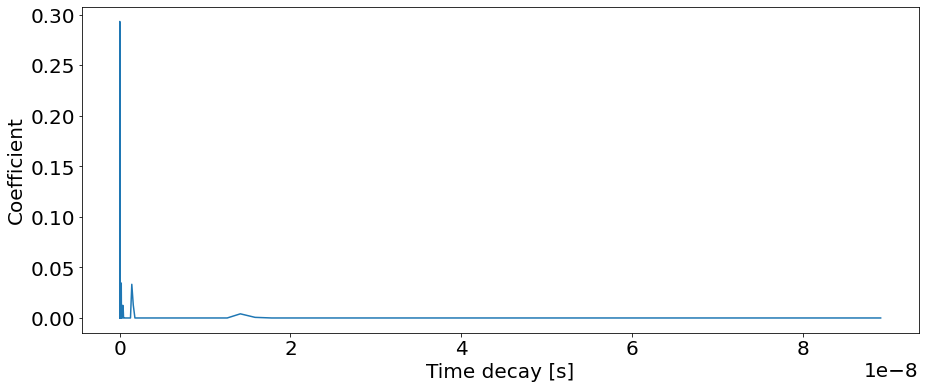

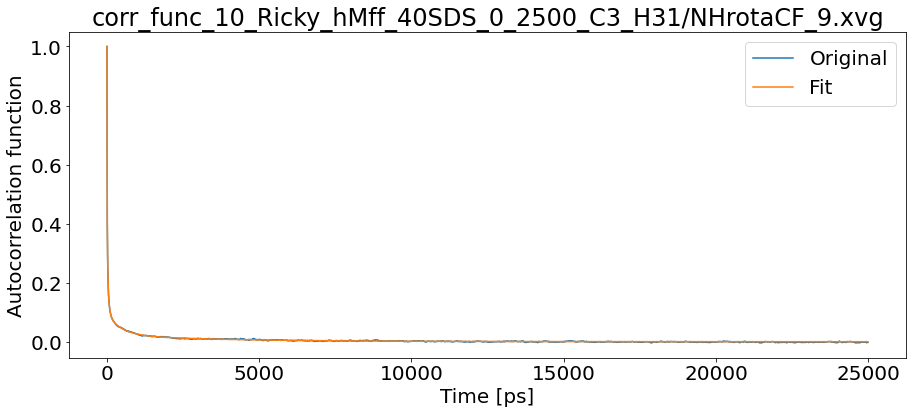

T1: 0.02266312210844121 T2: 0.019818919106500292 NOE: 0


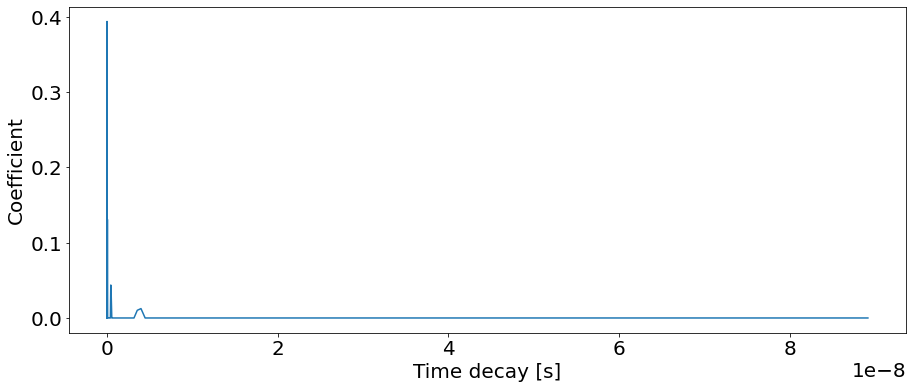

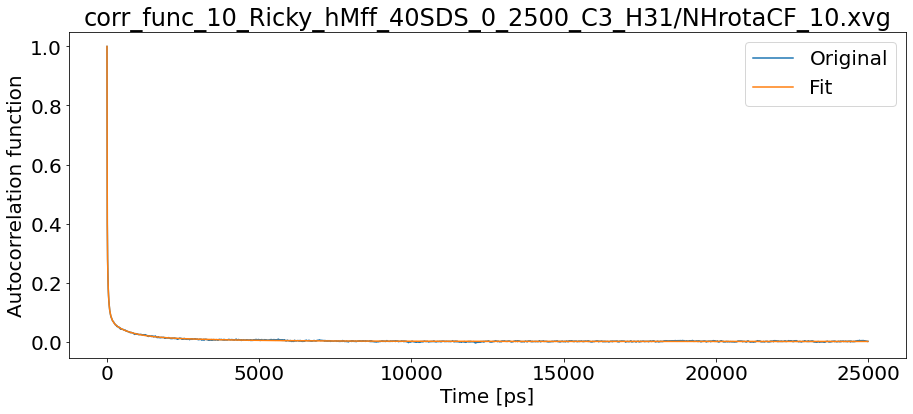

T1: 0.025209546204796006 T2: 0.020747383387523827 NOE: 0


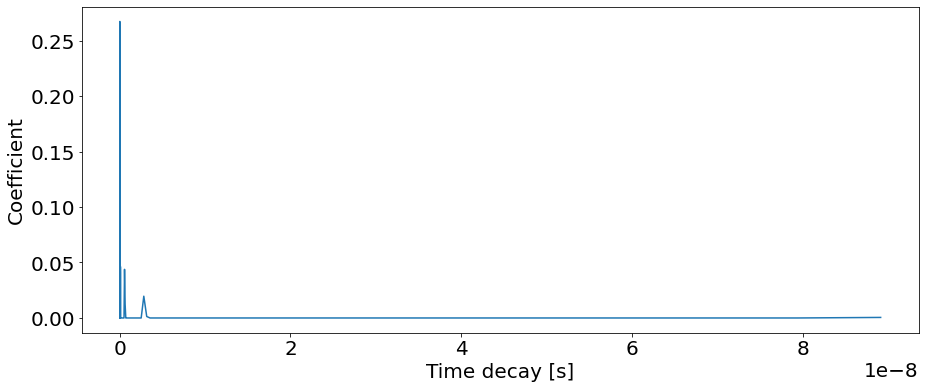

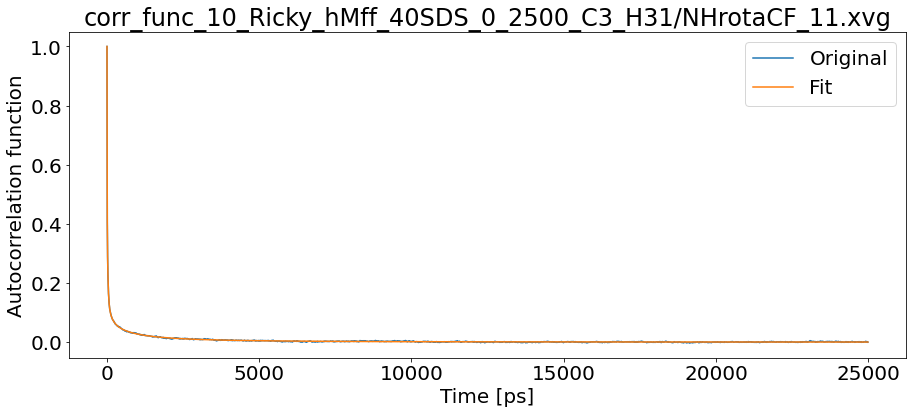

T1: 0.0233545375973117 T2: 0.018669304482141325 NOE: 0


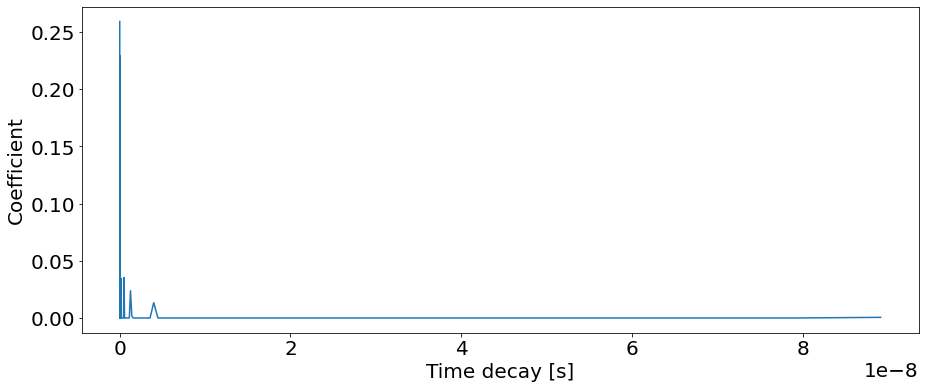

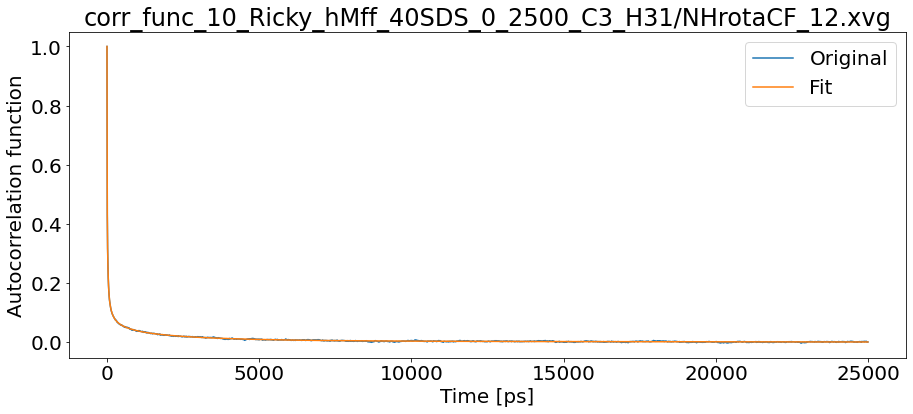

T1: 0.01745432213182672 T2: 0.013316508824275918 NOE: 0


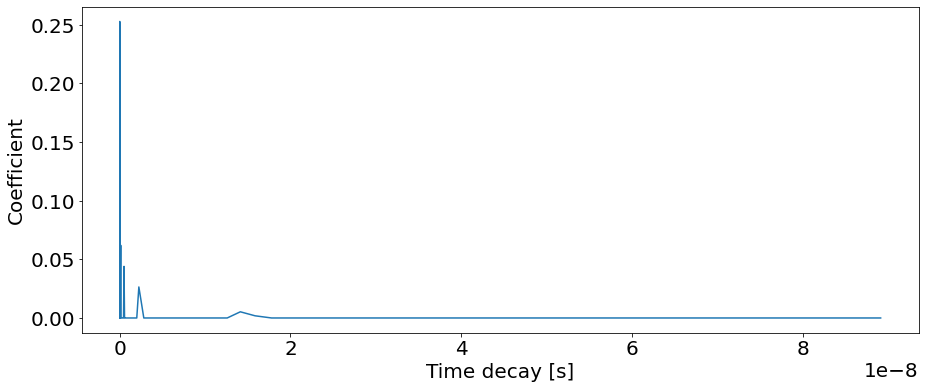

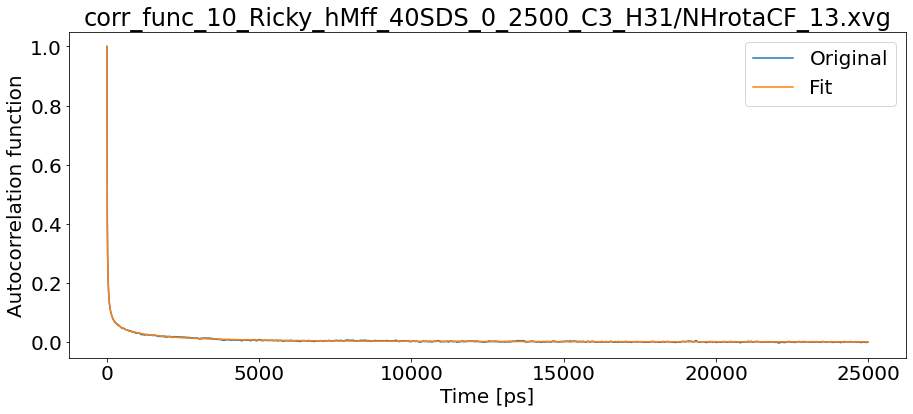

T1: 0.020934631709722207 T2: 0.017902894618443087 NOE: 0


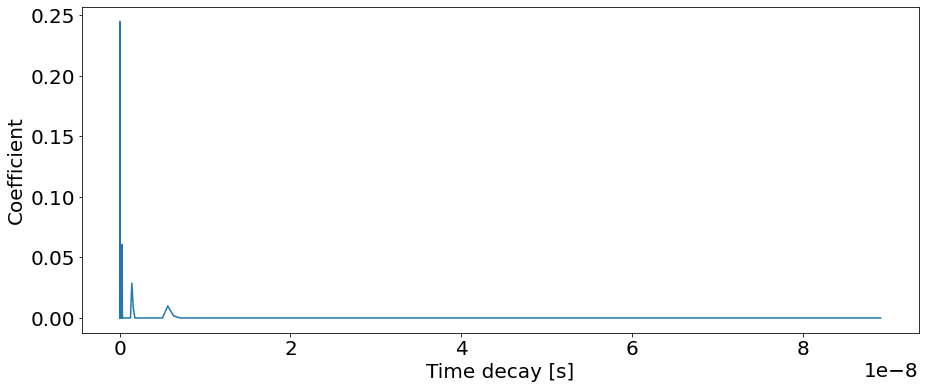

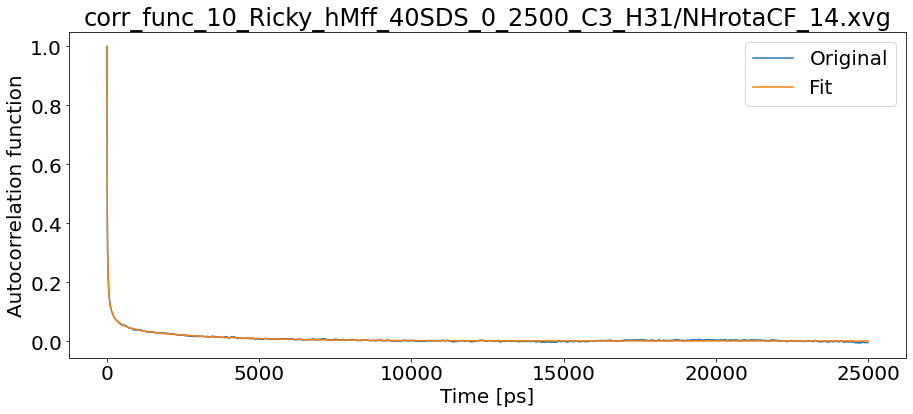

T1: 0.016641402469332413 T2: 0.011173427465065779 NOE: 0


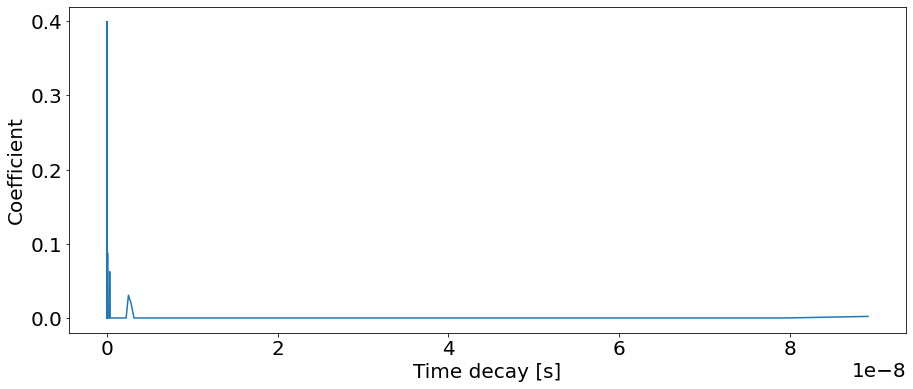

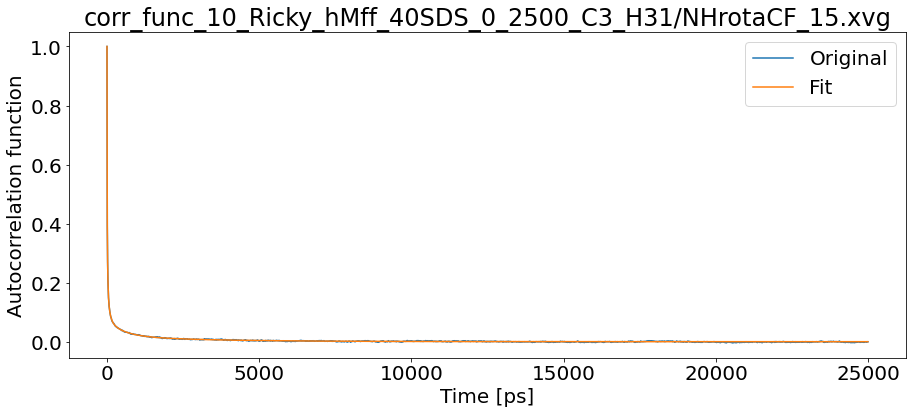

T1: 0.02626201876316893 T2: 0.024039345651363737 NOE: 0


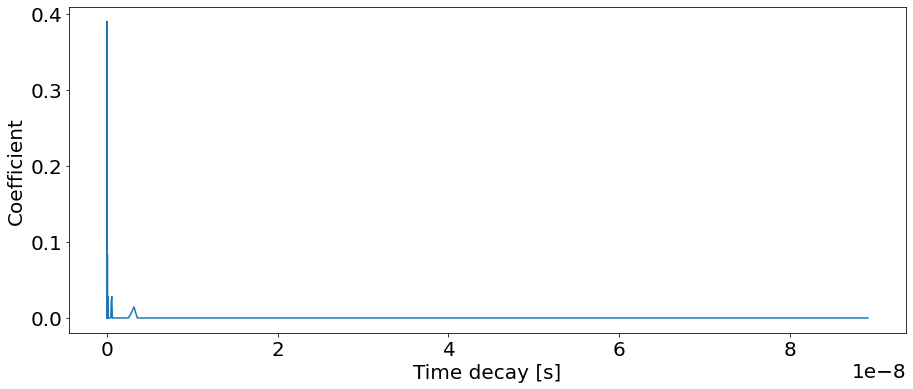

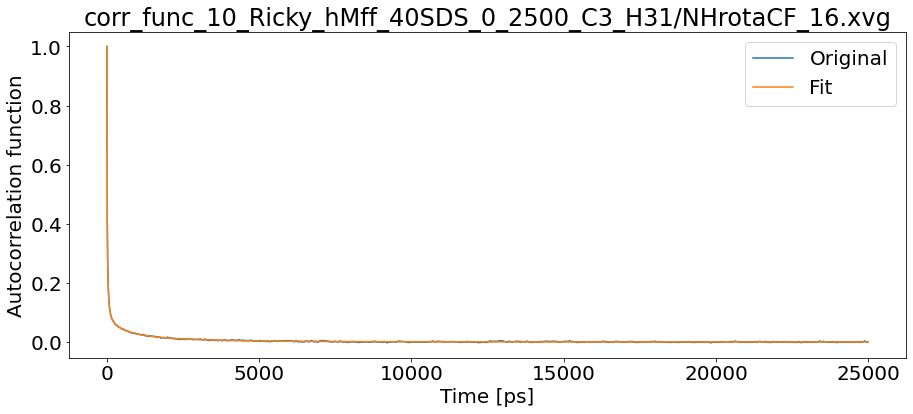

T1: 0.024083209881332744 T2: 0.02177756344812034 NOE: 0


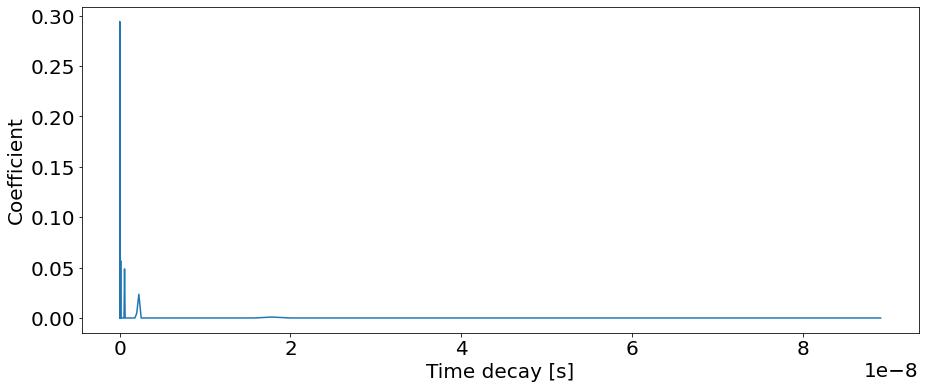

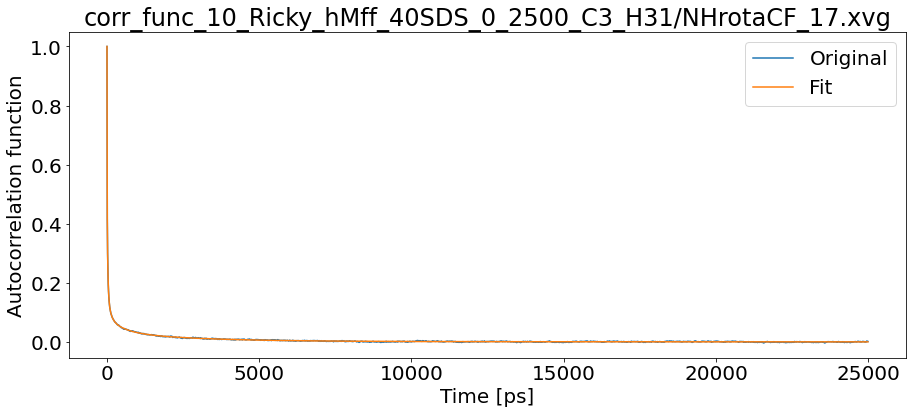

T1: 0.020272639384970224 T2: 0.016624991500043457 NOE: 0


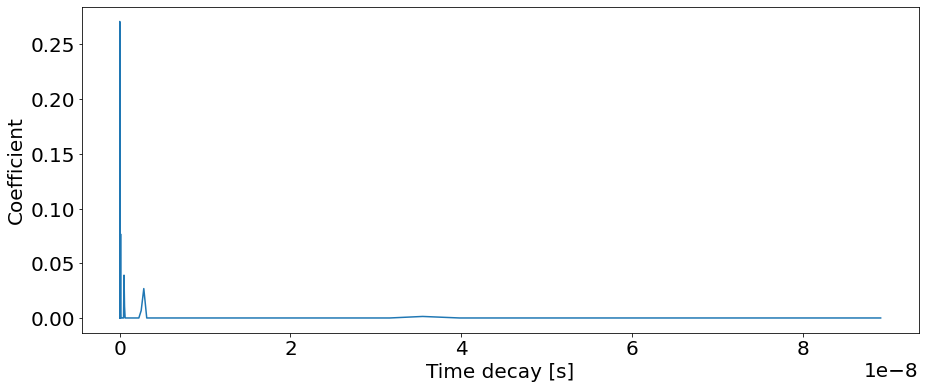

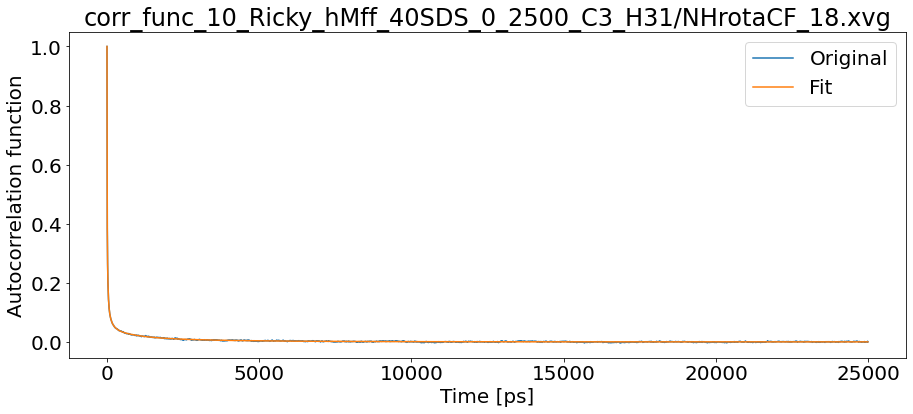

T1: 0.02806553602383242 T2: 0.025644628848473988 NOE: 0


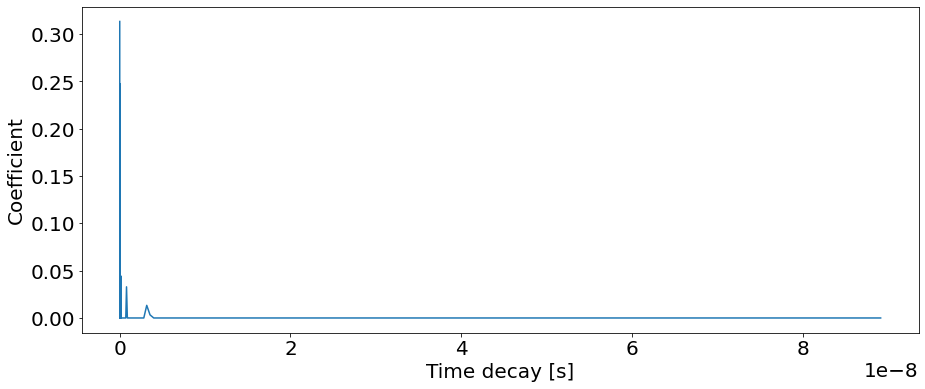

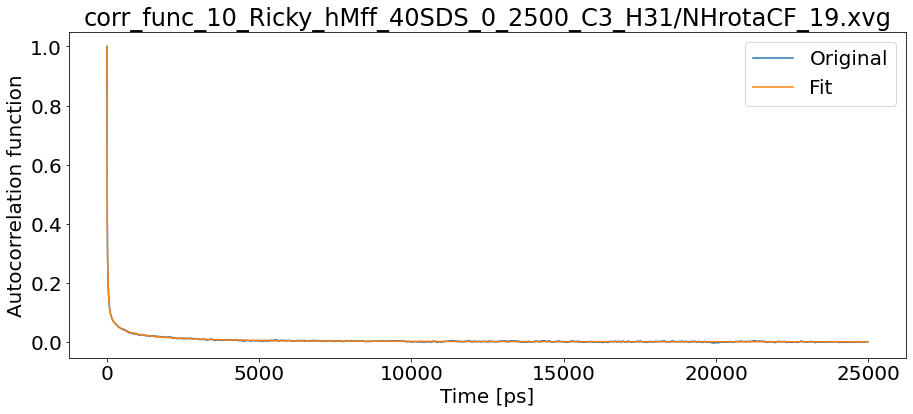

T1: 0.023877350043339417 T2: 0.0210696244208524 NOE: 0


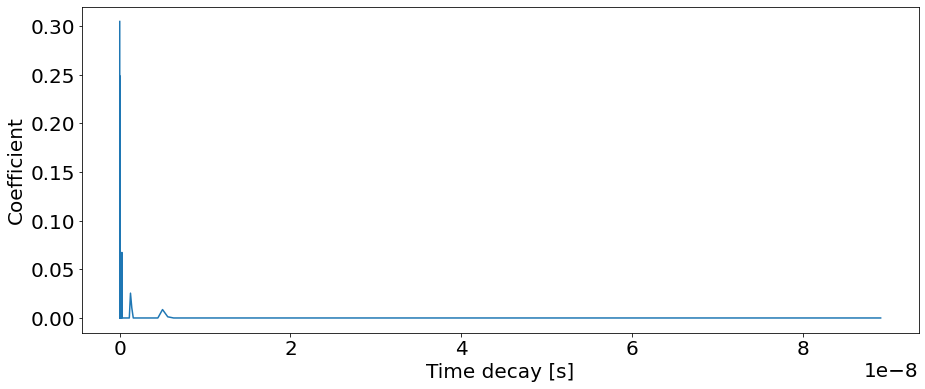

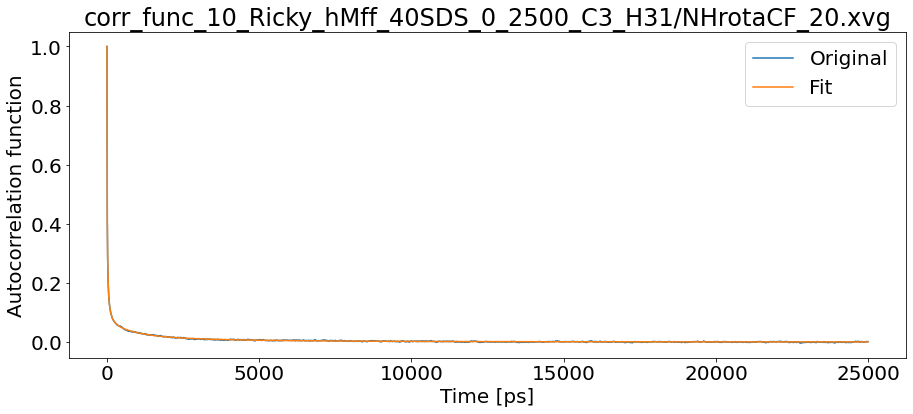

T1: 0.021117689525104705 T2: 0.01839330019086811 NOE: 0


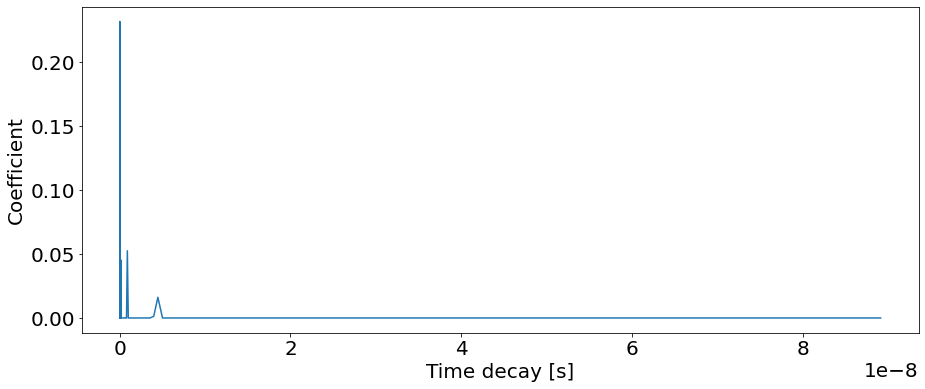

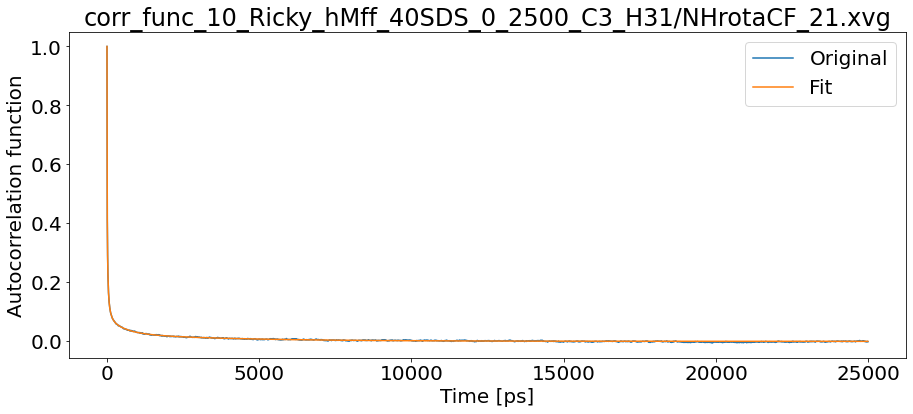

T1: 0.020078984852541247 T2: 0.017235555143534968 NOE: 0


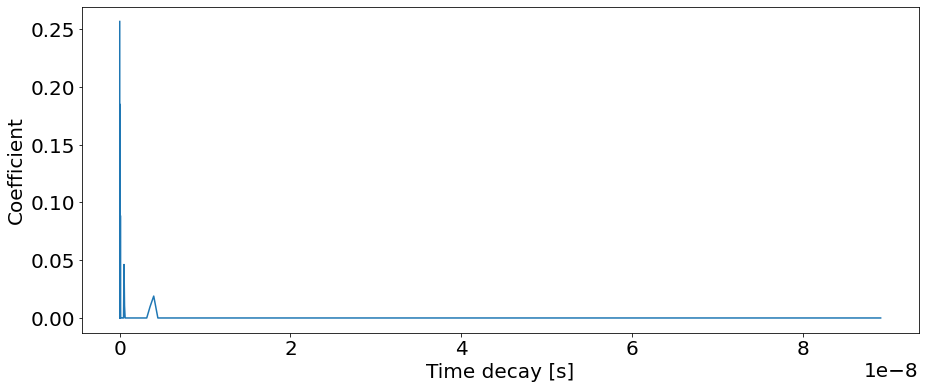

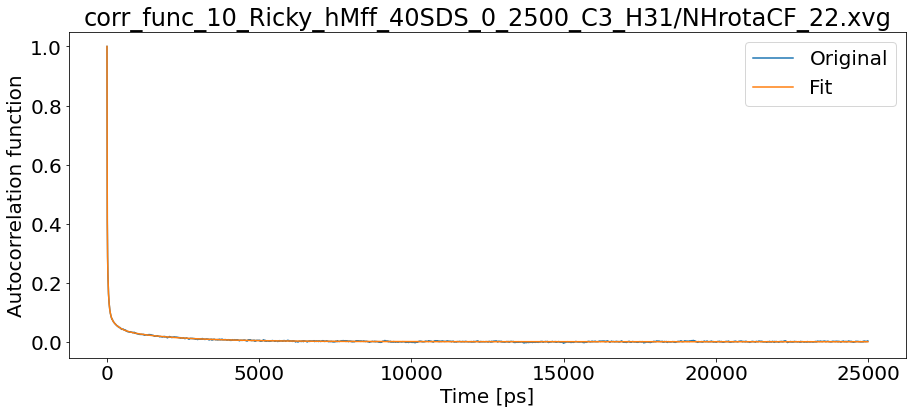

T1: 0.02280497765191237 T2: 0.018622227966352066 NOE: 0


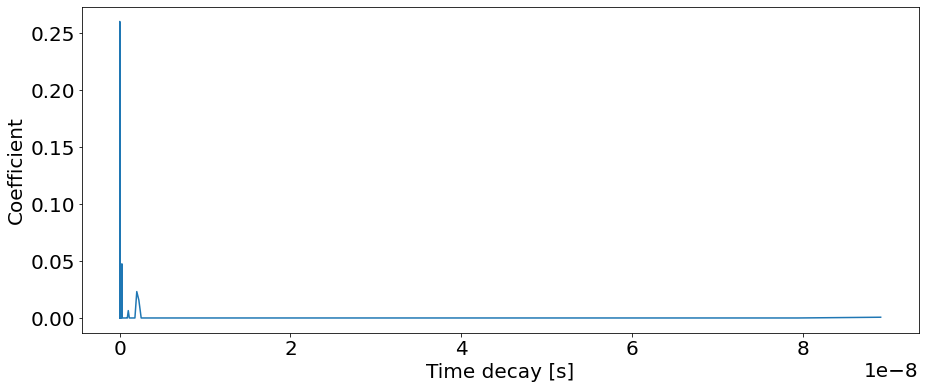

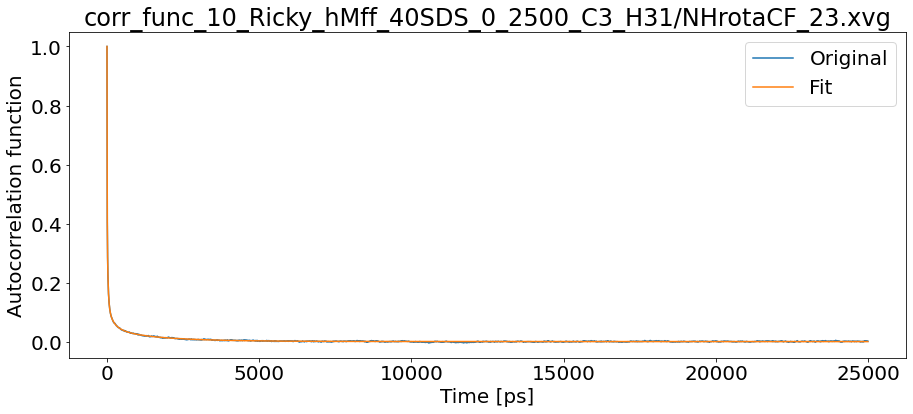

T1: 0.025903700508529217 T2: 0.01968755653073168 NOE: 0


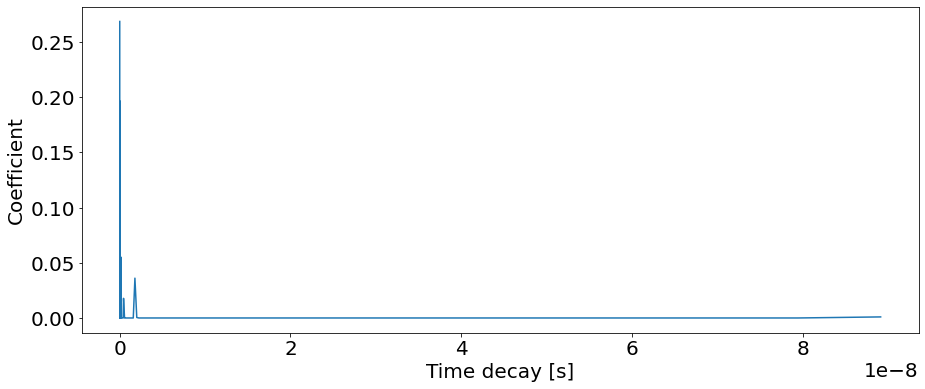

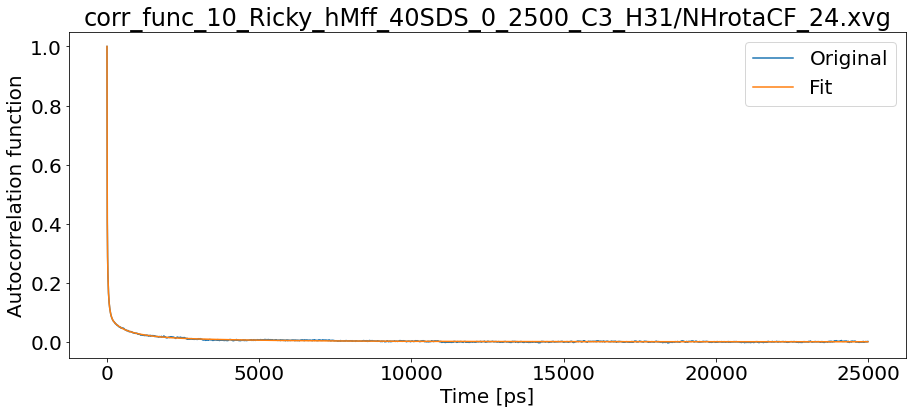

T1: 0.0226333028865456 T2: 0.020001548458833823 NOE: 0


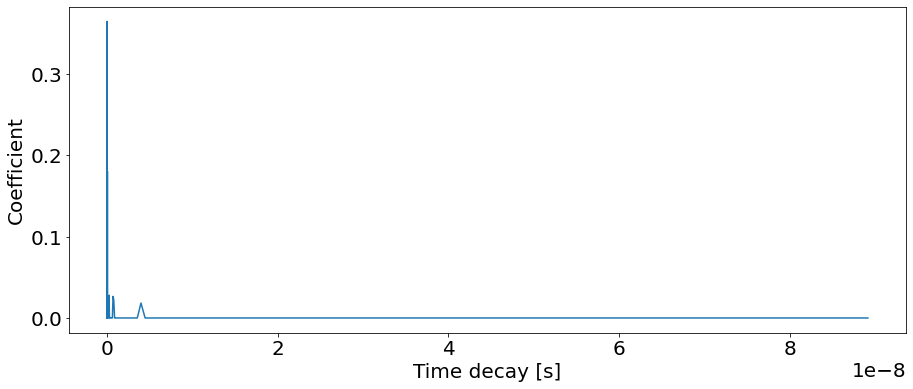

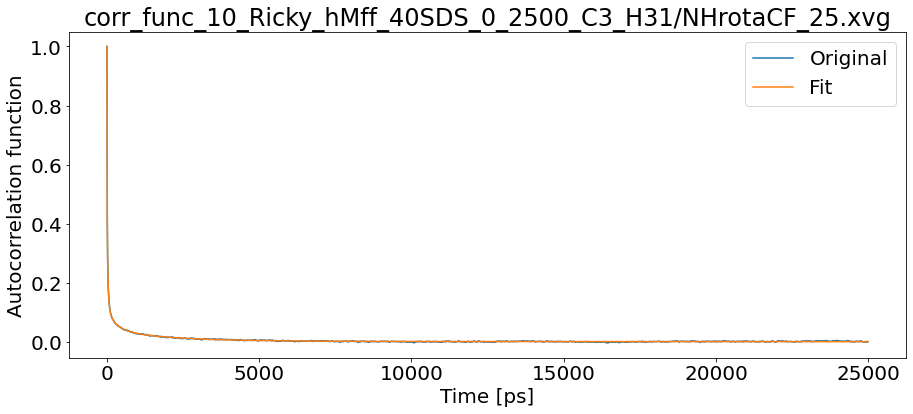

T1: 0.02303742730922957 T2: 0.01551224195520035 NOE: 0


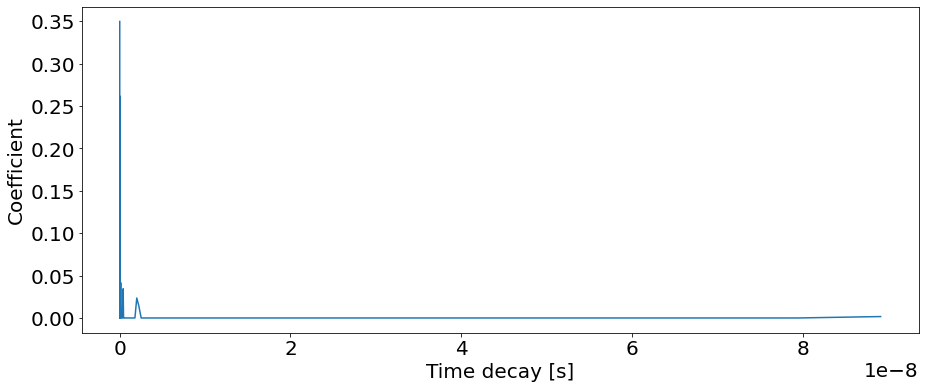

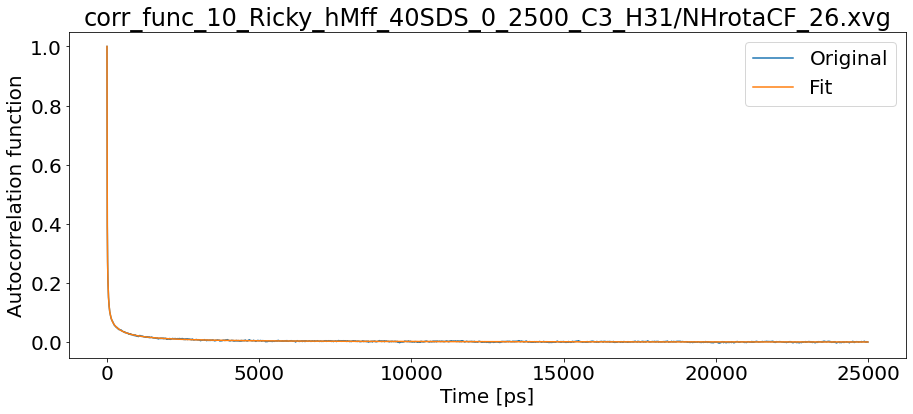

T1: 0.028087140422347275 T2: 0.023781865398990926 NOE: 0


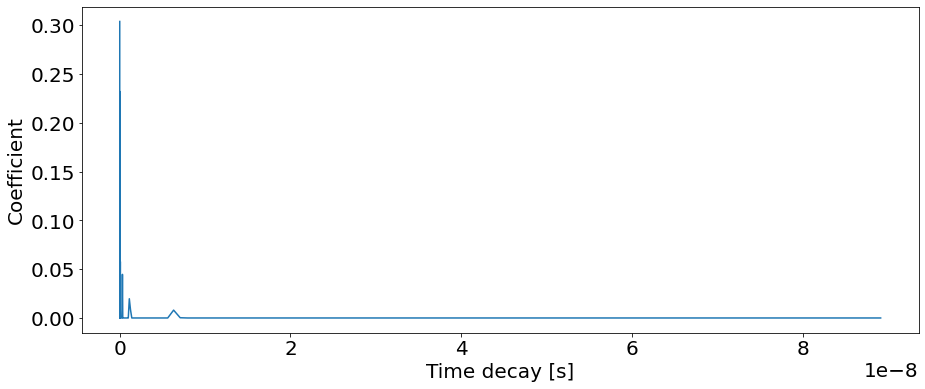

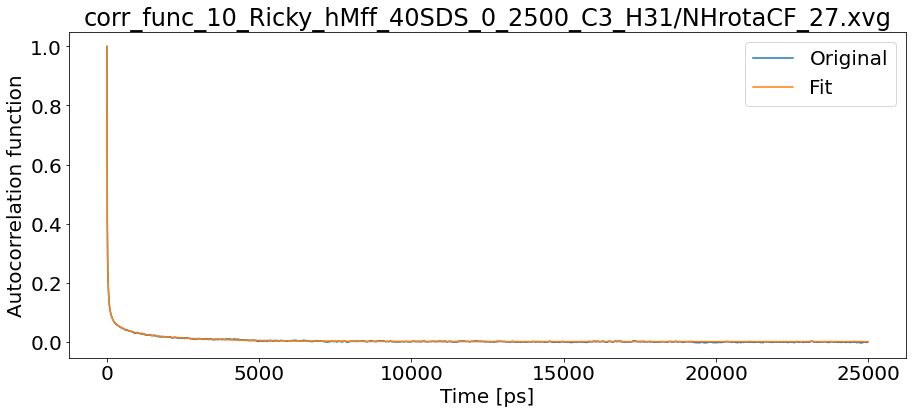

T1: 0.02218876521054758 T2: 0.02087195156253384 NOE: 0


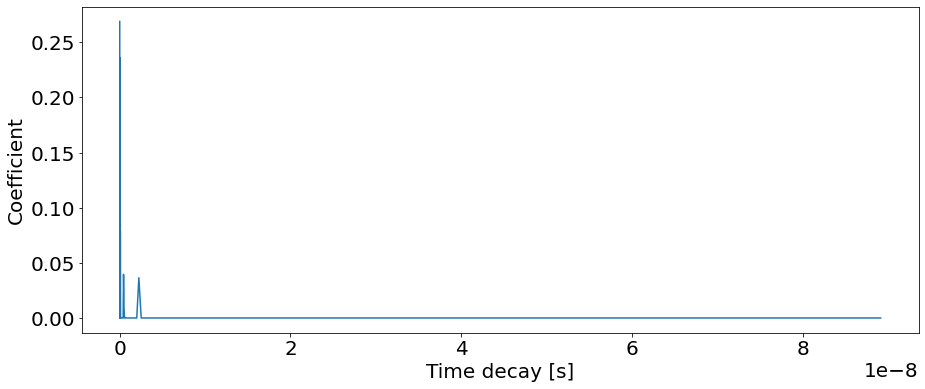

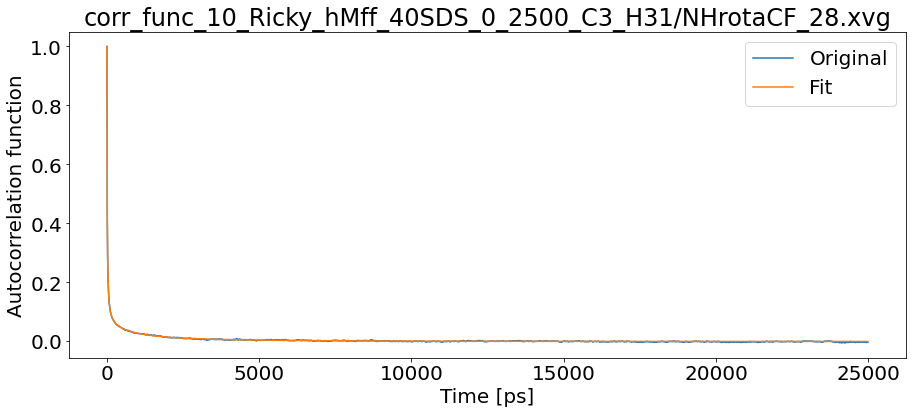

T1: 0.022695334252718795 T2: 0.02056345622645526 NOE: 0


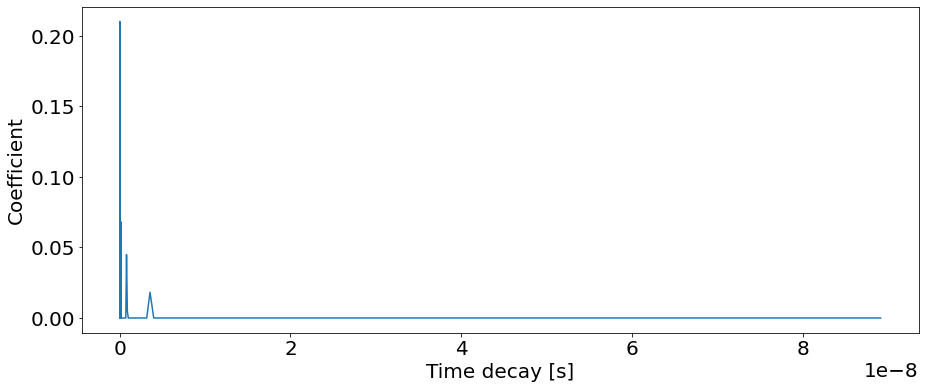

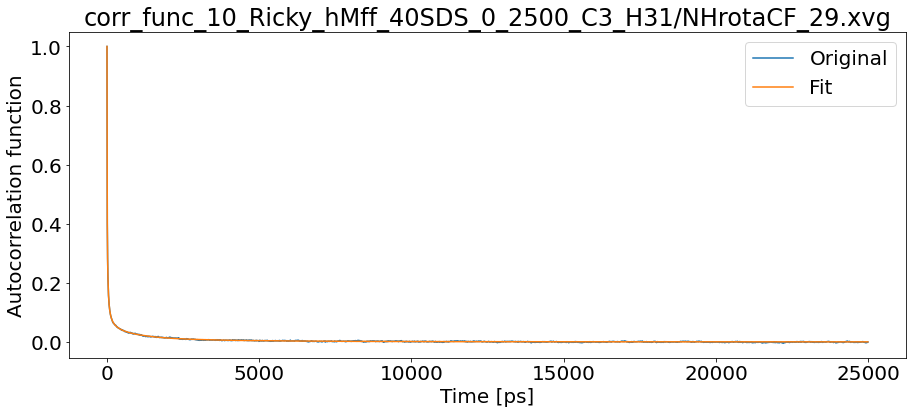

T1: 0.025051259426936135 T2: 0.022542589423557392 NOE: 0


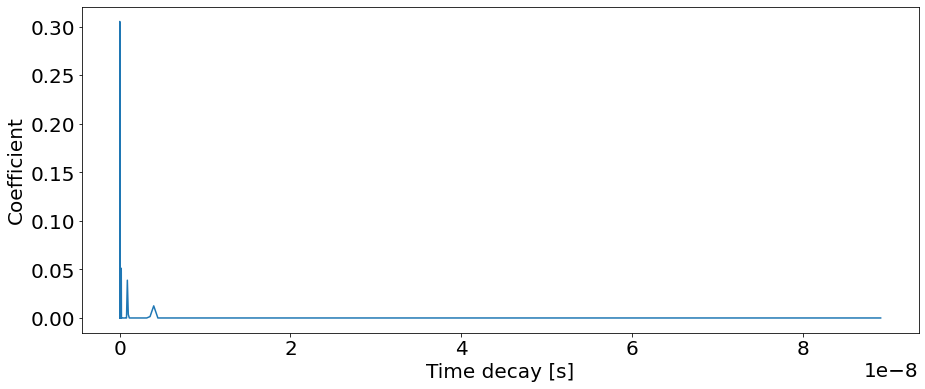

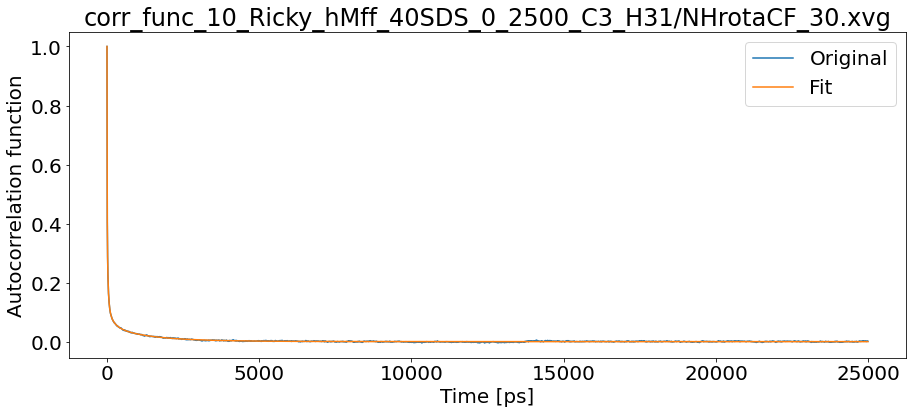

T1: 0.025716140780605024 T2: 0.022309656397970678 NOE: 0


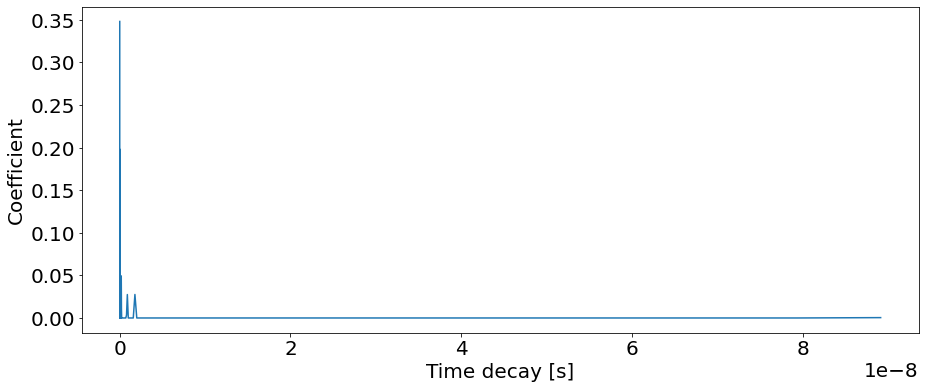

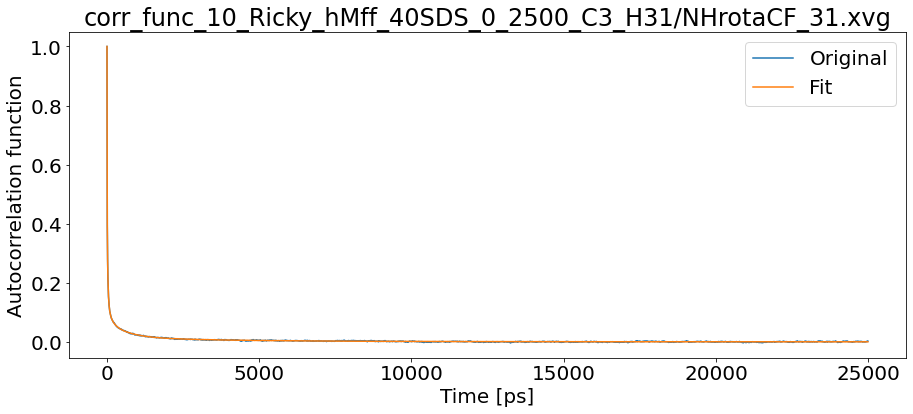

T1: 0.025639234108557656 T2: 0.022727620999572002 NOE: 0


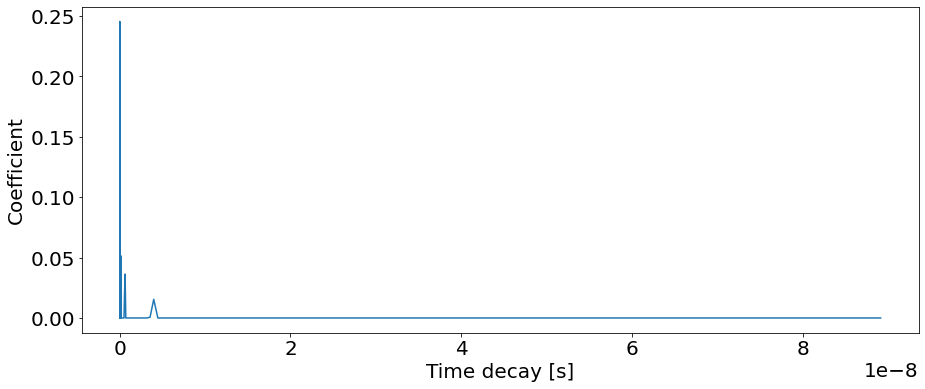

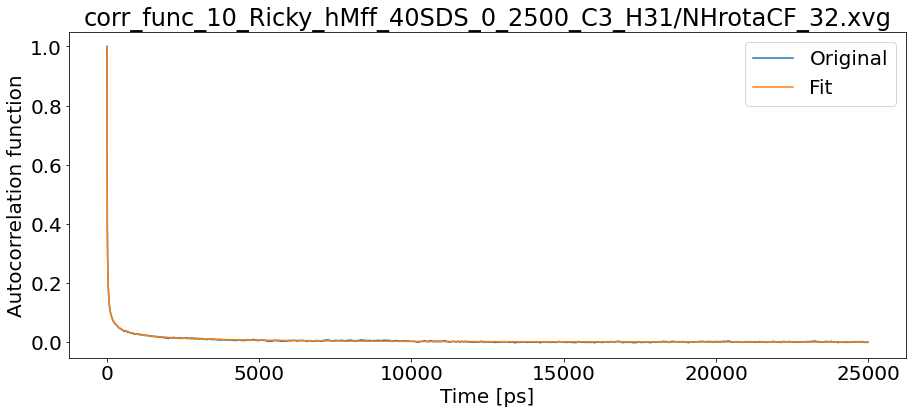

T1: 0.02278088383798924 T2: 0.019212455590197176 NOE: 0


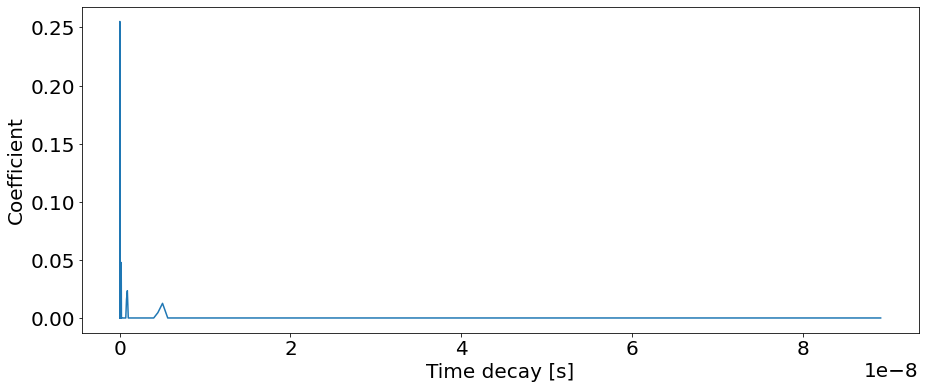

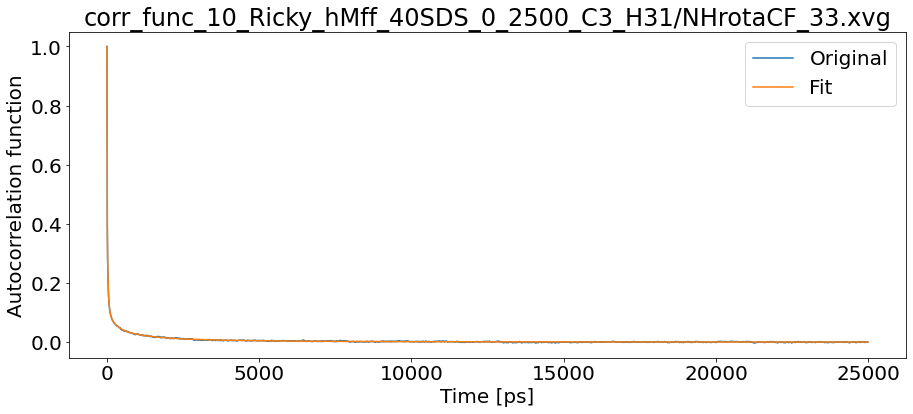

T1: 0.02411664473153344 T2: 0.0216685290287767 NOE: 0


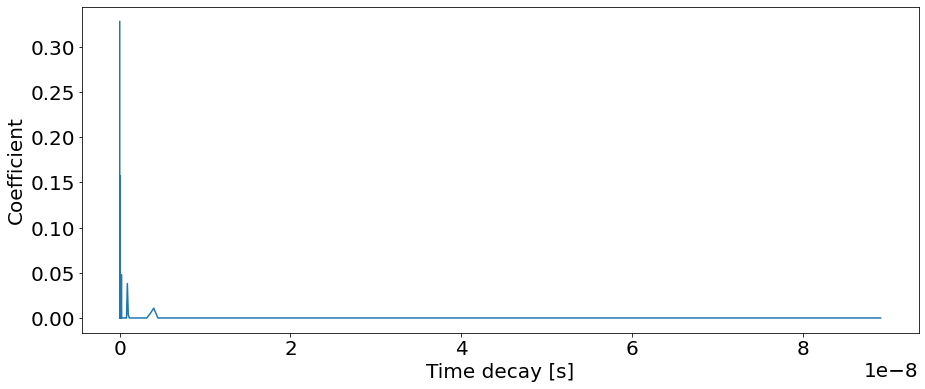

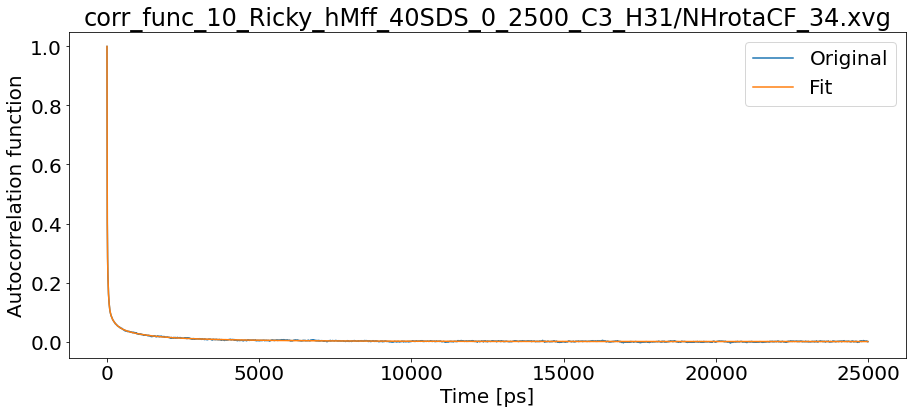

T1: 0.0234880201675006 T2: 0.02131440599695237 NOE: 0


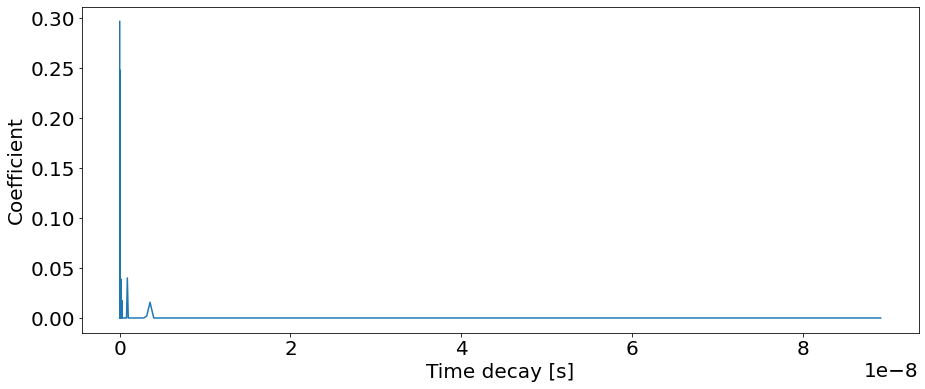

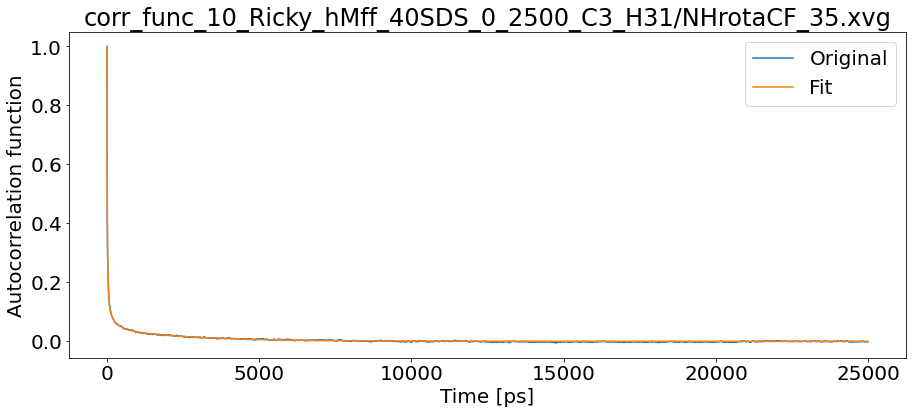

T1: 0.019327129466067145 T2: 0.017738697036933433 NOE: 0


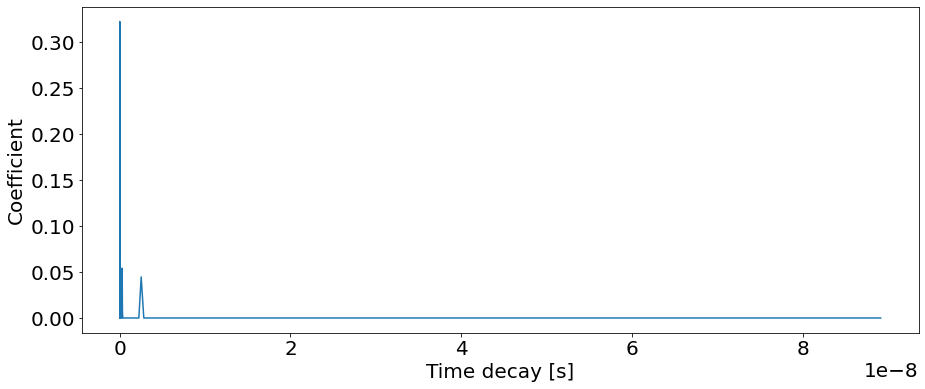

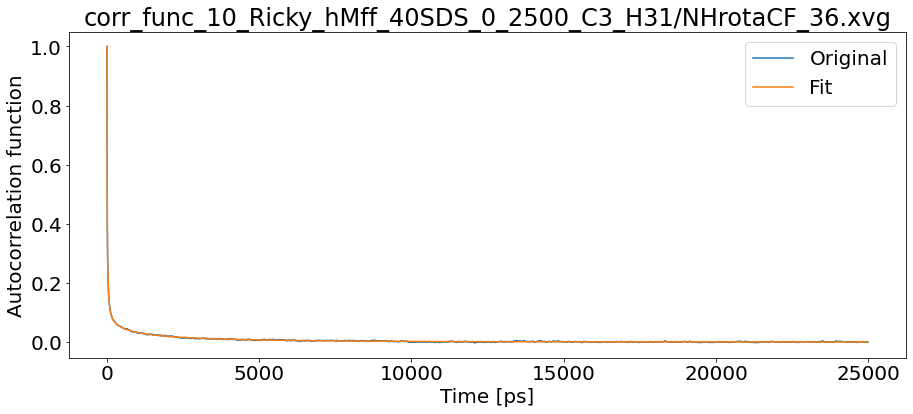

T1: 0.019679273536900403 T2: 0.01576660398348982 NOE: 0


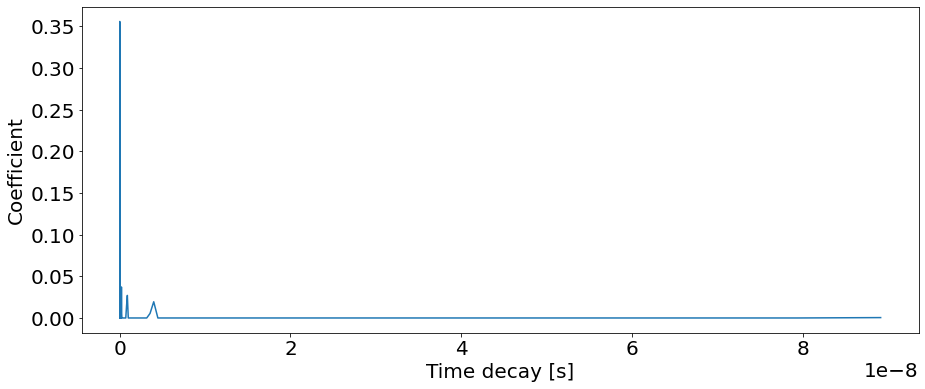

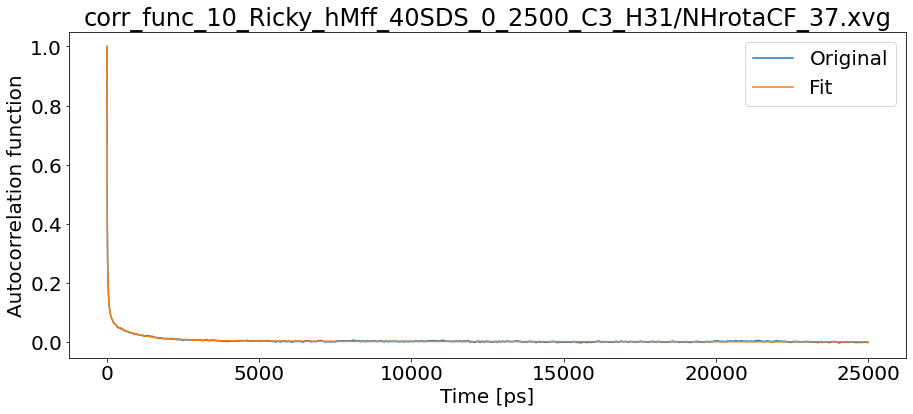

T1: 0.02752554454257997 T2: 0.023317966909880056 NOE: 0


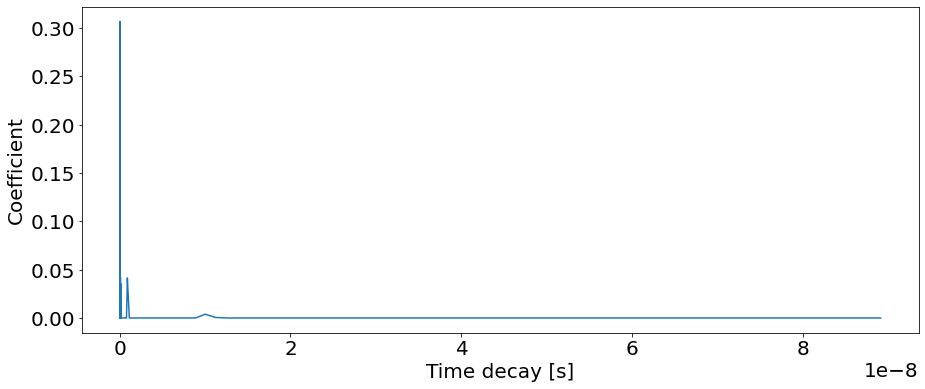

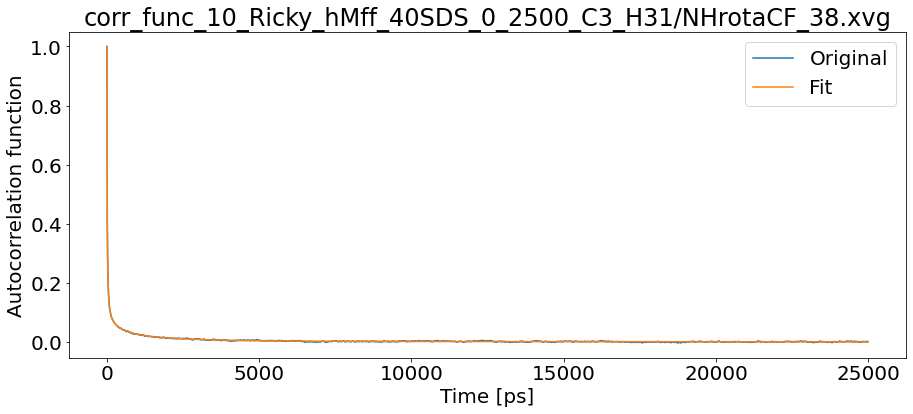

T1: 0.025274173428710325 T2: 0.018890432975426814 NOE: 0


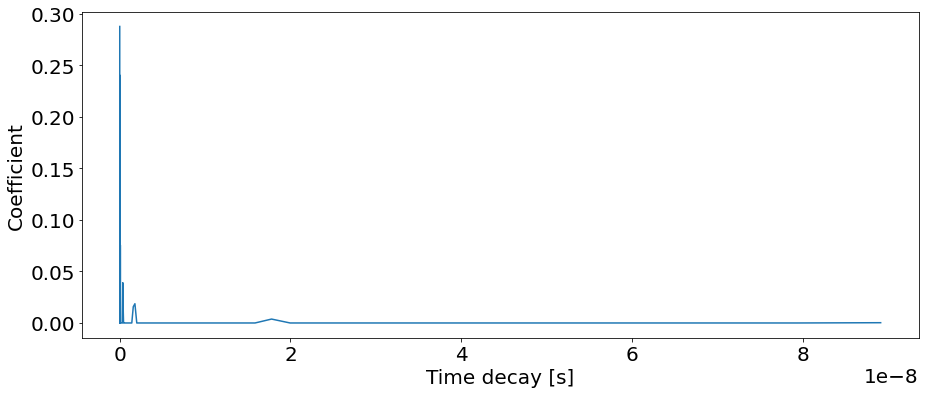

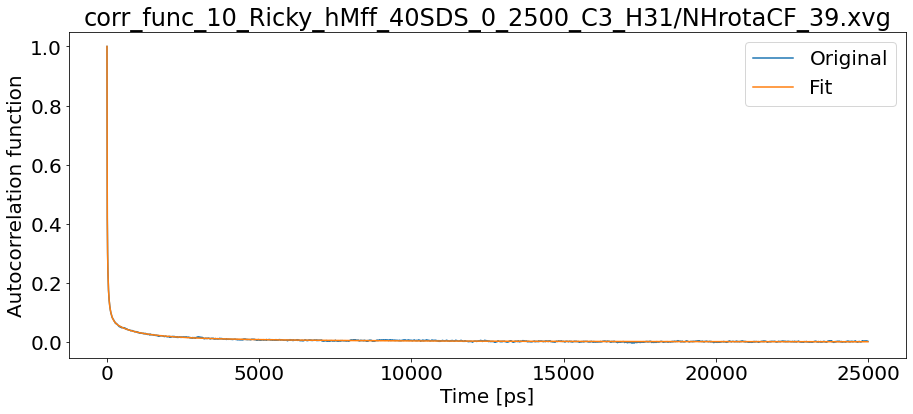

T1: 0.020384382441073608 T2: 0.01652057703165024 NOE: 0


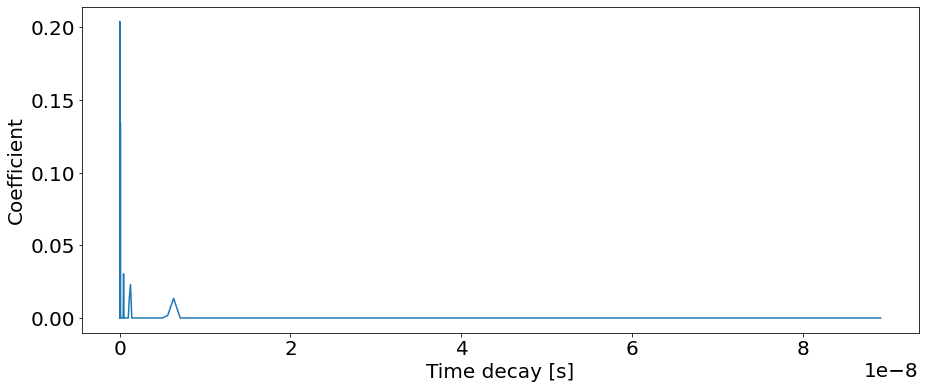

In [4]:
#2.8.2022 - try different lengths of the trajectory


"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=100 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"
input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"
residues=40


author_name="Ricky Nencini"


#hMff 40SDS
path="/home/nenciric/Documents/MD/simulations/22_hMff_micelle_40SDS_CHARMM_310K_Na_Neut_OPC_10_Ricky/"
grofile="10_Ricky_hMff_40SDS.gro"
xtcfile="10_Ricky_hMff_40SDS.xtc"
tprfile="10_Ricky_hMff_40SDS.tpr"


ends=[100000,200000,500000,1000000,1500000,2000000,2500000,-1]

ends=[2500000]

for end in ends:
    #for atom1, atom2 in [("C1","H11"),("C3","H31")]:
    #    rt.CalculateCorrelationFunctions(path,begin,end,RM_avail,grofile,xtcfile,tprfile,atom1,atom2,moleculeType)

    file_to_copy= "corr_func"+ "_"  +   grofile[:-4] + "_" + str(int(begin/1000)) + "_" + str(int(end/1000)) + "_" + str(atom1) + "_" + str(atom2)+"/NHrotaCF_0.xvg"
    copy_to = "corr_func"+ "_"  +   grofile[:-4] + "_" + str(int(begin/1000)) + "_" + str(int(end/1000)) + "_C1_H11/NHrotaCF_1.xvg"
    #os.system("cp " + file_to_copy + " " + copy_to)

    folder_path="corr_func"+ "_"  +   grofile[:-4] + "_" + str(int(begin/1000)) + "_" + str(int(end/1000)) + "_C3_H31/"
    output_name="hMff_40SDS_micelle_SDS_relax_coef_0_"+str(end)+"_030822_gamma.out"


    if take_all_in_folder=="yes":
        for file in os.listdir(folder_path):
            input_corr_file = folder_path+os.fsdecode(file)
            rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    elif take_all_in_folder=="number":
        step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
        Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
        Ctimes = Ctimes * 0.001 * 10 ** (-9);
        Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
        Ctimes_to_save[:,0]=Ctimes
        for i in range(0,residues):
            input_corr_file = folder_path+input_prefix+str(i)+".xvg"
            AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
            Ctimes_to_save[:,i+1]=AA.Coeffs
    else:
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    
    np.savetxt(output_name,Ctimes_to_save)
    
    
    

   

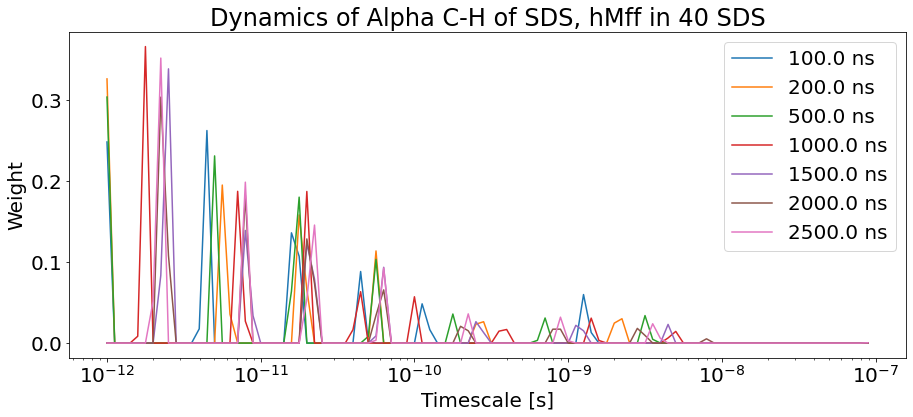

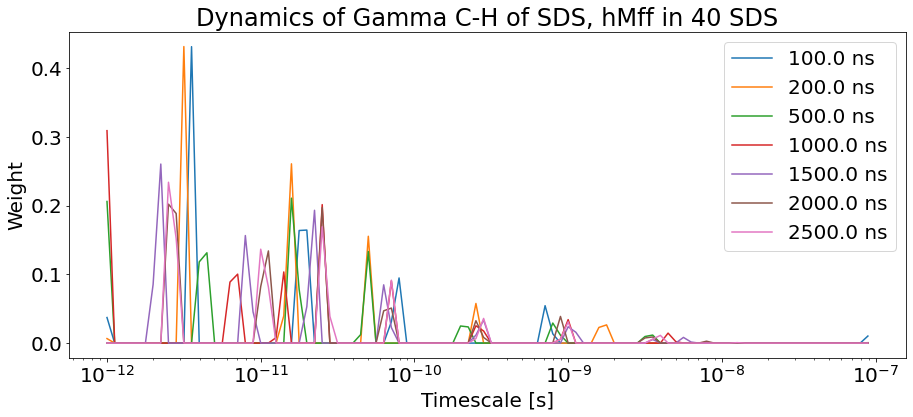

In [38]:
ends=[100000,200000,500000,1000000,1500000,2000000,2500000]
plt.figure(figsize=(15, 6))
plt.rcParams.update({'font.size': 20})
plt.xscale('log')

coef=100

for end in ends:
    output_name="hMff_40SDS_micelle_SDS_relax_coef_0_"+str(end)+"_020822.out"
    coefficients=np.loadtxt(output_name)
    plt.plot(coefficients[:coef,0],coefficients[:coef,1],label=str(end/1000)+" ns")
    
plt.xlabel("Timescale [s]")
plt.ylabel("Weight")
plt.title("Dynamics of Alpha C-H of SDS, hMff in 40 SDS")
plt.legend()
plt.show()

plt.figure(figsize=(15, 6))
plt.rcParams.update({'font.size': 20})
plt.xscale('log')

for end in ends:
    output_name="hMff_40SDS_micelle_SDS_relax_coef_0_"+str(end)+"_020822.out"
    coefficients=np.loadtxt(output_name)
    plt.plot(coefficients[:coef,0],coefficients[:coef,2],label=str(end/1000)+" ns")
    
plt.xlabel("Timescale [s]")
plt.ylabel("Weight")
plt.title("Dynamics of Gamma C-H of SDS, hMff in 40 SDS")
plt.legend()
plt.show()

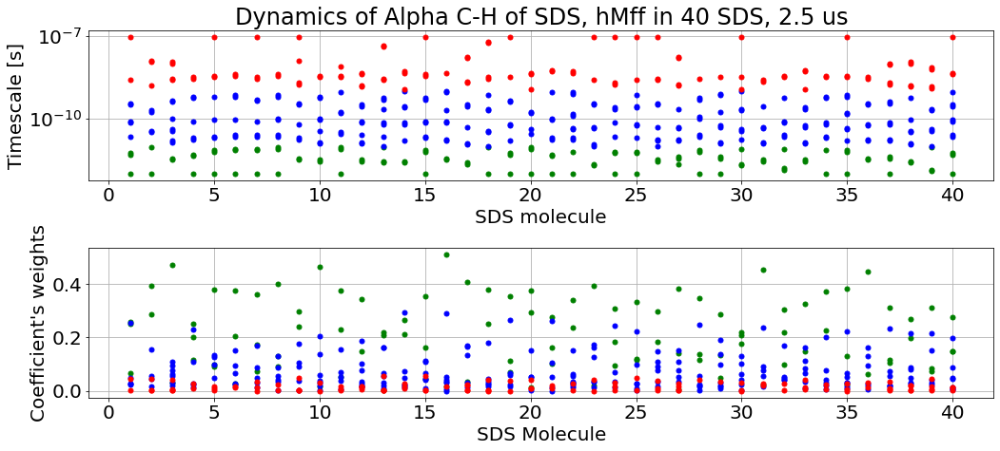

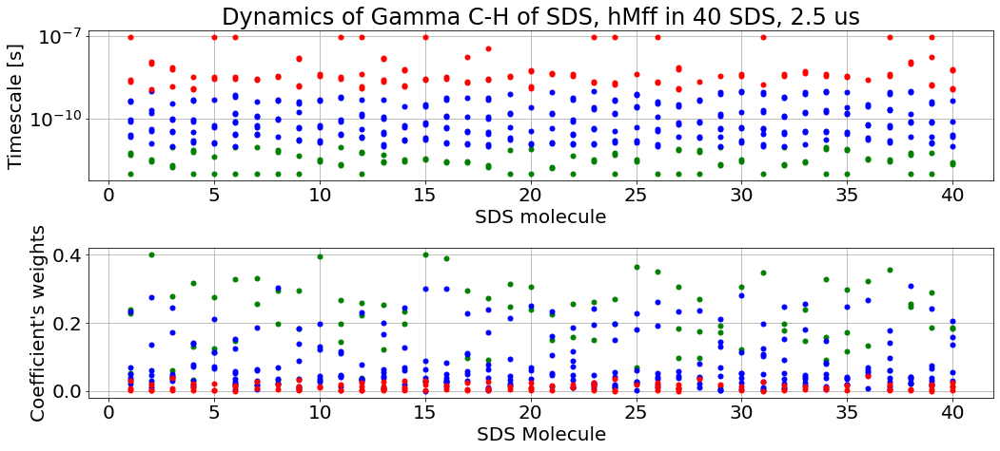

In [33]:
# 3.8.2022 - plot 40 SDS, hMff for diferent lengts of trajectories + individual molecules

Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_030822_alpha.out")

plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Alpha C-H of SDS, hMff in 40 SDS, 2.5 us")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("SDS molecule")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("SDS Molecule")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show()    


Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_030822_gamma.out")


plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Gamma C-H of SDS, hMff in 40 SDS, 2.5 us")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("SDS molecule")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("SDS Molecule")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show() 




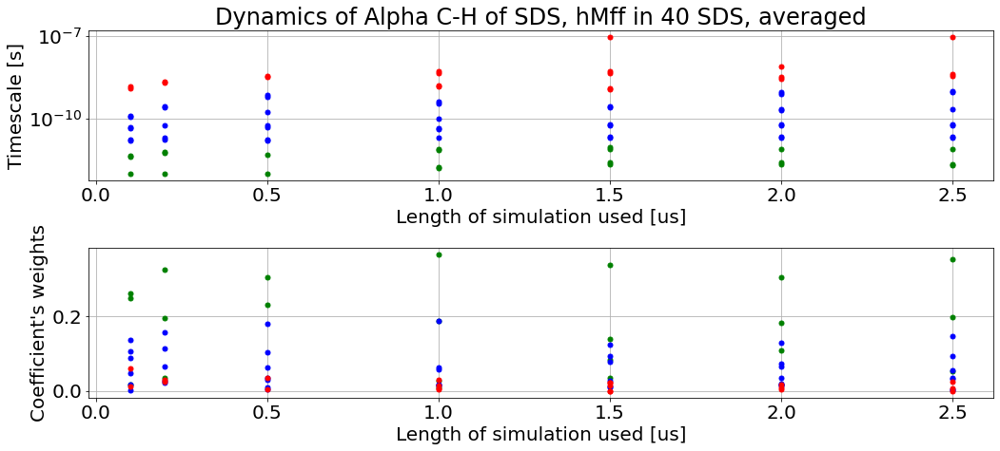

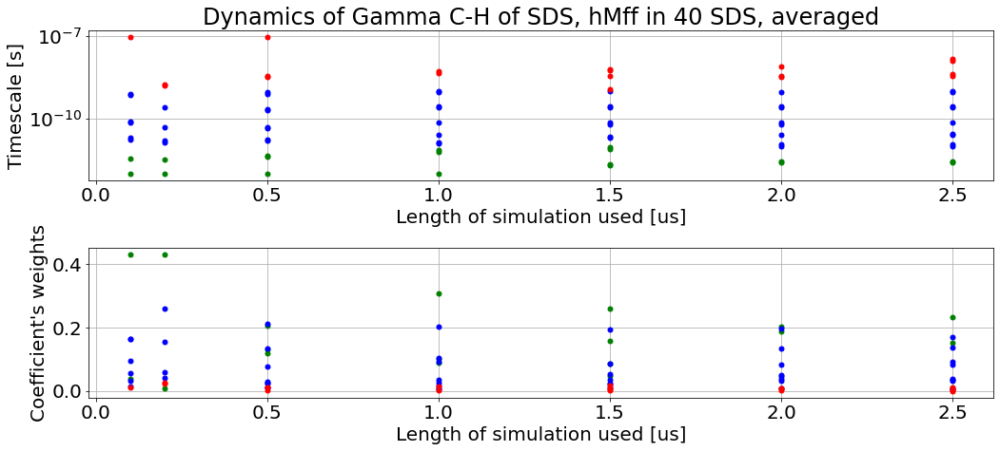

In [34]:
Ctimes_to_save=np.zeros((100,8))
Ctimes_to_save[:,0:2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_100000_020822.out")[:,0:2]
Ctimes_to_save[:,2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_200000_020822.out")[:,1]
Ctimes_to_save[:,3]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_500000_020822.out")[:,1]
Ctimes_to_save[:,4]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1000000_020822.out")[:,1]
Ctimes_to_save[:,5]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1500000_020822.out")[:,1]
Ctimes_to_save[:,6]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2000000_020822.out")[:,1]
Ctimes_to_save[:,7]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_020822.out")[:,1]


plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Alpha C-H of SDS, hMff in 40 SDS, averaged")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Length of simulation used [us]")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])

ends=[100000,200000,500000,1000000,1500000,2000000,2500000]

for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Length of simulation used [us]")


for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show() 



Ctimes_to_save=np.zeros((100,8))
Ctimes_to_save[:,0:2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_100000_020822.out")[:,[0,2]]
Ctimes_to_save[:,2]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_200000_020822.out")[:,2]
Ctimes_to_save[:,3]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_500000_020822.out")[:,2]
Ctimes_to_save[:,4]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1000000_020822.out")[:,2]
Ctimes_to_save[:,5]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_1500000_020822.out")[:,2]
Ctimes_to_save[:,6]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2000000_020822.out")[:,2]
Ctimes_to_save[:,7]=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_2500000_020822.out")[:,2]


plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True



fig, (ax1, ax2) = plt.subplots(2)

ax1.title.set_text("Dynamics of Gamma C-H of SDS, hMff in 40 SDS, averaged")

ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Length of simulation used [us]")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])

ends=[100000,200000,500000,1000000,1500000,2000000,2500000]

for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(length, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Length of simulation used [us]")


for residue in range(1,Ctimes_to_save.shape[1]):
    length=ends[residue-1]/1000000
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(length, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show() 

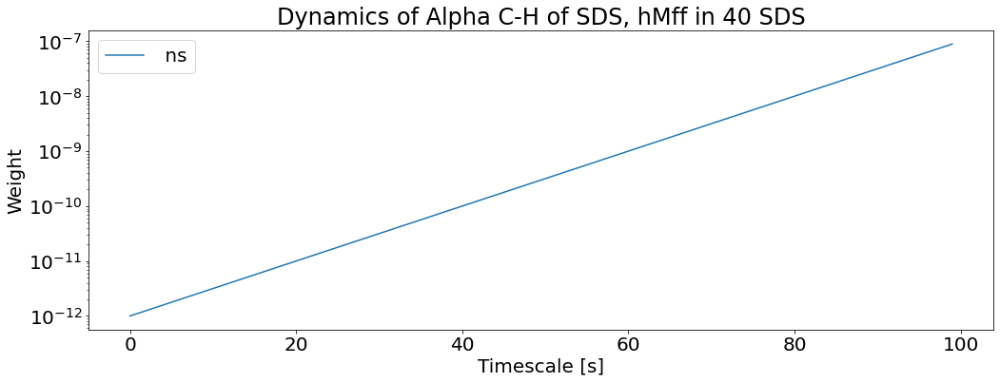

In [44]:
Ctimes_to_save=np.loadtxt("hMff_40SDS_micelle_SDS_relax_coef_0_100000_020822.out")
plt.figure(figsize=(15, 6))
plt.rcParams.update({'font.size': 20})
plt.yscale('log')

coef=100


plt.plot(np.linspace(0, 99,100),Ctimes_to_save[:,0],label=" ns")
    
plt.xlabel("Timescale [s]")
plt.ylabel("Weight")
plt.title("Dynamics of Alpha C-H of SDS, hMff in 40 SDS")
plt.legend()
plt.show()

In [ ]:
#eYqjD 50SDS
path="/media/nenciric/Ricky2022/morgan/1_eYqjD_micelle_50SDS_CHARMM_310K_Na_Neut_OPC/"
grofile="5_eYqjD_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_110ns_mahti_20ns_mahti.gro"
xtcfile="6_eYqjD_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_110ns_mahti_20ns_mahti_3248ns.xtc"
tprfile="5_eYqjD_50SDS_micelle_310K_CHARMM_lastframe_FromSofia_SDS_Protein_SOD_solvated_OPC_local_run_20ps_mahti_110ns_mahti.tpr"


In [51]:
#hmff 60SDS
#path="/media/nenciric/Ricky2022/morgan/23_hMff_micelle_60SDS_CHARMM_310K_Na_Neut_OPC/"
#grofile="7-Ricky_hMff_60SDS.gro"
#xtcfile="7-Ricky_hMff_60SDS.xtc"
#tprfile="7-Ricky_hMff_60SDS.tpr"


#hMff 40SDS
#path="/media/nenciric/Ricky2022/morgan/22_hMff_micelle_40SDS_CHARMM_310K_Na_Neut_OPC/"
#grofile="10_Ricky_hMff_40SDS.gro"
#xtcfile="10_Ricky_hMff_40SDS.xtc"
#tprfile="10_Ricky_hMff_40SDS.tpr"

#hMff 45SDS
#path="/media/nenciric/Ricky2022/morgan/21_hMff_micelle_45SDS_CHARMM_310K_Na_Neut_OPC/"
#grofile="10_Ricky_hMff_45SDS.gro"
#xtcfile="10_Ricky_hMff_45SDS.xtc"
#tprfile="10_Ricky_hMff_45SDS.tpr"

#hMff 50SDS
path="/media/nenciric/Ricky2022/morgan/2_hMff_micelle_50SDS_CHARMM_310K_Na_Neut_OPC/"
grofile="10-Ricky_hMff_50SDS.gro"
xtcfile="10-Ricky_hMff_50SDS_no_PBC.xtc"
tprfile="10-Ricky_hMff_50SDS.tpr"


In [52]:
for atom1, atom2 in [("C1","H11"),("C3","H31")]:
    rt.CalculateCorrelationFunctions(path,begin,end,RM_avail,grofile,xtcfile,tprfile,atom1,atom2,moleculeType)

Number of corelation functions to calculate: 1 

Calculatin correlation function 1


                      :-) GROMACS - gmx rotacf, 2021.5 (-:

                            GROMACS is written by:
     Andrey Alekseenko              Emile Apol              Rossen Apostolov     
         Paul Bauer           Herman J.C. Berendsen           Par Bjelkmar       
       Christian Blau           Viacheslav Bolnykh             Kevin Boyd        
     Aldert van Buuren           Rudi van Drunen             Anton Feenstra      
    Gilles Gouaillardet             Alan Gray               Gerrit Groenhof      
       Anca Hamuraru            Vincent Hindriksen          M. Eric Irrgang      
      Aleksei Iupinov           Christoph Junghans             Joe Jordan        
    Dimitrios Karkoulis            Peter Kasson                Jiri Kraus        
      Carsten Kutzner              Per Larsson              Justin A. Lemkul     
       Viveca Lindahl            Magnus Lundborg             Erik Marklund       
        Pascal Merz             Pieter Meulenhoff            Teemu Mu

Number of corelation functions to calculate: 1 

Calculatin correlation function 1


                      :-) GROMACS - gmx rotacf, 2021.5 (-:

                            GROMACS is written by:
     Andrey Alekseenko              Emile Apol              Rossen Apostolov     
         Paul Bauer           Herman J.C. Berendsen           Par Bjelkmar       
       Christian Blau           Viacheslav Bolnykh             Kevin Boyd        
     Aldert van Buuren           Rudi van Drunen             Anton Feenstra      
    Gilles Gouaillardet             Alan Gray               Gerrit Groenhof      
       Anca Hamuraru            Vincent Hindriksen          M. Eric Irrgang      
      Aleksei Iupinov           Christoph Junghans             Joe Jordan        
    Dimitrios Karkoulis            Peter Kasson                Jiri Kraus        
      Carsten Kutzner              Per Larsson              Justin A. Lemkul     
       Viveca Lindahl            Magnus Lundborg             Erik Marklund       
        Pascal Merz             Pieter Meulenhoff            Teemu Mu

In [53]:
"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=100 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"

input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"



## eElab 31.5.22
folder_path="corr_func_0_32480_C1_H11/"
output_name="hMff_50SDS_micelle_SDS_relax_coef.out"
residues=2


author_name="Ricky Nencini"

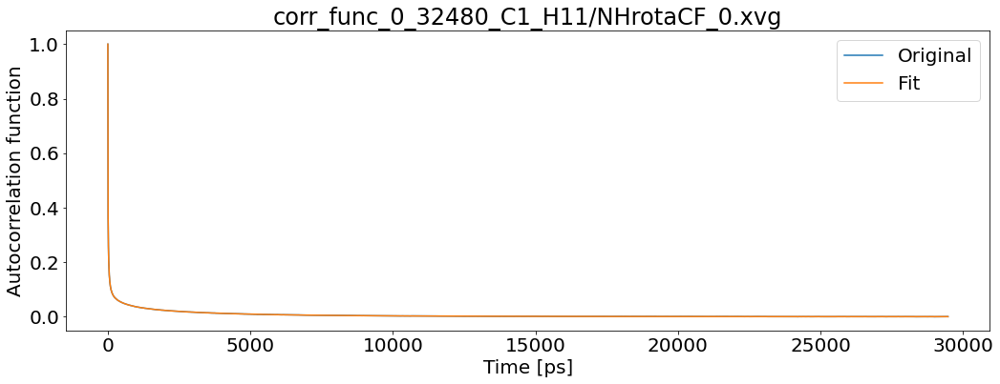

T1: 0.018157078470558703 T2: 0.01508136557712924 NOE: 0


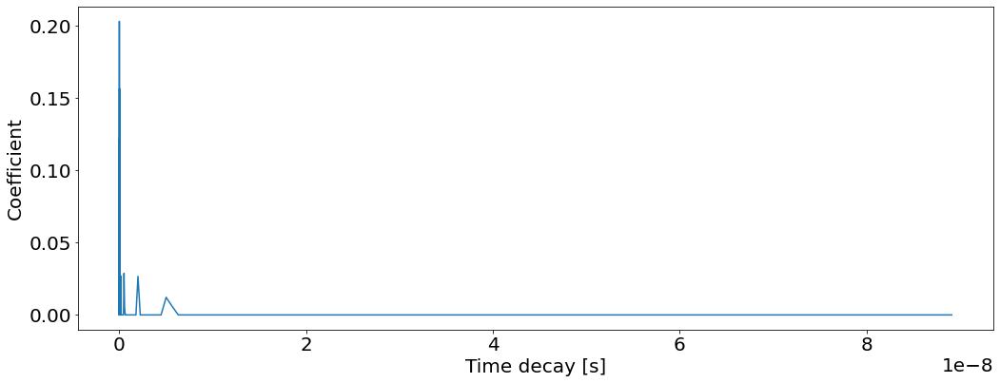

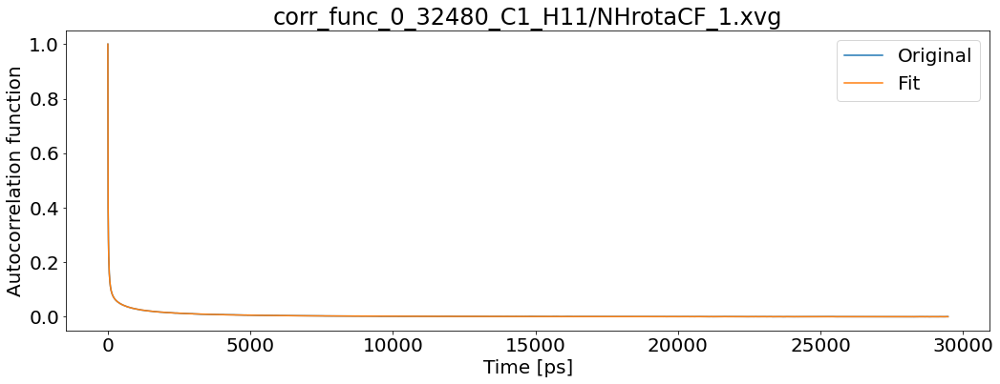

T1: 0.022605312551829446 T2: 0.019481458595531905 NOE: 0


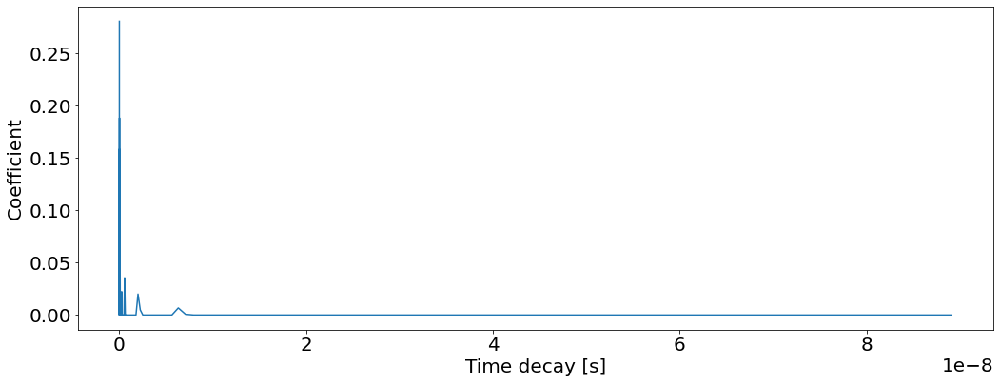

In [54]:
"""Execute the code - this part needs not be modified"""
#rt.initilize_output(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name,author_name)
if take_all_in_folder=="yes":
    for file in os.listdir(folder_path):
        input_corr_file = folder_path+os.fsdecode(file)
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
elif take_all_in_folder=="number":
    step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
    Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
    Ctimes = Ctimes * 0.001 * 10 ** (-9);
    Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
    Ctimes_to_save[:,0]=Ctimes
    for i in range(0,residues):
        input_corr_file = folder_path+input_prefix+str(i)+".xvg"
        AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
        Ctimes_to_save[:,i+1]=AA.Coeffs
else:
    rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
    
np.savetxt(output_name,Ctimes_to_save)

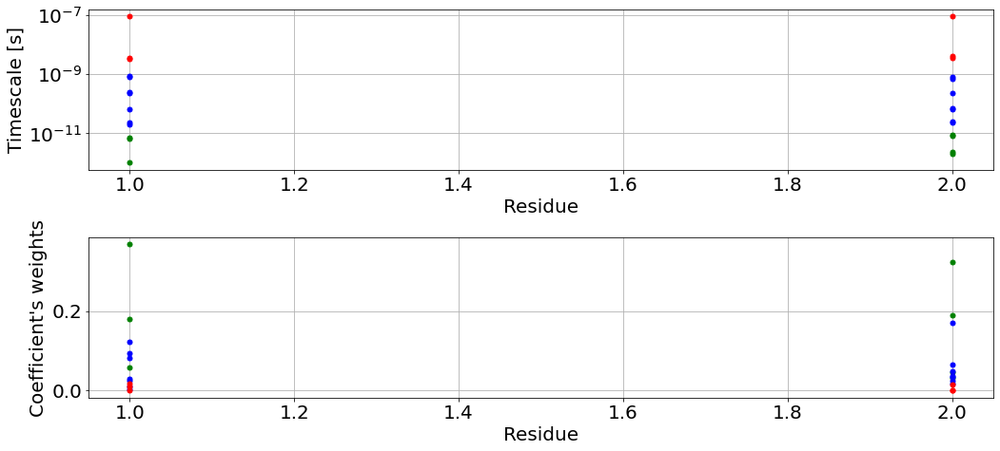

In [8]:
plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True

fig, (ax1, ax2) = plt.subplots(2)



ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Residue")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Residue")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show()    

In [9]:
"""Parameters to be specified by the user"""
OP=0 # order parameter
smallest_corr_time=0 # enter in log scale -3 fs; 0 ps; 3 ns; 6 us;
biggest_corr_time=5 # same as above
N_exp_to_fit=100 # number of exponential functions to be fitted between the samlles and biggest corr time
analyze=1/50 # the proportin of correlation data to be used for fitting, ex. 1/2 uses first half of the data
magnetic_field=2.35 # 5.99 # 8.49 T (values used in SDS paper, J.Chem. Soc.,, Faraday Trans. 1, 1988, 84(12), 4475-4486)
#magn_field=850
#magnetic_field=magn_field*2*np.pi/gammaH*10**6
nuclei="2H" #nuclei to calculate: 2H-deutherium; 13C - carbon; 15N - nitrogen 



##############3
## CHANGE IN THE CODE 6.4.2022, not going throught the whole content of the folder anymore
###############
take_all_in_folder="number" #"yes"/"no"/"number" analyze all in folder? useful for proteins, if no, fill the following line, if yes fill the folder path
input_corr_file="alphaCF.xvg"

input_prefix="NHrotaCF_" # mostly for peptides, works with take_all_in_folder="no"



## eElab 31.5.22
folder_path="/home/nenciric/Documents/git/CorysPeptides/figure1/water_correlation_functions/OPC/"
output_name="60SDS_micelle_SDS_relax_alpha.out"
residues=2


author_name="Ricky Nencini"




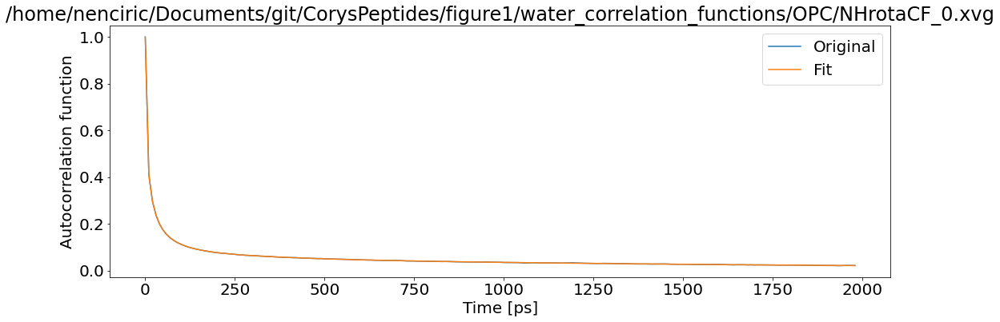

T1: 0.018862172103752264 T2: 0.01768723275803335 NOE: 0


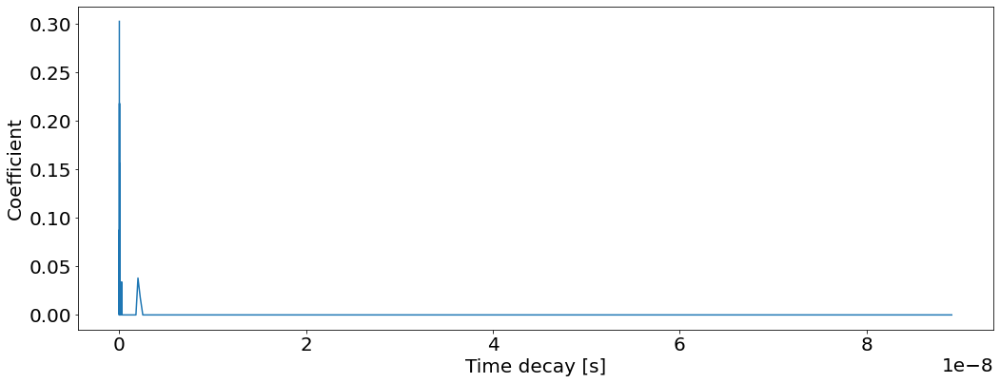

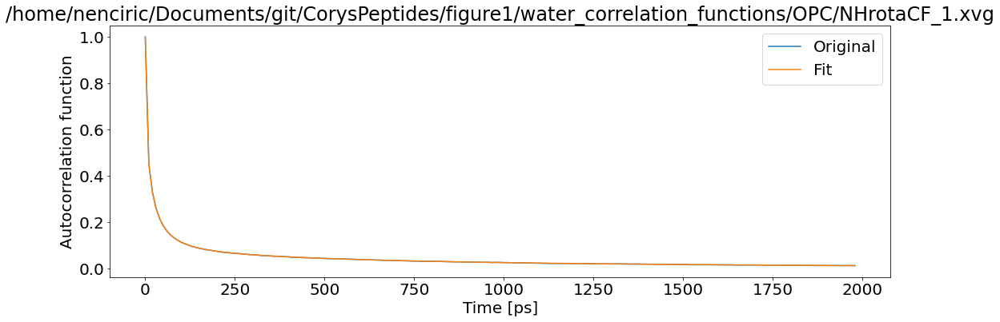

T1: 0.024312122146161606 T2: 0.023482040600615203 NOE: 0


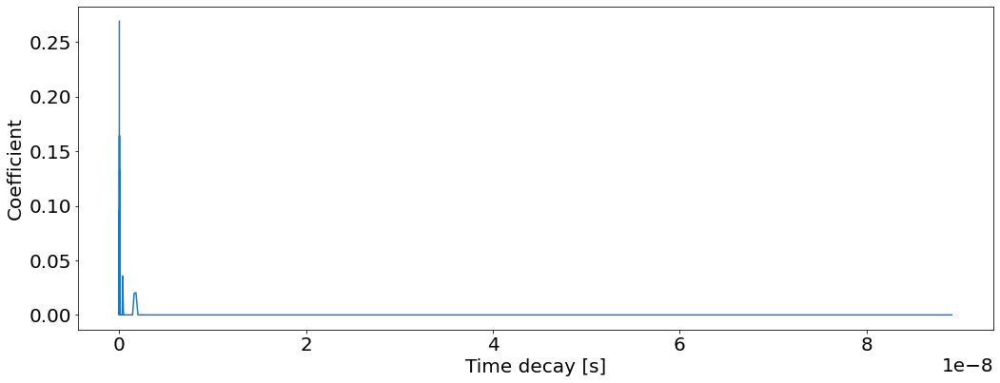

In [10]:
"""Execute the code - this part needs not be modified"""
#rt.initilize_output(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name,author_name)
if take_all_in_folder=="yes":
    for file in os.listdir(folder_path):
        input_corr_file = folder_path+os.fsdecode(file)
        rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
elif take_all_in_folder=="number":
    step_exp=(biggest_corr_time-smallest_corr_time)/N_exp_to_fit
    Ctimes = 10 ** np.arange(smallest_corr_time, biggest_corr_time, step_exp)
    Ctimes = Ctimes * 0.001 * 10 ** (-9);
    Ctimes_to_save=np.zeros([len(Ctimes),residues+1])
    Ctimes_to_save[:,0]=Ctimes
    for i in range(0,residues):
        input_corr_file = folder_path+input_prefix+str(i)+".xvg"
        AA=rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)
        Ctimes_to_save[:,i+1]=AA.Coeffs
else:
    rt.GetRelaxationData(OP,smallest_corr_time, biggest_corr_time, N_exp_to_fit,analyze,magnetic_field,input_corr_file,nuclei,output_name)

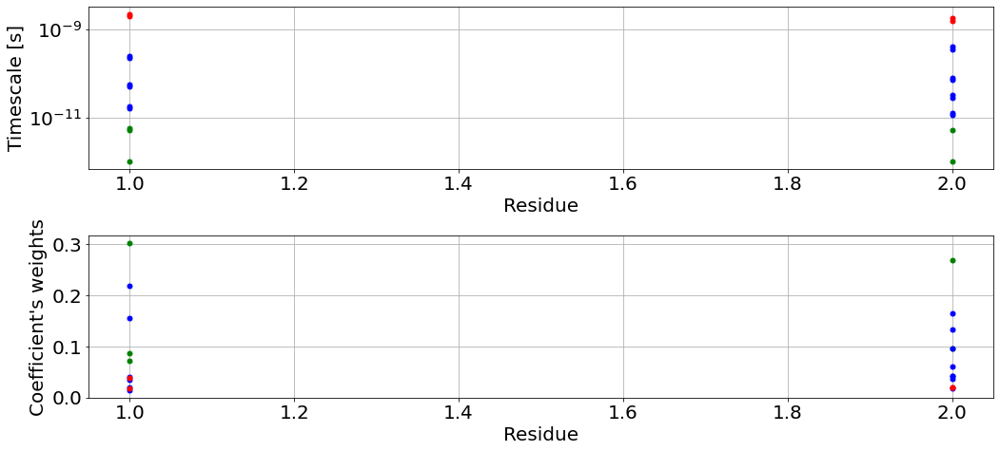

In [11]:
plt.rcParams["figure.figsize"] = [15.00, 7]
plt.rcParams["figure.autolayout"] = True

fig, (ax1, ax2) = plt.subplots(2)



ax1.grid()
ax1.set_yscale('log')
ax1.set_ylabel("Timescale [s]")
ax1.set_xlabel("Residue")
#ax1.set_ylim([10**(-12.4), 10**(-6.8)])


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax1.plot(residue, Ctimes_to_save[timescale,0], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                   
       
    

ax2.grid()

ax2.set_ylabel("Coefficient's weights")
ax2.set_xlabel("Residue")


for residue in range(1,Ctimes_to_save.shape[1]):
    for timescale in range(0,Ctimes_to_save.shape[0]):
        #print("{} {} \n".format(i, j))
        if Ctimes_to_save[timescale,residue]>0:
            if Ctimes_to_save[timescale,0]>10**(-9):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="red", markerfacecolor="red")
            elif Ctimes_to_save[timescale,0]>10**(-11):
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="blue", markerfacecolor="blue")
            else:
                ax2.plot(residue, Ctimes_to_save[timescale,residue], marker="o", markersize=5, markeredgecolor="green", markerfacecolor="green")
                     
        
plt.show()    

In [16]:
np.savetxt("50SDS_eYqjD_relax_coef.out",Ctimes_to_save)

In [17]:
pwd

'/home/local/nenciric/Documents/git/CorysPeptides/calculate_relax_from_SDS_proteins'